In [1]:
from SeversonDataset_preprocess import train_val_split, dataset_preprocessing_Predictor1
from SeversonDataset_preprocess import train_val_split_by_batch
from DimReduct_train import *
from Discharge_model import DimReduction_1, DimReduction_2, Predictor_1
from torch.utils.data import DataLoader
from Pytorch_dataset import DimReduction_dataset, Predictor1_dataset
import torch
from Predictor1_train import train_model as predictor1_train
from Predictor1_train import model_evaluate as predictor1_eval
import numpy as np
import matplotlib.pyplot as plt

c:\Users\smcmlab4\Anaconda3\envs\python39\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Old

DimReduct1 is training
First 100 cycles are being used
Feature shape: (9200, 4, 500)
Target shape: (9200, 2)
First 100 cycles are being used
Feature shape: (2300, 4, 500)
Target shape: (2300, 2)
cuda is available
Validation loss decreased (inf --> 152554.626698).  Saving model ...
Validation loss decreased (152554.626698 --> 110859.455673).  Saving model ...
Validation loss decreased (110859.455673 --> 100792.027683).  Saving model ...
Validation loss decreased (100792.027683 --> 63508.678244).  Saving model ...
Validation loss decreased (63508.678244 --> 51959.675442).  Saving model ...
EarlyStopping counter: 1 out of 50
EarlyStopping counter: 2 out of 50
EarlyStopping counter: 3 out of 50
EarlyStopping counter: 4 out of 50
Validation loss decreased (51959.675442 --> 44426.390646).  Saving model ...
EarlyStopping counter: 1 out of 50
EarlyStopping counter: 2 out of 50
EarlyStopping counter: 3 out of 50
Validation loss decreased (44426.390646 --> 27755.688307).  Saving model ...
EarlyS

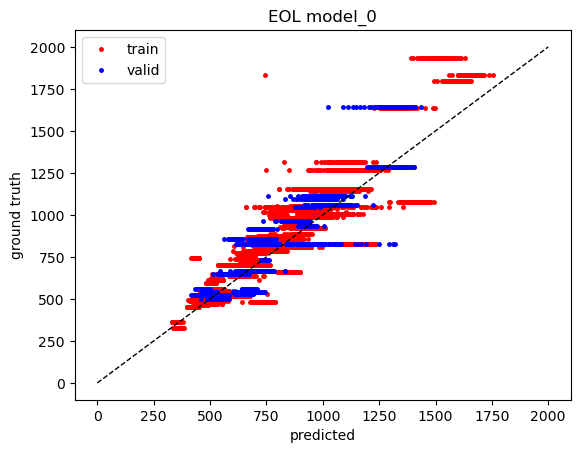

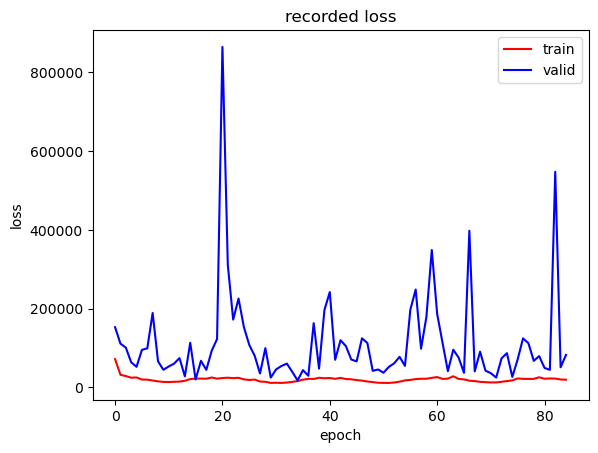

In [43]:
seed = 5
set_code = 'seed5_2'
train_val_split(train_ratio=0.8, seed=seed, set_code=set_code)

##########DimReduct1###########
print('DimReduct1 is training')
# load dataset
batch_size=50

eol_train_dataset = DimReduction_dataset(train=True, pred_target='EOL', norm=True, cycle_used=100, set_code=set_code)
eol_test_dataset = DimReduction_dataset(train=False, pred_target='EOL', norm=True, cycle_used=100, set_code=set_code)

eol_train_loader = DataLoader(eol_train_dataset, batch_size=batch_size, shuffle=True)
eol_test_loader = DataLoader(eol_test_dataset, batch_size=batch_size, shuffle=True)

# load model
model_eol = DimReduction_1(in_ch=4, out_ch=1).cuda()

dimreduct1_model, eol_train_loss, eol_valid_loss = dimreduct1_train(model_eol, eol_train_loader, eol_test_loader,
                                                                    patience=50,
                                                                    lr=2*1e-2,
                                                                    cosine_period=10,
                                                                    min_lr=1.6e-6,
                                                                    weight_decay=8*1e-2,
                                                                    state_dict_path=set_code)

dimreduct1_file = 'Model/dimreduct1_'+set_code+'.pth'
torch.save(dimreduct1_model, dimreduct1_file)
print('Dimreduct1 saved path: '+dimreduct1_file)
print('DimReduct1 training is done.')

dimreduct1_eval(model_eol, set_code=set_code)

loss_plot(eol_train_loss, eol_valid_loss)
##########DimReduct1###########

cuda is available
First 100 cycles are being used
Feature shape: (9200, 4, 500)
Target shape: (9200, 2)
First 100 cycles are being used
Feature shape: (2300, 4, 500)
Target shape: (2300, 2)
Training set|RMSE: 120.28, MAPE: 0.13
Testing set|RMSE: 199.43, MAPE: 0.18


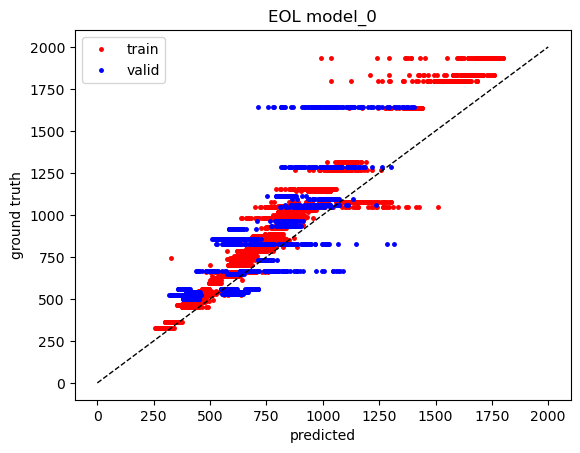

In [42]:
dimreduct1_eval(torch.load('F:\KuoPing\Severson_data\Re-preprocess\State_dict_dimreduct1\seed5\epoch50'), set_code=set_code)

DimReduct2 is training
First 100 cycles are being used
Feature shape: (9200, 4, 500)
Target shape: (9200, 2)
First 100 cycles are being used
Feature shape: (2300, 4, 500)
Target shape: (2300, 2)
cuda is available
Validation loss decreased (inf --> 4.154501).  Saving model ...
Validation loss decreased (4.154501 --> 3.239837).  Saving model ...
Validation loss decreased (3.239837 --> 2.956896).  Saving model ...
Validation loss decreased (2.956896 --> 2.593961).  Saving model ...
Validation loss decreased (2.593961 --> 2.504231).  Saving model ...
Validation loss decreased (2.504231 --> 2.409104).  Saving model ...
Validation loss decreased (2.409104 --> 2.384672).  Saving model ...
EarlyStopping counter: 1 out of 50
Validation loss decreased (2.384672 --> 2.288336).  Saving model ...
EarlyStopping counter: 1 out of 50
EarlyStopping counter: 2 out of 50
Validation loss decreased (2.288336 --> 2.280895).  Saving model ...
EarlyStopping counter: 1 out of 50
EarlyStopping counter: 2 out of

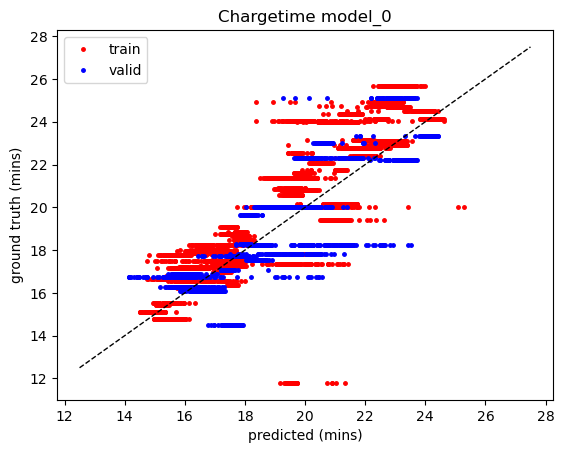

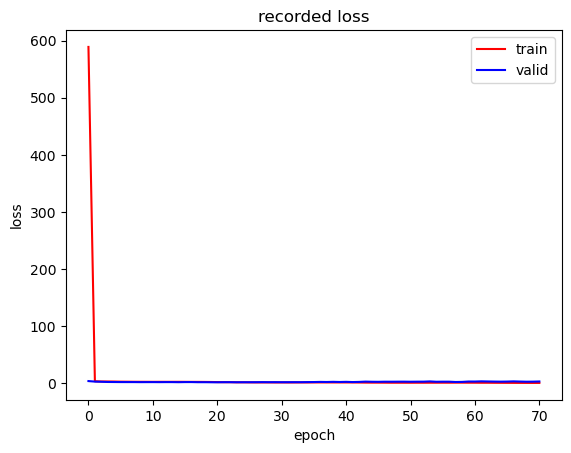

In [62]:
##########DimReduct2###########
set_code = 'seed5_2'

print('DimReduct2 is training')
# load dataset
batch_size=50

ct_train_dataset = DimReduction_dataset(train=True, pred_target='chargetime', norm=True, cycle_used=100, set_code=set_code)
ct_test_dataset = DimReduction_dataset(train=False, pred_target='chargetime', norm=True, cycle_used=100, set_code=set_code)

ct_train_loader = DataLoader(ct_train_dataset, batch_size=batch_size, shuffle=True)
ct_test_loader = DataLoader(ct_test_dataset, batch_size=batch_size, shuffle=True)

# load model
model_ct = DimReduction_2(in_ch=4, out_ch=1).cuda()

dimreduct2_model, ct_train_loss, ct_valid_loss = dimreduct2_train(model_ct, ct_train_loader, ct_test_loader, 
                                                                    patience=50,
                                                                    lr=2e-2,
                                                                    cosine_period=10,
                                                                    min_lr=1.6e-6,
                                                                    weight_decay=3*1e-5,
                                                                    state_dict_path=set_code)

dimreduct2_file = 'Model/dimreduct2_'+set_code+'.pth'
torch.save(dimreduct2_model, dimreduct2_file)
print('Dimreduct2 saved path: '+dimreduct2_file)
print('DimReduct2 training is done.')

dimreduct2_eval(model_ct, set_code=set_code)

loss_plot(ct_train_loss, ct_valid_loss)
##########DimReduct2###########

In [63]:
# dimreduct1_path = 
# dimreduct2_path = 
set_code = 'seed5_2'
##########Predictor1###########
dataset_preprocessing_Predictor1(cycle_used=100,
                                    dimreduct1_path='Model/dimreduct1_seed5_2.pth',
                                    dimreduct2_path='Model/dimreduct2_seed5.pth',
                                    set_code=set_code,
                                    file_tag='')
# load dataset
train_dataset = Predictor1_dataset(train=True, norm=True, eval=False, padding=True, set_code=set_code, file_tag='')
test_dataset = Predictor1_dataset(train=False, norm=True, eval=False, padding=True, set_code=set_code, file_tag='')

train_loader = DataLoader(train_dataset, batch_size=200, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=23, shuffle=True)

# load model
model = Predictor_1(in_ch=8, out_ch=1, drop=0.23).cuda()

model, train_loss, valid_loss = predictor1_train(model, train_loader, test_loader,
                                                    patience=50,
                                                    lr=0.019221755944636307,
                                                    cosine_period=13,
                                                    min_lr=1.589525716835063e-06,
                                                    weight_decay=0.00047037615692289335,
                                                    loss_func='MSE',
                                                    state_dict_path=set_code)

predictor1_file = 'Model/predictor1_'+set_code+'.pth'
torch.save(model, predictor1_file)
print('Predictor1 saved path: '+predictor1_file)
print('Predictor1 training is done.')
##########Predictor1###########

First 100 cycles are being used
Feature shape: (9200, 4, 500)
Target shape: (9200, 2)
First 100 cycles are being used
Feature shape: (2300, 4, 500)
Target shape: (2300, 2)
First 100 cycles are being used
Feature shape: (9200, 4, 500)
Target shape: (9200, 2)
First 100 cycles are being used
Feature shape: (2300, 4, 500)
Target shape: (2300, 2)
EOL RMSE of all data: 0.14489497
CT RMSE of all data: 1.396449
(92, 8, 100) (92, 2)
(23, 8, 100) (23, 2)
cuda is available
[Epoch 1/500] train_loss: 120340.912, valid_loss: 514990.442
....train_rmse: 410.80, valid_rmse: 713.27
Validation loss decreased (inf --> 514990.441719).  Saving model ...
[Epoch 2/500] train_loss: 4608.954, valid_loss: 134786.990
....train_rmse: 252.66, valid_rmse: 538.28
Validation loss decreased (514990.441719 --> 134786.989766).  Saving model ...
[Epoch 3/500] train_loss: 3573.330, valid_loss: 71230.161
....train_rmse: 196.06, valid_rmse: 447.12
Validation loss decreased (134786.989766 --> 71230.160586).  Saving model ...


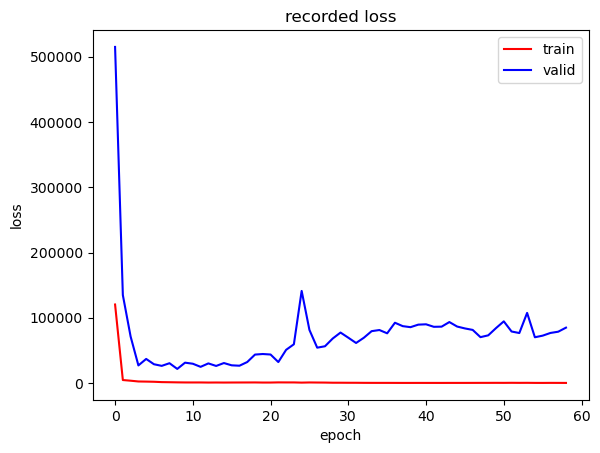

In [64]:
loss_plot(train_loss, valid_loss)

Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Training set|RMSE: 31.20, MAPE: 0.03
Testing set|RMSE: 142.20, MAPE: 0.13


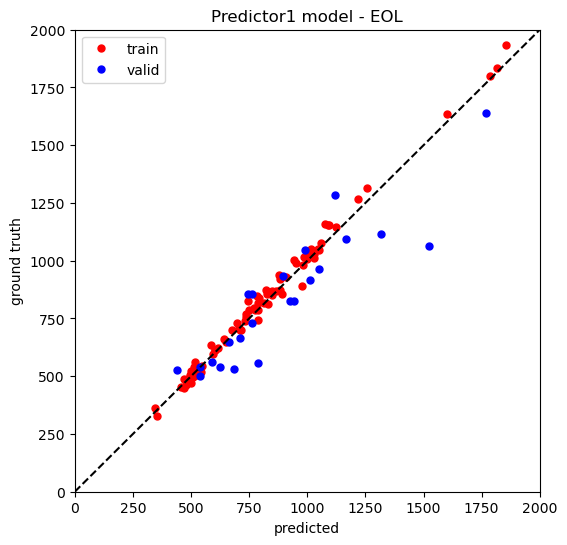

(31.19775390625, 142.2020263671875)

In [65]:
predictor1_eval(torch.load('Model/predictor1_seed5_2.pth'), cycle_used=100, set_code='seed5_2')

First 1 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Training set|RMSE: 135.89, MAPE: 0.08
Testing set|RMSE: 258.03, MAPE: 0.16


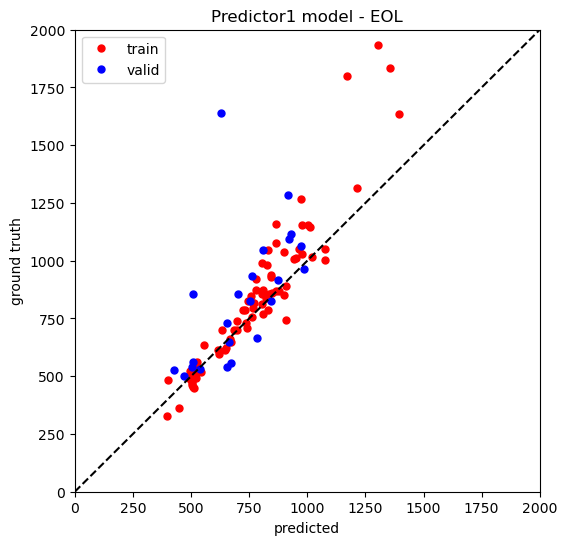

Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Training set|RMSE: 1.34, MAPE: 0.04
Testing set|RMSE: 1.64, MAPE: 0.07


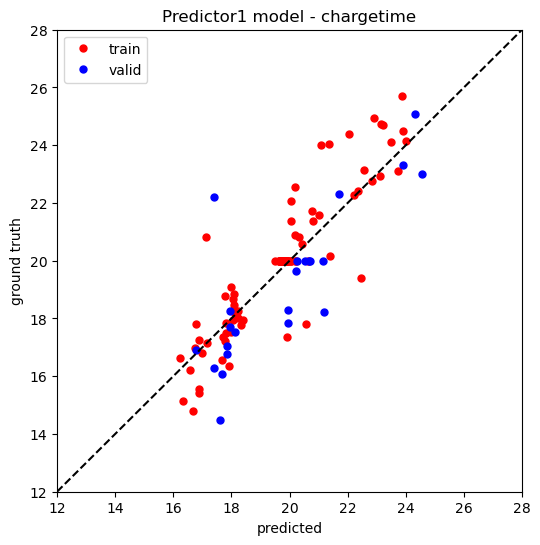

First 2 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Training set|RMSE: 106.09, MAPE: 0.07
Testing set|RMSE: 259.47, MAPE: 0.16


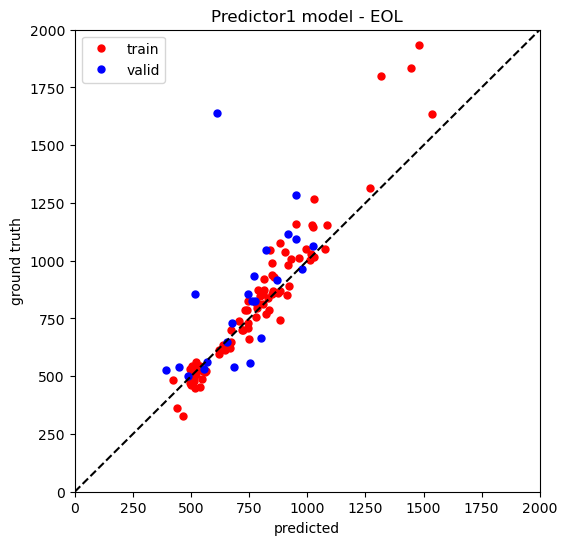

Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Training set|RMSE: 1.28, MAPE: 0.04
Testing set|RMSE: 1.63, MAPE: 0.06


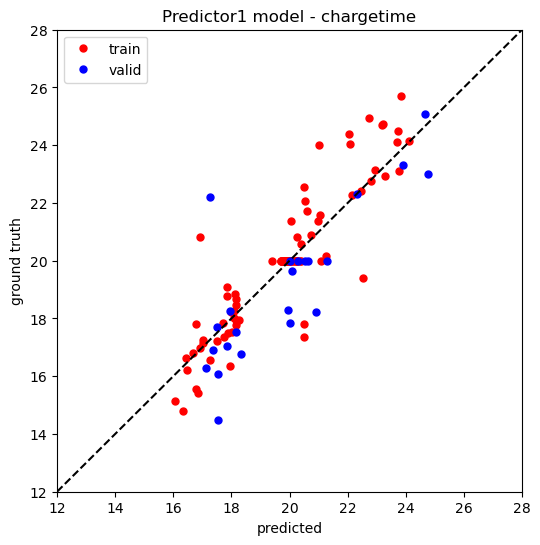

First 3 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Training set|RMSE: 80.42, MAPE: 0.06
Testing set|RMSE: 234.96, MAPE: 0.14


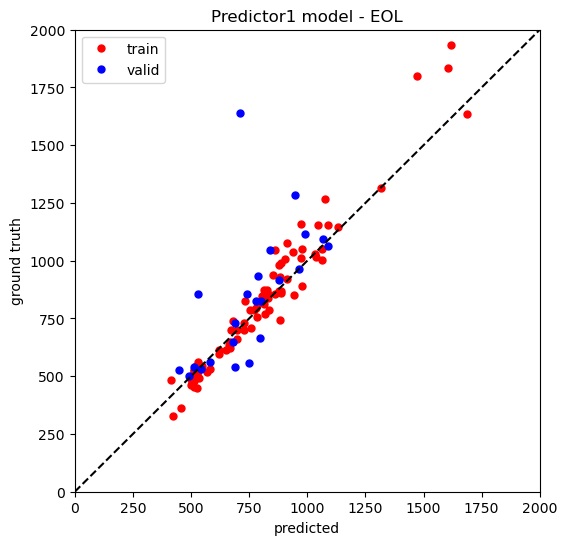

Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.69, MAPE: 0.07


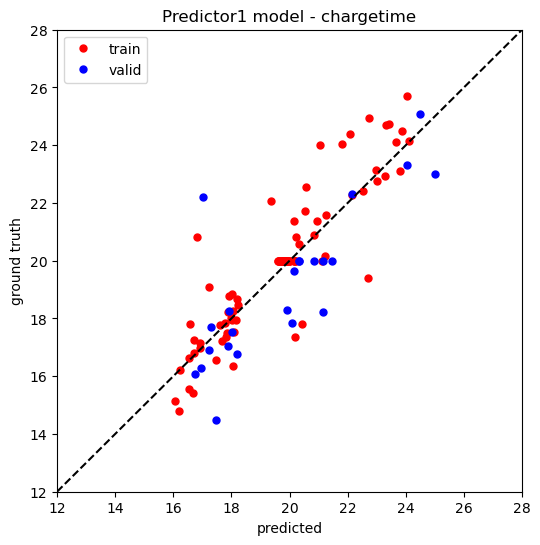

First 4 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Training set|RMSE: 74.91, MAPE: 0.06
Testing set|RMSE: 232.72, MAPE: 0.15


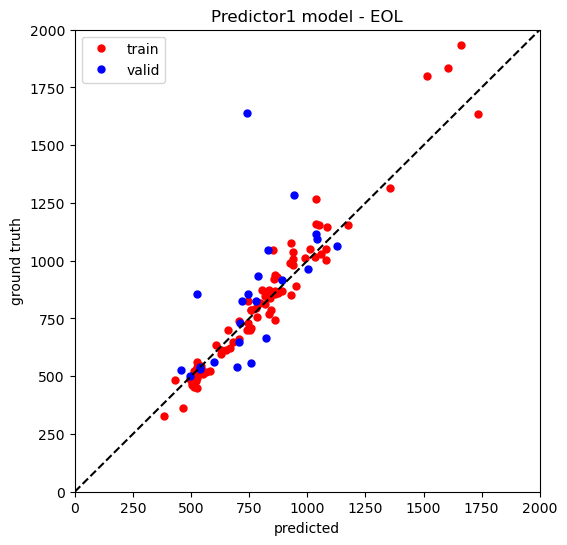

Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.68, MAPE: 0.07


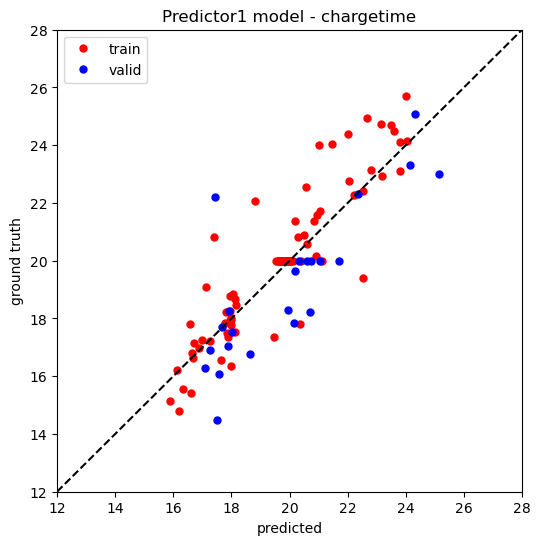

First 5 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Training set|RMSE: 77.70, MAPE: 0.07
Testing set|RMSE: 217.95, MAPE: 0.15


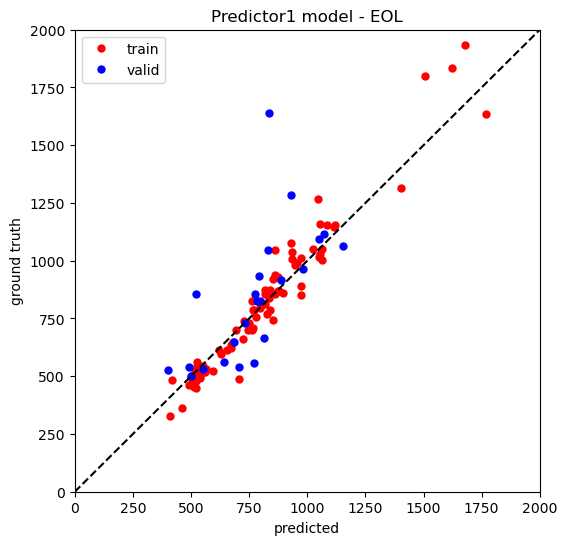

Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


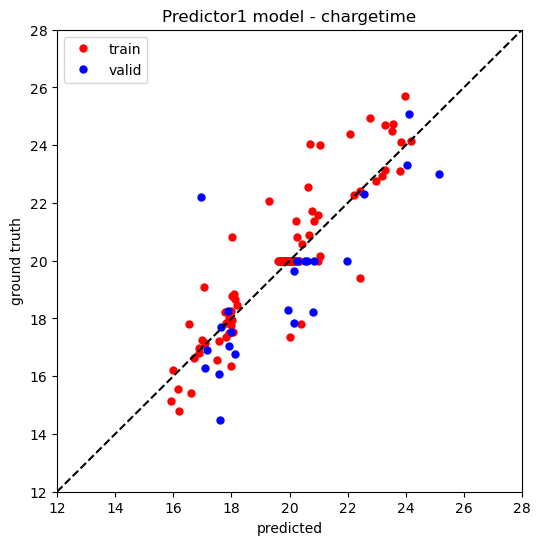

First 6 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Training set|RMSE: 66.21, MAPE: 0.06
Testing set|RMSE: 210.35, MAPE: 0.14


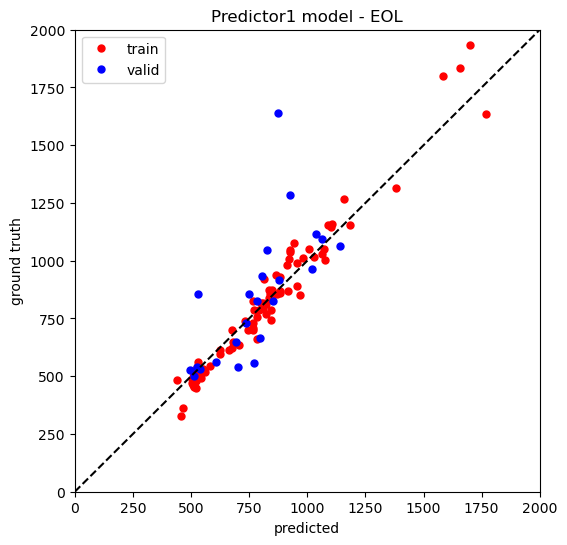

Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


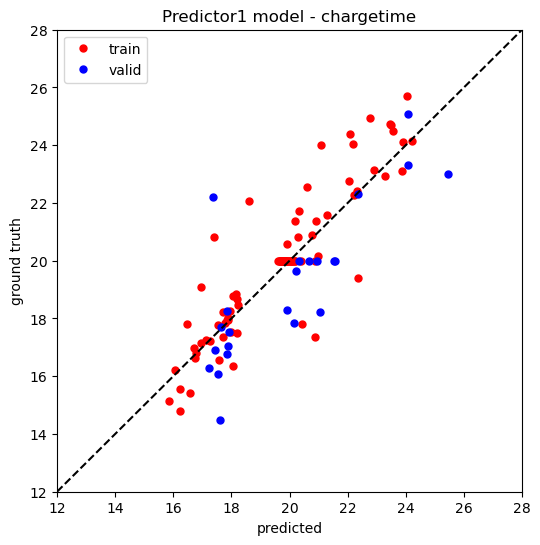

First 7 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Training set|RMSE: 61.62, MAPE: 0.06
Testing set|RMSE: 209.06, MAPE: 0.13


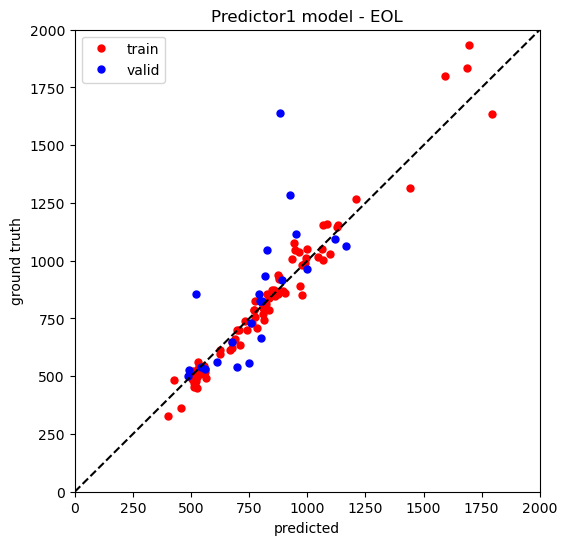

Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.78, MAPE: 0.07


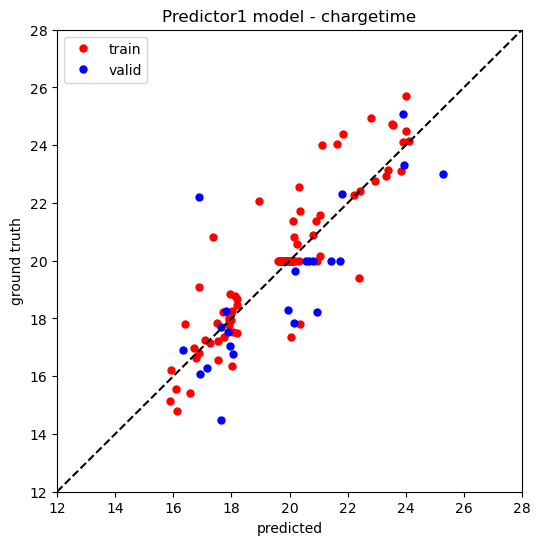

First 8 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Training set|RMSE: 62.46, MAPE: 0.06
Testing set|RMSE: 221.70, MAPE: 0.15


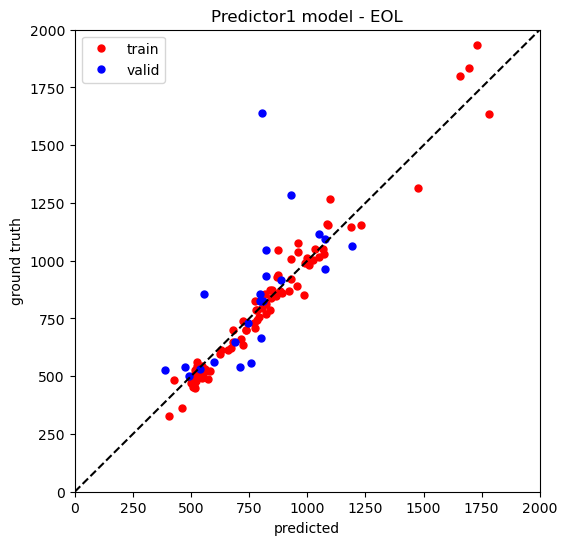

Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.64, MAPE: 0.07


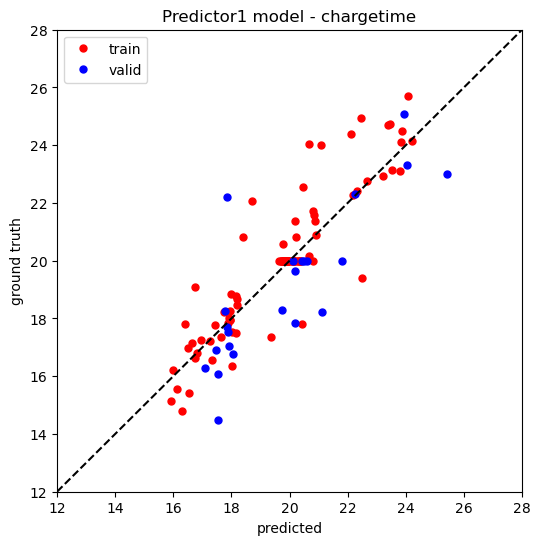

First 9 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Training set|RMSE: 70.80, MAPE: 0.06
Testing set|RMSE: 208.94, MAPE: 0.13


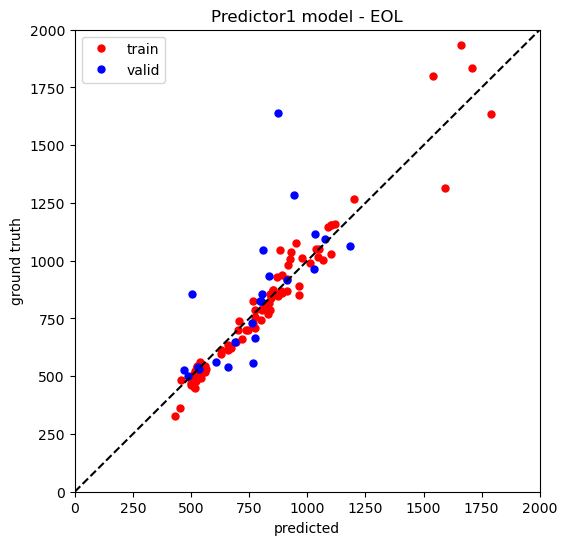

Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.77, MAPE: 0.07


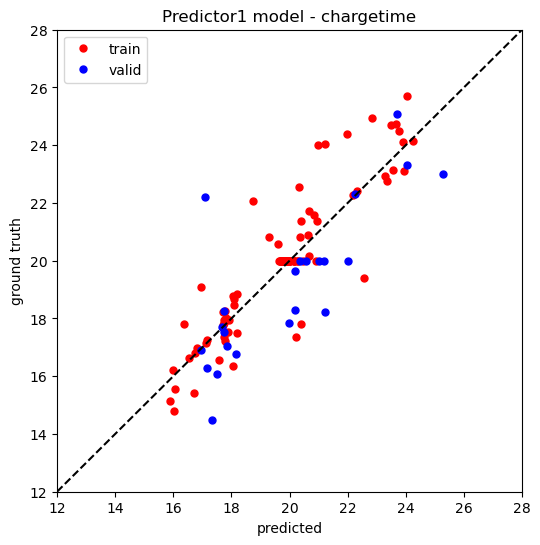

First 10 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Training set|RMSE: 75.59, MAPE: 0.06
Testing set|RMSE: 249.31, MAPE: 0.15


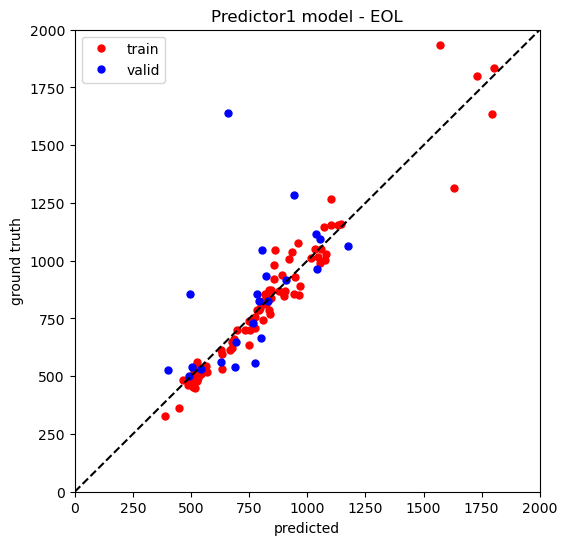

Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Training set|RMSE: 1.26, MAPE: 0.04
Testing set|RMSE: 1.77, MAPE: 0.07


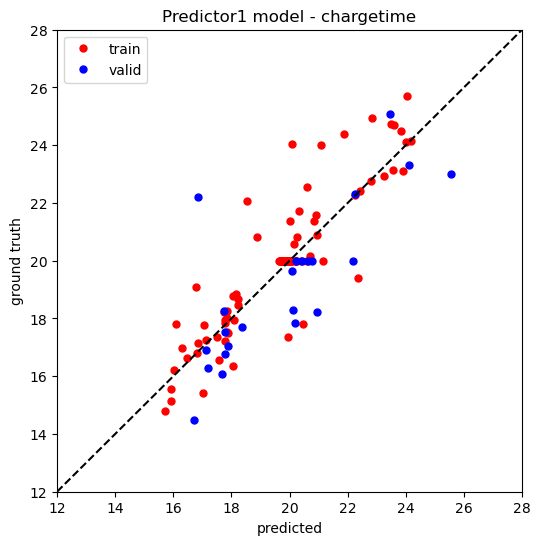

First 11 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Training set|RMSE: 64.48, MAPE: 0.05
Testing set|RMSE: 216.23, MAPE: 0.15


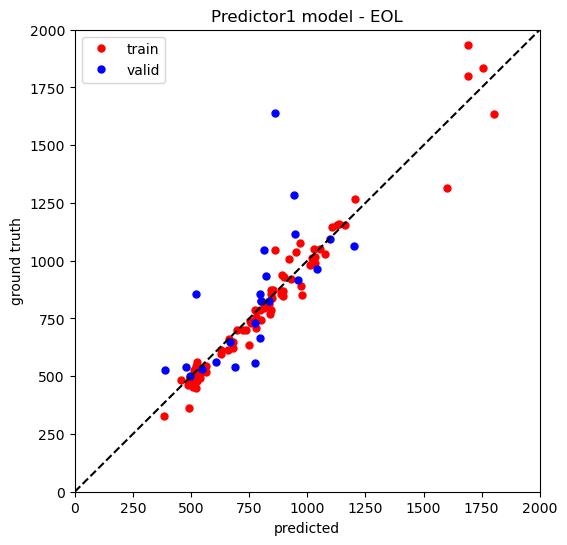

Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Training set|RMSE: 1.15, MAPE: 0.04
Testing set|RMSE: 1.69, MAPE: 0.06


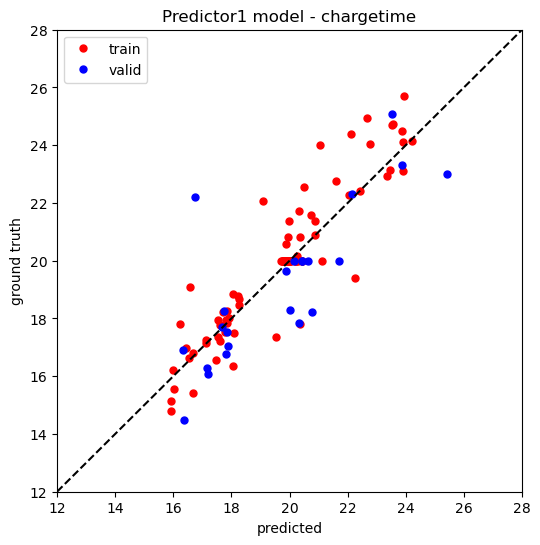

First 12 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Training set|RMSE: 62.89, MAPE: 0.06
Testing set|RMSE: 208.19, MAPE: 0.15


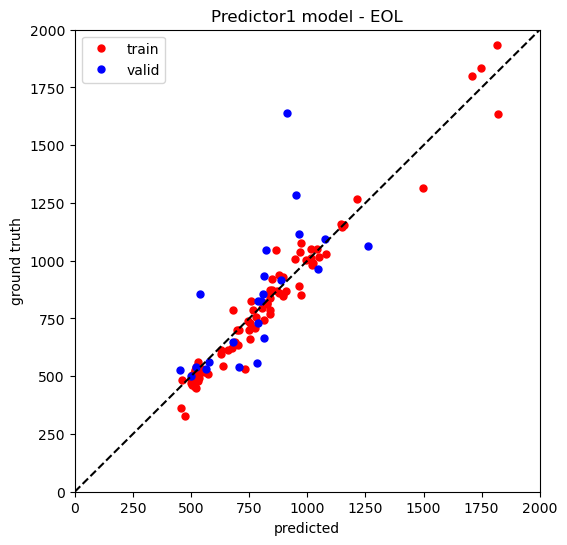

Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


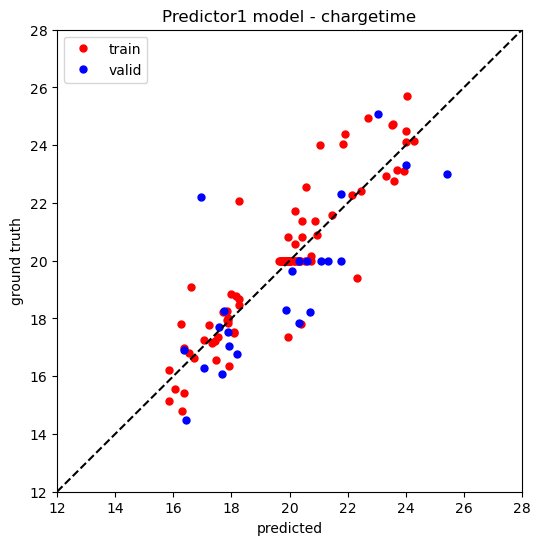

First 13 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Training set|RMSE: 65.07, MAPE: 0.06
Testing set|RMSE: 202.03, MAPE: 0.14


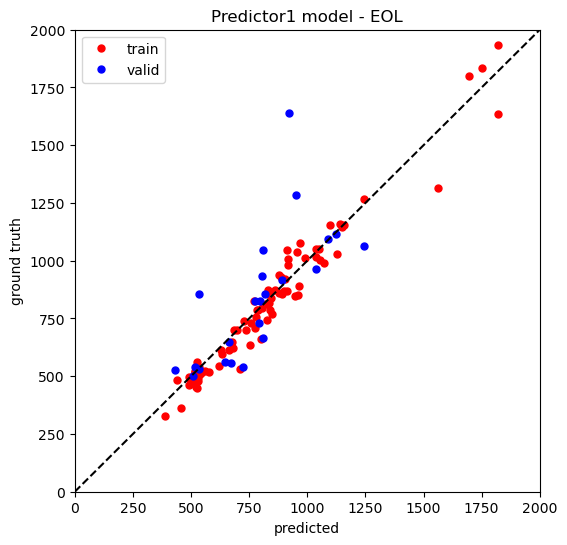

Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Training set|RMSE: 1.27, MAPE: 0.04
Testing set|RMSE: 1.80, MAPE: 0.07


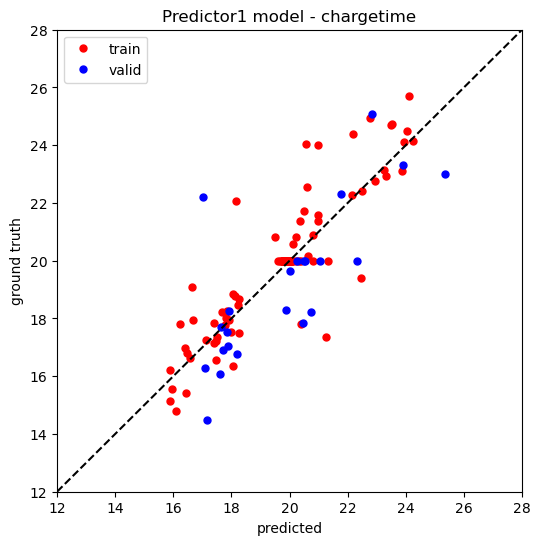

First 14 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Training set|RMSE: 61.51, MAPE: 0.06
Testing set|RMSE: 191.50, MAPE: 0.15


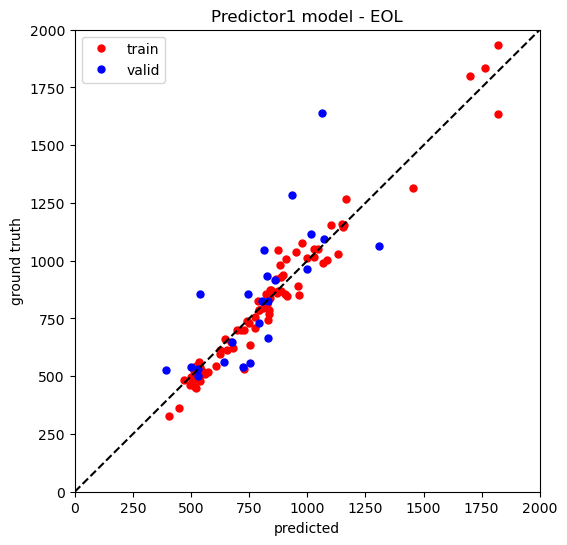

Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


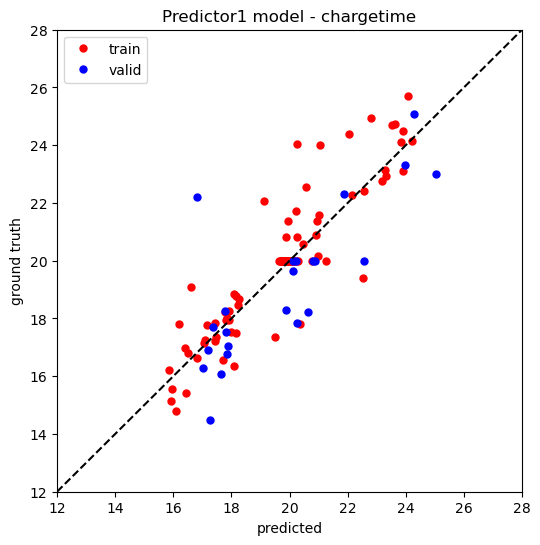

First 15 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Training set|RMSE: 66.17, MAPE: 0.06
Testing set|RMSE: 173.16, MAPE: 0.14


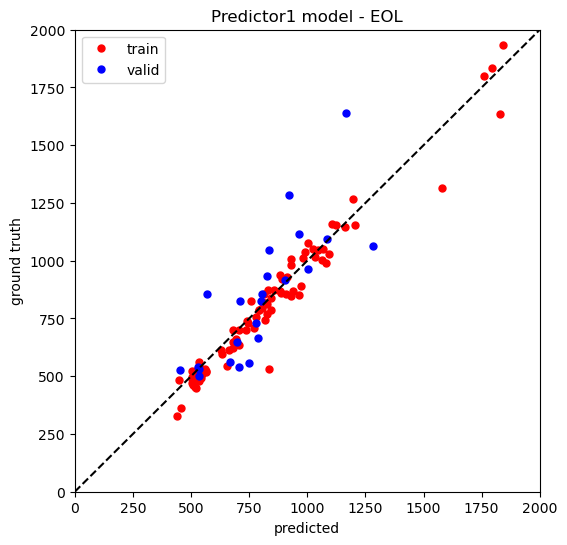

Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.82, MAPE: 0.08


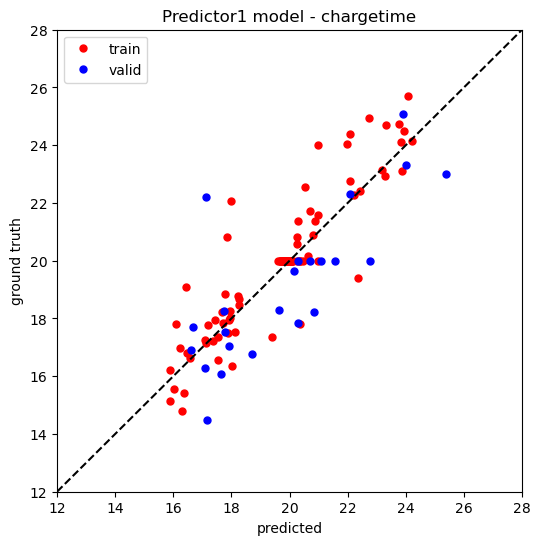

First 16 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Training set|RMSE: 64.29, MAPE: 0.06
Testing set|RMSE: 172.48, MAPE: 0.14


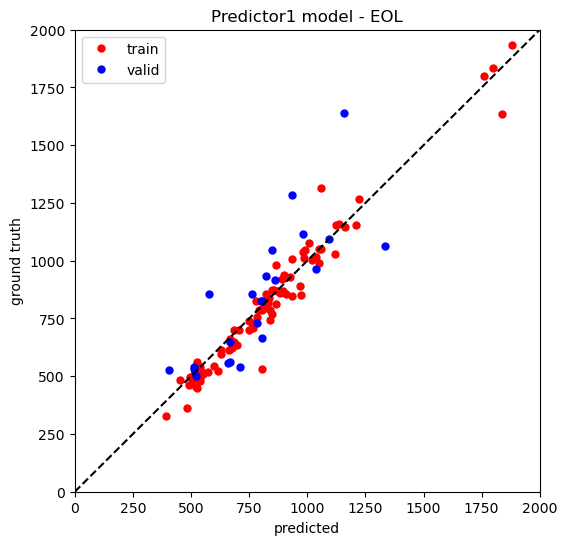

Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Training set|RMSE: 1.27, MAPE: 0.04
Testing set|RMSE: 1.64, MAPE: 0.07


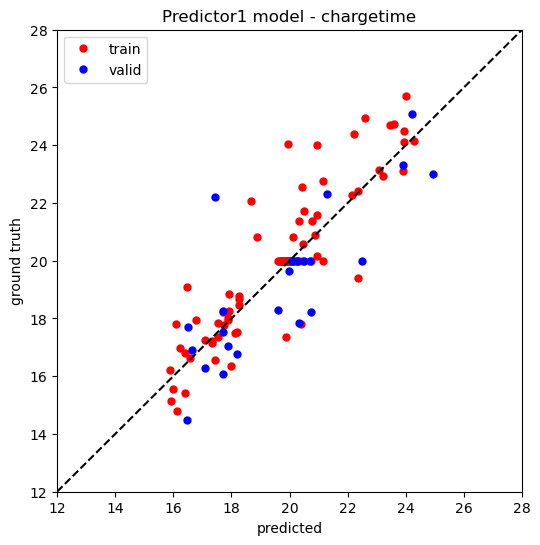

First 17 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Training set|RMSE: 64.07, MAPE: 0.06
Testing set|RMSE: 161.20, MAPE: 0.14


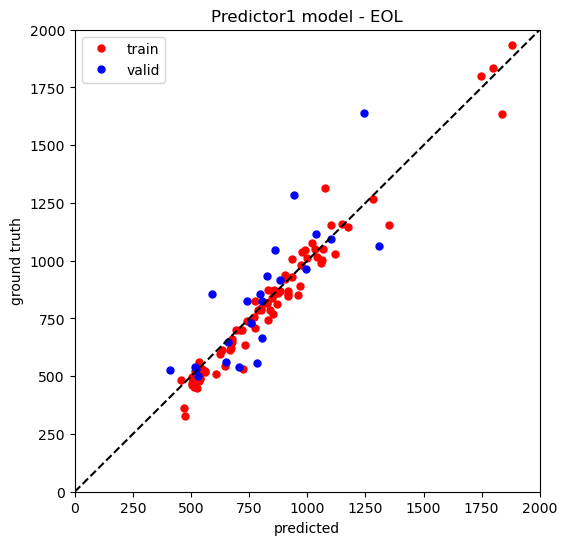

Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.72, MAPE: 0.07


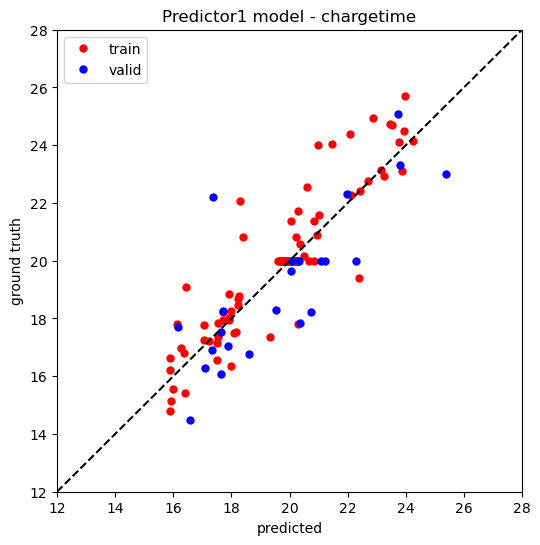

First 18 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Training set|RMSE: 57.21, MAPE: 0.06
Testing set|RMSE: 166.46, MAPE: 0.13


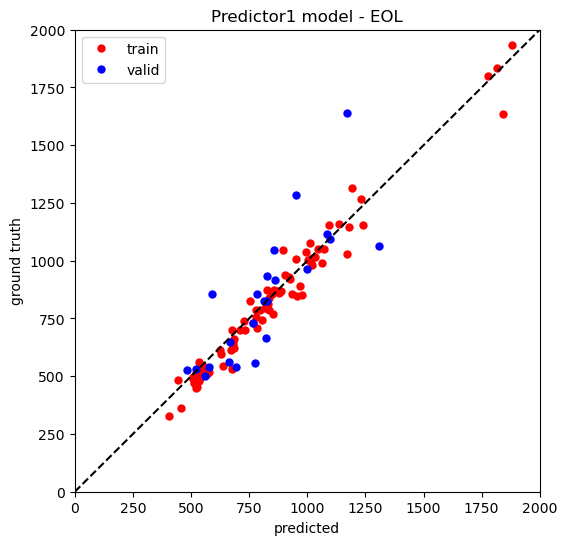

Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


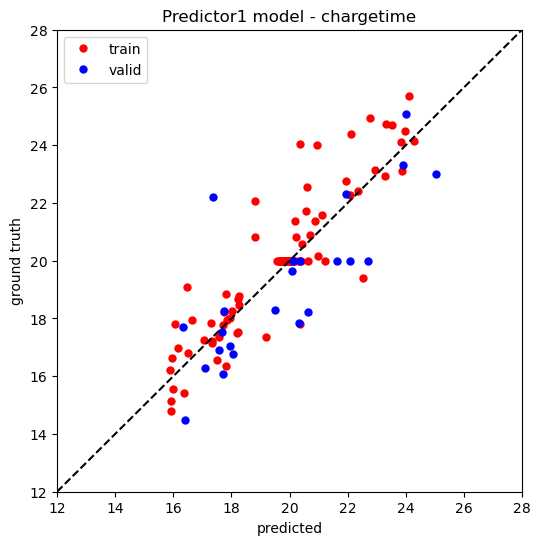

First 19 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Training set|RMSE: 53.29, MAPE: 0.06
Testing set|RMSE: 161.18, MAPE: 0.14


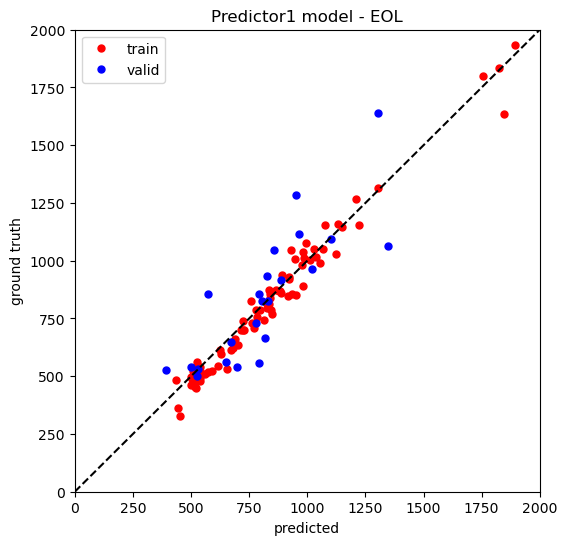

Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


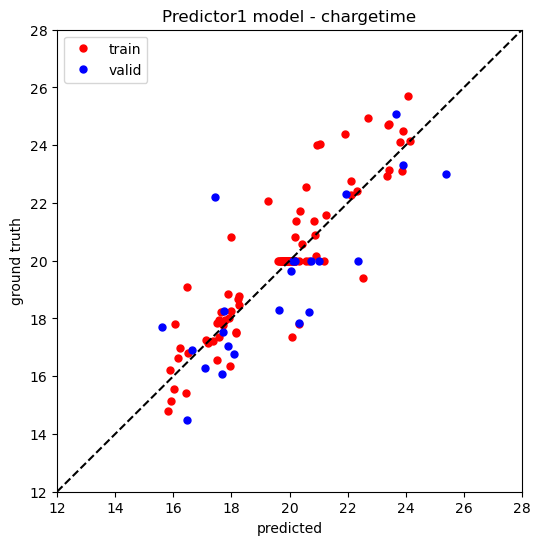

First 20 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Training set|RMSE: 56.49, MAPE: 0.06
Testing set|RMSE: 151.49, MAPE: 0.13


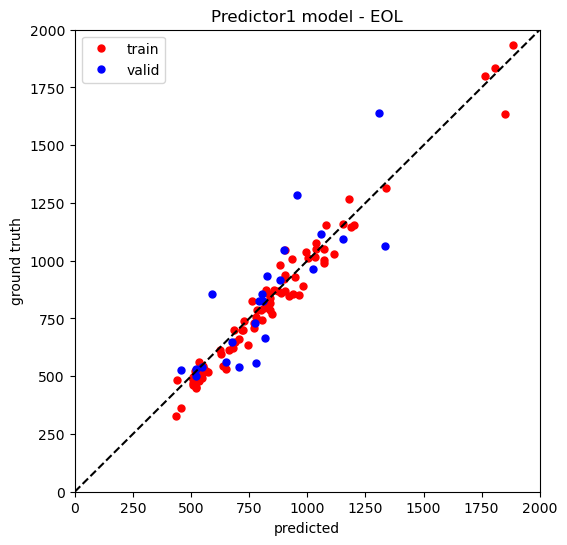

Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Training set|RMSE: 1.28, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


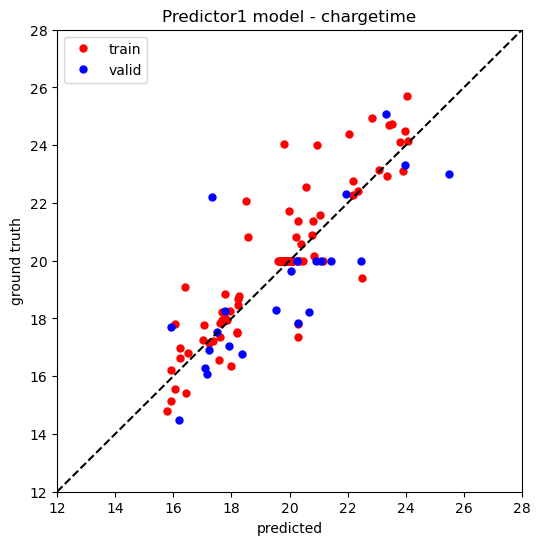

First 21 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Training set|RMSE: 55.51, MAPE: 0.06
Testing set|RMSE: 174.58, MAPE: 0.13


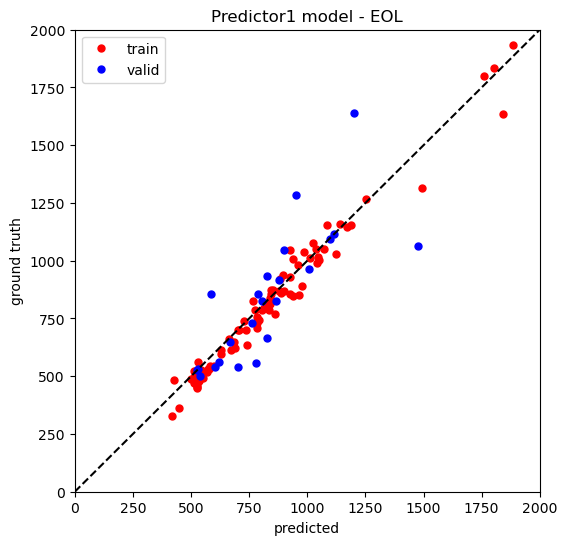

Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


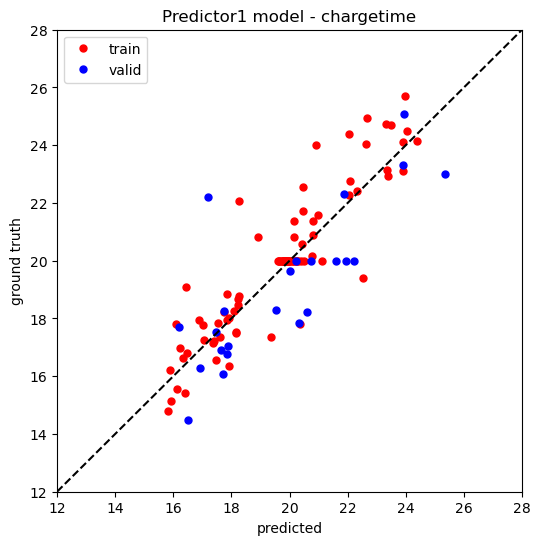

First 22 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Training set|RMSE: 62.12, MAPE: 0.06
Testing set|RMSE: 156.80, MAPE: 0.14


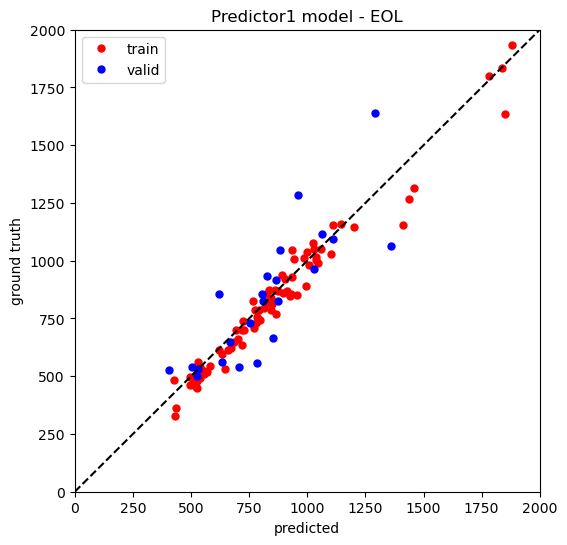

Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.63, MAPE: 0.07


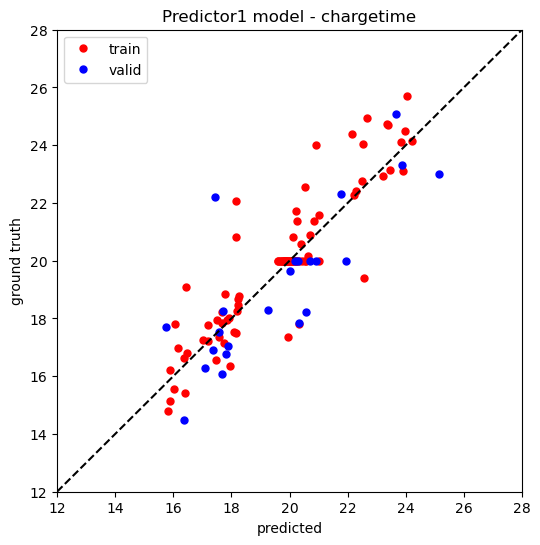

First 23 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Training set|RMSE: 53.86, MAPE: 0.06
Testing set|RMSE: 161.65, MAPE: 0.13


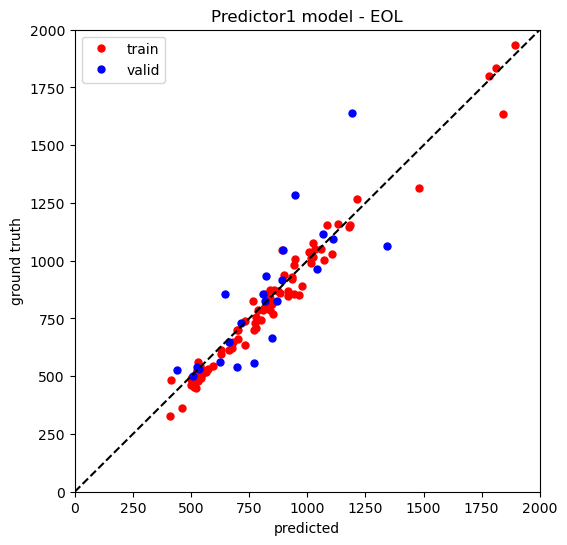

Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Training set|RMSE: 1.28, MAPE: 0.04
Testing set|RMSE: 1.71, MAPE: 0.07


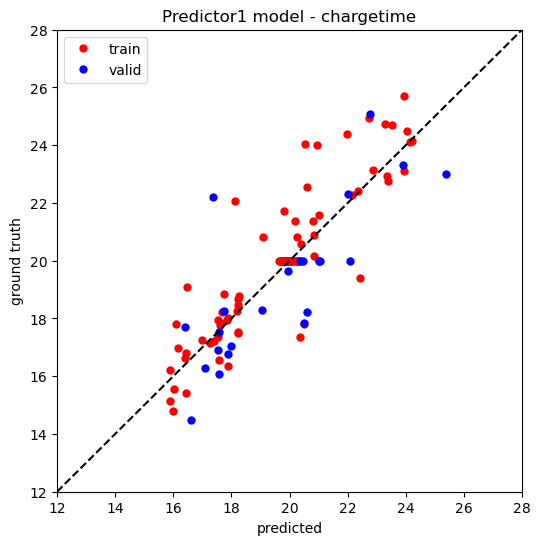

First 24 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Training set|RMSE: 53.71, MAPE: 0.05
Testing set|RMSE: 181.31, MAPE: 0.13


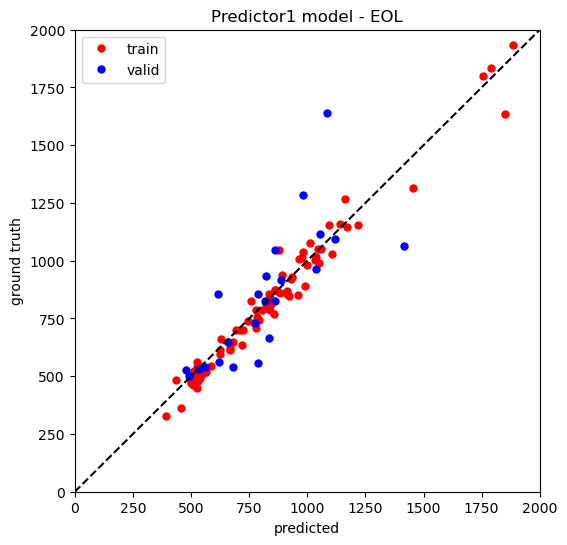

Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.64, MAPE: 0.07


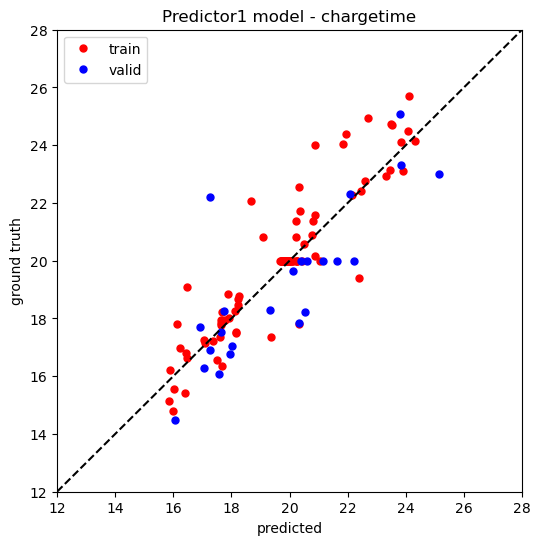

First 25 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Training set|RMSE: 54.68, MAPE: 0.05
Testing set|RMSE: 190.55, MAPE: 0.14


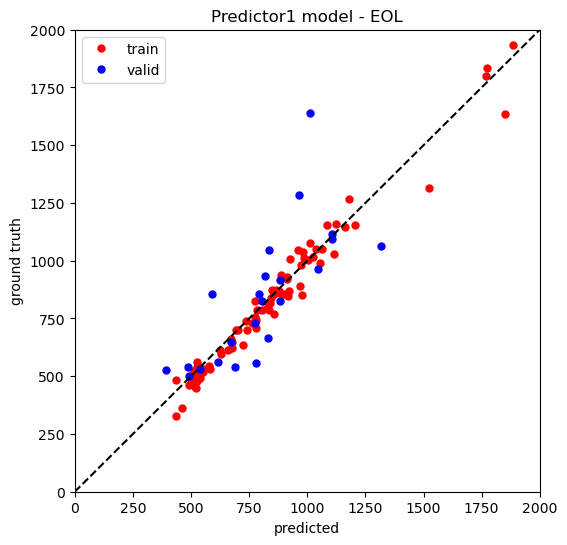

Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.62, MAPE: 0.06


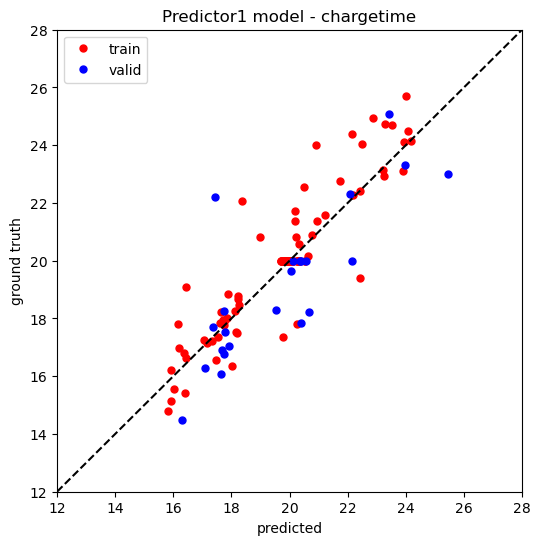

First 26 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Training set|RMSE: 59.25, MAPE: 0.06
Testing set|RMSE: 185.96, MAPE: 0.14


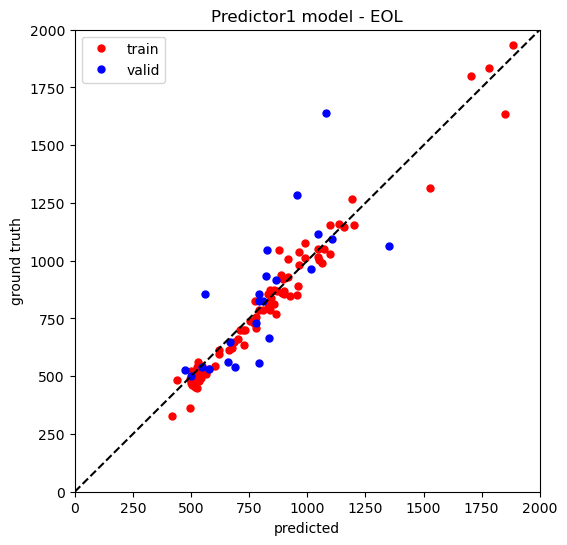

Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.64, MAPE: 0.07


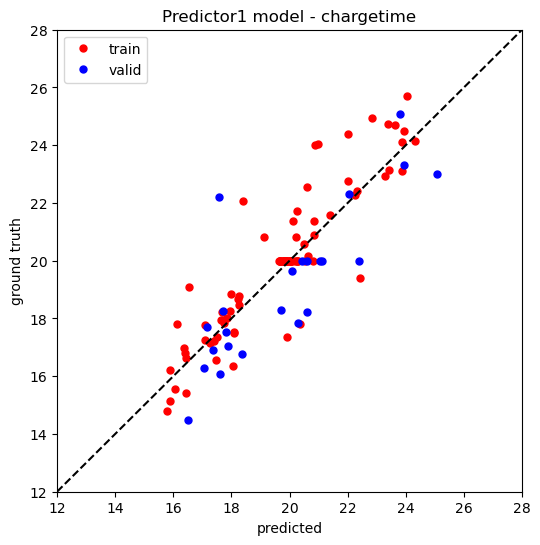

First 27 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Training set|RMSE: 64.45, MAPE: 0.06
Testing set|RMSE: 184.36, MAPE: 0.14


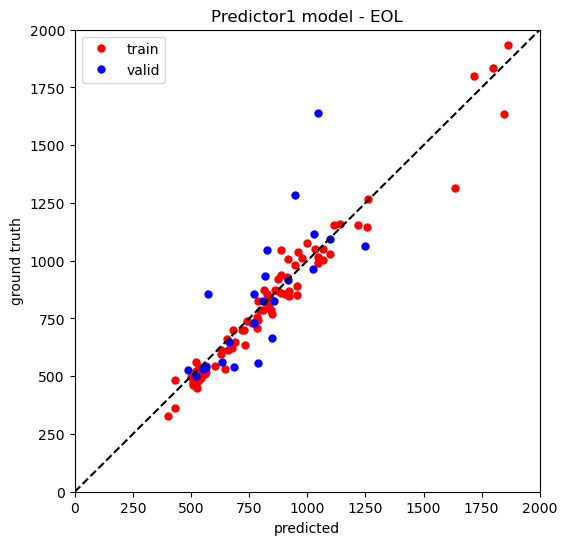

Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Training set|RMSE: 1.26, MAPE: 0.04
Testing set|RMSE: 1.67, MAPE: 0.07


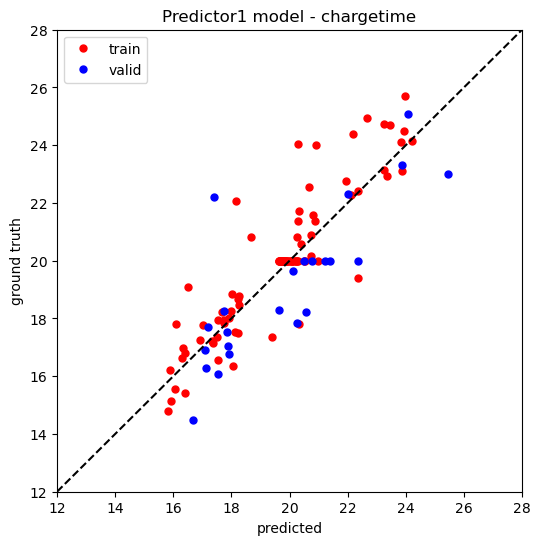

First 28 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Training set|RMSE: 55.85, MAPE: 0.05
Testing set|RMSE: 154.48, MAPE: 0.13


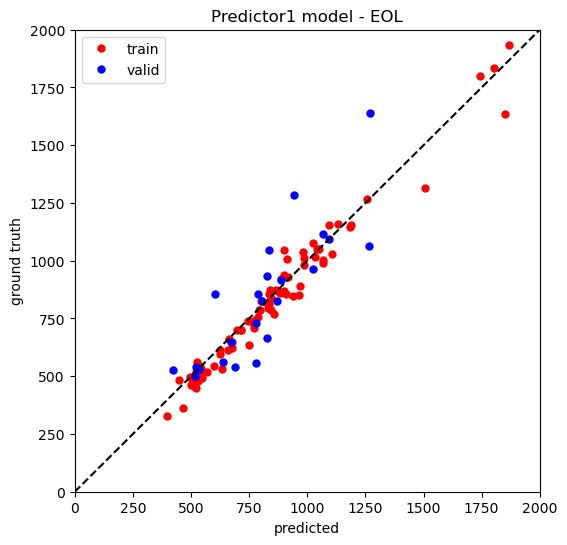

Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


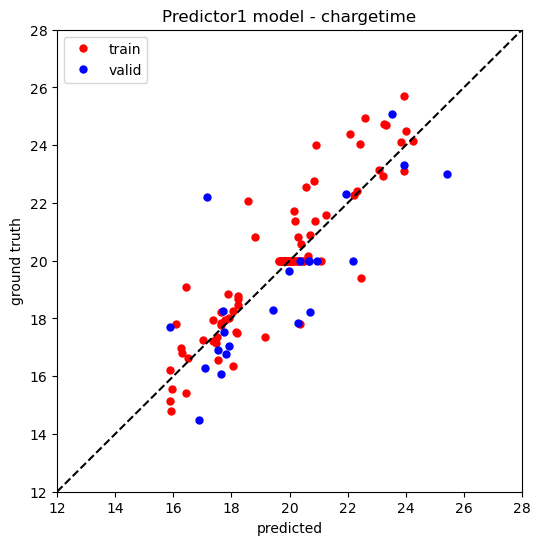

First 29 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Training set|RMSE: 58.55, MAPE: 0.06
Testing set|RMSE: 146.77, MAPE: 0.13


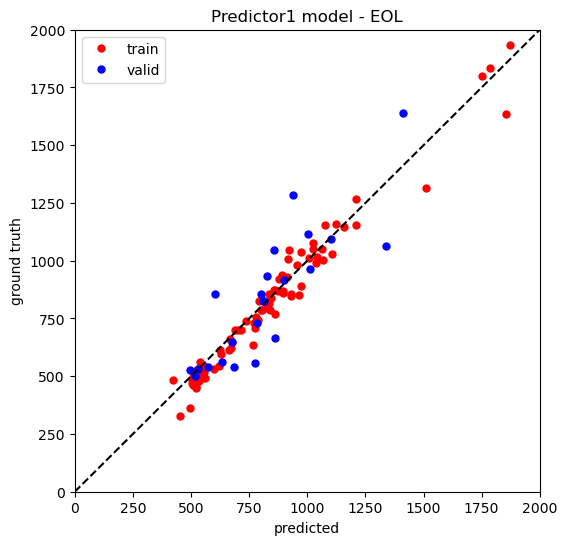

Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.86, MAPE: 0.08


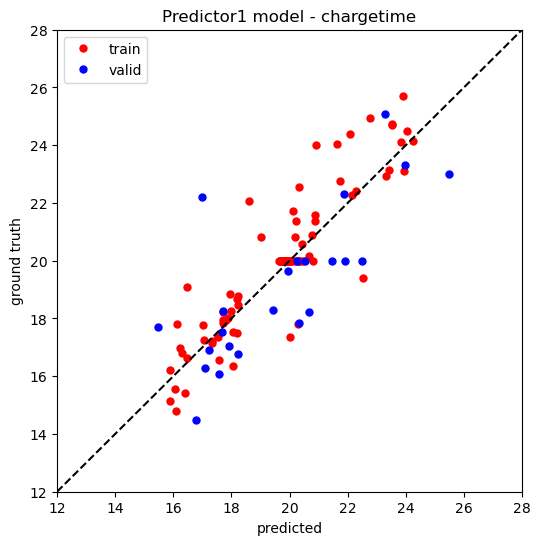

First 30 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Training set|RMSE: 54.52, MAPE: 0.06
Testing set|RMSE: 141.92, MAPE: 0.12


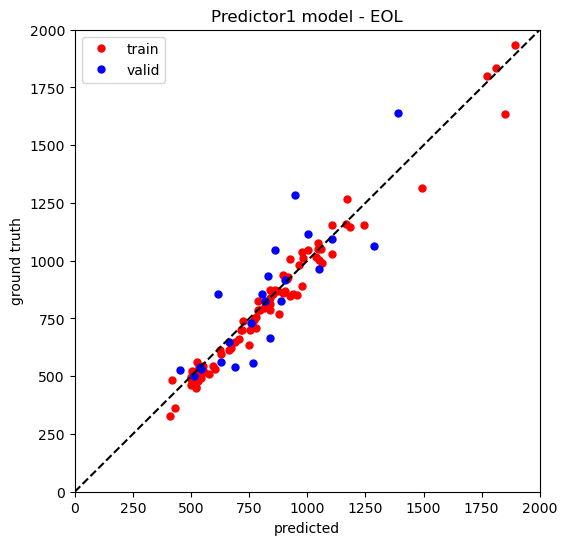

Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


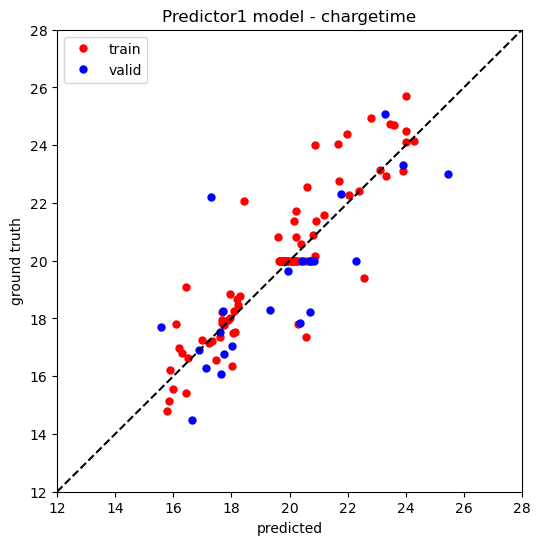

First 31 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Training set|RMSE: 58.42, MAPE: 0.06
Testing set|RMSE: 143.66, MAPE: 0.13


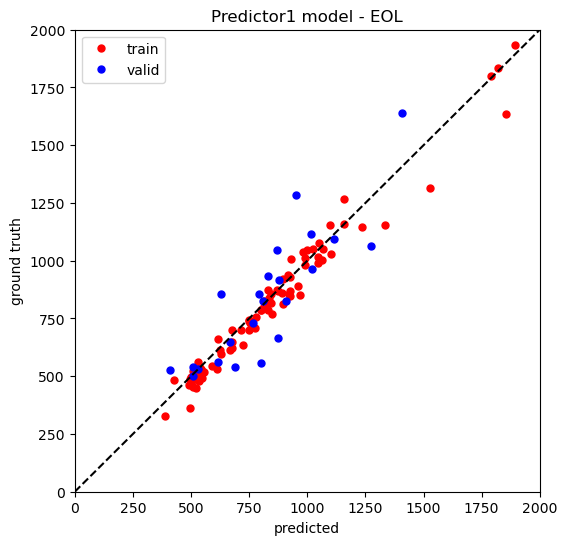

Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.67, MAPE: 0.07


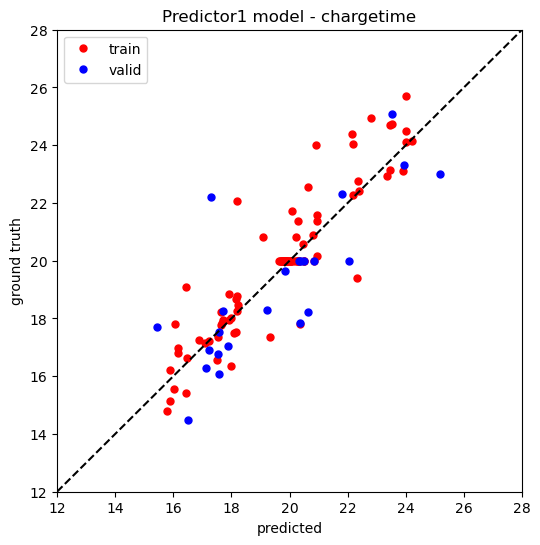

First 32 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Training set|RMSE: 57.13, MAPE: 0.06
Testing set|RMSE: 137.69, MAPE: 0.12


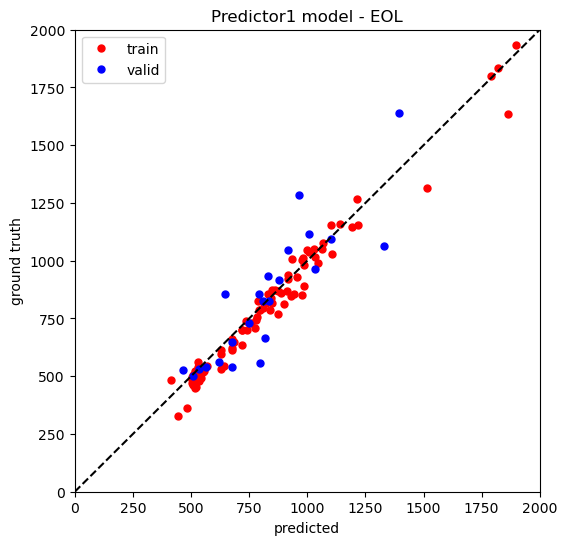

Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.76, MAPE: 0.07


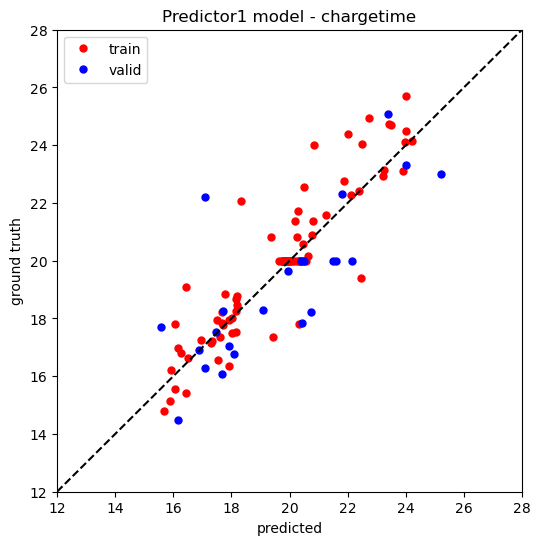

First 33 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Training set|RMSE: 56.84, MAPE: 0.06
Testing set|RMSE: 150.34, MAPE: 0.13


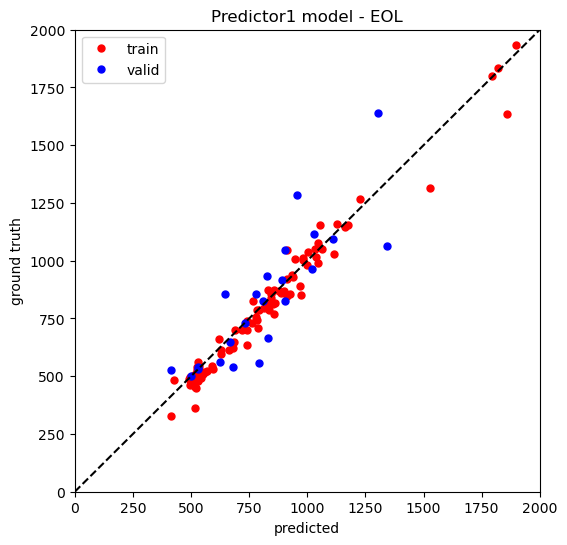

Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Training set|RMSE: 1.17, MAPE: 0.04
Testing set|RMSE: 1.72, MAPE: 0.07


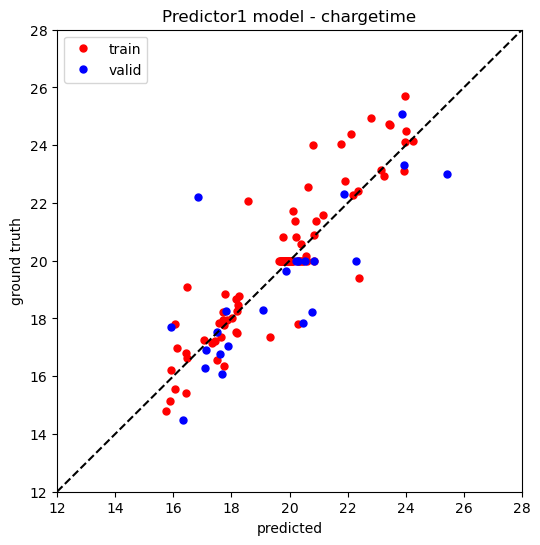

First 34 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Training set|RMSE: 62.20, MAPE: 0.06
Testing set|RMSE: 148.09, MAPE: 0.13


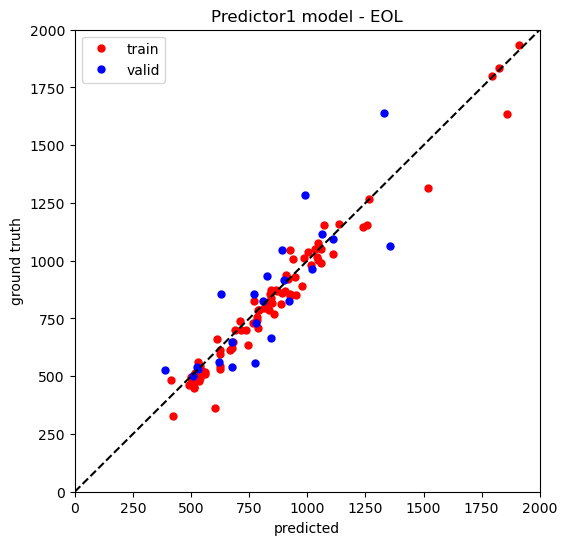

Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


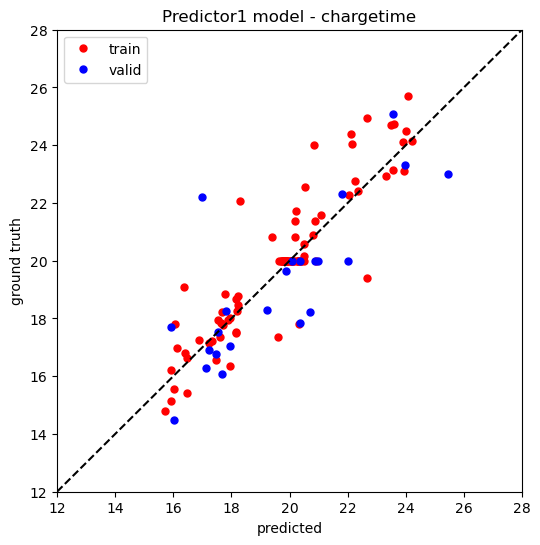

First 35 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Training set|RMSE: 57.44, MAPE: 0.06
Testing set|RMSE: 150.60, MAPE: 0.13


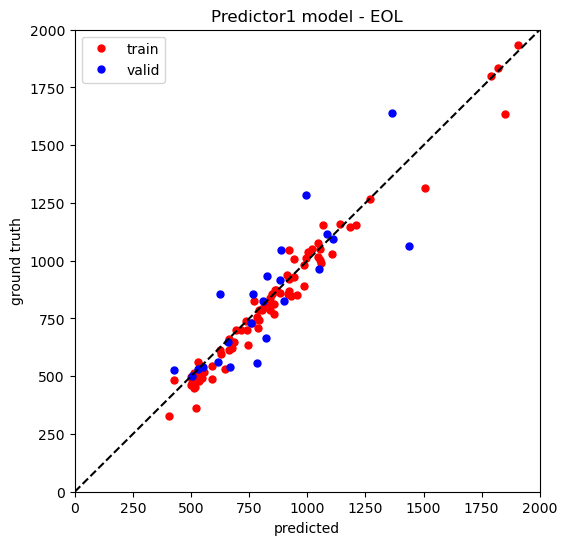

Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.66, MAPE: 0.07


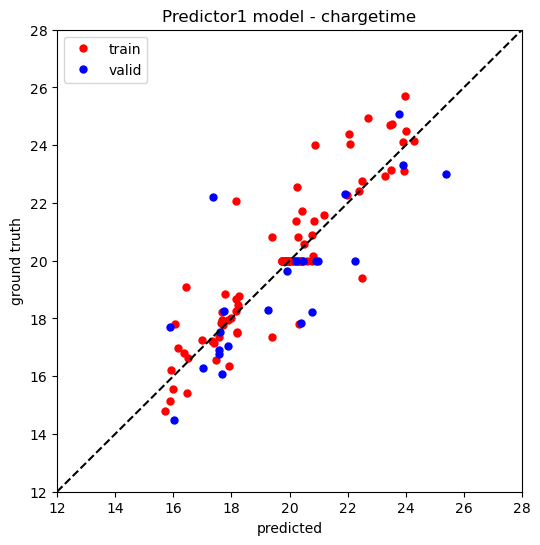

First 36 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Training set|RMSE: 60.87, MAPE: 0.06
Testing set|RMSE: 164.90, MAPE: 0.14


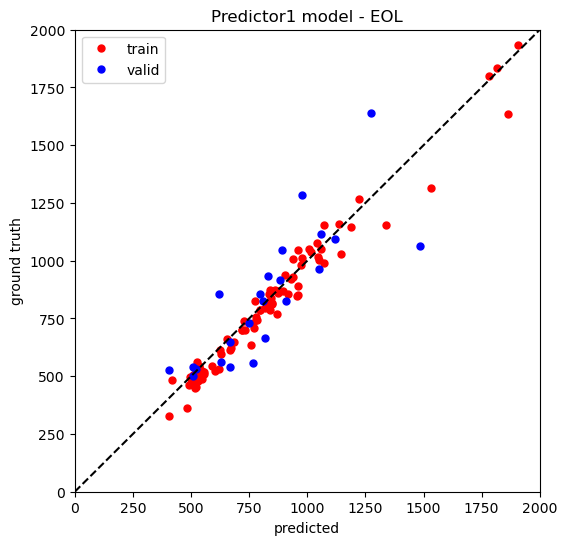

Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


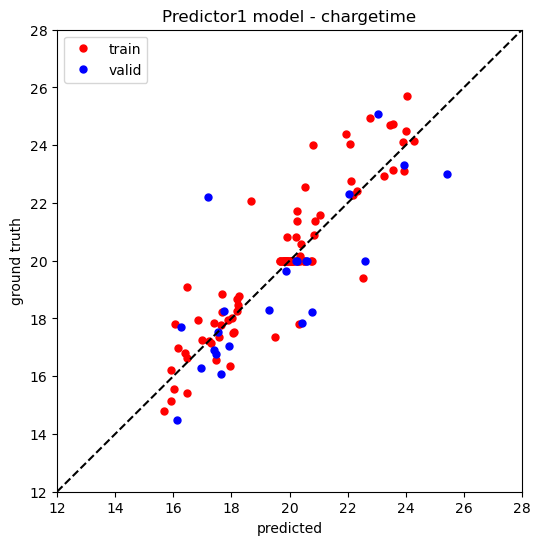

First 37 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Training set|RMSE: 63.12, MAPE: 0.06
Testing set|RMSE: 160.33, MAPE: 0.13


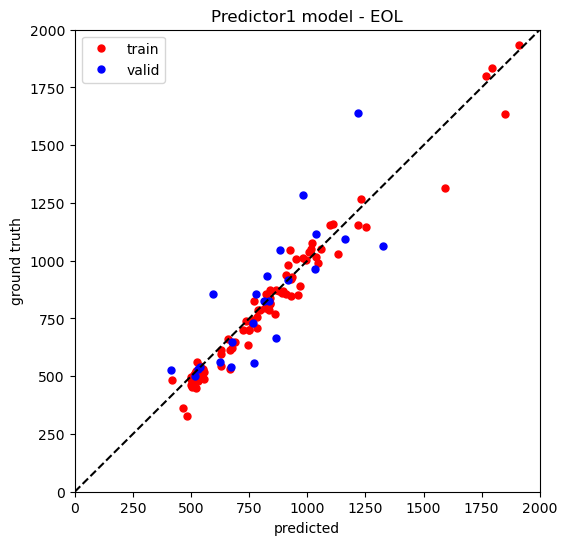

Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.71, MAPE: 0.07


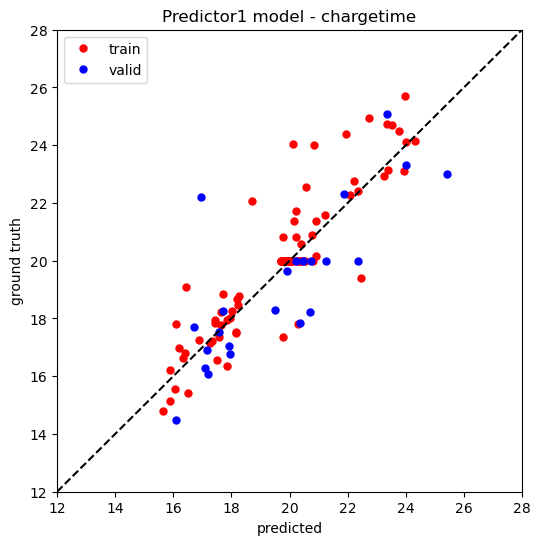

First 38 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Training set|RMSE: 55.57, MAPE: 0.06
Testing set|RMSE: 176.71, MAPE: 0.13


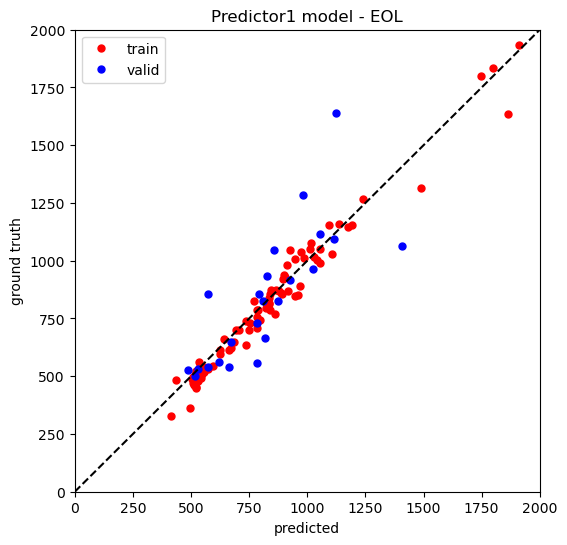

Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.76, MAPE: 0.07


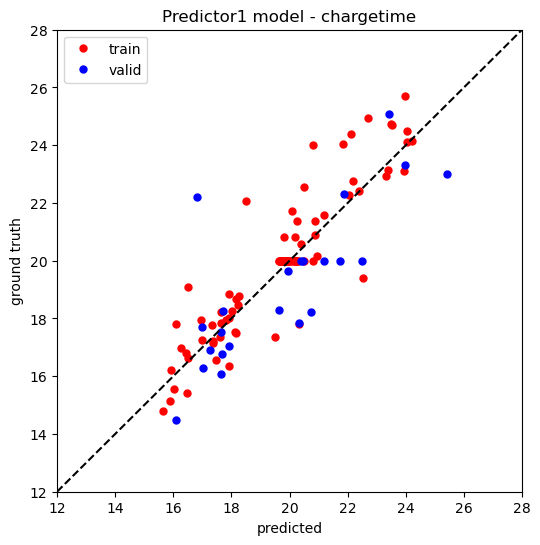

First 39 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Training set|RMSE: 62.06, MAPE: 0.06
Testing set|RMSE: 166.38, MAPE: 0.14


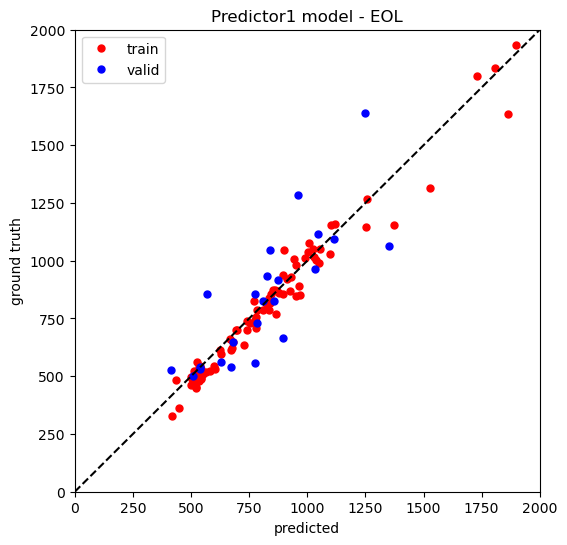

Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


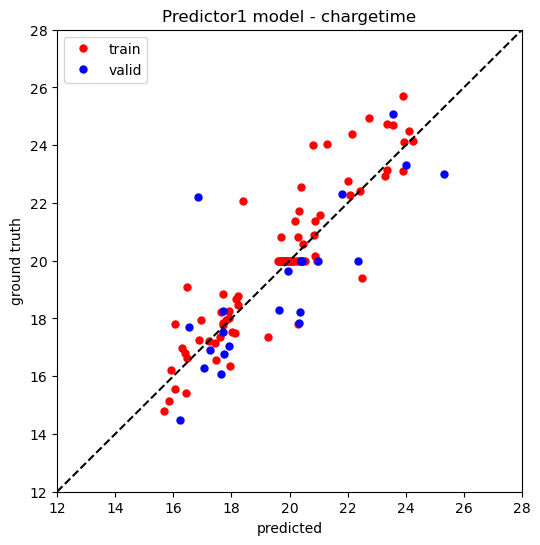

First 40 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Training set|RMSE: 56.48, MAPE: 0.06
Testing set|RMSE: 163.86, MAPE: 0.13


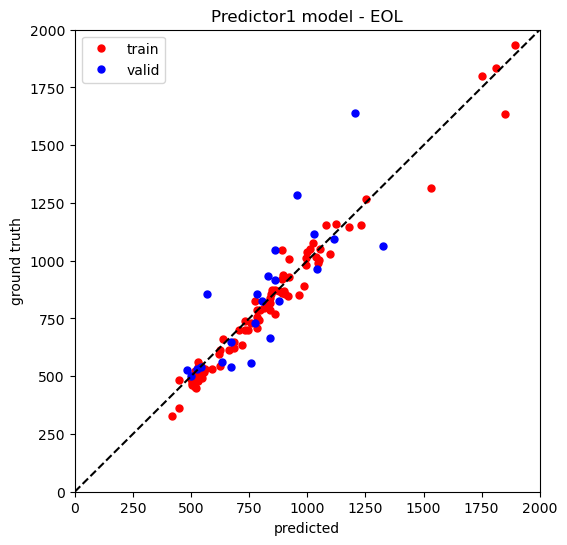

Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.67, MAPE: 0.07


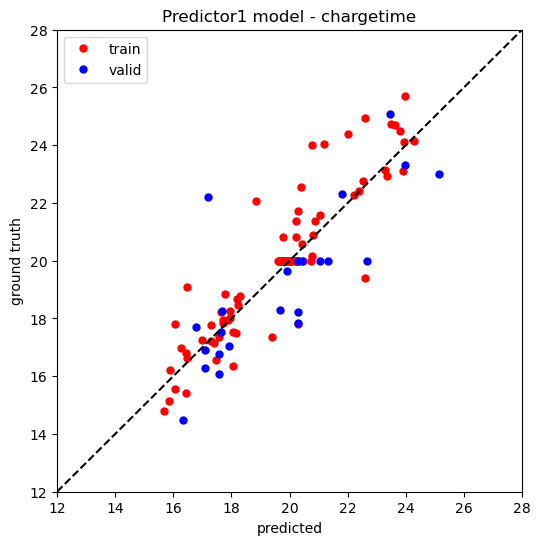

First 41 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Training set|RMSE: 56.70, MAPE: 0.06
Testing set|RMSE: 165.22, MAPE: 0.13


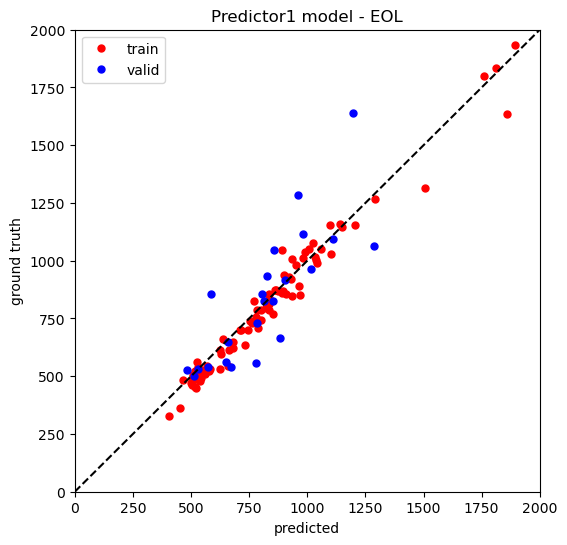

Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


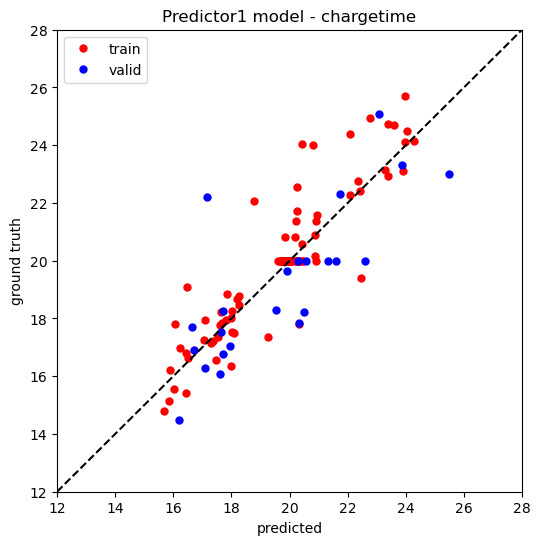

First 42 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Training set|RMSE: 57.50, MAPE: 0.06
Testing set|RMSE: 170.38, MAPE: 0.14


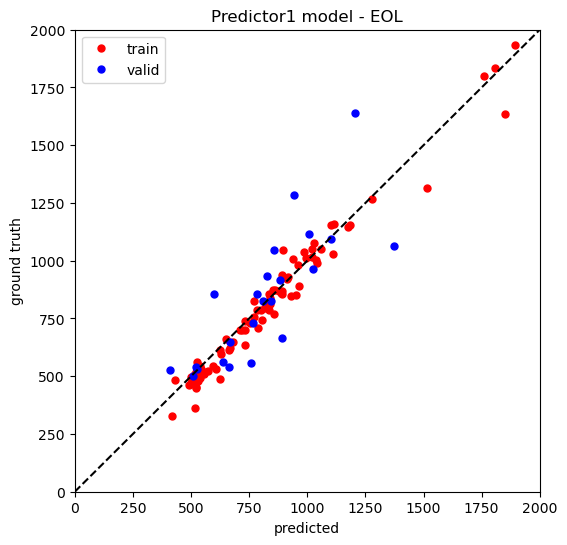

Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.65, MAPE: 0.06


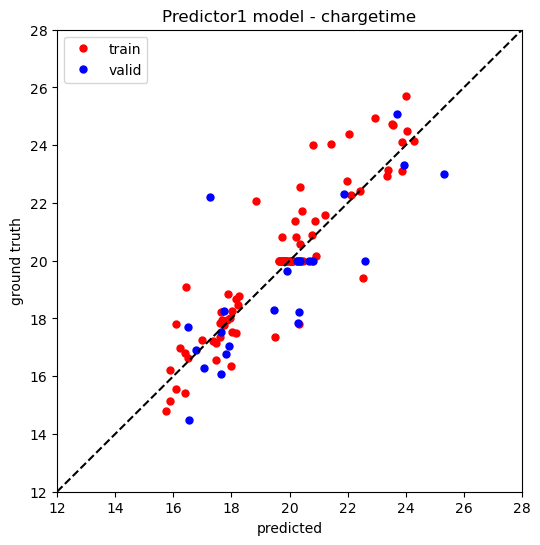

First 43 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Training set|RMSE: 56.69, MAPE: 0.06
Testing set|RMSE: 152.59, MAPE: 0.13


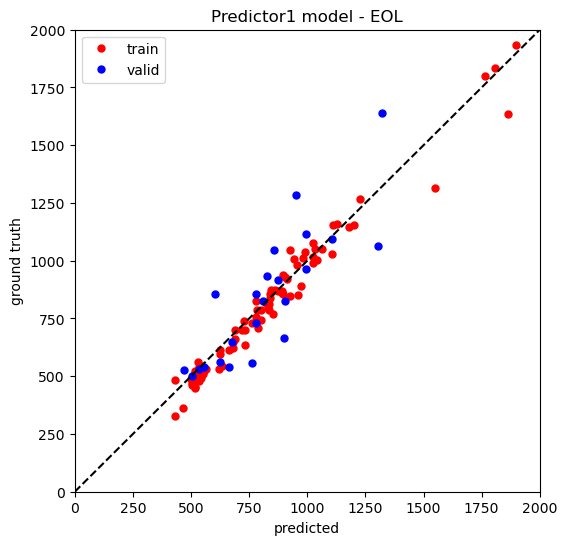

Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.69, MAPE: 0.07


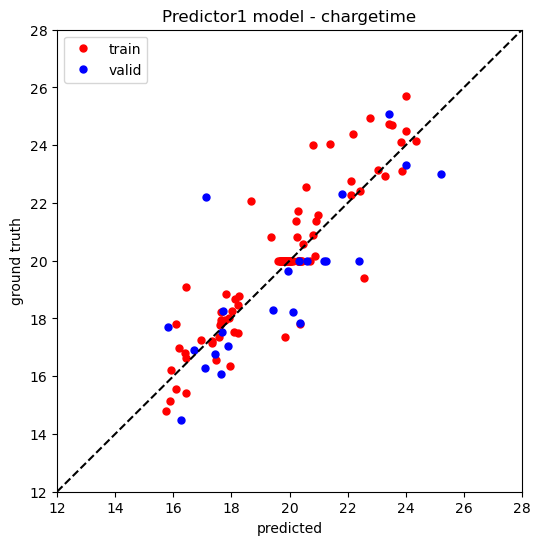

First 44 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Training set|RMSE: 54.32, MAPE: 0.06
Testing set|RMSE: 145.65, MAPE: 0.12


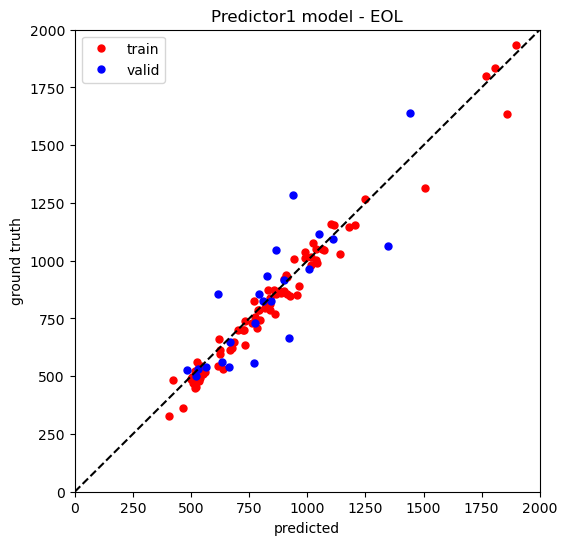

Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


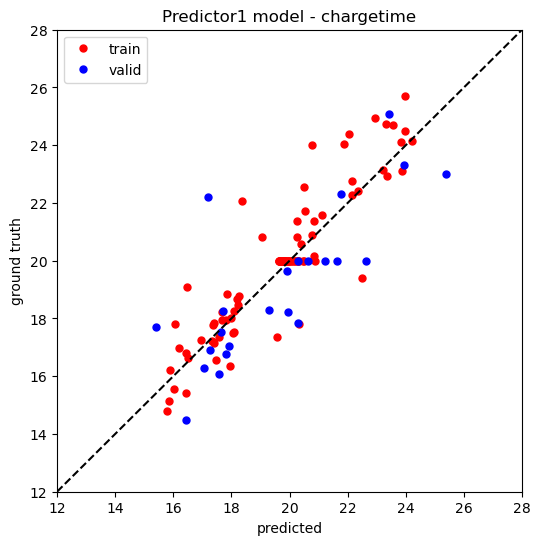

First 45 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Training set|RMSE: 56.51, MAPE: 0.06
Testing set|RMSE: 152.84, MAPE: 0.13


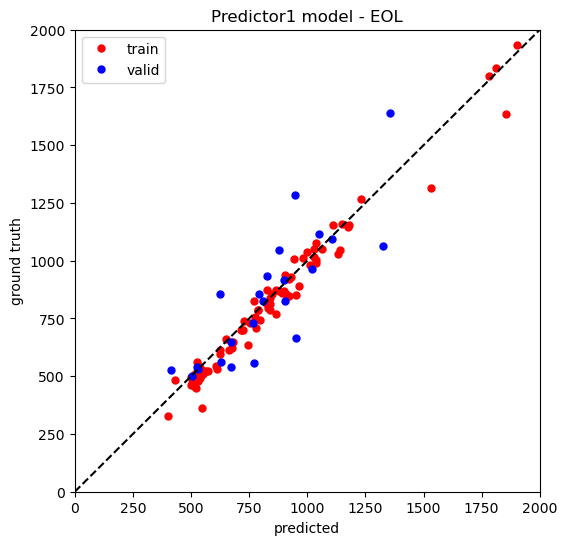

Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Training set|RMSE: 1.18, MAPE: 0.04
Testing set|RMSE: 1.65, MAPE: 0.07


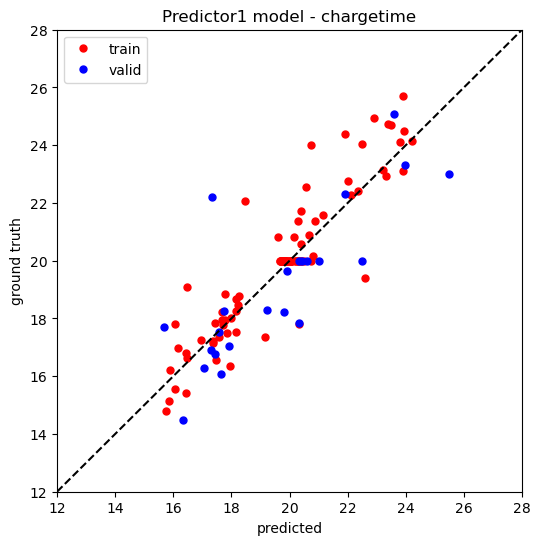

First 46 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Training set|RMSE: 59.22, MAPE: 0.06
Testing set|RMSE: 149.80, MAPE: 0.12


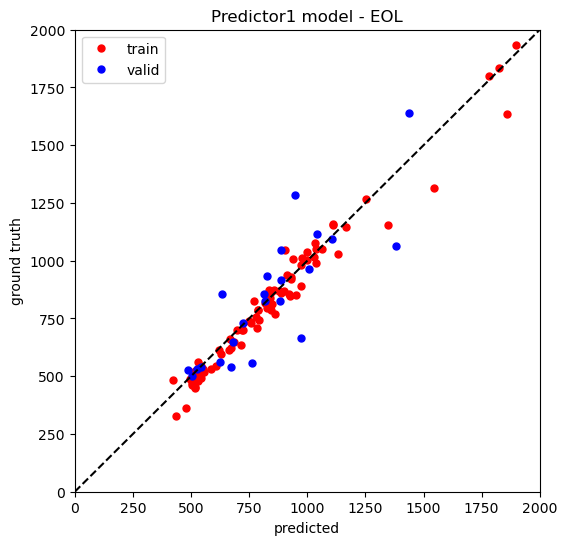

Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


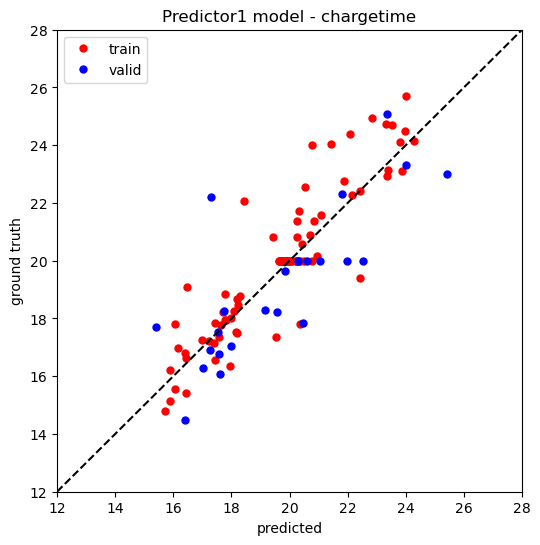

First 47 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Training set|RMSE: 58.25, MAPE: 0.06
Testing set|RMSE: 153.10, MAPE: 0.13


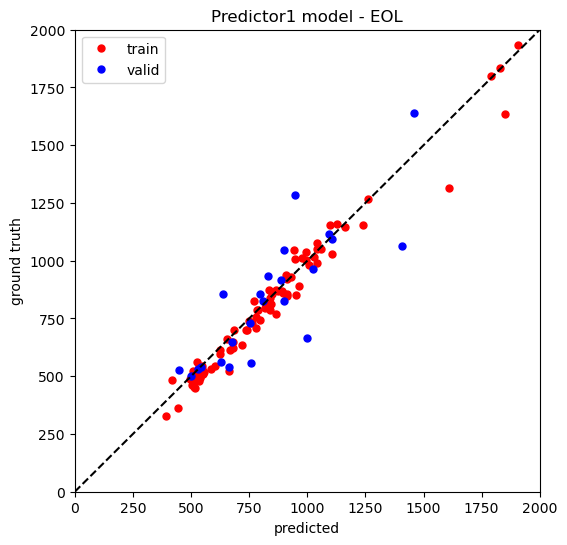

Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.69, MAPE: 0.07


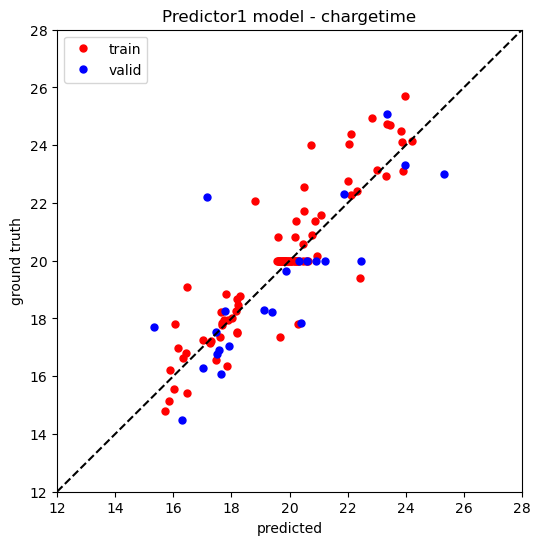

First 48 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Training set|RMSE: 52.96, MAPE: 0.05
Testing set|RMSE: 151.57, MAPE: 0.13


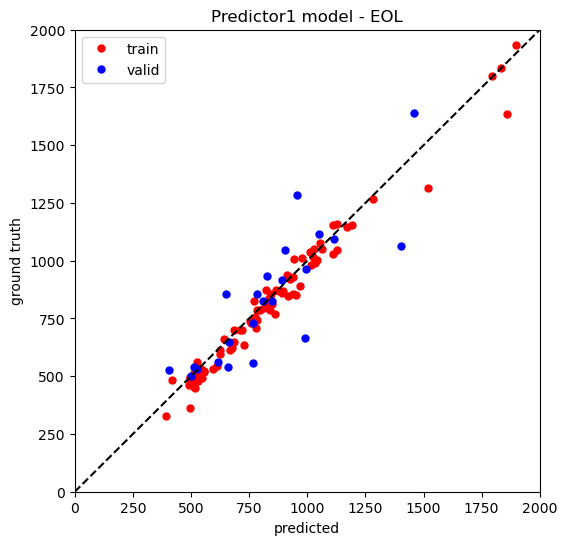

Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.72, MAPE: 0.07


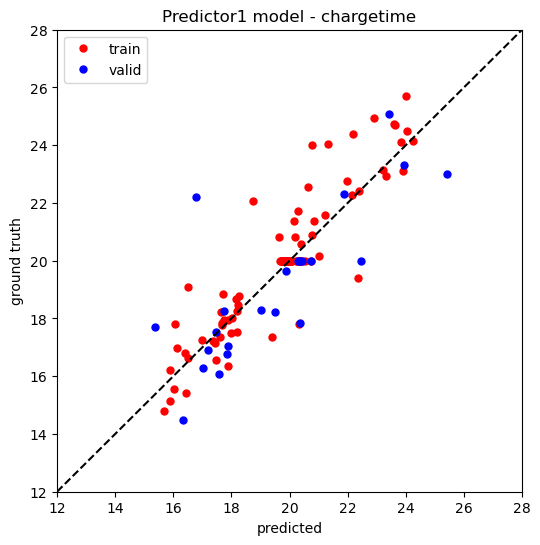

First 49 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Training set|RMSE: 57.53, MAPE: 0.05
Testing set|RMSE: 146.44, MAPE: 0.13


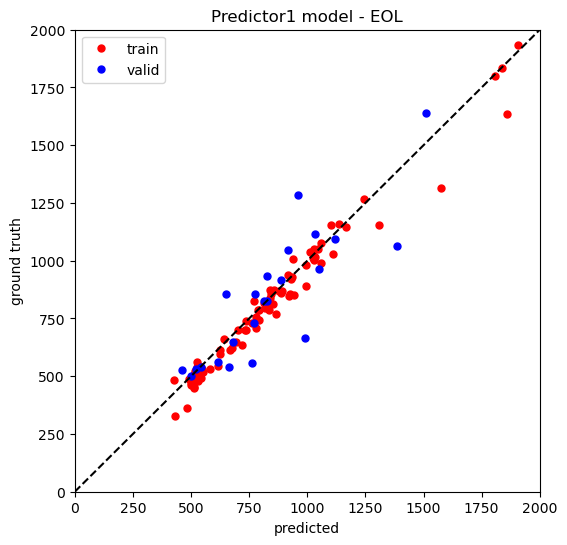

Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Training set|RMSE: 1.27, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


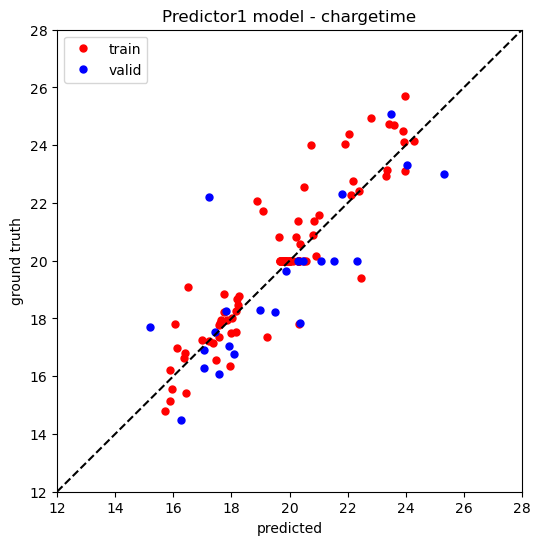

First 50 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Training set|RMSE: 54.33, MAPE: 0.05
Testing set|RMSE: 134.08, MAPE: 0.11


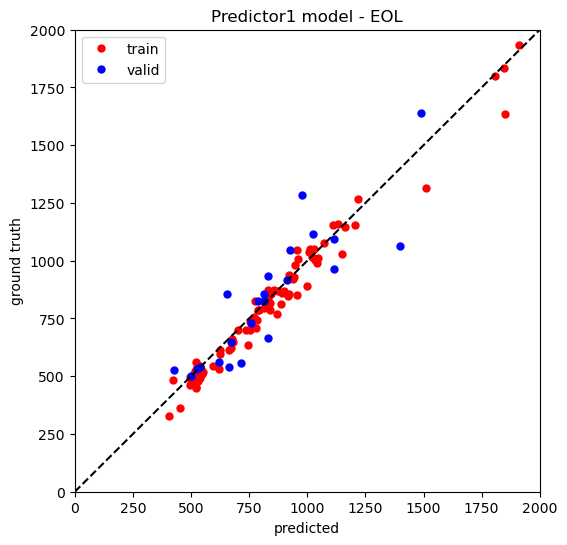

Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Training set|RMSE: 1.39, MAPE: 0.04
Testing set|RMSE: 1.87, MAPE: 0.07


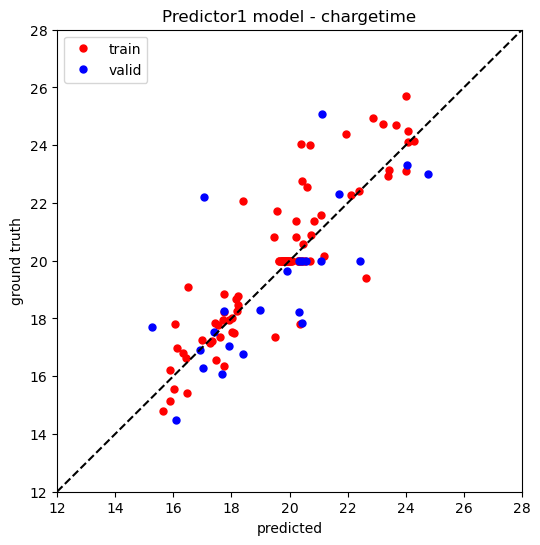

First 51 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Training set|RMSE: 58.40, MAPE: 0.06
Testing set|RMSE: 148.02, MAPE: 0.13


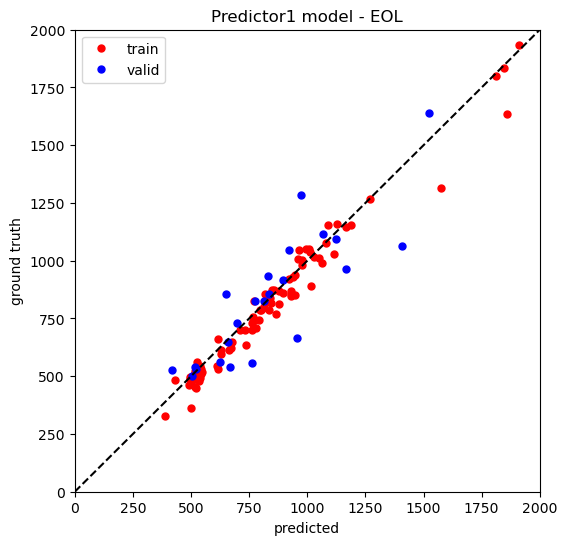

Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Training set|RMSE: 1.36, MAPE: 0.04
Testing set|RMSE: 1.86, MAPE: 0.07


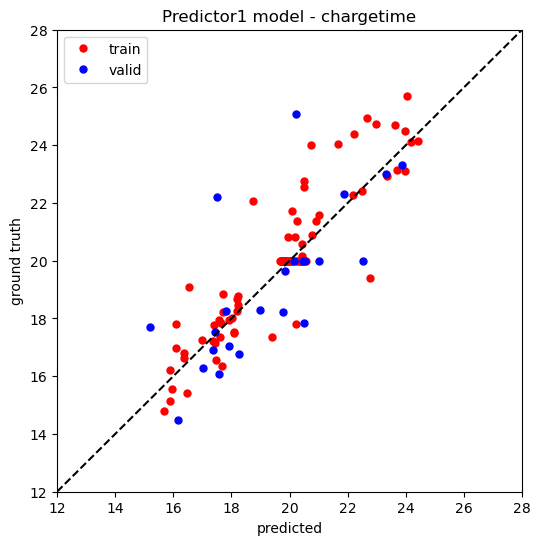

First 52 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Training set|RMSE: 61.52, MAPE: 0.06
Testing set|RMSE: 150.72, MAPE: 0.13


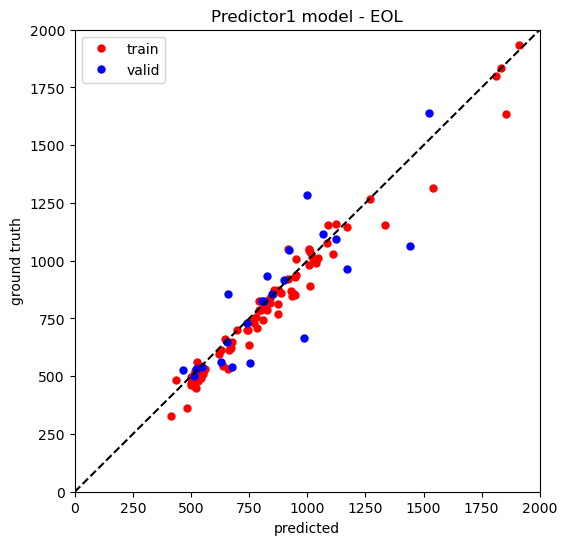

Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Training set|RMSE: 1.41, MAPE: 0.04
Testing set|RMSE: 1.95, MAPE: 0.07


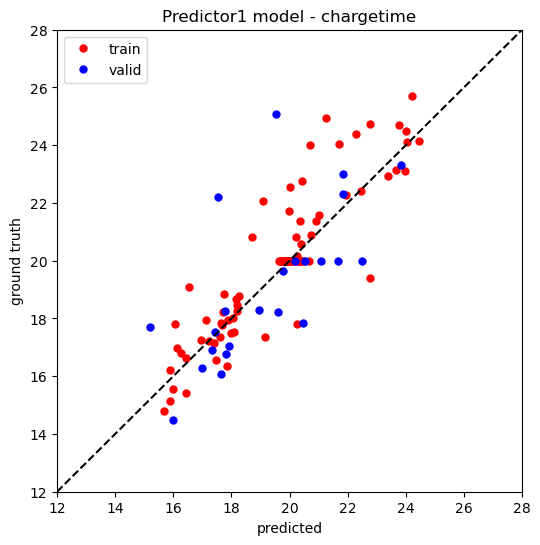

First 53 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Training set|RMSE: 60.33, MAPE: 0.06
Testing set|RMSE: 142.99, MAPE: 0.12


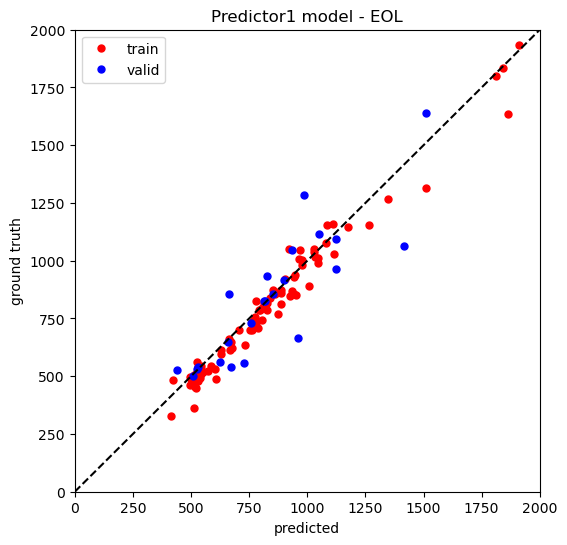

Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Training set|RMSE: 1.42, MAPE: 0.04
Testing set|RMSE: 2.01, MAPE: 0.07


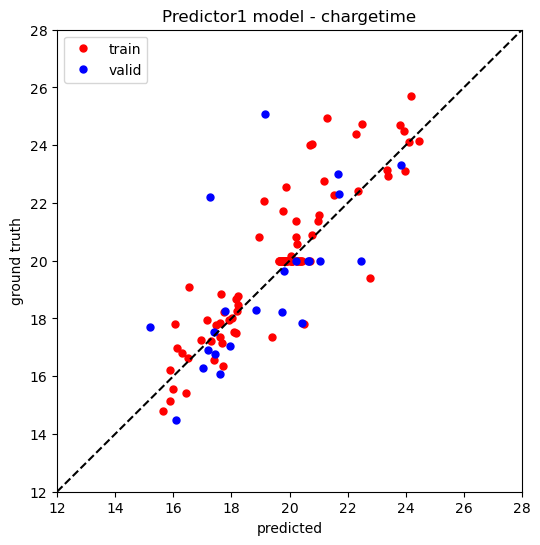

First 54 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Training set|RMSE: 57.92, MAPE: 0.06
Testing set|RMSE: 139.70, MAPE: 0.11


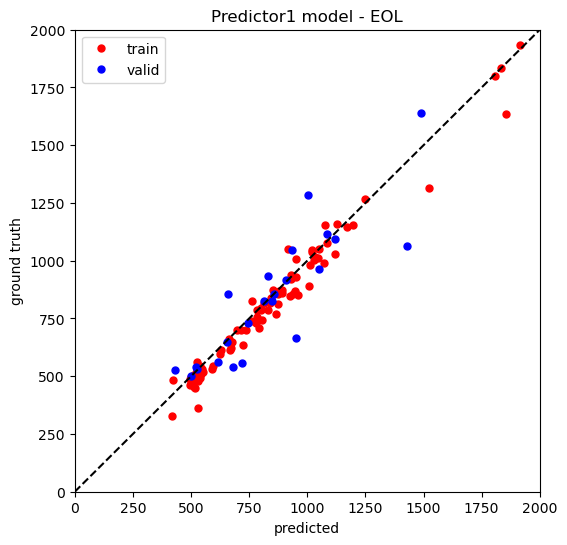

Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Training set|RMSE: 1.40, MAPE: 0.04
Testing set|RMSE: 1.93, MAPE: 0.07


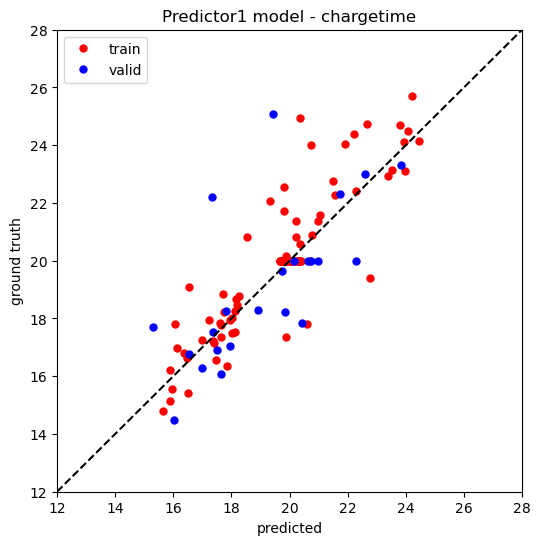

First 55 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Training set|RMSE: 55.71, MAPE: 0.05
Testing set|RMSE: 139.41, MAPE: 0.12


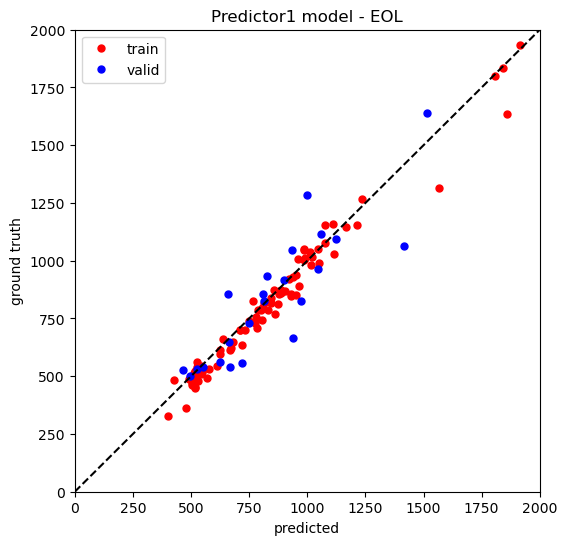

Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Training set|RMSE: 1.26, MAPE: 0.04
Testing set|RMSE: 1.71, MAPE: 0.07


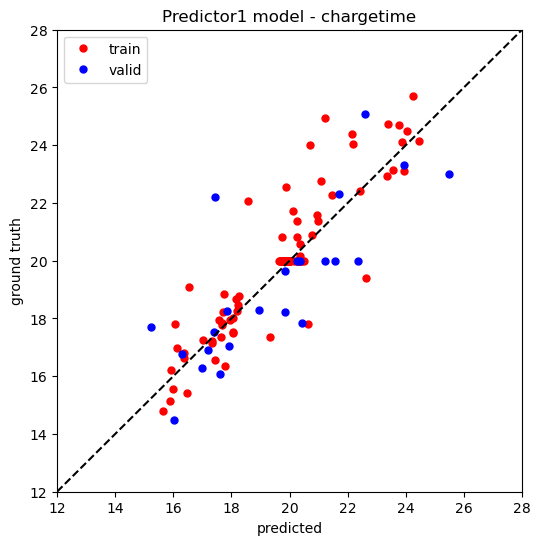

First 56 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Training set|RMSE: 52.63, MAPE: 0.05
Testing set|RMSE: 153.64, MAPE: 0.13


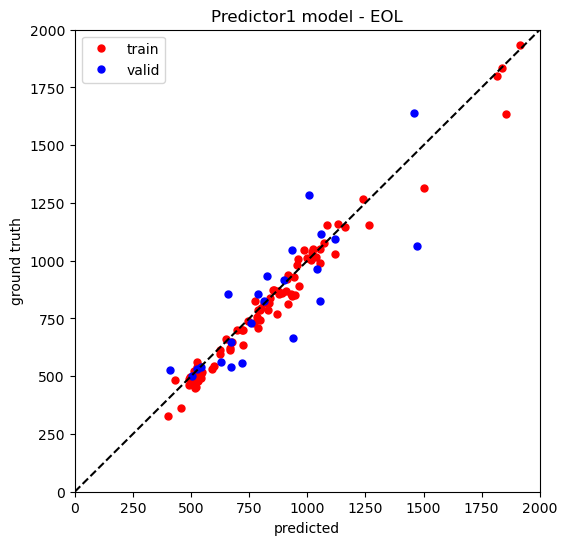

Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.68, MAPE: 0.06


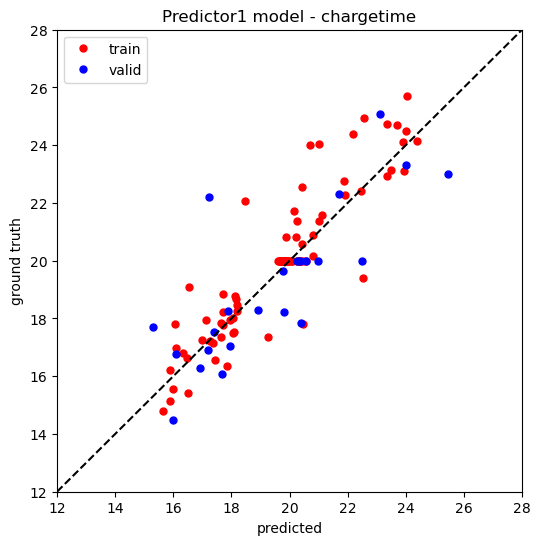

First 57 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Training set|RMSE: 57.40, MAPE: 0.05
Testing set|RMSE: 147.38, MAPE: 0.13


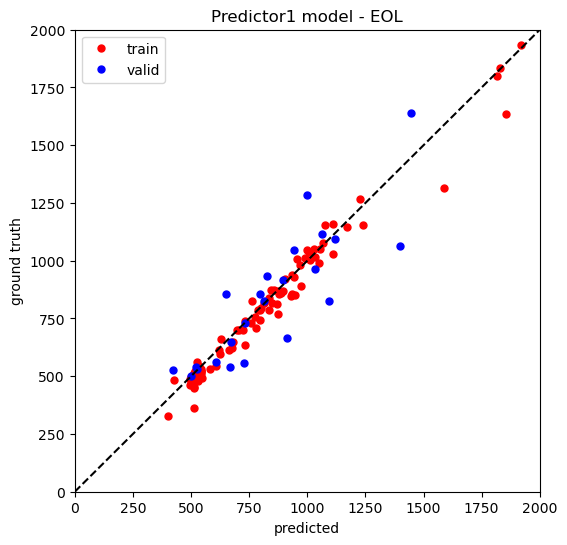

Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.70, MAPE: 0.07


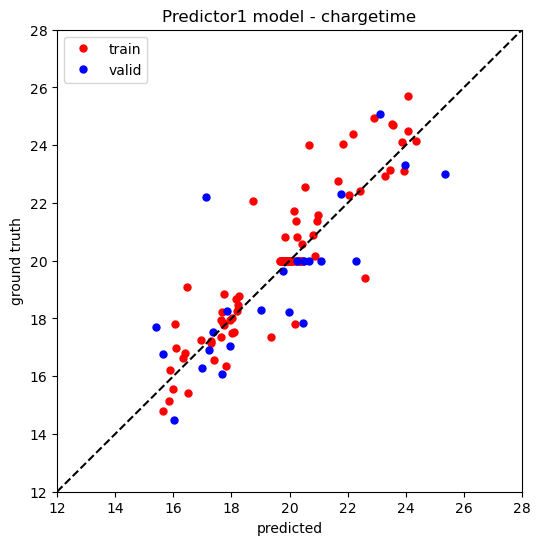

First 58 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Training set|RMSE: 55.73, MAPE: 0.05
Testing set|RMSE: 147.77, MAPE: 0.13


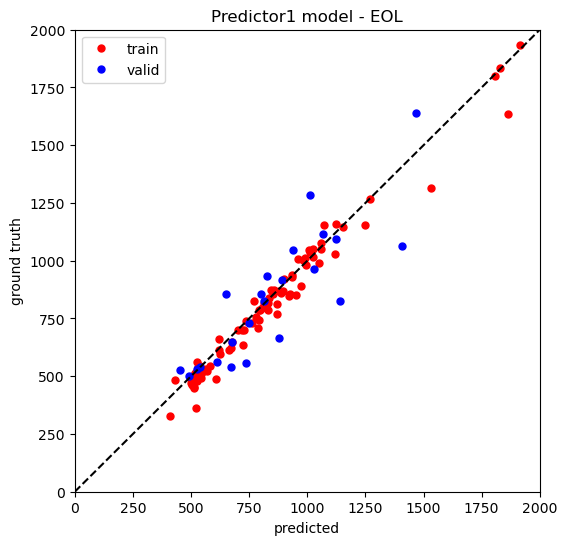

Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


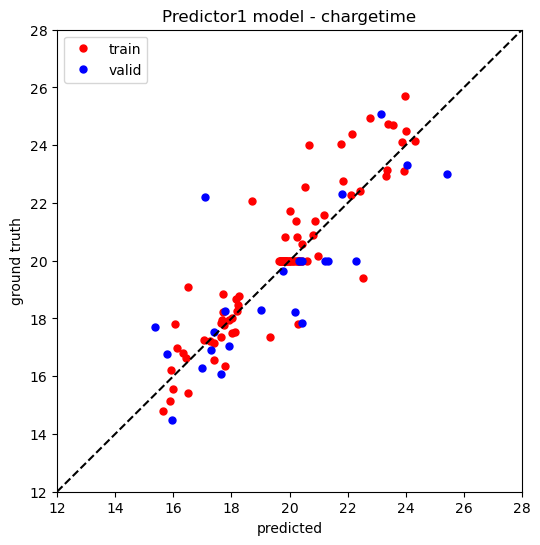

First 59 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Training set|RMSE: 56.03, MAPE: 0.05
Testing set|RMSE: 150.51, MAPE: 0.13


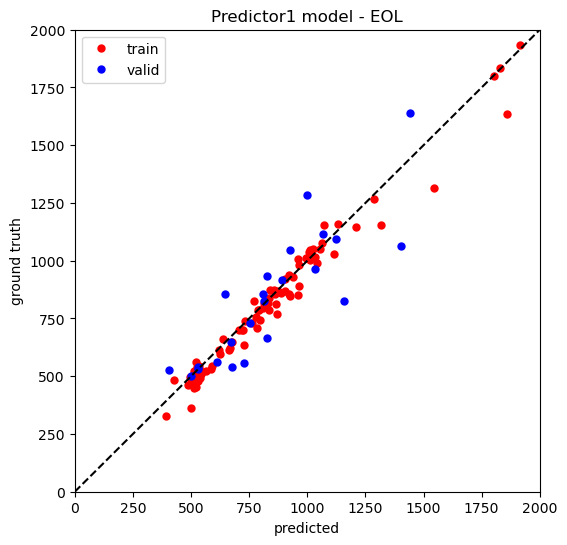

Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.72, MAPE: 0.07


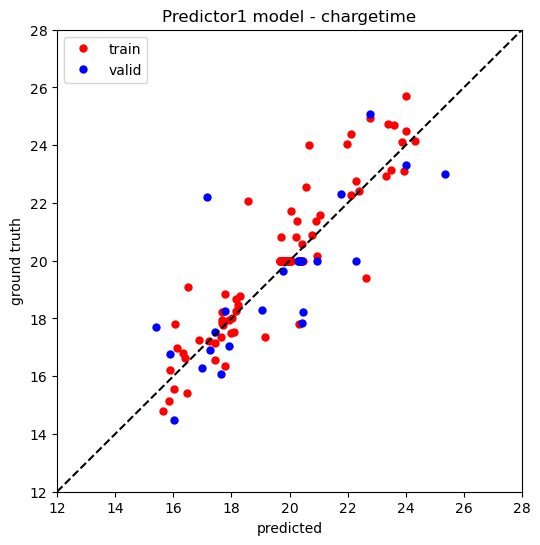

First 60 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Training set|RMSE: 52.74, MAPE: 0.05
Testing set|RMSE: 148.88, MAPE: 0.12


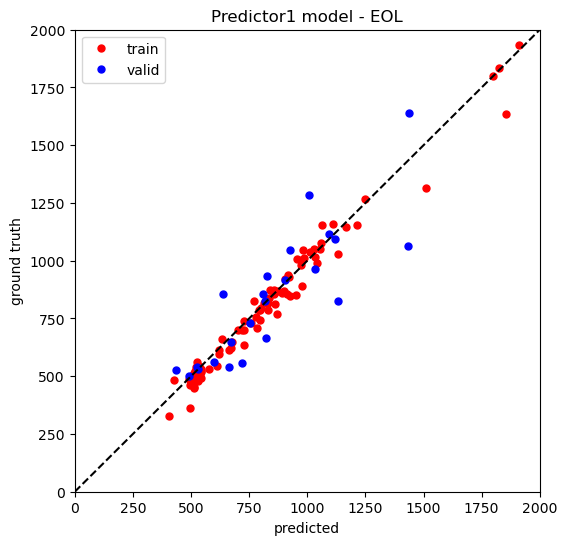

Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Training set|RMSE: 1.24, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


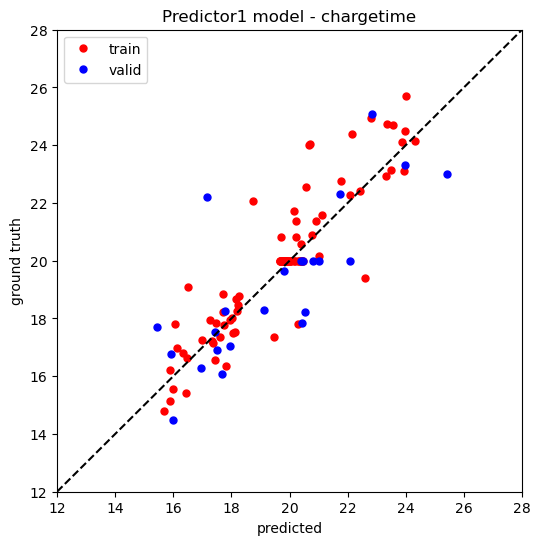

First 61 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Training set|RMSE: 54.19, MAPE: 0.05
Testing set|RMSE: 142.96, MAPE: 0.12


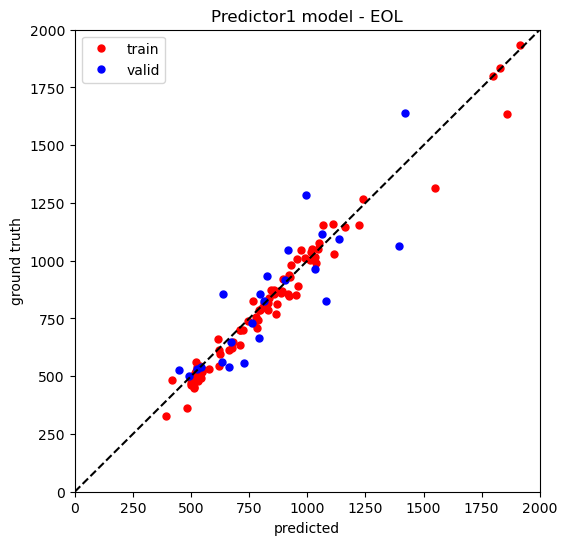

Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


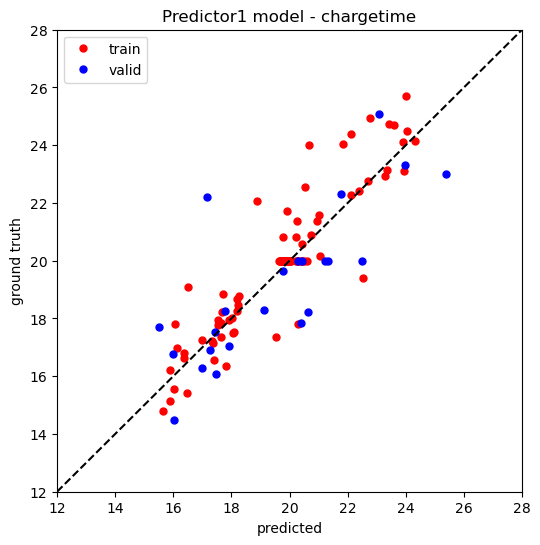

First 62 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Training set|RMSE: 55.91, MAPE: 0.05
Testing set|RMSE: 142.01, MAPE: 0.12


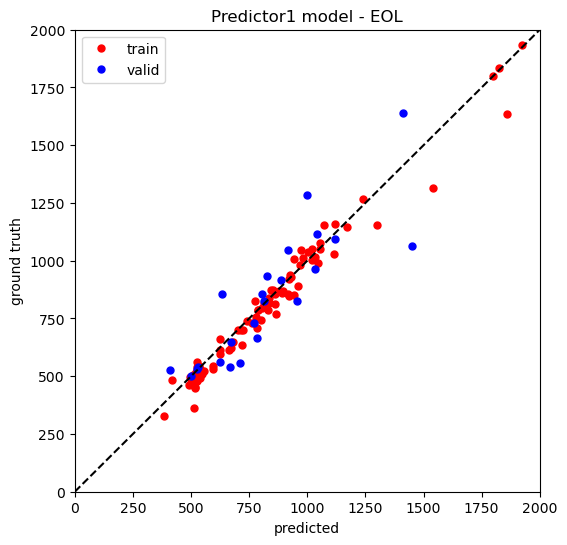

Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


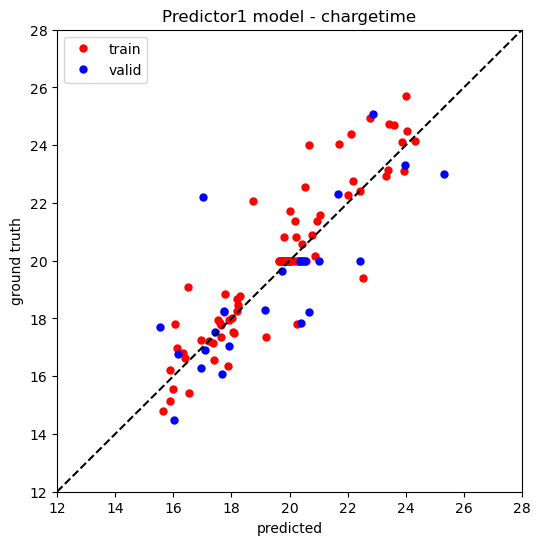

First 63 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Training set|RMSE: 54.88, MAPE: 0.05
Testing set|RMSE: 138.65, MAPE: 0.12


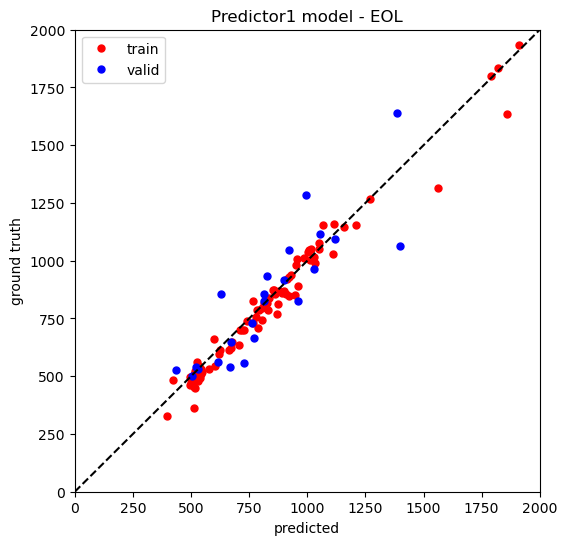

Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.76, MAPE: 0.07


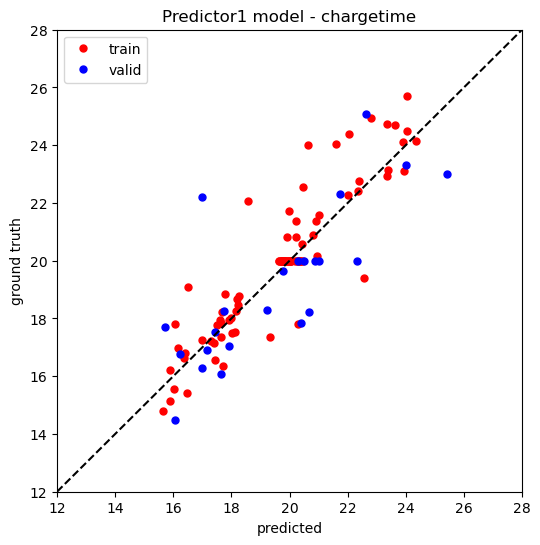

First 64 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Training set|RMSE: 56.17, MAPE: 0.06
Testing set|RMSE: 141.25, MAPE: 0.12


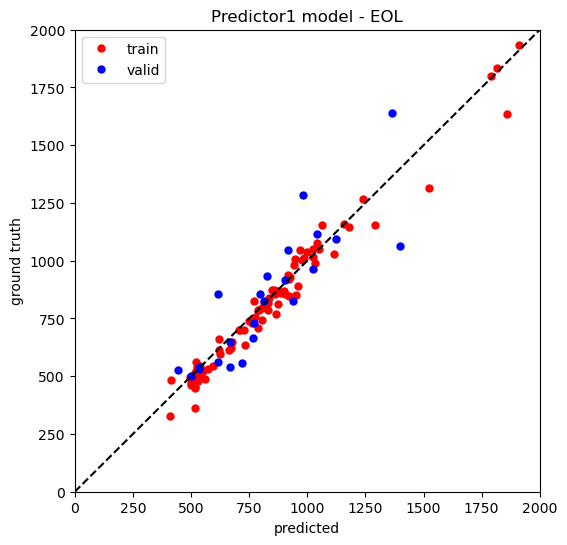

Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Training set|RMSE: 1.23, MAPE: 0.04
Testing set|RMSE: 1.72, MAPE: 0.07


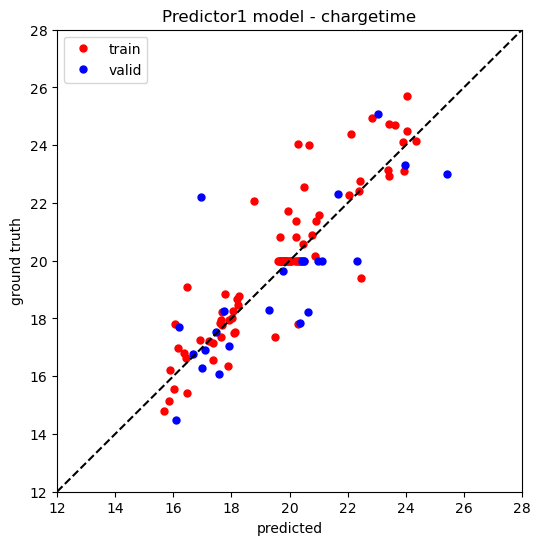

First 65 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Training set|RMSE: 57.30, MAPE: 0.05
Testing set|RMSE: 138.45, MAPE: 0.12


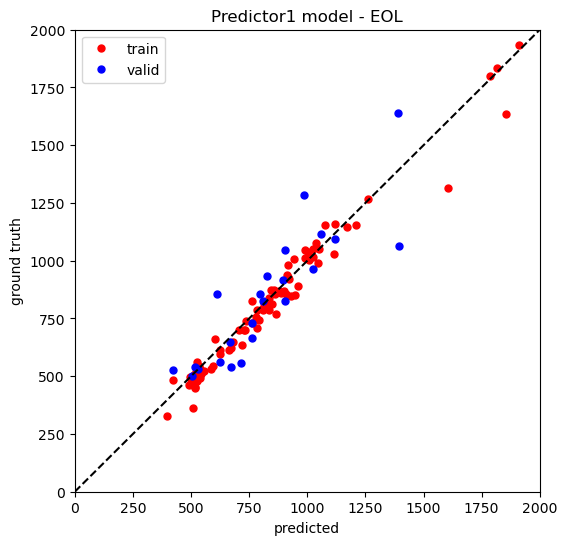

Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Training set|RMSE: 1.22, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


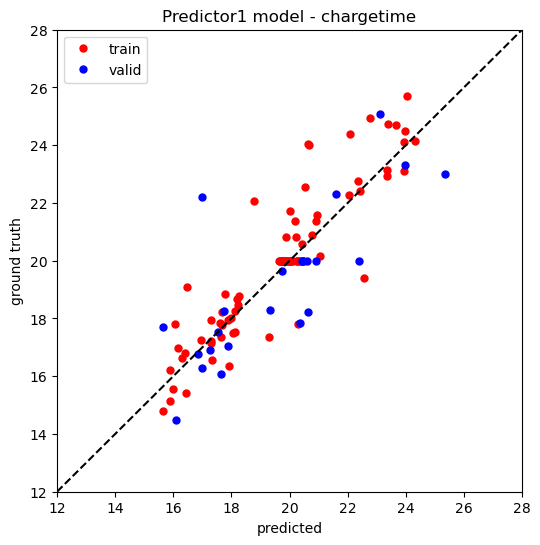

First 66 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Training set|RMSE: 52.91, MAPE: 0.05
Testing set|RMSE: 143.22, MAPE: 0.11


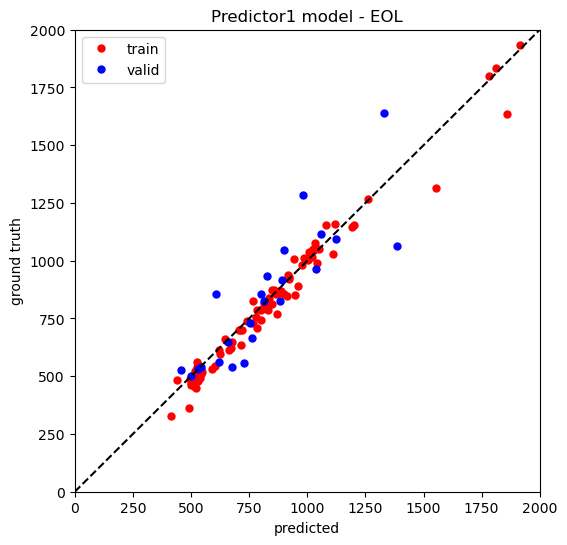

Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


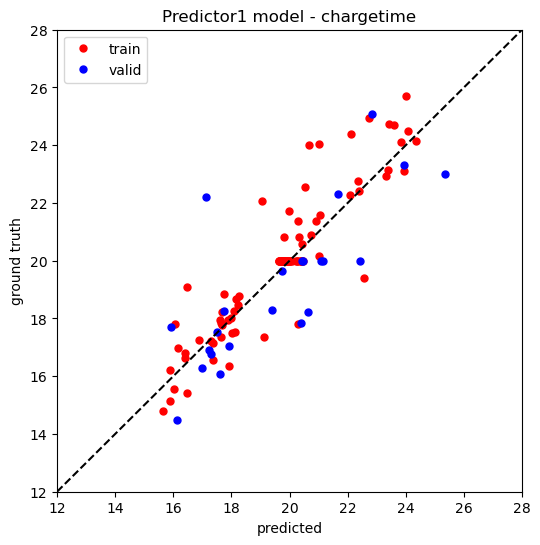

First 67 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Training set|RMSE: 54.14, MAPE: 0.05
Testing set|RMSE: 141.28, MAPE: 0.12


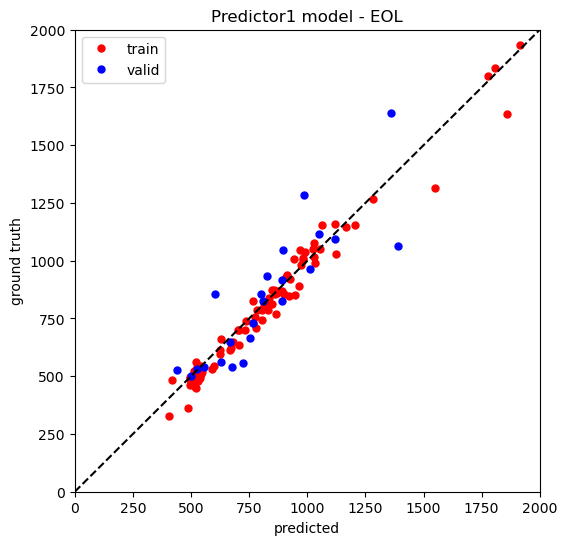

Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


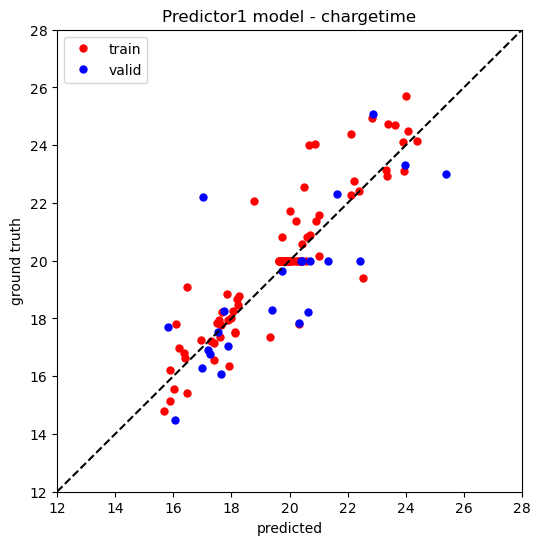

First 68 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Training set|RMSE: 54.12, MAPE: 0.05
Testing set|RMSE: 139.72, MAPE: 0.12


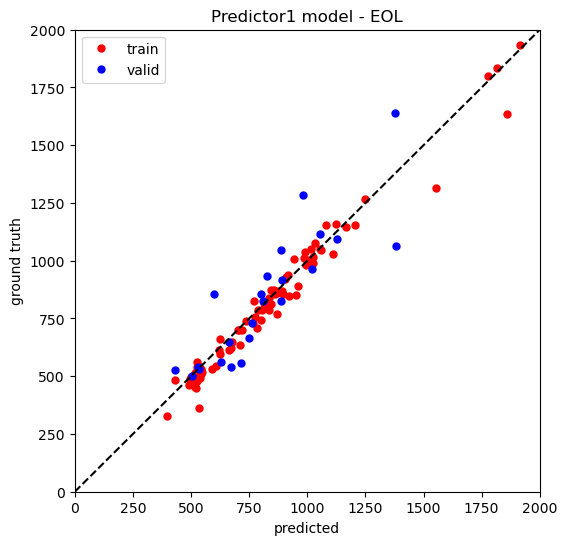

Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


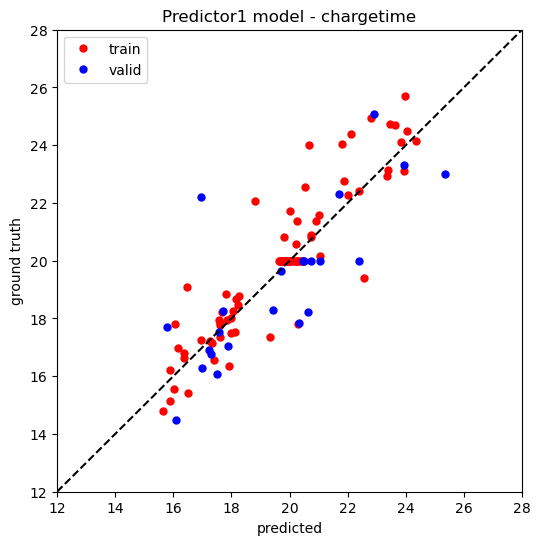

First 69 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Training set|RMSE: 52.53, MAPE: 0.05
Testing set|RMSE: 143.69, MAPE: 0.11


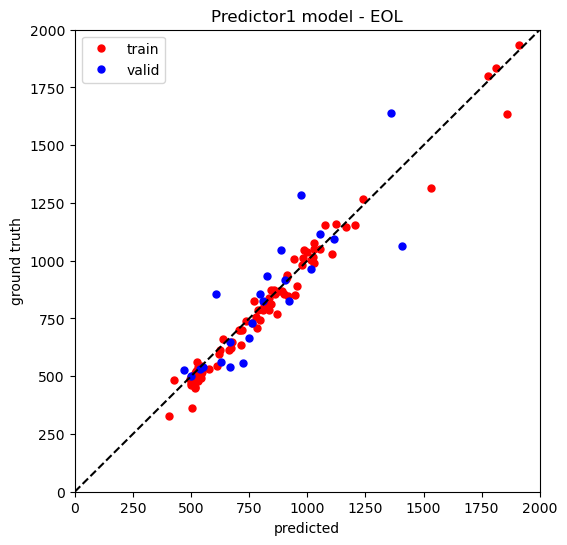

Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.77, MAPE: 0.07


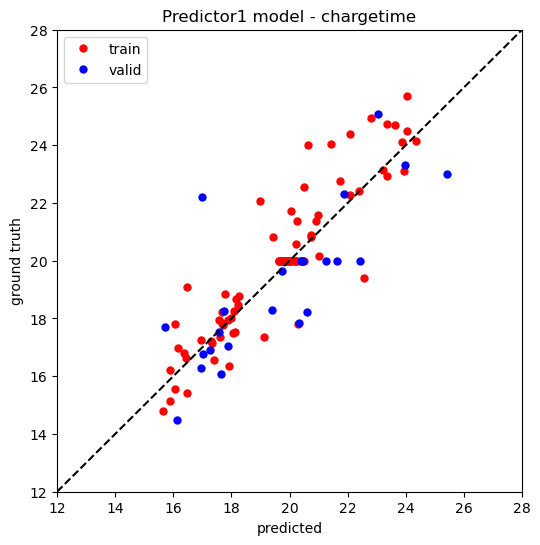

First 70 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Training set|RMSE: 52.04, MAPE: 0.05
Testing set|RMSE: 144.22, MAPE: 0.12


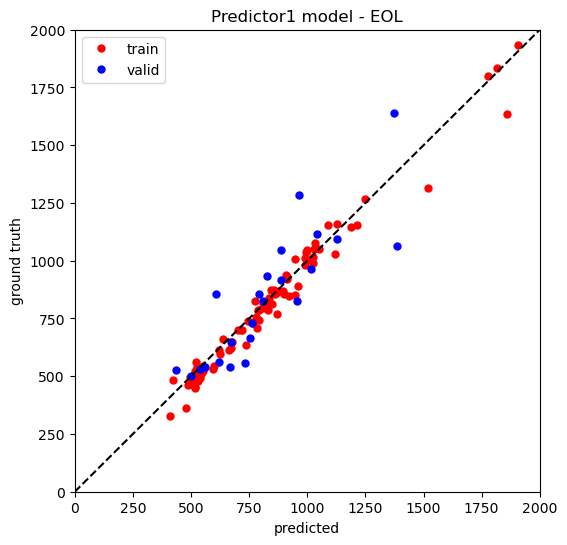

Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.77, MAPE: 0.07


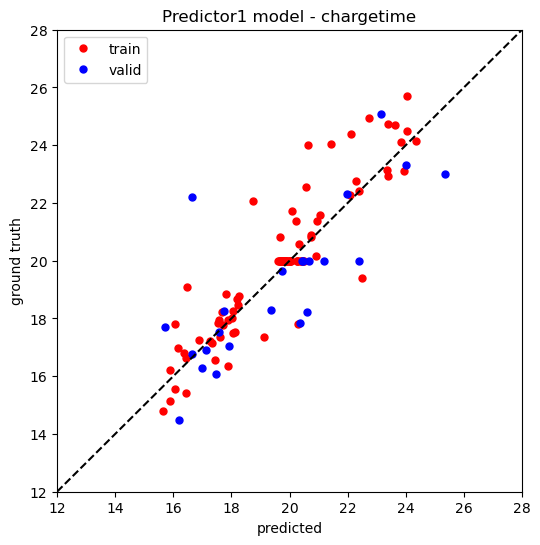

First 71 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Training set|RMSE: 54.29, MAPE: 0.05
Testing set|RMSE: 138.48, MAPE: 0.12


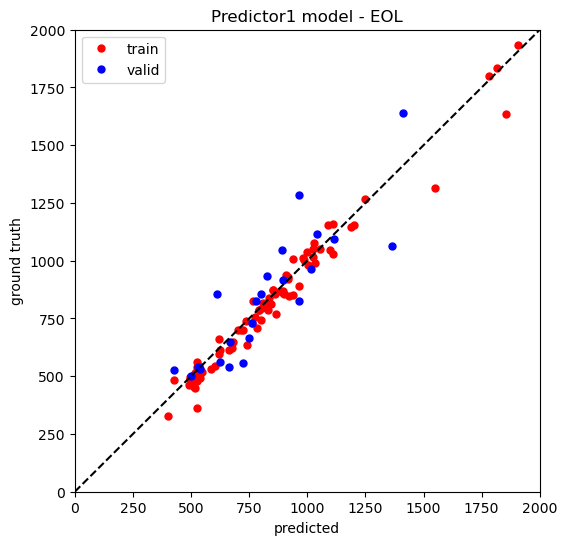

Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


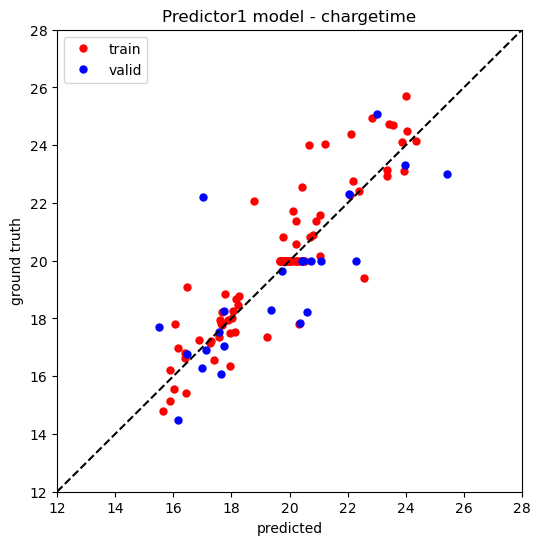

First 72 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Training set|RMSE: 51.57, MAPE: 0.05
Testing set|RMSE: 137.68, MAPE: 0.12


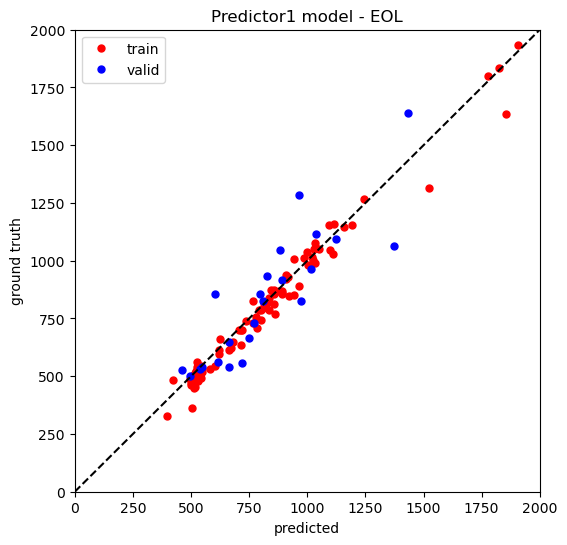

Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


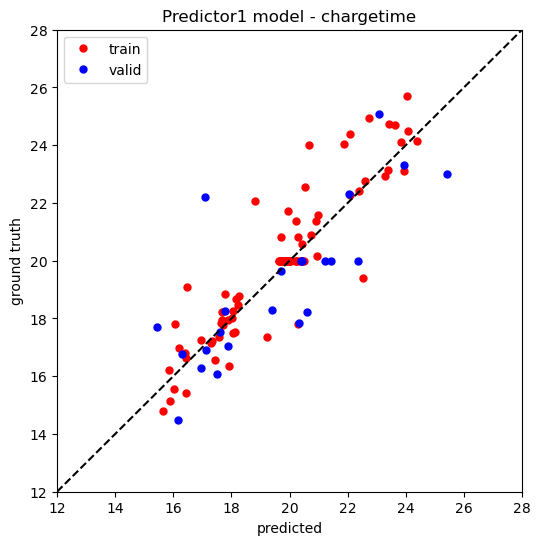

First 73 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Training set|RMSE: 53.34, MAPE: 0.05
Testing set|RMSE: 132.79, MAPE: 0.12


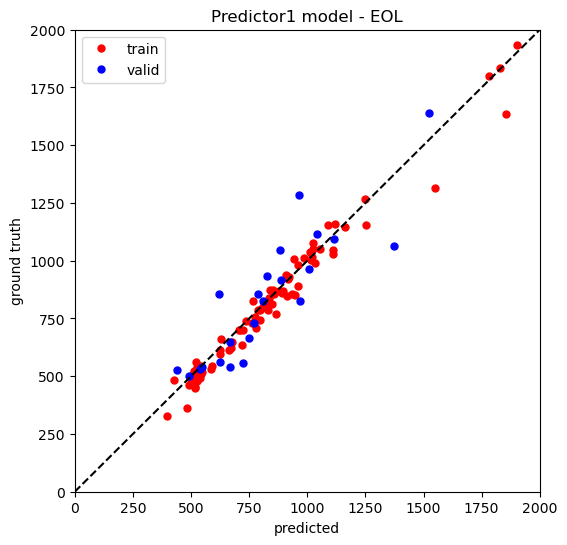

Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Training set|RMSE: 1.21, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


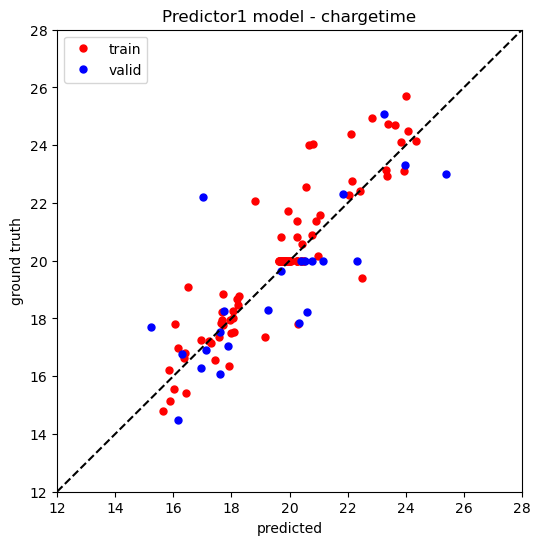

First 74 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Training set|RMSE: 51.91, MAPE: 0.05
Testing set|RMSE: 136.25, MAPE: 0.12


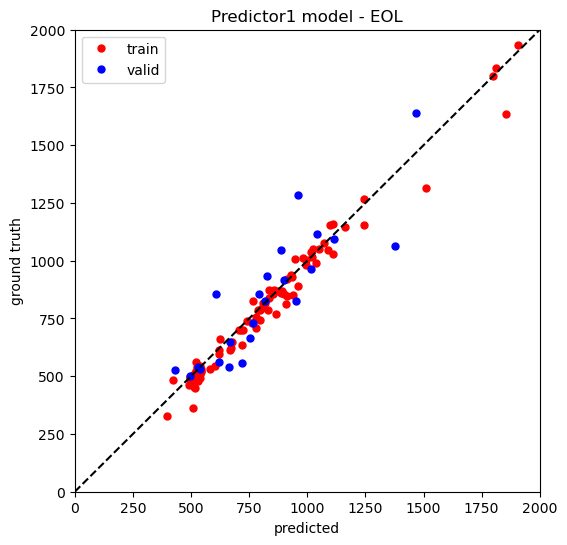

Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


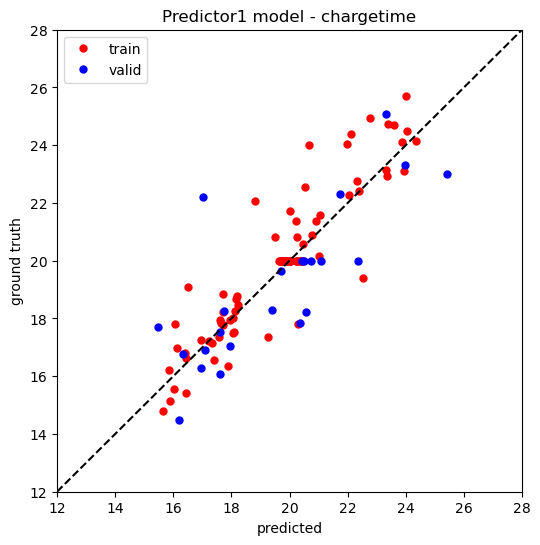

First 75 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Training set|RMSE: 51.85, MAPE: 0.05
Testing set|RMSE: 136.08, MAPE: 0.11


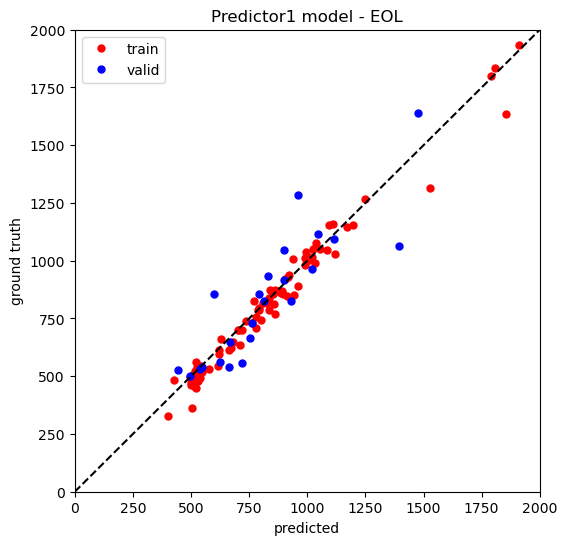

Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


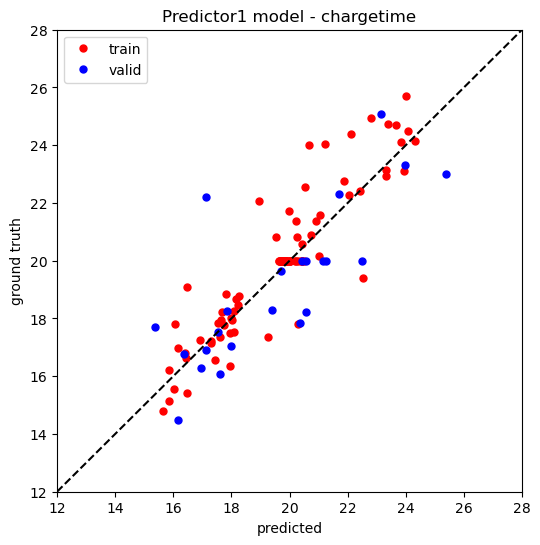

First 76 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Training set|RMSE: 51.82, MAPE: 0.05
Testing set|RMSE: 132.31, MAPE: 0.12


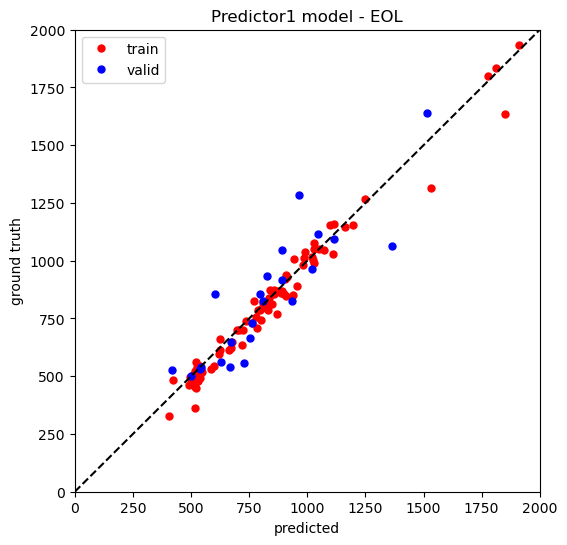

Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


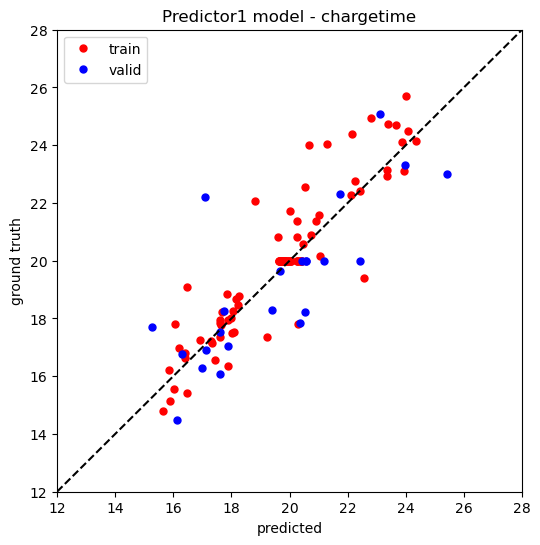

First 77 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Training set|RMSE: 52.52, MAPE: 0.05
Testing set|RMSE: 127.58, MAPE: 0.11


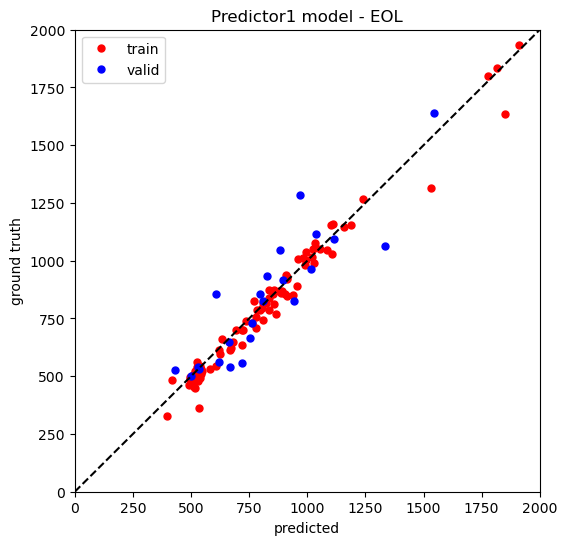

Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.76, MAPE: 0.07


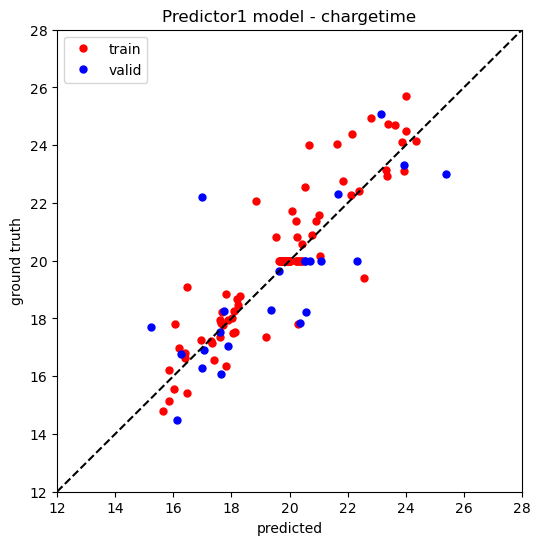

First 78 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Training set|RMSE: 52.86, MAPE: 0.05
Testing set|RMSE: 134.88, MAPE: 0.11


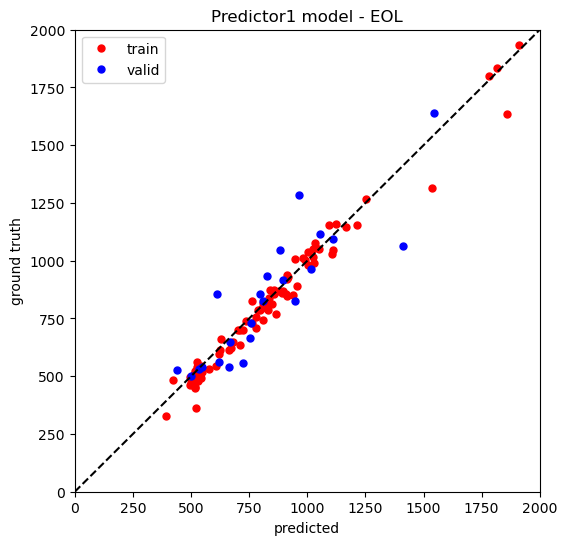

Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.76, MAPE: 0.07


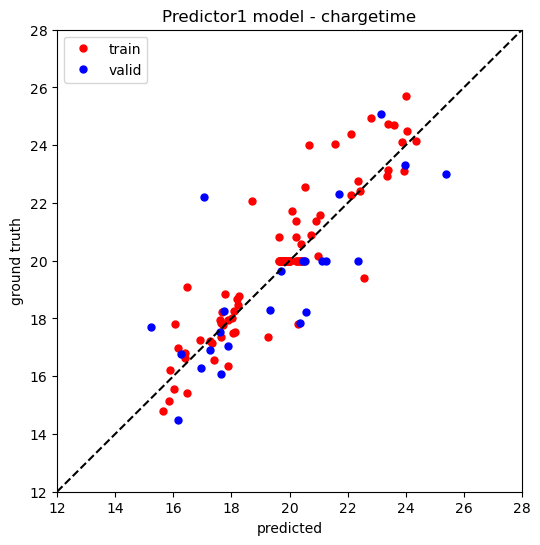

First 79 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Training set|RMSE: 53.03, MAPE: 0.05
Testing set|RMSE: 133.32, MAPE: 0.12


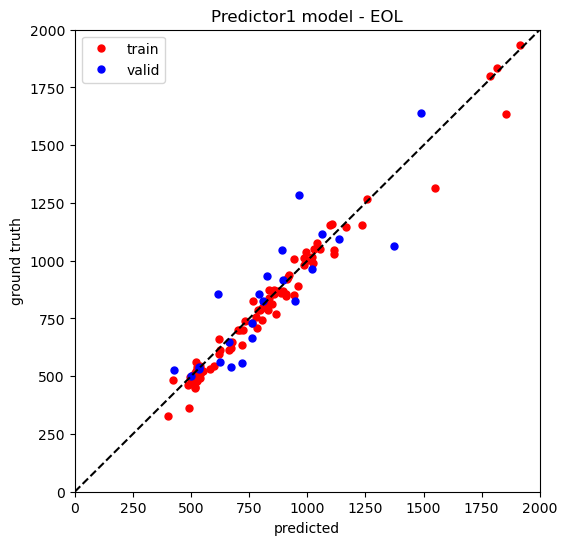

Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


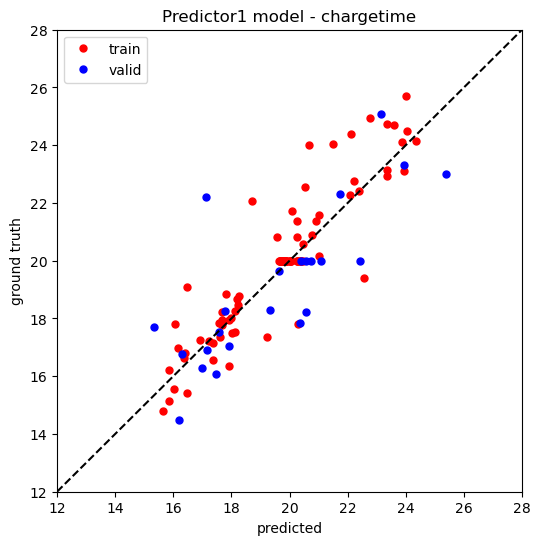

First 80 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Training set|RMSE: 52.33, MAPE: 0.05
Testing set|RMSE: 128.65, MAPE: 0.11


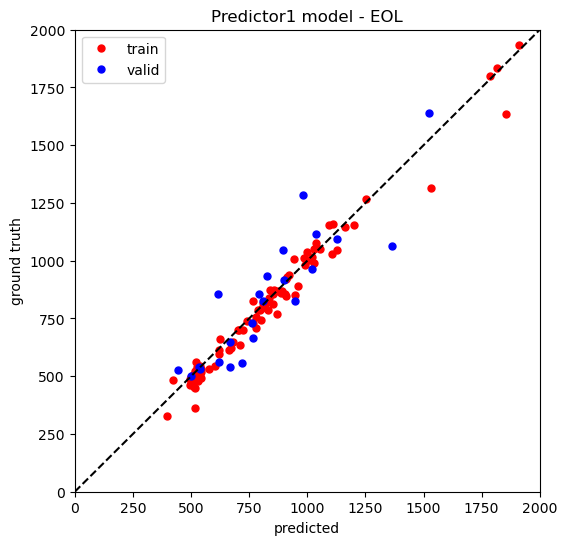

Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


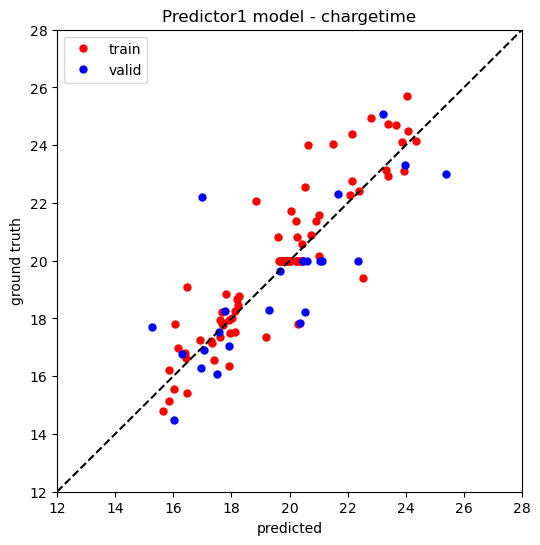

First 81 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Training set|RMSE: 52.69, MAPE: 0.05
Testing set|RMSE: 128.68, MAPE: 0.11


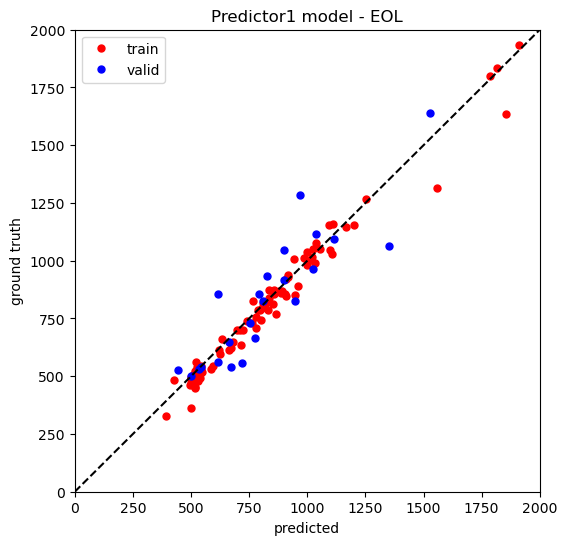

Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


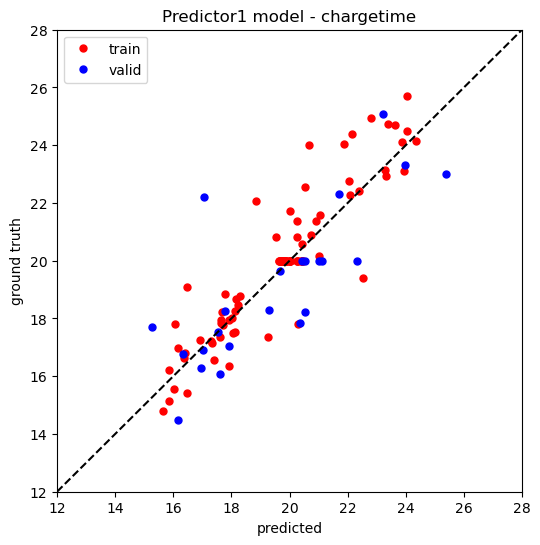

First 82 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Training set|RMSE: 51.24, MAPE: 0.05
Testing set|RMSE: 127.88, MAPE: 0.11


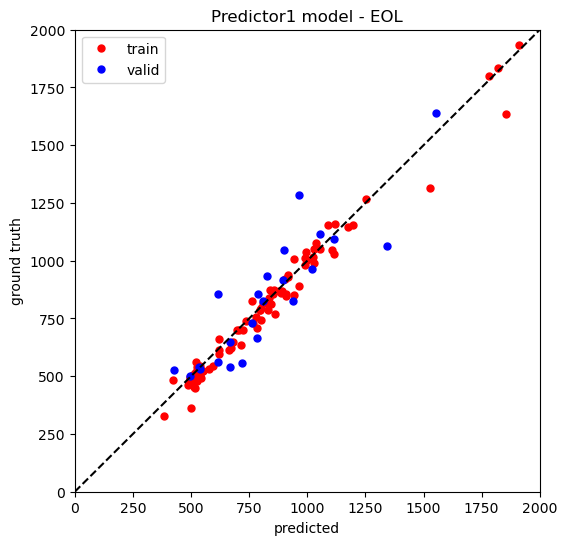

Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


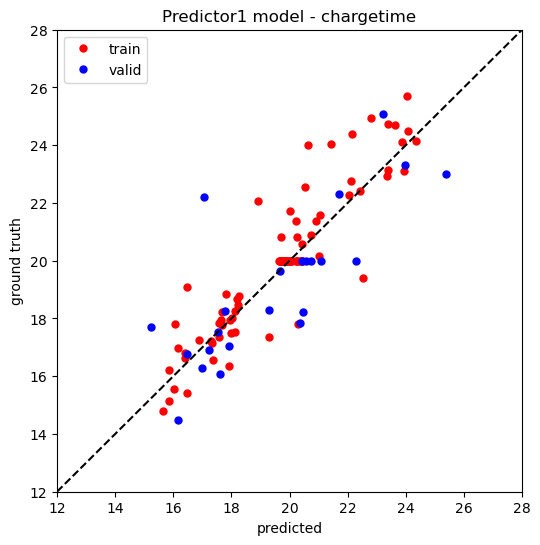

First 83 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Training set|RMSE: 52.03, MAPE: 0.05
Testing set|RMSE: 128.69, MAPE: 0.11


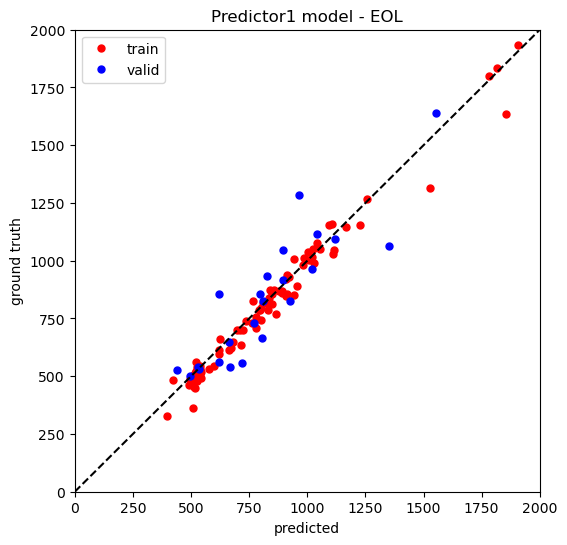

Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


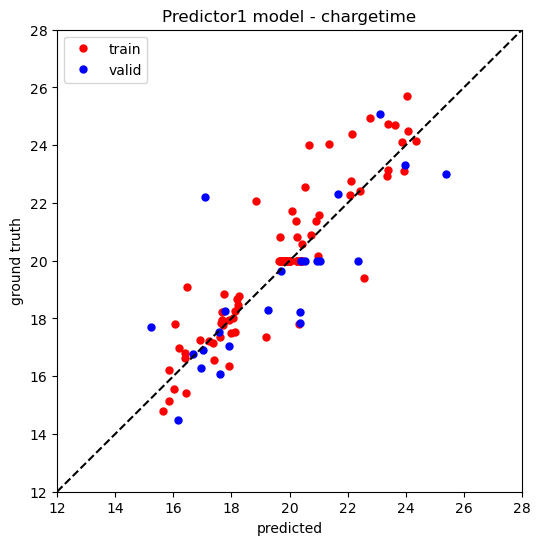

First 84 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Training set|RMSE: 52.20, MAPE: 0.05
Testing set|RMSE: 127.46, MAPE: 0.11


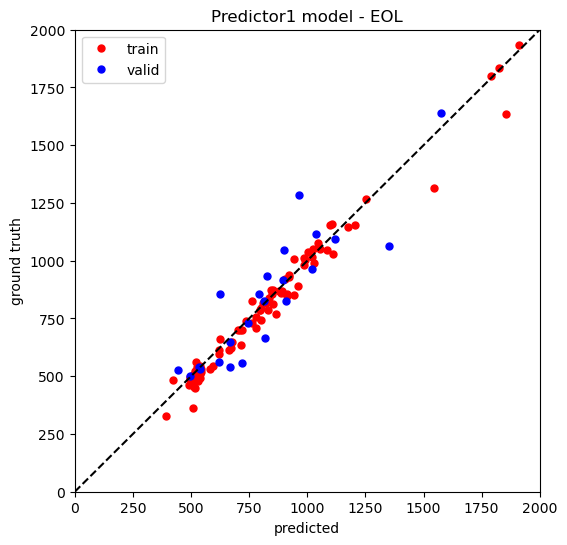

Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


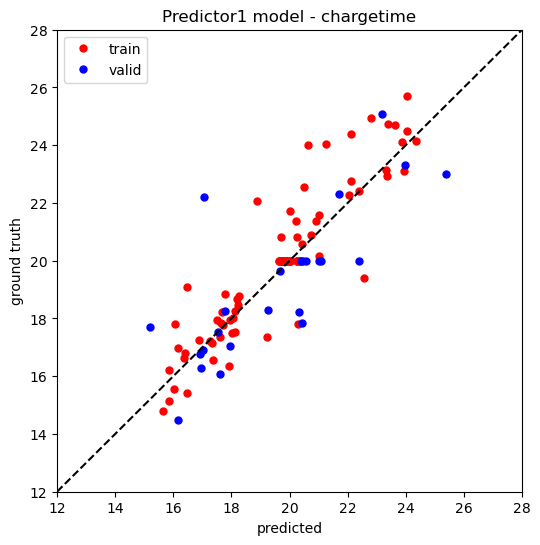

First 85 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Training set|RMSE: 51.75, MAPE: 0.05
Testing set|RMSE: 127.25, MAPE: 0.11


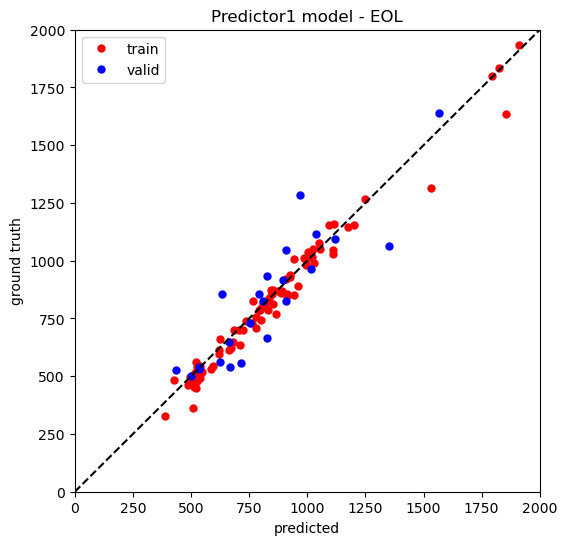

Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


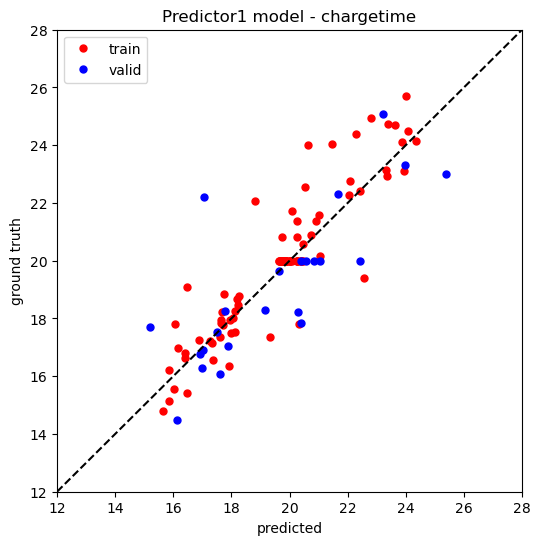

First 86 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Training set|RMSE: 52.04, MAPE: 0.05
Testing set|RMSE: 127.24, MAPE: 0.11


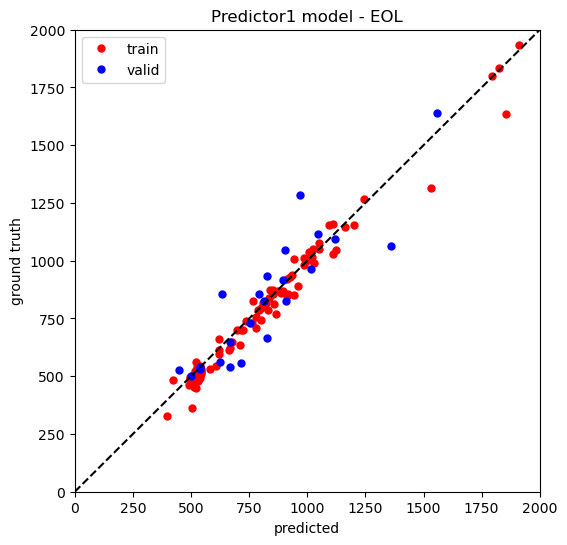

Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


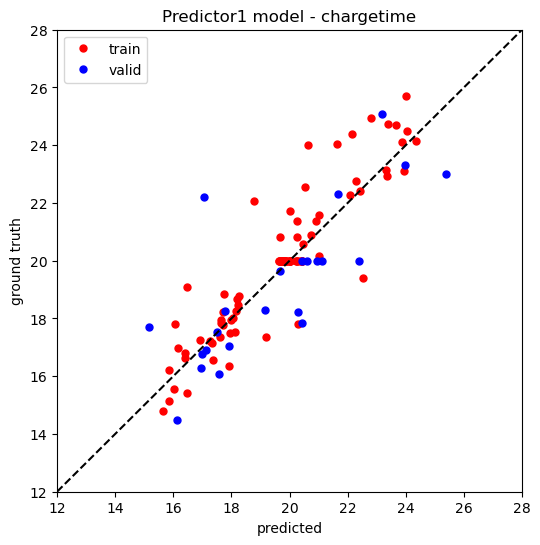

First 87 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Training set|RMSE: 52.45, MAPE: 0.05
Testing set|RMSE: 127.68, MAPE: 0.11


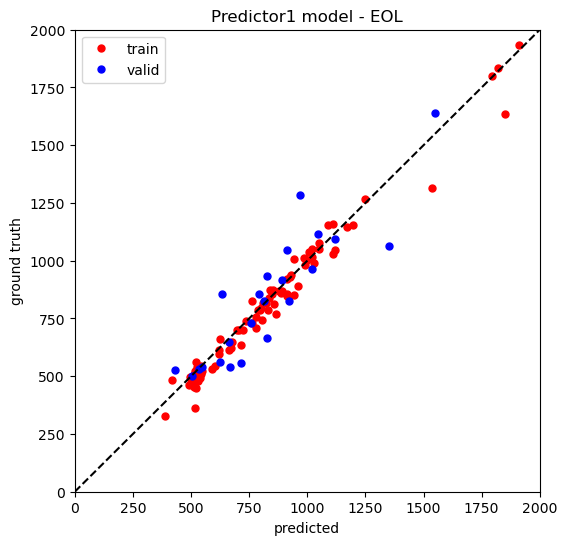

Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.73, MAPE: 0.07


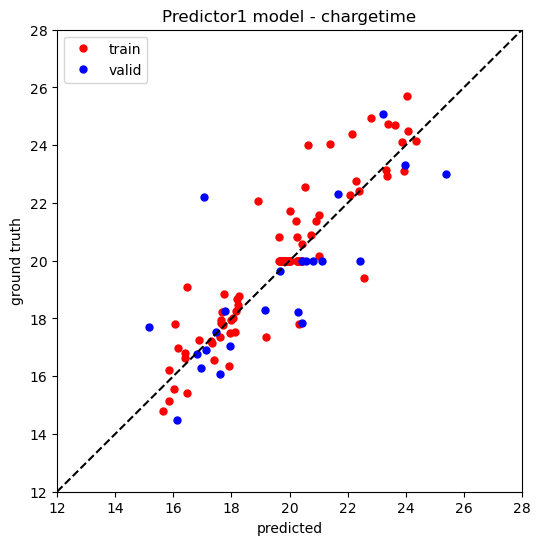

First 88 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Training set|RMSE: 52.95, MAPE: 0.05
Testing set|RMSE: 127.75, MAPE: 0.11


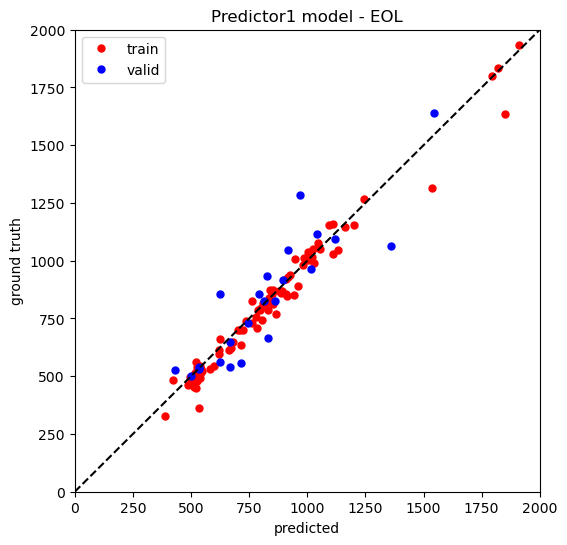

Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


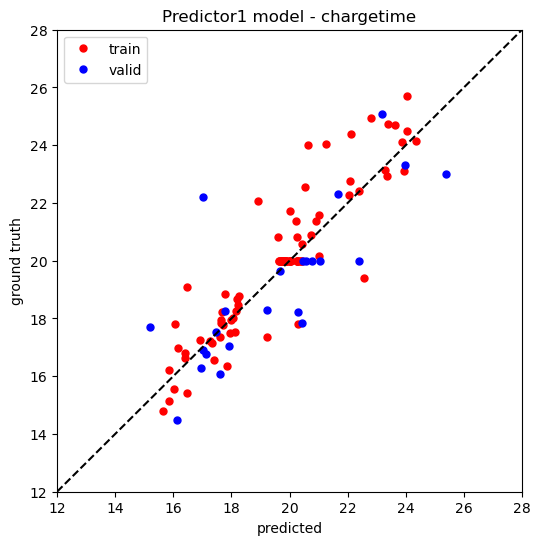

First 89 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Training set|RMSE: 52.97, MAPE: 0.05
Testing set|RMSE: 128.59, MAPE: 0.11


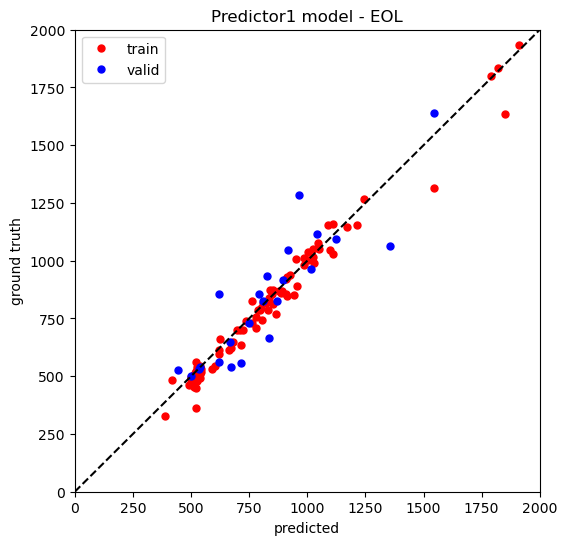

Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


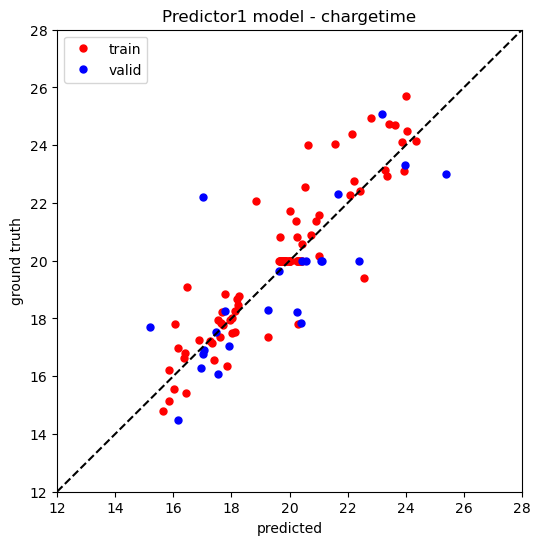

First 90 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Training set|RMSE: 52.51, MAPE: 0.05
Testing set|RMSE: 129.93, MAPE: 0.11


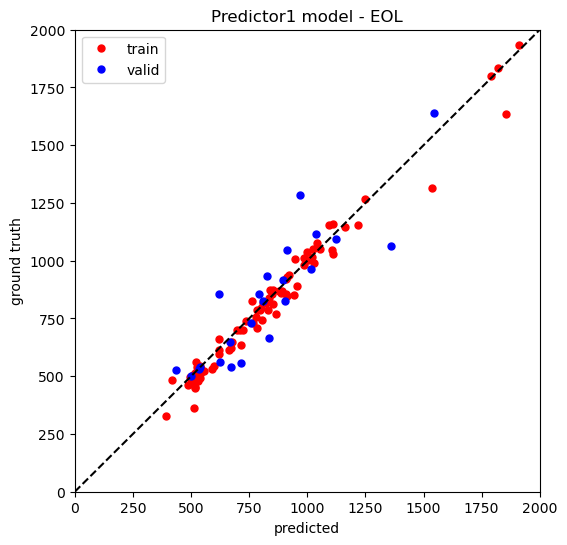

Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


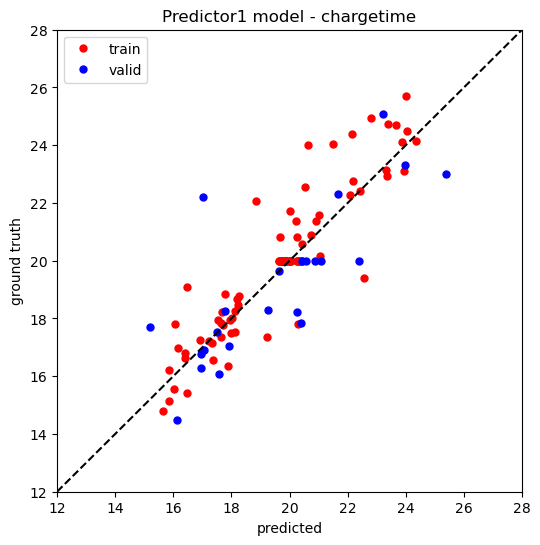

First 91 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Training set|RMSE: 52.54, MAPE: 0.05
Testing set|RMSE: 129.93, MAPE: 0.11


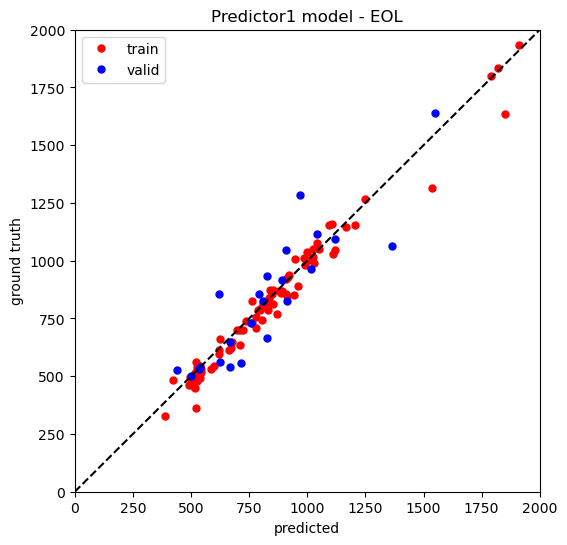

Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


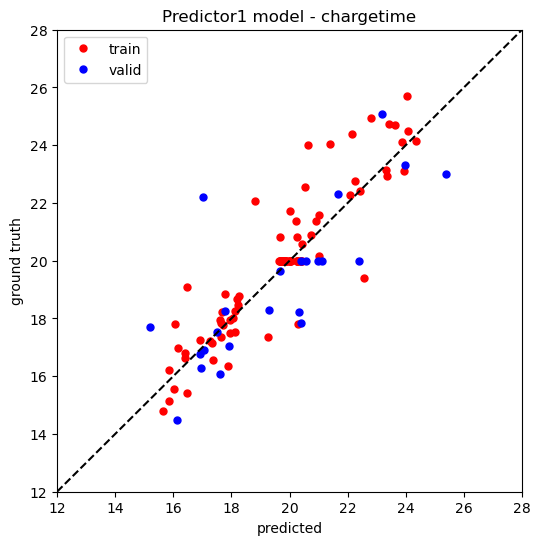

First 92 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Training set|RMSE: 51.95, MAPE: 0.05
Testing set|RMSE: 129.35, MAPE: 0.11


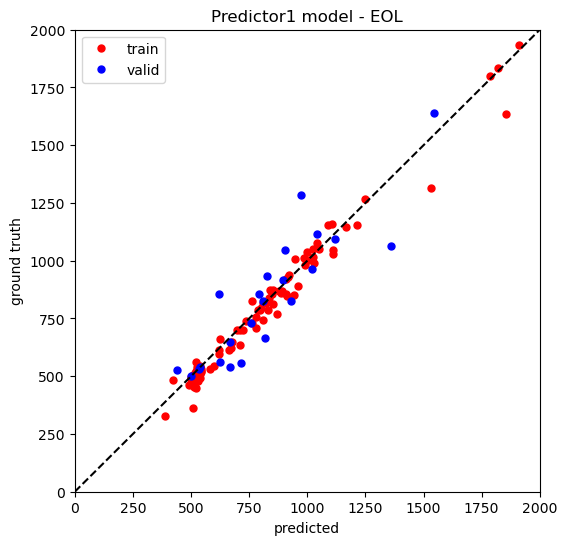

Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.75, MAPE: 0.07


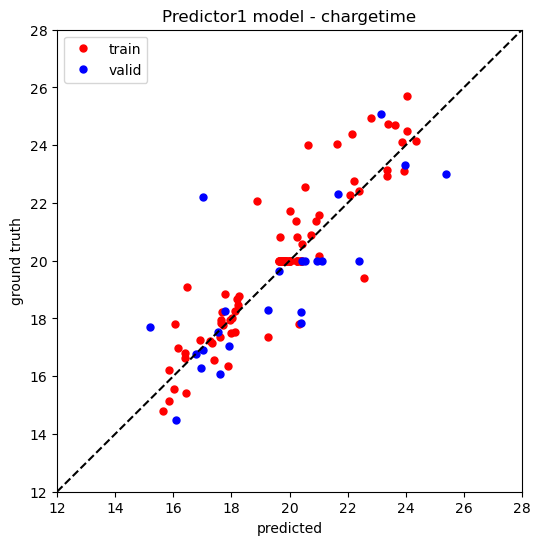

First 93 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Training set|RMSE: 52.04, MAPE: 0.05
Testing set|RMSE: 129.14, MAPE: 0.11


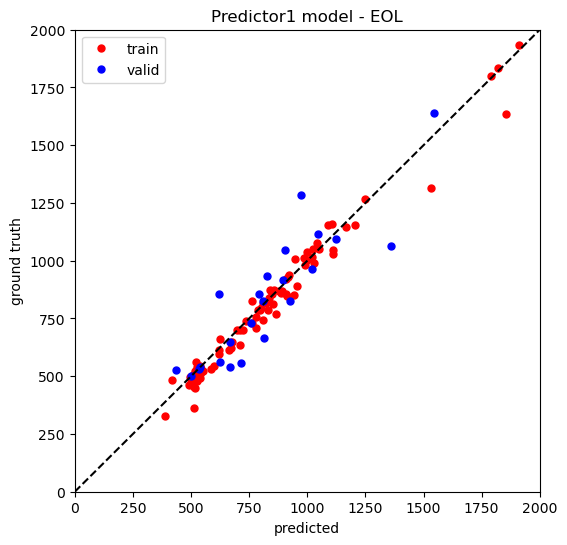

Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


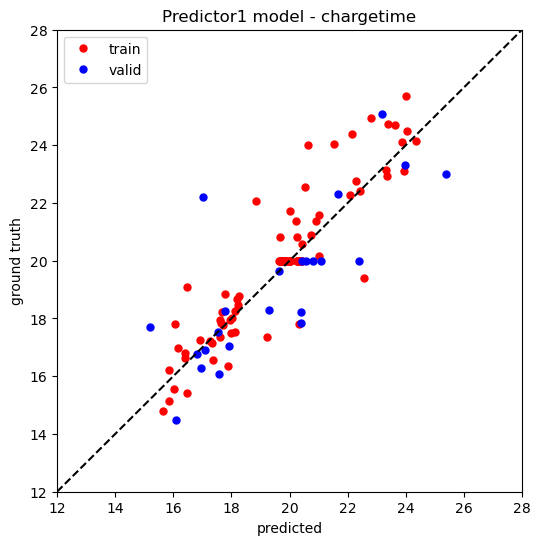

First 94 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Training set|RMSE: 52.34, MAPE: 0.05
Testing set|RMSE: 128.62, MAPE: 0.11


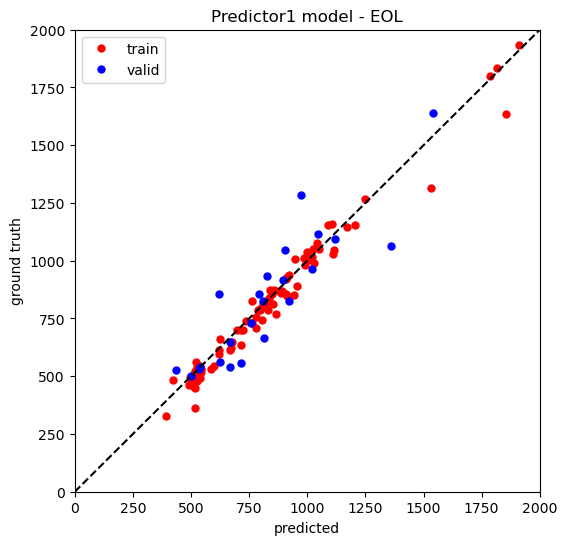

Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


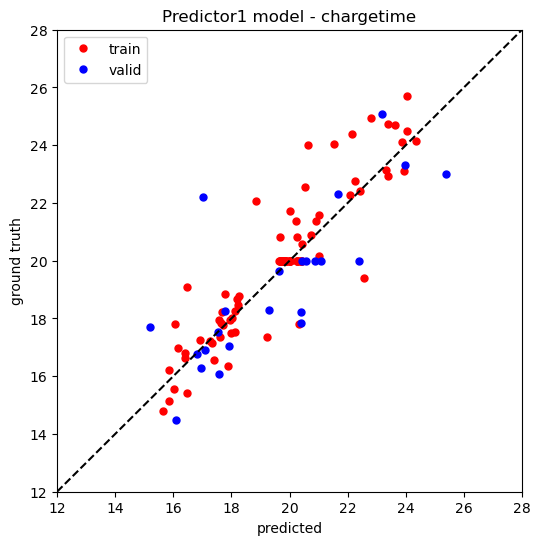

First 95 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Training set|RMSE: 52.14, MAPE: 0.05
Testing set|RMSE: 129.22, MAPE: 0.11


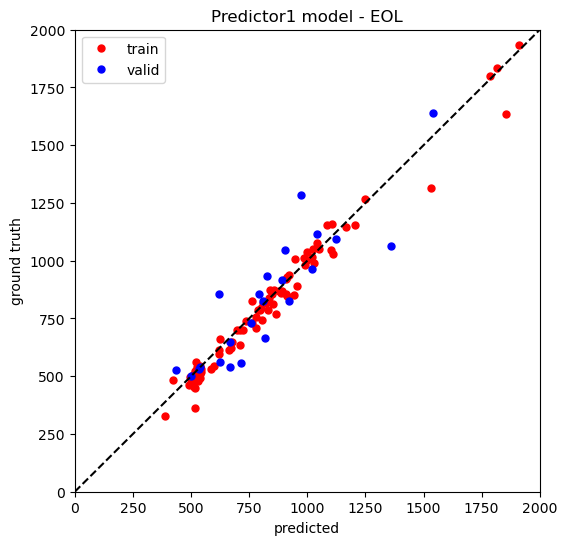

Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Training set|RMSE: 1.20, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


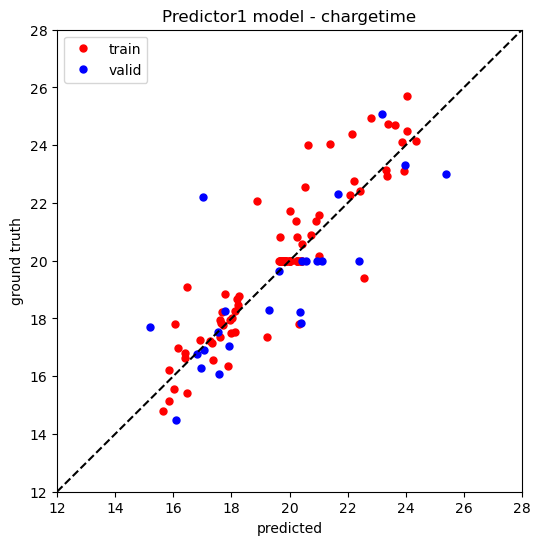

First 96 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Training set|RMSE: 52.02, MAPE: 0.05
Testing set|RMSE: 129.29, MAPE: 0.11


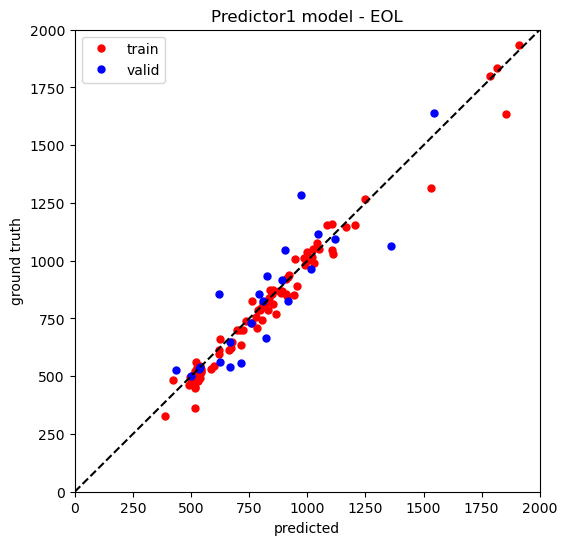

Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


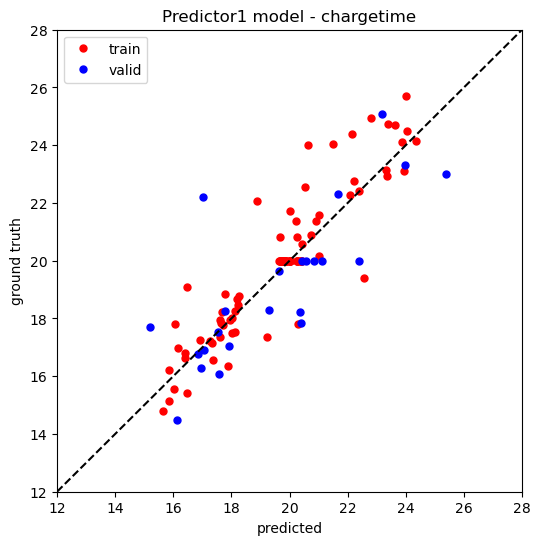

First 97 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Training set|RMSE: 52.22, MAPE: 0.05
Testing set|RMSE: 129.20, MAPE: 0.11


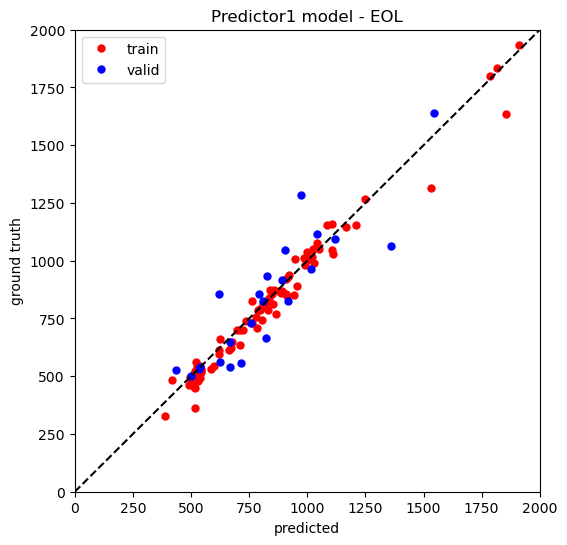

Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


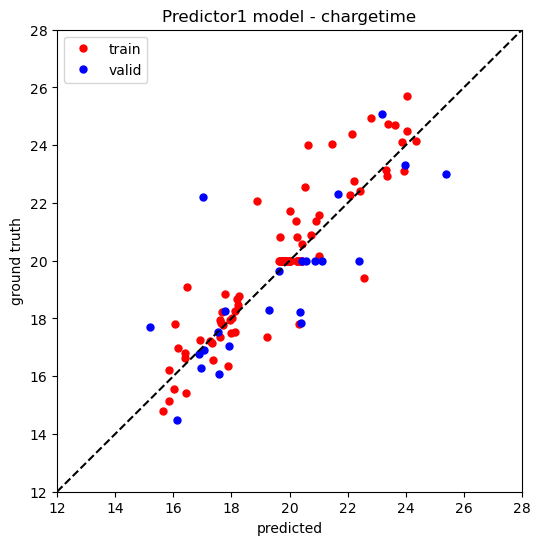

First 98 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Training set|RMSE: 52.18, MAPE: 0.05
Testing set|RMSE: 129.21, MAPE: 0.11


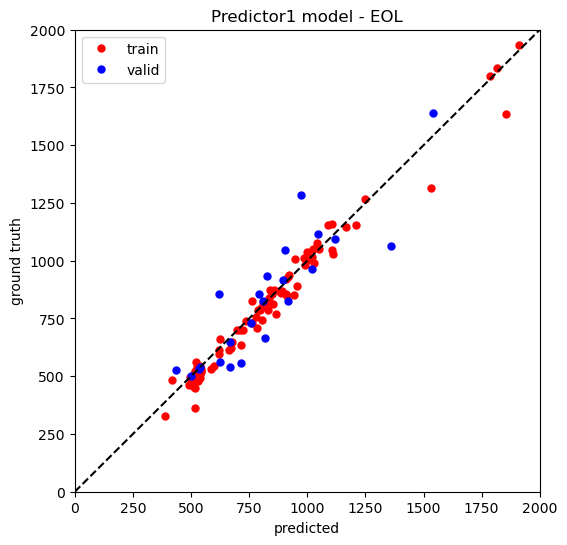

Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


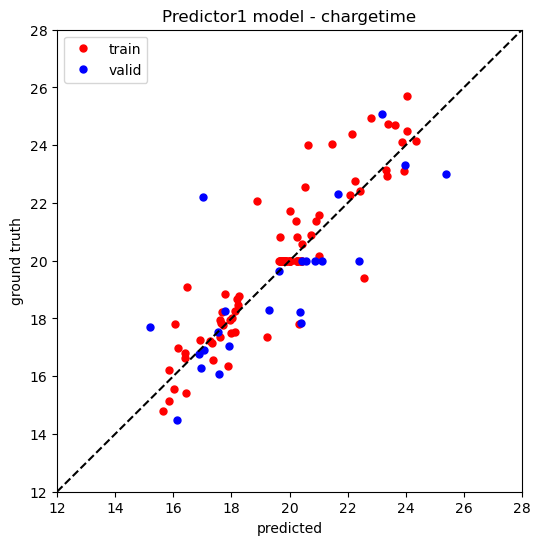

First 99 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Training set|RMSE: 52.14, MAPE: 0.05
Testing set|RMSE: 129.11, MAPE: 0.11


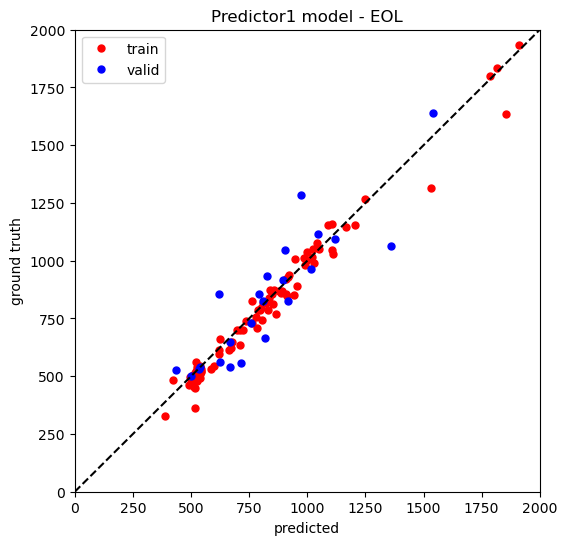

Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


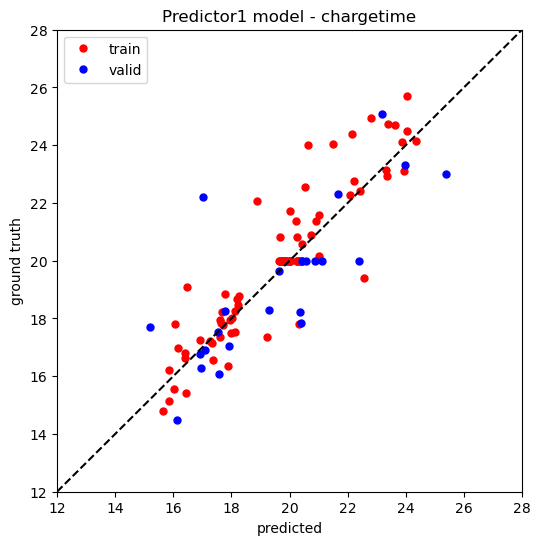

First 100 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Training set|RMSE: 52.15, MAPE: 0.05
Testing set|RMSE: 129.14, MAPE: 0.11


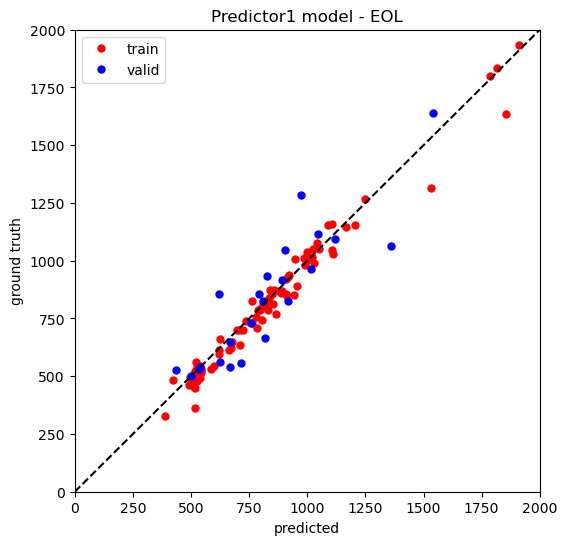

Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Training set|RMSE: 1.19, MAPE: 0.04
Testing set|RMSE: 1.74, MAPE: 0.07


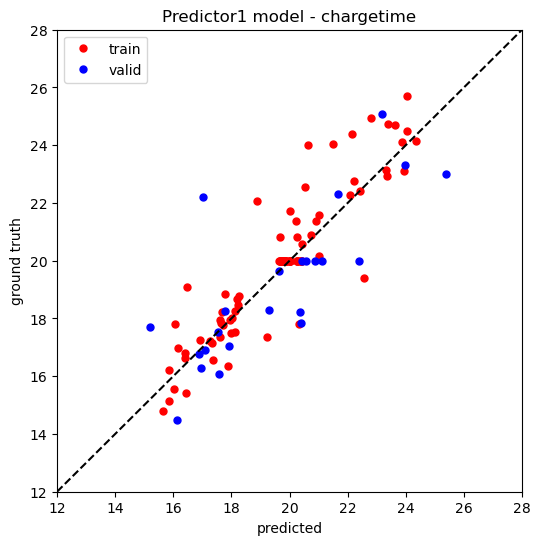

+----------------------------------------------------------+
All evaluation are done.


In [66]:
rmse_all = {'train_eol': [], 'train_ct': [], 'test_eol': [], 'test_ct': []}
predictor1_file = 'Model/predictor1_seed5_2.pth'
set_code = 'seed5'
for a in range(100):
    print(f'First {a+1} cycle data evaluation')
    print('+----------------------------------------------------------+')
    model = torch.load(predictor1_file)
    model.eval()
    _, test_eol_rmse = predictor1_eval(model, norm=True, cycle_used=a+1, file_tag='', set_code=set_code, pred_target='EOL')
    _, test_ct_rmse = predictor1_eval(model, norm=True, cycle_used=a+1, file_tag='', set_code=set_code, pred_target='chargetime')
    rmse_all['test_eol'].append(test_eol_rmse)
    rmse_all['test_ct'].append(test_ct_rmse)

print('+----------------------------------------------------------+')
print('All evaluation are done.')

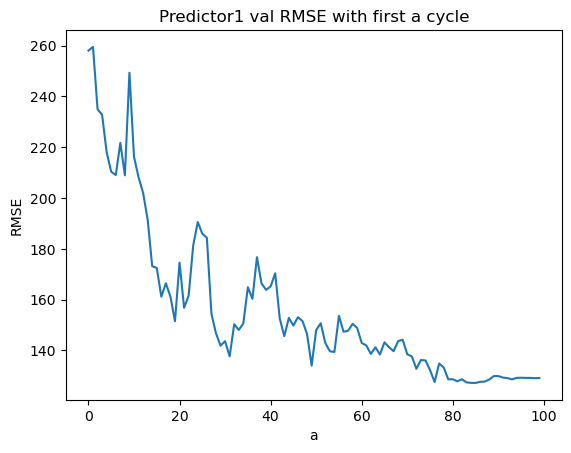

In [71]:
plt.figure()
plt.plot(rmse_all['test_eol'])
plt.title('Predictor1 val RMSE with first a cycle')
plt.xlabel('a')
plt.ylabel('RMSE')
plt.show()

# 每個batch分開split

In [4]:
# 分過一次就不要再分了
seed = 3
set_code = 'state3'
train_val_split_by_batch(train_ratio=0.8, seed=seed, set_code=set_code)

Number of cells in b1: 33
Number of cells in b2: 39
Number of cells in b3: 43
Discharge curve feature shape: (9100, 4, 500)
Charge curve feature shape: (9100, 4, 500)
Target shape: (9100, 2)
Summary shape: (91, 6, 100)


DimReduct1 is training
First 100 cycles are being used
Feature shape: (9100, 4, 500)
Target shape: (9100, 2)
First 100 cycles are being used
Feature shape: (2400, 4, 500)
Target shape: (2400, 2)
cuda is available
Validation loss decreased (inf --> 46199.345866).  Saving model ...
Validation loss decreased (46199.345866 --> 30415.922811).  Saving model ...
EarlyStopping counter: 1 out of 50
Validation loss decreased (30415.922811 --> 29664.485758).  Saving model ...
EarlyStopping counter: 1 out of 50
Validation loss decreased (29664.485758 --> 26572.783732).  Saving model ...
EarlyStopping counter: 1 out of 50
EarlyStopping counter: 2 out of 50
EarlyStopping counter: 3 out of 50
EarlyStopping counter: 4 out of 50
EarlyStopping counter: 5 out of 50
EarlyStopping counter: 6 out of 50
EarlyStopping counter: 7 out of 50
EarlyStopping counter: 8 out of 50
EarlyStopping counter: 9 out of 50
EarlyStopping counter: 10 out of 50
EarlyStopping counter: 11 out of 50
EarlyStopping counter: 12 out o

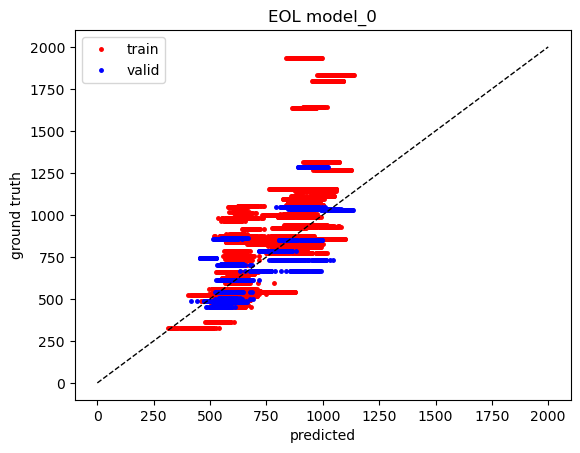

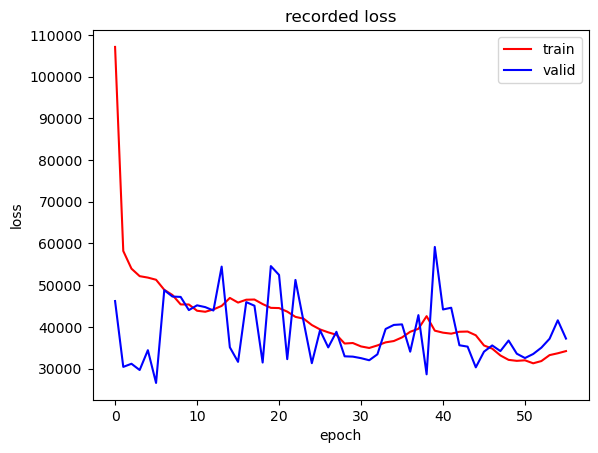

In [16]:
################### Check file path #####################
seed = 3
set_code = 'state3'
model_num = 'trial2'
#########################################################

##########DimReduct1###########
print('DimReduct1 is training')
# load dataset
batch_size=50

eol_train_dataset = DimReduction_dataset(train=True, pred_target='EOL', norm=True, cycle_used=100, set_code=set_code)
eol_test_dataset = DimReduction_dataset(train=False, pred_target='EOL', norm=True, cycle_used=100, set_code=set_code)

eol_train_loader = DataLoader(eol_train_dataset, batch_size=batch_size, shuffle=True)
eol_test_loader = DataLoader(eol_test_dataset, batch_size=batch_size, shuffle=True)

# load model
model_eol = DimReduction_1(in_ch=4, out_ch=1).cuda()

dimreduct1_model, eol_train_loss, eol_valid_loss = dimreduct1_train(model_eol, eol_train_loader, eol_test_loader,
                                                                    patience=50,
                                                                    lr=1e-2,
                                                                    cosine_period=10,
                                                                    min_lr=1e-06,
                                                                    weight_decay=8e-3,
                                                                    state_dict_path=set_code+model_num)

dimreduct1_file = 'Model/dimreduct1_'+set_code+model_num+'.pth'
torch.save(dimreduct1_model, dimreduct1_file)
print('Dimreduct1 saved path: '+dimreduct1_file)
print('DimReduct1 training is done.')

dimreduct1_eval(model_eol, set_code=set_code)

loss_plot(eol_train_loss, eol_valid_loss)
##########DimReduct1###########

cuda is available
First 100 cycles are being used
Feature shape: (9100, 4, 500)
Target shape: (9100, 2)
First 100 cycles are being used
Feature shape: (2400, 4, 500)
Target shape: (2400, 2)
Training set|RMSE: 150.80, MAPE: 0.17
Testing set|RMSE: 143.85, MAPE: 0.19


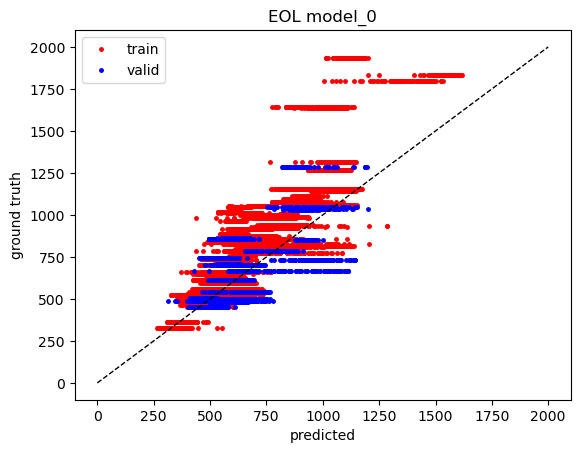

In [17]:
dimreduct1_eval(torch.load('State_dict_dimreduct1/state3trial2/epoch50'), set_code='state3')

DimReduct2 is training
First 100 cycles are being used
Feature shape: (9100, 4, 500)
Target shape: (9100, 2)
First 100 cycles are being used
Feature shape: (2400, 4, 500)
Target shape: (2400, 2)
cuda is available
Validation loss decreased (inf --> 11.177276).  Saving model ...
Validation loss decreased (11.177276 --> 9.142282).  Saving model ...
Validation loss decreased (9.142282 --> 7.636113).  Saving model ...
EarlyStopping counter: 1 out of 30
Validation loss decreased (7.636113 --> 7.200023).  Saving model ...
EarlyStopping counter: 1 out of 30
EarlyStopping counter: 2 out of 30
EarlyStopping counter: 3 out of 30
EarlyStopping counter: 4 out of 30
EarlyStopping counter: 5 out of 30
EarlyStopping counter: 6 out of 30
EarlyStopping counter: 7 out of 30
EarlyStopping counter: 8 out of 30
EarlyStopping counter: 9 out of 30
EarlyStopping counter: 10 out of 30
EarlyStopping counter: 11 out of 30
Validation loss decreased (7.200023 --> 6.288412).  Saving model ...
EarlyStopping counter: 

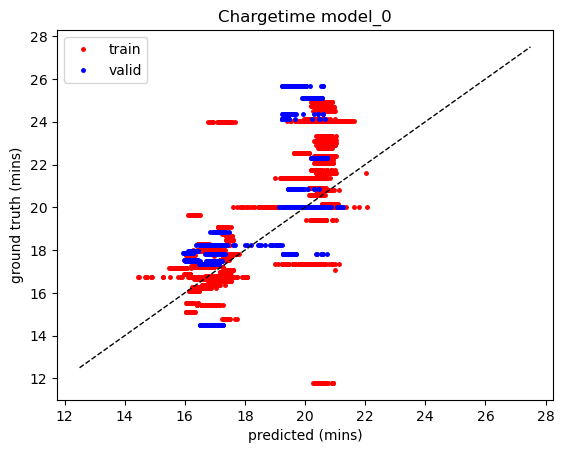

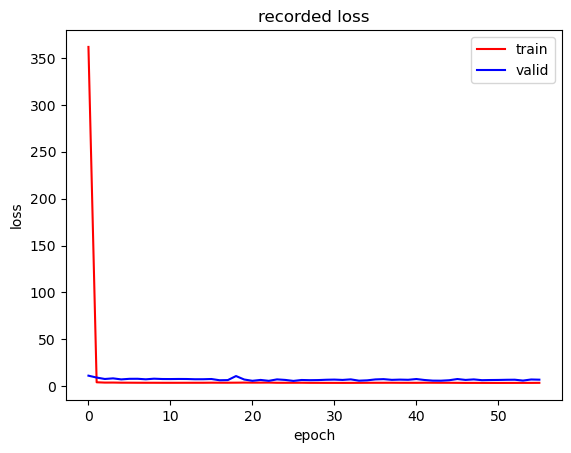

In [6]:
##########DimReduct2###########
set_code = 'state3'

print('DimReduct2 is training')
# load dataset
batch_size=50

ct_train_dataset = DimReduction_dataset(train=True, pred_target='chargetime', norm=True, cycle_used=100, set_code=set_code)
ct_test_dataset = DimReduction_dataset(train=False, pred_target='chargetime', norm=True, cycle_used=100, set_code=set_code)

ct_train_loader = DataLoader(ct_train_dataset, batch_size=batch_size, shuffle=True)
ct_test_loader = DataLoader(ct_test_dataset, batch_size=batch_size, shuffle=True)

# load model
model_ct = DimReduction_2(in_ch=4, out_ch=1).cuda()

dimreduct2_model, ct_train_loss, ct_valid_loss = dimreduct2_train(model_ct, ct_train_loader, ct_test_loader, 
                                                                    patience=30,
                                                                    lr=2e-2,
                                                                    cosine_period=10,
                                                                    min_lr=1.6e-6,
                                                                    weight_decay=3*1e-5,
                                                                    state_dict_path=set_code)

dimreduct2_file = 'Model/dimreduct2_'+set_code+'.pth'
torch.save(dimreduct2_model, dimreduct2_file)
print('Dimreduct2 saved path: '+dimreduct2_file)
print('DimReduct2 training is done.')

dimreduct2_eval(model_ct, set_code=set_code)

loss_plot(ct_train_loss, ct_valid_loss)
##########DimReduct2###########

First 100 cycles are being used
Feature shape: (9100, 4, 500)
Target shape: (9100, 2)
First 100 cycles are being used
Feature shape: (2400, 4, 500)
Target shape: (2400, 2)
First 100 cycles are being used
Feature shape: (9100, 4, 500)
Target shape: (9100, 2)
First 100 cycles are being used
Feature shape: (2400, 4, 500)
Target shape: (2400, 2)
EOL RMSE of all data: 204.35973
CT RMSE of all data: 2.03255
(91, 8, 100) (91, 2)
(24, 8, 100) (24, 2)
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
cuda is available
[Epoch 1/500] train_loss: 111.804, valid_loss: 148.917
....train_rmse: 281.49, valid_rmse: 199.61
Validation loss decreased (inf --> 148.916992).  Saving model ...
[Epoch 2/500] train_loss: 43.869, valid_loss: 190.545
....train_rmse: 205.26, valid_rmse: 238.07
EarlyStopping counter: 1 out of 50
[Epoch 3/500] train_loss: 41.175, valid_loss: 150.676
....train_rmse: 177.65, valid_rmse: 224.08
EarlyStopping counter: 2 out of 50
[Epoch 4/500] train_loss: 38.692

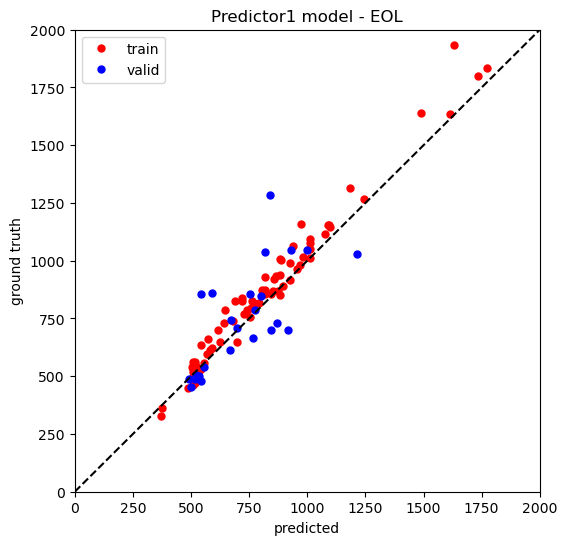

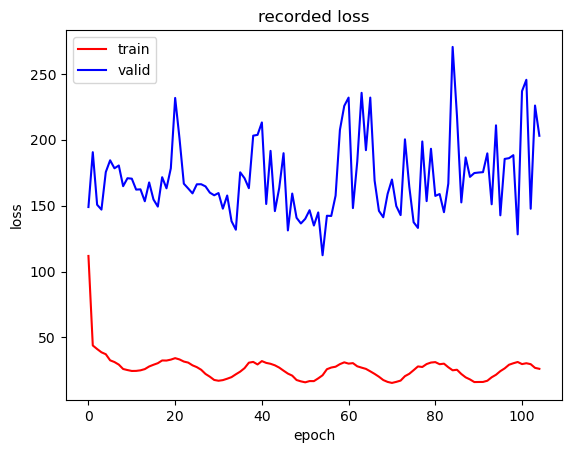

In [21]:
################### Check file path #####################
set_code = 'state3'
model_num = 'md6'
file_tag = 'dim1trial2e50'
dimreduct1_path = 'State_dict_dimreduct1/state3trial2/epoch50'
dimreduct2_path = 'Model/dimreduct2_'+set_code+'.pth'
########################################################

##########Predictor1###########
dataset_preprocessing_Predictor1(cycle_used=100,
                                    dimreduct1_path=dimreduct1_path,
                                    dimreduct2_path=dimreduct2_path,
                                    set_code=set_code,
                                    file_tag=file_tag)
# load dataset
train_dataset = Predictor1_dataset(train=True, norm=True, eval=False, padding=True, set_code=set_code, file_tag=file_tag)
test_dataset = Predictor1_dataset(train=False, norm=True, eval=True, padding=True, set_code=set_code, file_tag=file_tag)

train_loader = DataLoader(train_dataset, batch_size=50, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=24, shuffle=True)

# load model
model = Predictor_1(in_ch=8, out_ch=1, drop=0.4).cuda()

model, train_loss, valid_loss = predictor1_train(model, train_loader, test_loader,
                                                    patience=50,
                                                    lr=1e-2,
                                                    cosine_period=10,
                                                    min_lr=5e-07,
                                                    weight_decay=0.1,
                                                    loss_func='L1',
                                                    state_dict_path=set_code+model_num)

predictor1_file = 'Model/predictor1_'+set_code+model_num+'.pth'
torch.save(model, predictor1_file)
print('Predictor1 saved path: '+predictor1_file)
print('Predictor1 training is done.')

predictor1_eval(model, cycle_used=100, train_batch_size=91, test_batch_size=24, set_code=set_code, file_tag=file_tag)
loss_plot(train_loss, valid_loss)
##########Predictor1###########

Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 9.64, MAPE: 0.01
Testing set|RMSE: 213.62, MAPE: 0.20


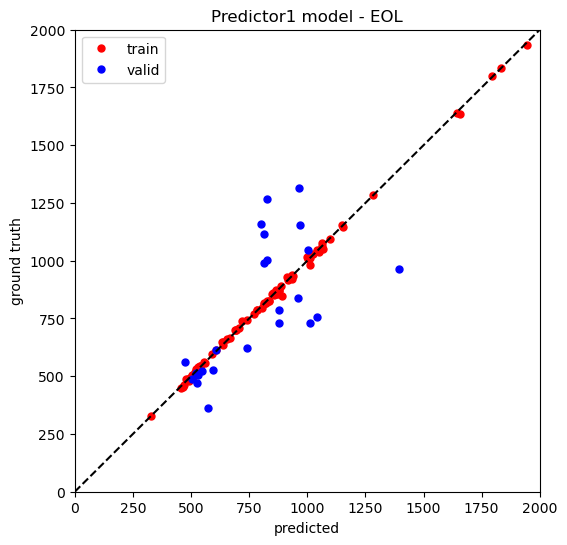

(9.636431694030762, 213.61985778808594)

In [18]:
predictor1_eval(torch.load('Model/predictor1_state1md1.pth'), cycle_used=100, train_batch_size=91, test_batch_size=24, set_code='state1', file_tag='state1')

First 1 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 47.19, MAPE: 0.04
Testing set|RMSE: 129.09, MAPE: 0.13


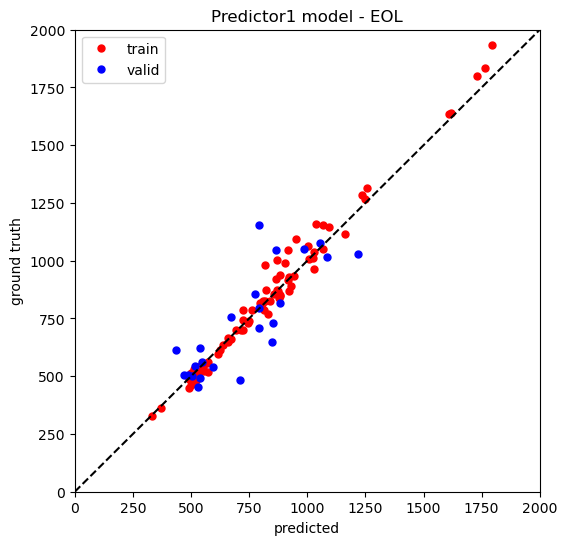

Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 1 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.86, MAPE: 0.03
Testing set|RMSE: 1.95, MAPE: 0.06


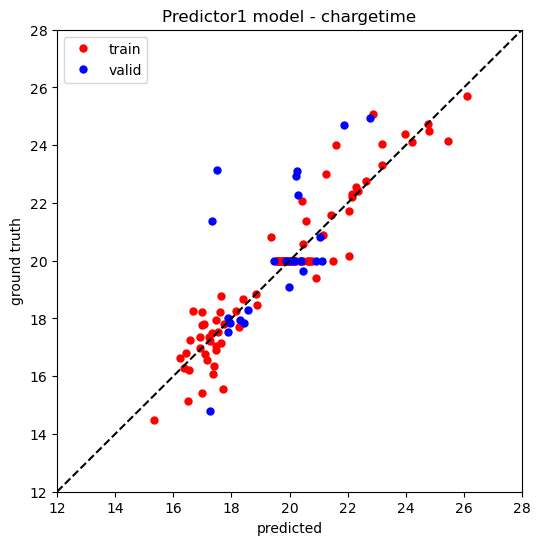

First 2 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 35.36, MAPE: 0.03
Testing set|RMSE: 124.04, MAPE: 0.13


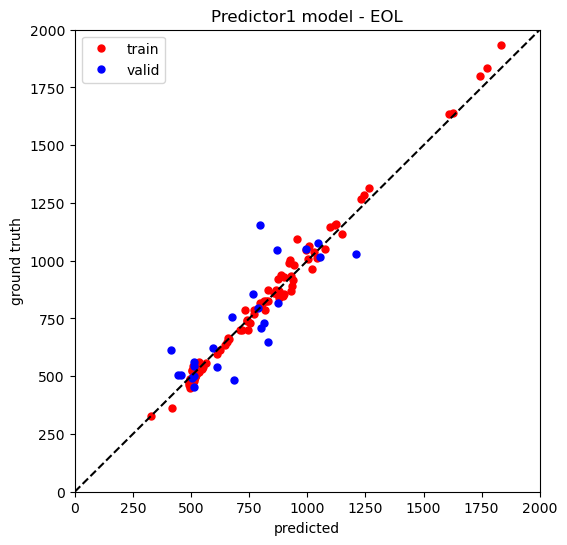

Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 2 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.80, MAPE: 0.03
Testing set|RMSE: 1.83, MAPE: 0.06


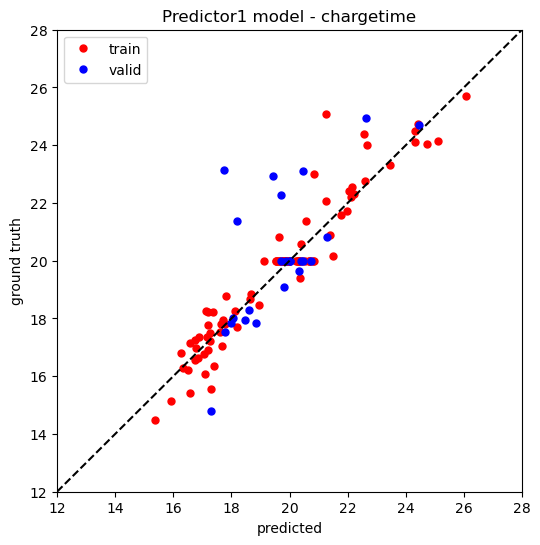

First 3 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 33.93, MAPE: 0.03
Testing set|RMSE: 121.24, MAPE: 0.12


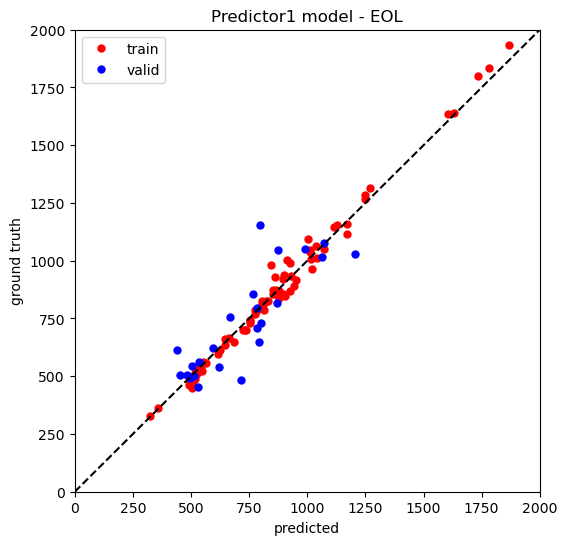

Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 3 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.84, MAPE: 0.03
Testing set|RMSE: 1.92, MAPE: 0.06


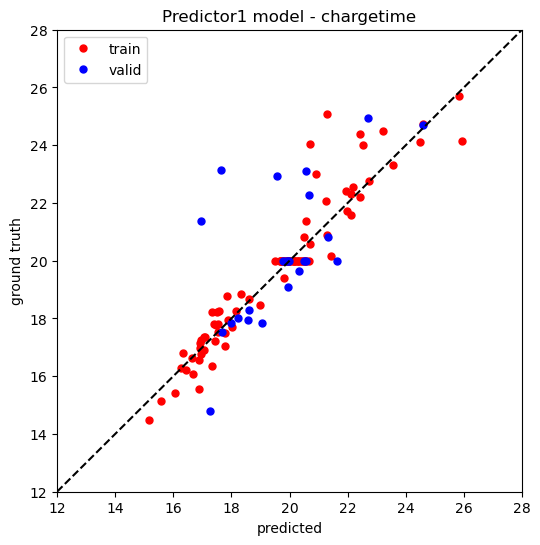

First 4 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.22, MAPE: 0.03
Testing set|RMSE: 129.15, MAPE: 0.14


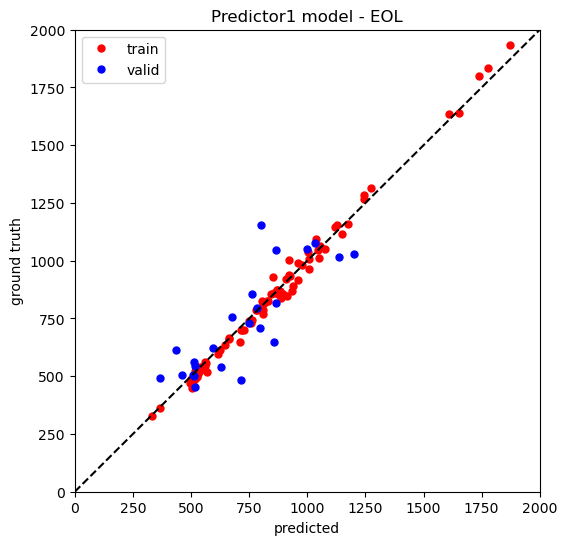

Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 4 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.73, MAPE: 0.02
Testing set|RMSE: 2.21, MAPE: 0.07


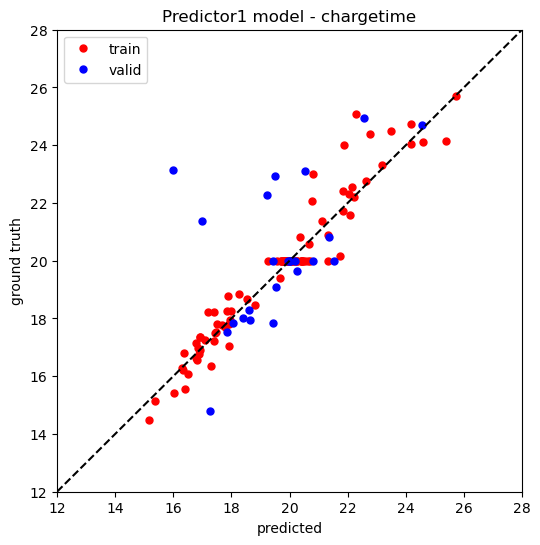

First 5 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 34.64, MAPE: 0.03
Testing set|RMSE: 118.72, MAPE: 0.12


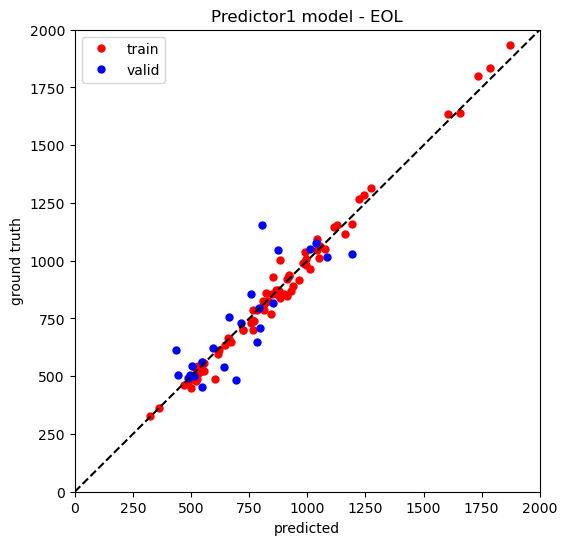

Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 5 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.87, MAPE: 0.03
Testing set|RMSE: 2.00, MAPE: 0.06


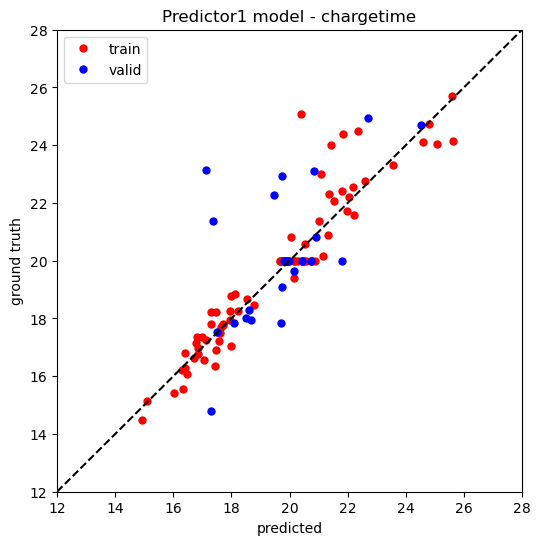

First 6 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 34.08, MAPE: 0.03
Testing set|RMSE: 129.07, MAPE: 0.13


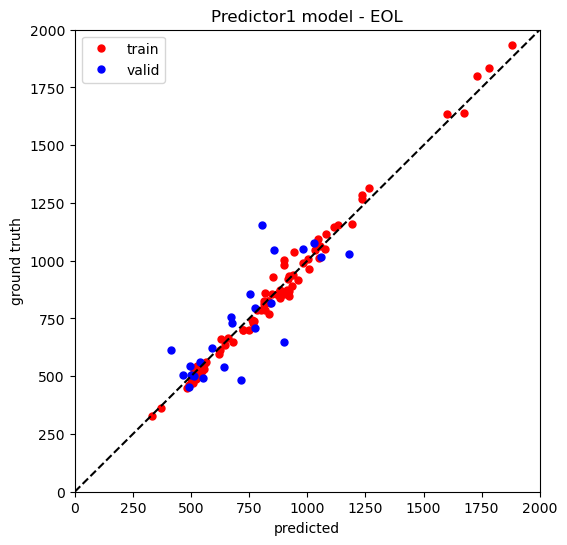

Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 6 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.86, MAPE: 0.03
Testing set|RMSE: 2.07, MAPE: 0.07


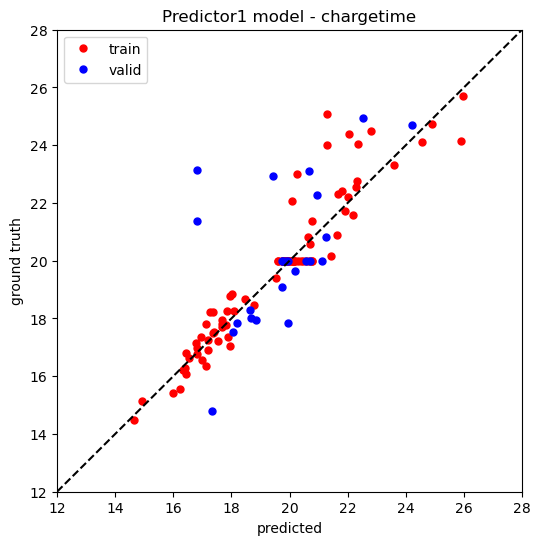

First 7 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 31.85, MAPE: 0.03
Testing set|RMSE: 125.47, MAPE: 0.13


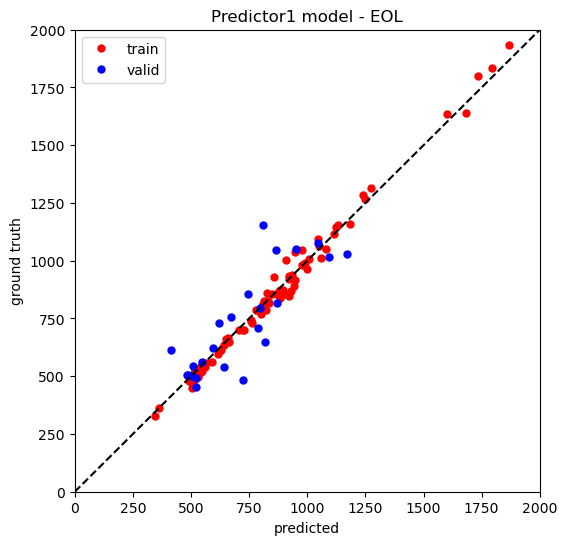

Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 7 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.77, MAPE: 0.02
Testing set|RMSE: 2.06, MAPE: 0.06


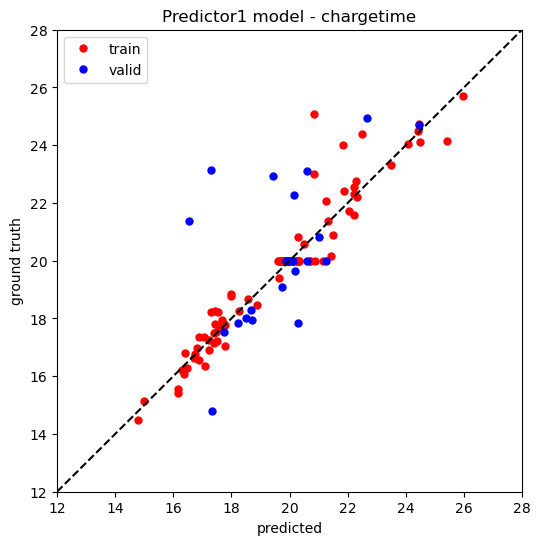

First 8 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.08, MAPE: 0.03
Testing set|RMSE: 125.55, MAPE: 0.13


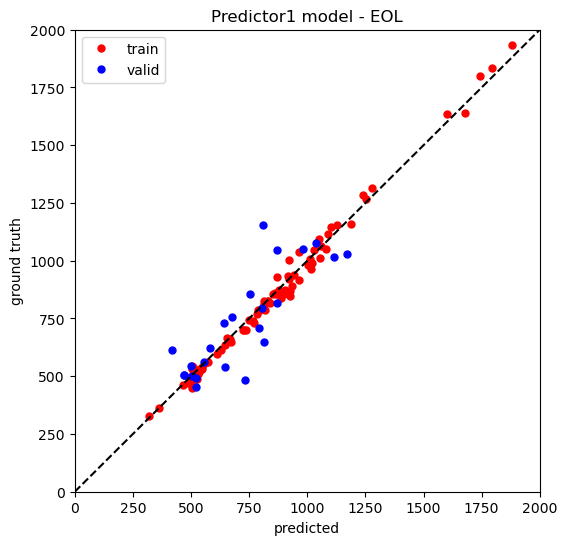

Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 8 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.81, MAPE: 0.03
Testing set|RMSE: 2.14, MAPE: 0.07


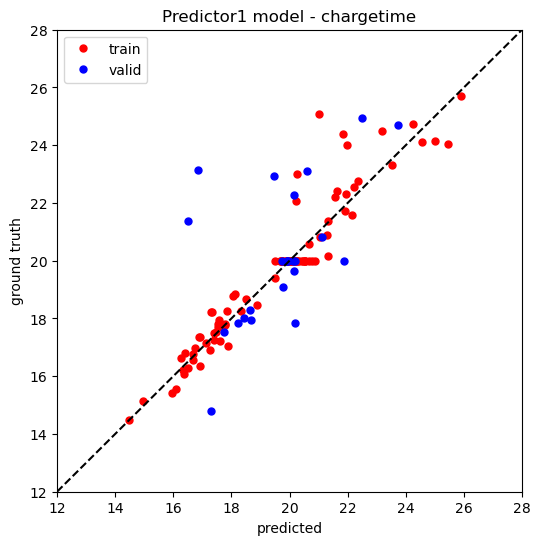

First 9 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.84, MAPE: 0.03
Testing set|RMSE: 128.89, MAPE: 0.13


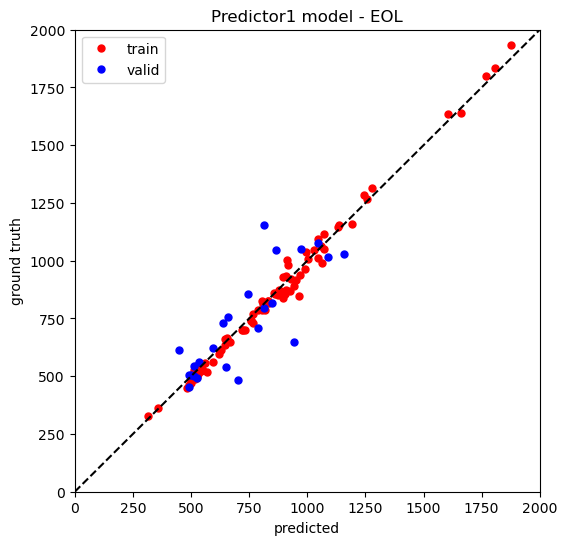

Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 9 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.84, MAPE: 0.03
Testing set|RMSE: 1.95, MAPE: 0.06


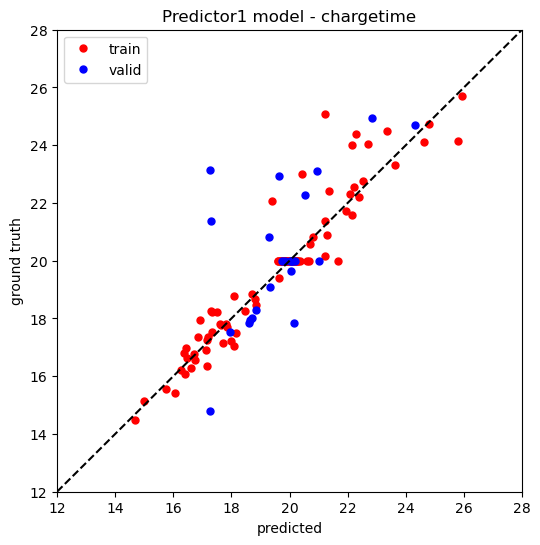

First 10 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 42.67, MAPE: 0.03
Testing set|RMSE: 130.86, MAPE: 0.13


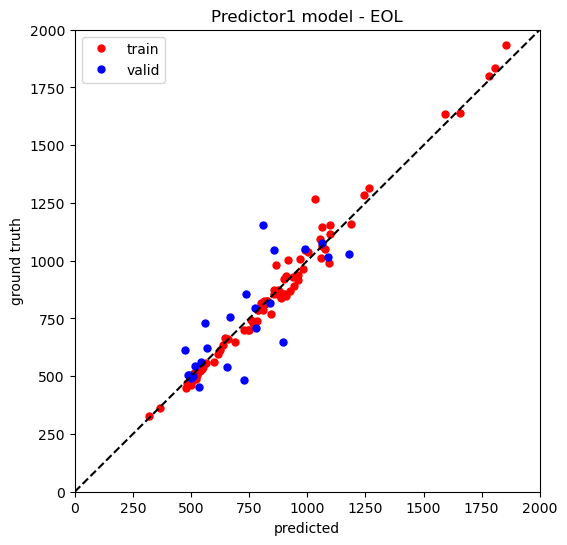

Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 10 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.85, MAPE: 0.03
Testing set|RMSE: 2.08, MAPE: 0.07


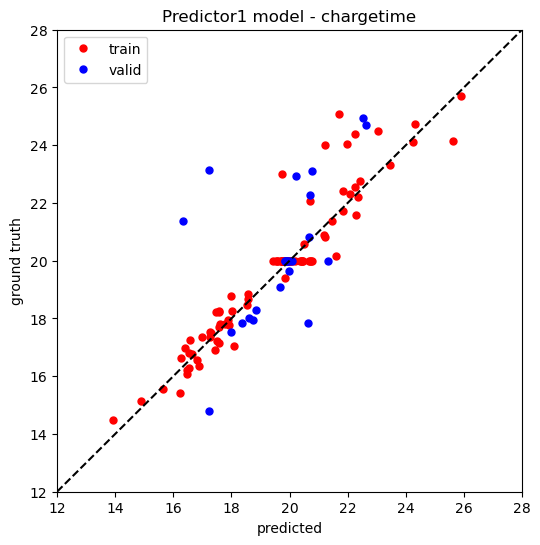

First 11 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 34.20, MAPE: 0.03
Testing set|RMSE: 136.82, MAPE: 0.14


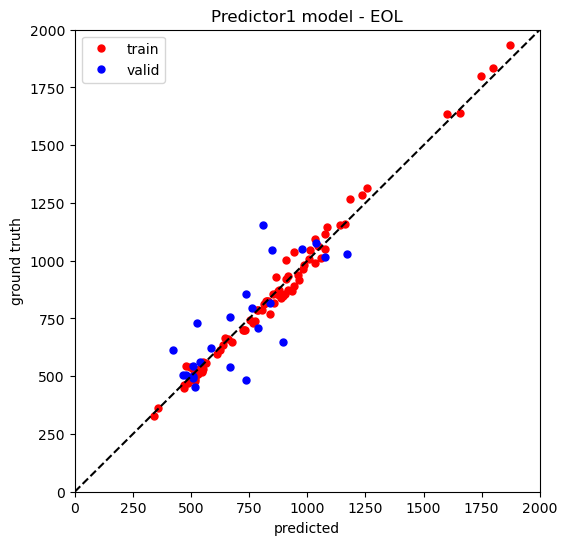

Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 11 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.88, MAPE: 0.03
Testing set|RMSE: 2.17, MAPE: 0.07


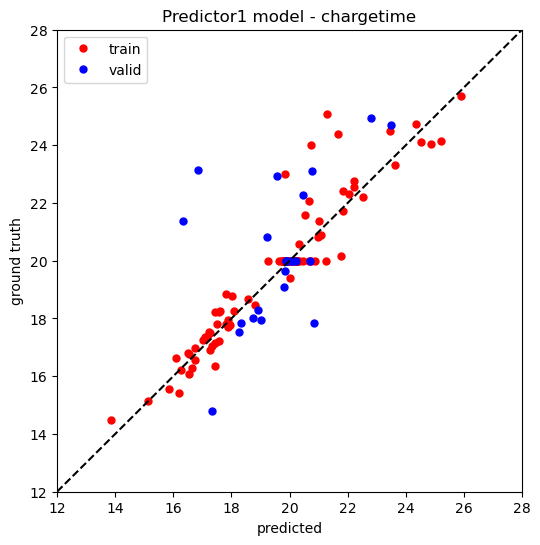

First 12 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.99, MAPE: 0.03
Testing set|RMSE: 130.17, MAPE: 0.13


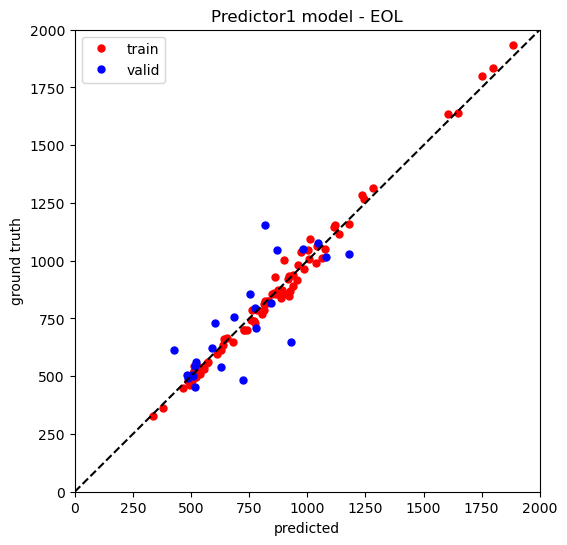

Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 12 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.85, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.07


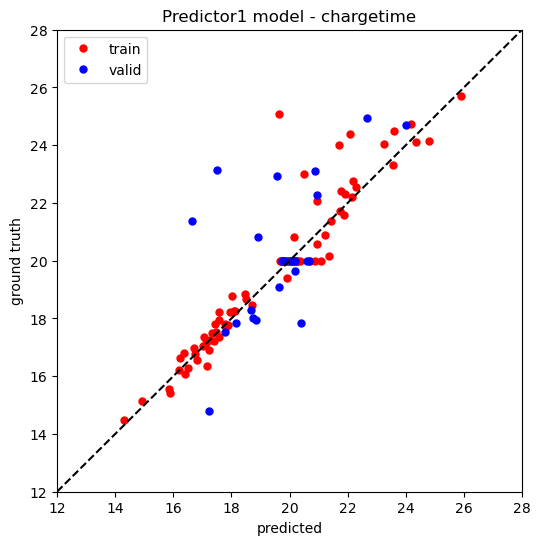

First 13 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 39.56, MAPE: 0.04
Testing set|RMSE: 121.28, MAPE: 0.13


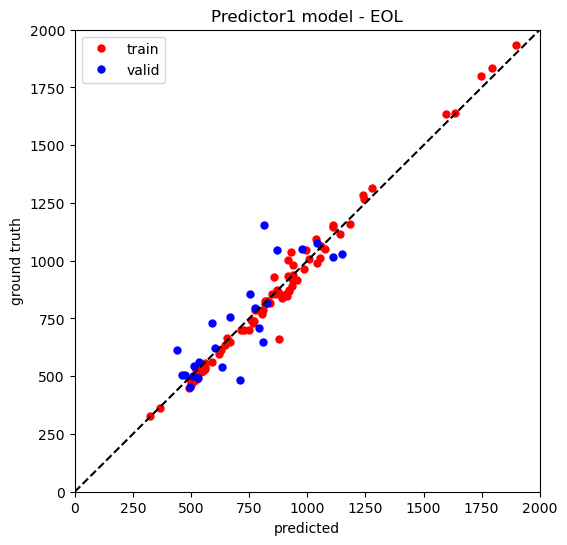

Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 13 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 1.04, MAPE: 0.03
Testing set|RMSE: 2.10, MAPE: 0.07


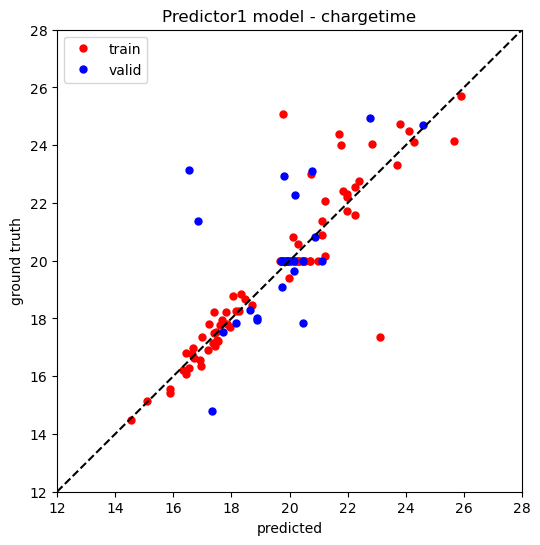

First 14 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 35.53, MAPE: 0.03
Testing set|RMSE: 127.71, MAPE: 0.14


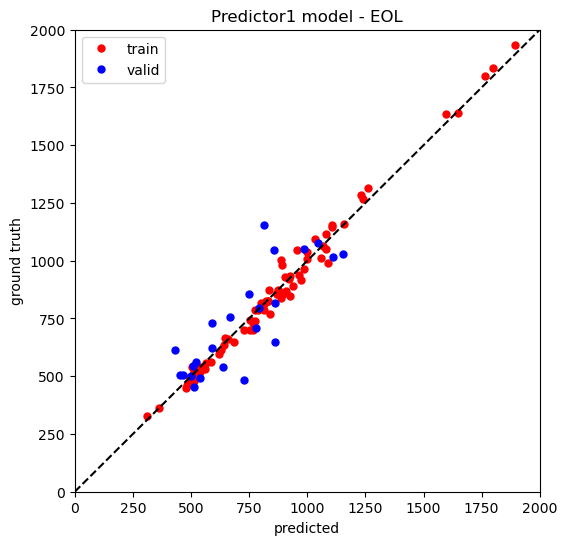

Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 14 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.94, MAPE: 0.03
Testing set|RMSE: 2.17, MAPE: 0.07


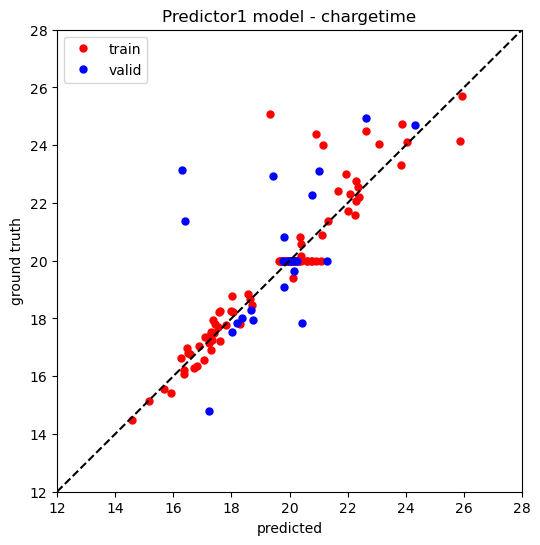

First 15 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 33.36, MAPE: 0.03
Testing set|RMSE: 120.04, MAPE: 0.12


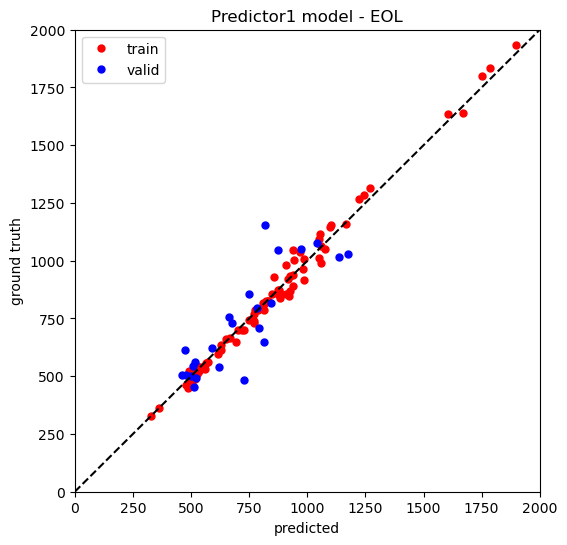

Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 15 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.88, MAPE: 0.02
Testing set|RMSE: 2.25, MAPE: 0.07


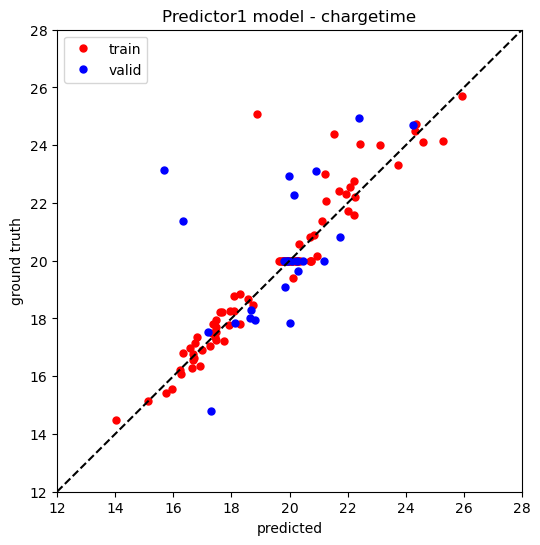

First 16 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 46.99, MAPE: 0.03
Testing set|RMSE: 119.42, MAPE: 0.12


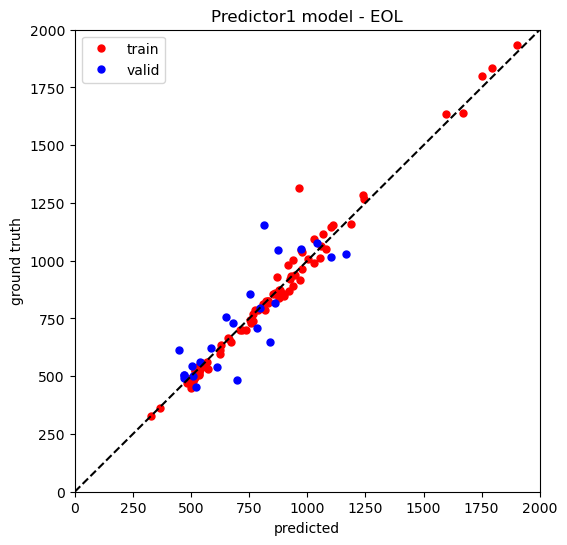

Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 16 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.82, MAPE: 0.02
Testing set|RMSE: 2.12, MAPE: 0.06


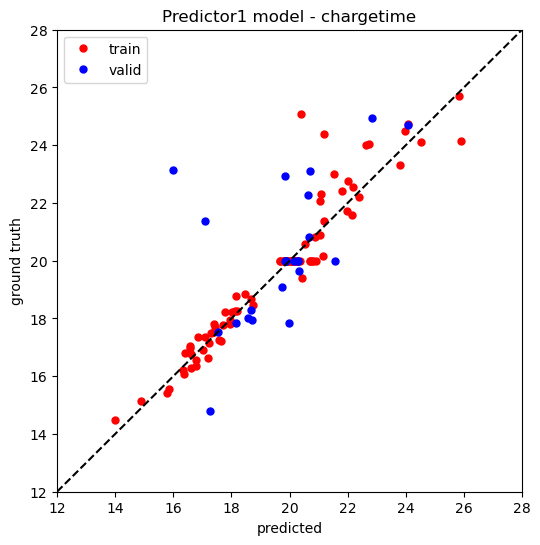

First 17 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 34.20, MAPE: 0.03
Testing set|RMSE: 119.29, MAPE: 0.12


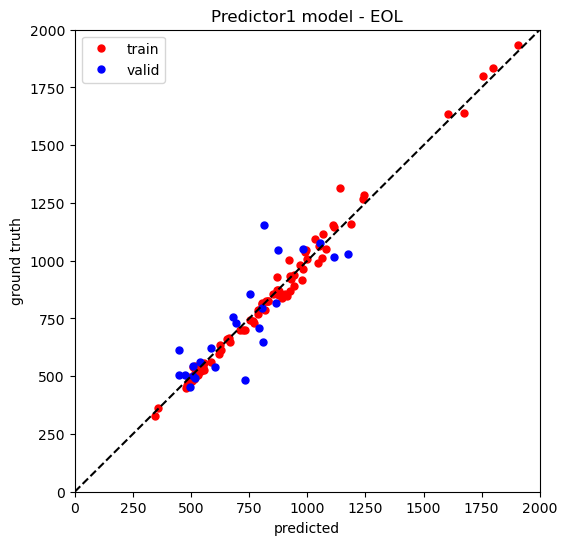

Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 17 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.84, MAPE: 0.02
Testing set|RMSE: 2.19, MAPE: 0.07


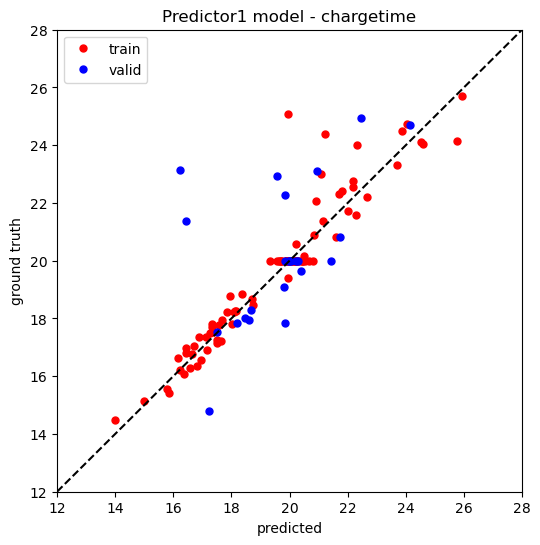

First 18 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.20, MAPE: 0.03
Testing set|RMSE: 120.82, MAPE: 0.12


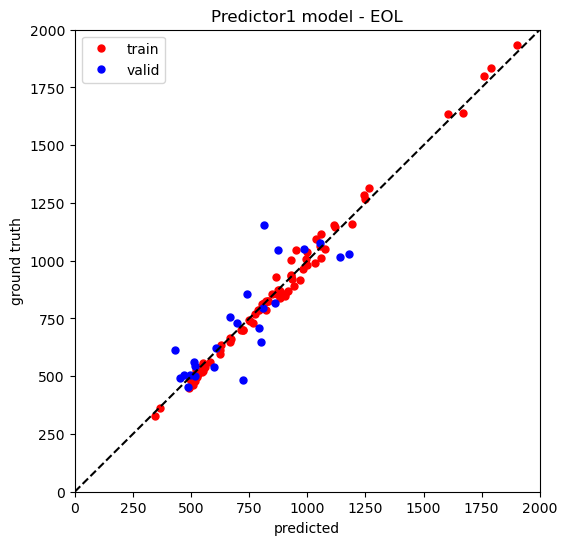

Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 18 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.90, MAPE: 0.02
Testing set|RMSE: 2.28, MAPE: 0.07


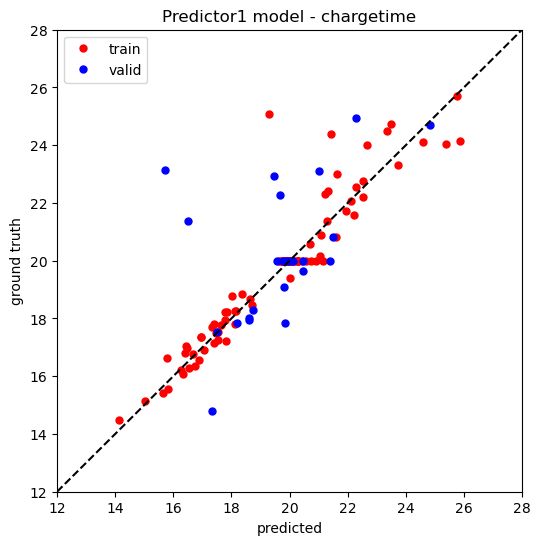

First 19 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.59, MAPE: 0.03
Testing set|RMSE: 116.94, MAPE: 0.11


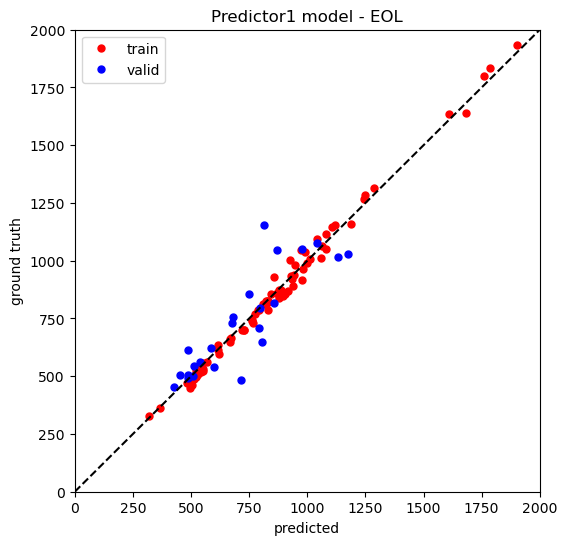

Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 19 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.87, MAPE: 0.02
Testing set|RMSE: 2.15, MAPE: 0.07


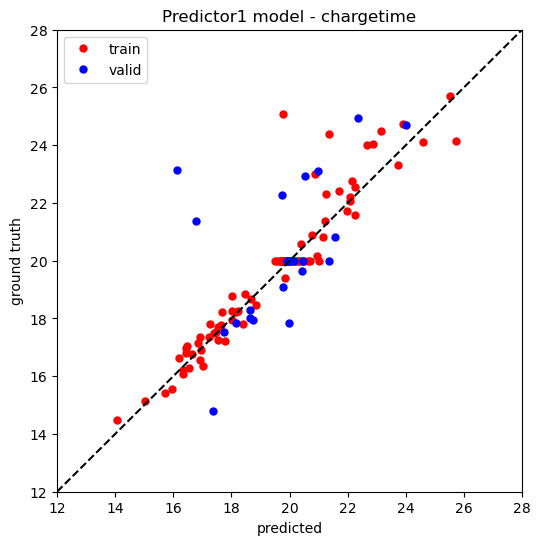

First 20 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 32.34, MAPE: 0.03
Testing set|RMSE: 124.76, MAPE: 0.13


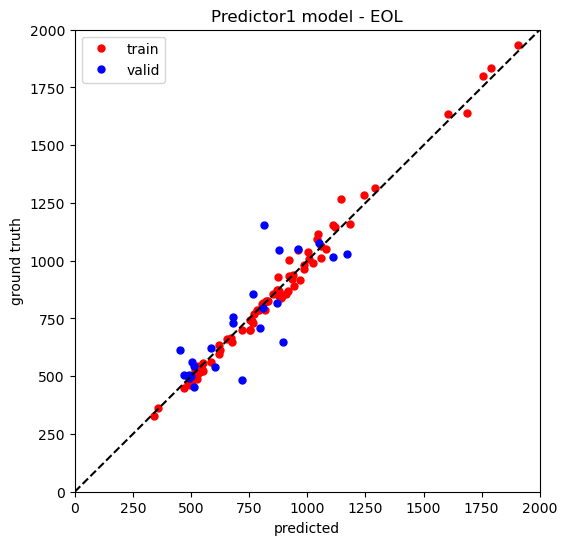

Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 20 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.84, MAPE: 0.02
Testing set|RMSE: 2.16, MAPE: 0.07


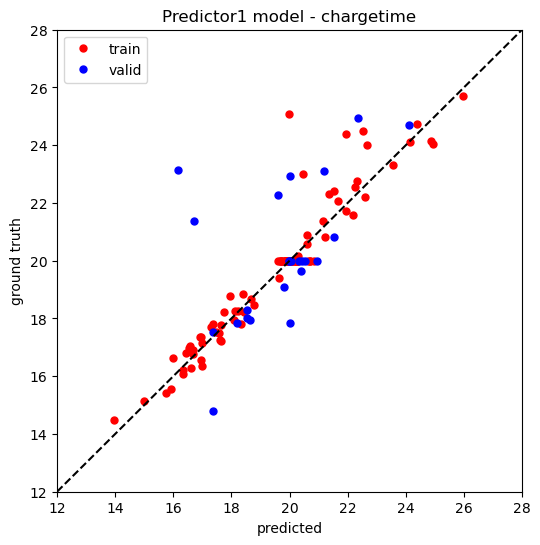

First 21 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.73, MAPE: 0.03
Testing set|RMSE: 120.23, MAPE: 0.11


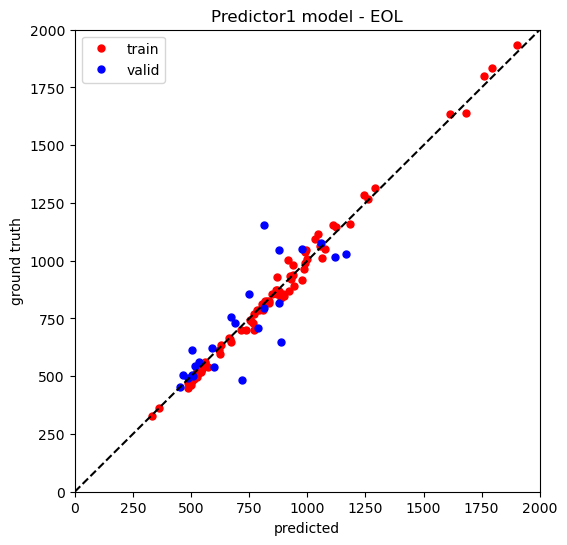

Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 21 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.81, MAPE: 0.02
Testing set|RMSE: 2.13, MAPE: 0.07


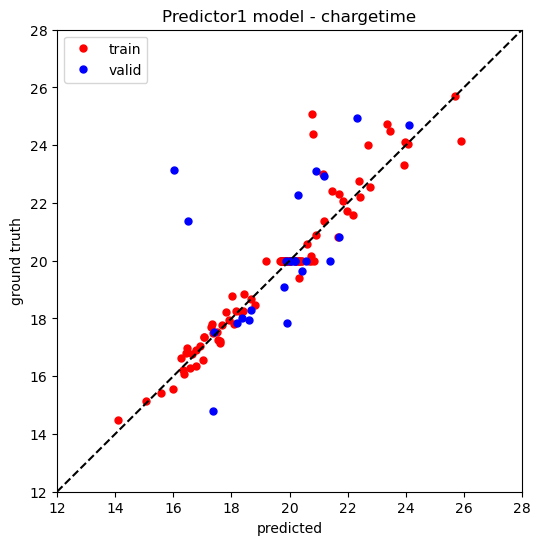

First 22 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.10, MAPE: 0.03
Testing set|RMSE: 117.69, MAPE: 0.12


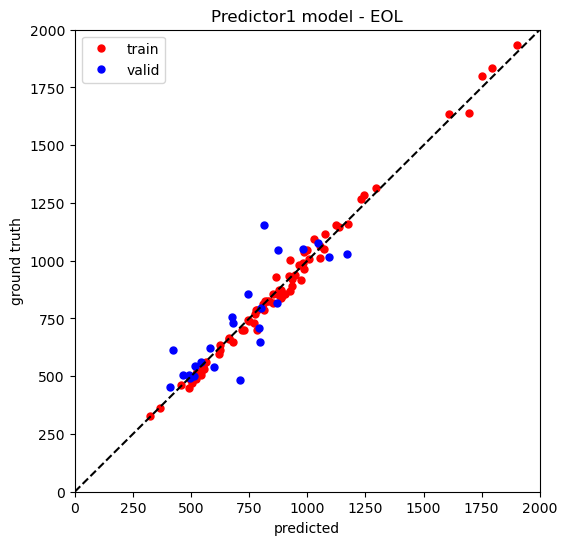

Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 22 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.86, MAPE: 0.02
Testing set|RMSE: 2.13, MAPE: 0.07


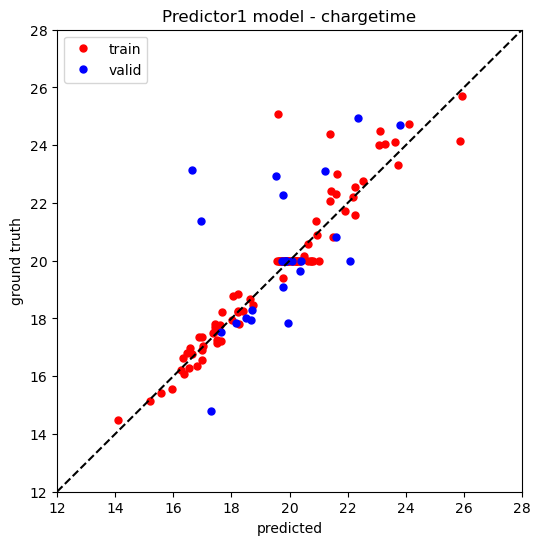

First 23 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.68, MAPE: 0.03
Testing set|RMSE: 125.51, MAPE: 0.12


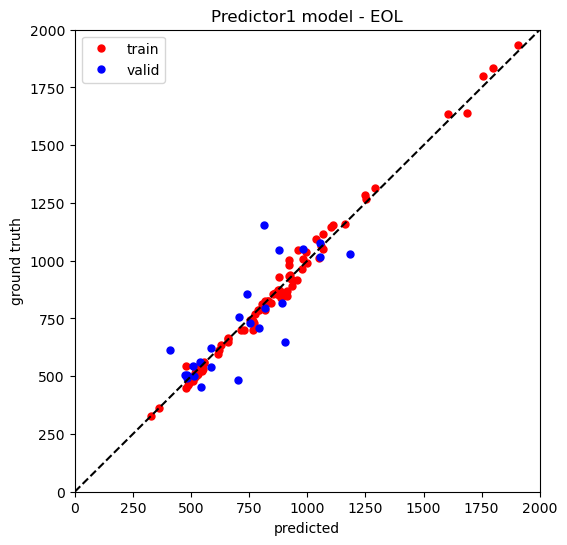

Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 23 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.75, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


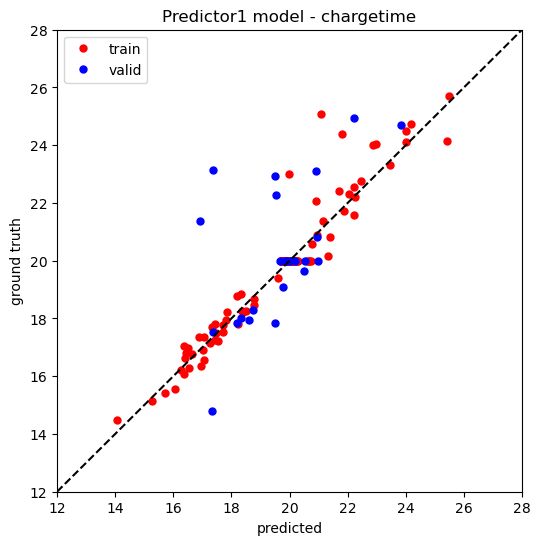

First 24 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.80, MAPE: 0.03
Testing set|RMSE: 117.98, MAPE: 0.11


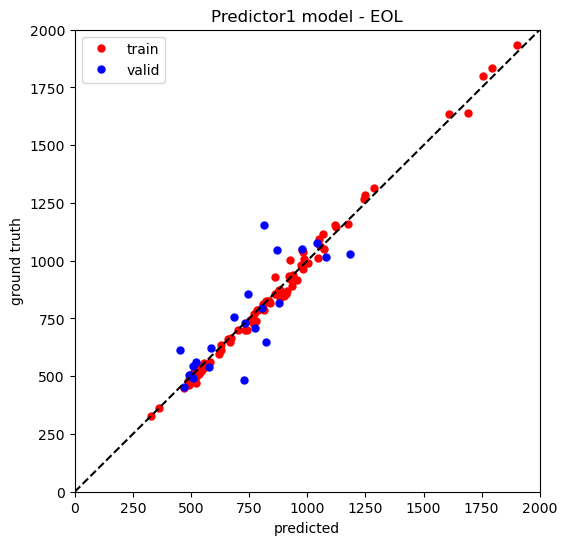

Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 24 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.75, MAPE: 0.02
Testing set|RMSE: 1.93, MAPE: 0.06


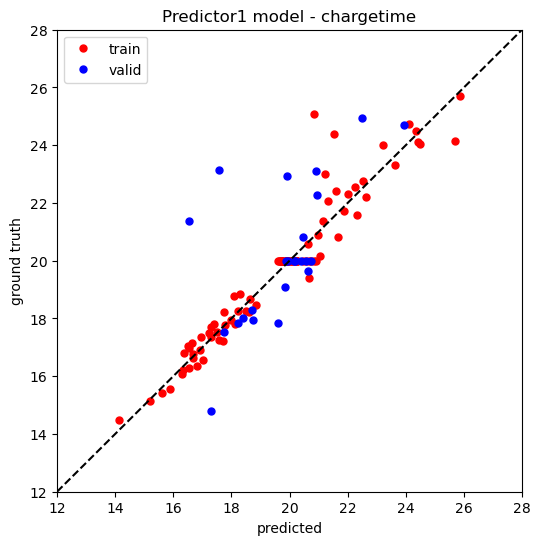

First 25 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.07, MAPE: 0.03
Testing set|RMSE: 119.40, MAPE: 0.11


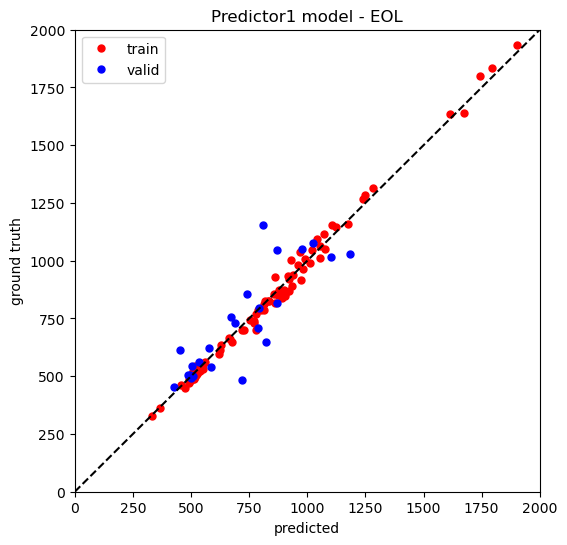

Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 25 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.81, MAPE: 0.02
Testing set|RMSE: 2.11, MAPE: 0.07


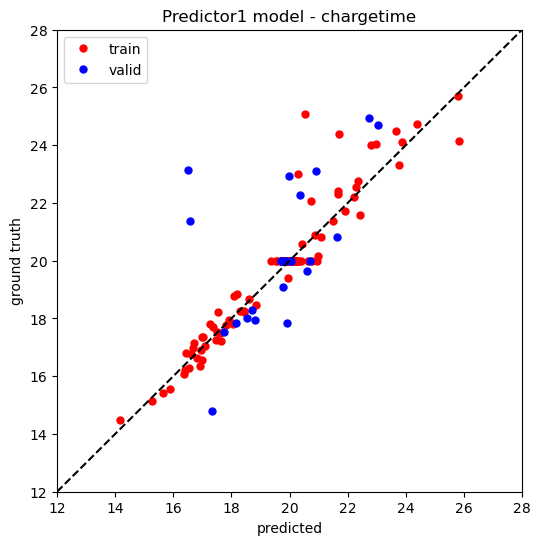

First 26 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.43, MAPE: 0.03
Testing set|RMSE: 123.29, MAPE: 0.12


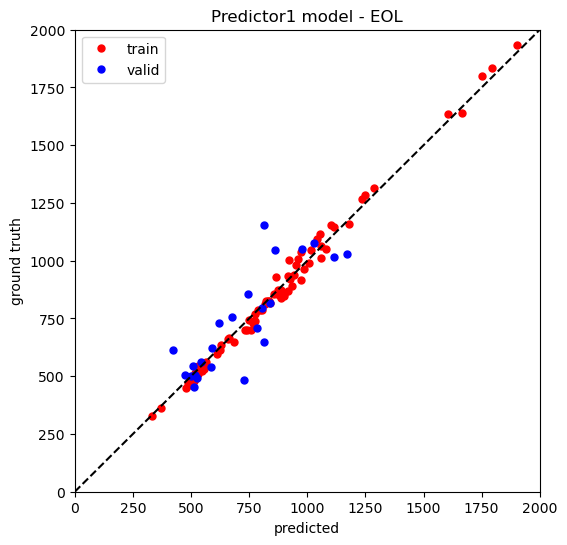

Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 26 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.88, MAPE: 0.02
Testing set|RMSE: 2.18, MAPE: 0.07


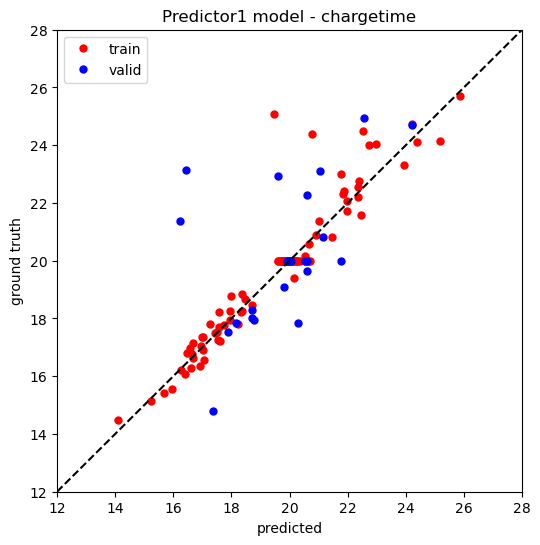

First 27 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.76, MAPE: 0.03
Testing set|RMSE: 121.91, MAPE: 0.12


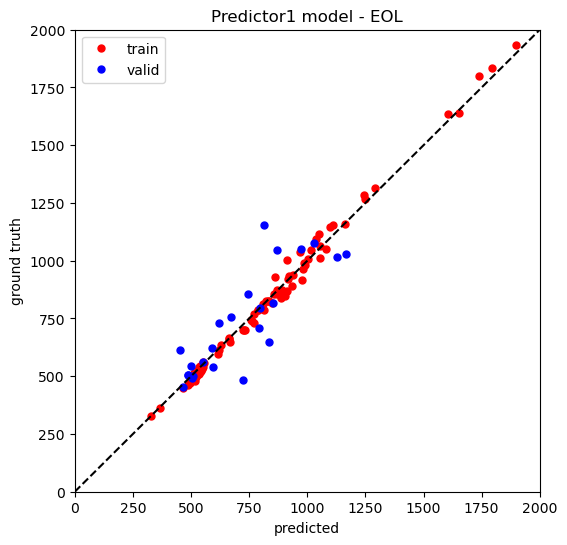

Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 27 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.76, MAPE: 0.02
Testing set|RMSE: 2.25, MAPE: 0.07


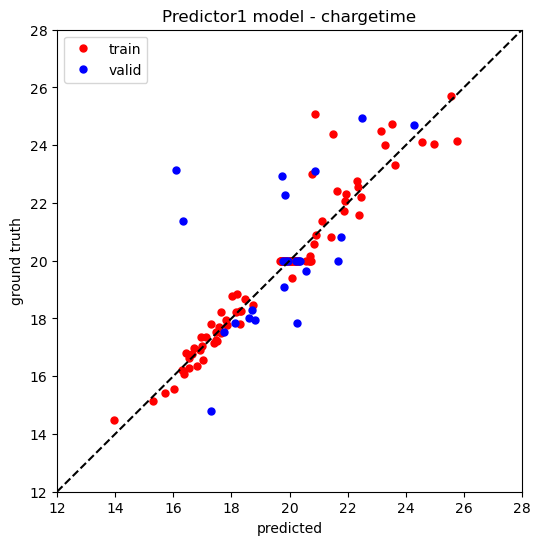

First 28 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 30.83, MAPE: 0.03
Testing set|RMSE: 123.75, MAPE: 0.13


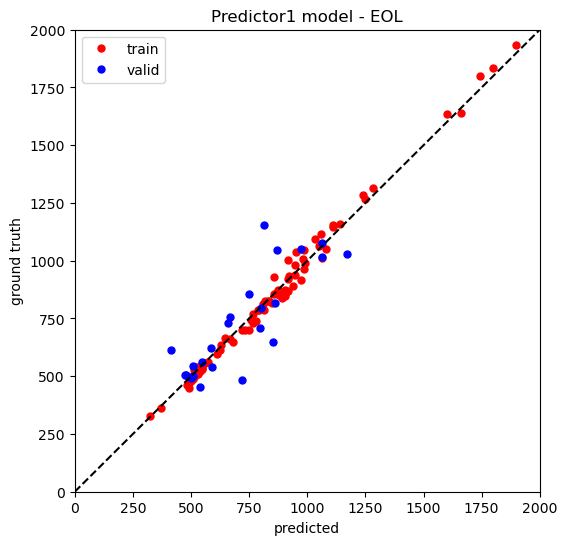

Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 28 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.83, MAPE: 0.02
Testing set|RMSE: 2.10, MAPE: 0.07


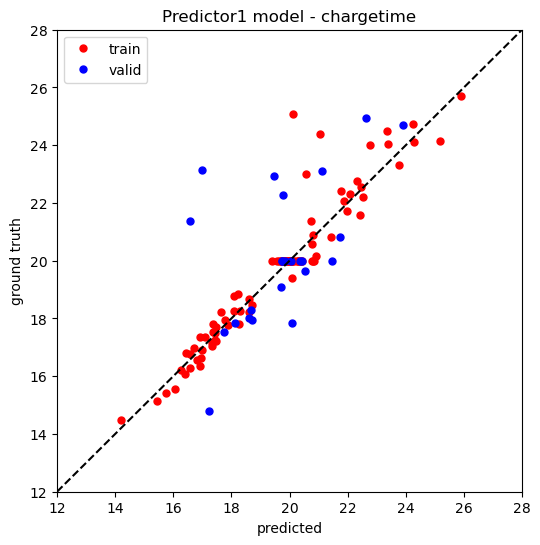

First 29 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.77, MAPE: 0.03
Testing set|RMSE: 125.40, MAPE: 0.13


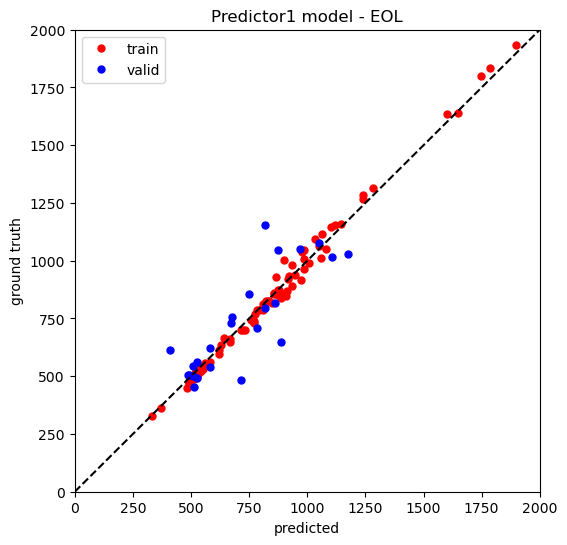

Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 29 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.81, MAPE: 0.02
Testing set|RMSE: 2.09, MAPE: 0.07


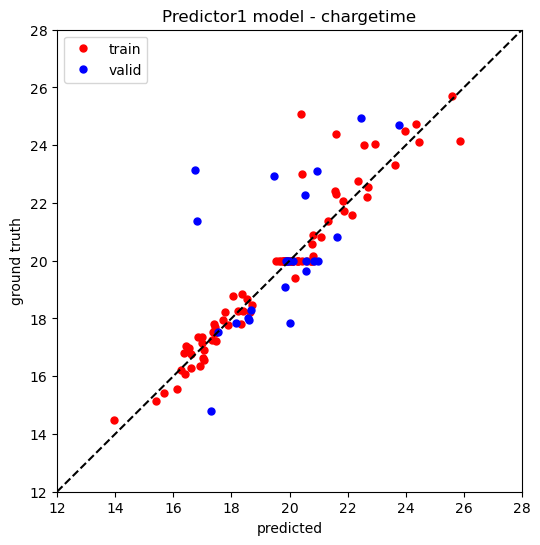

First 30 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.67, MAPE: 0.03
Testing set|RMSE: 122.71, MAPE: 0.12


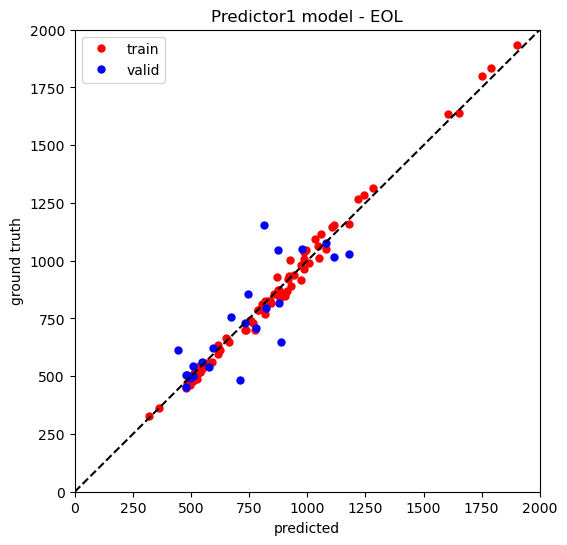

Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 30 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.86, MAPE: 0.02
Testing set|RMSE: 2.12, MAPE: 0.06


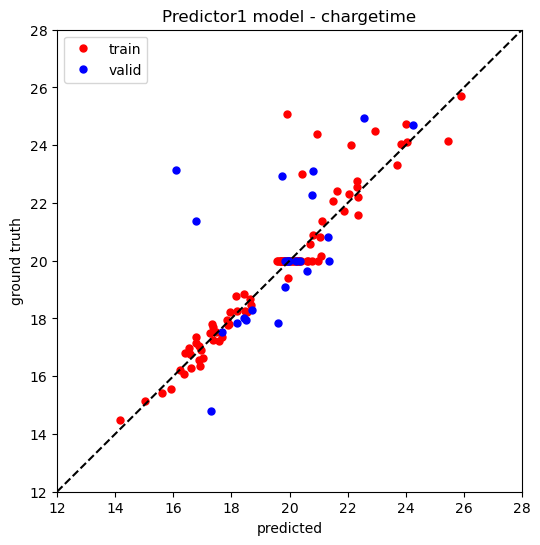

First 31 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.84, MAPE: 0.03
Testing set|RMSE: 120.55, MAPE: 0.12


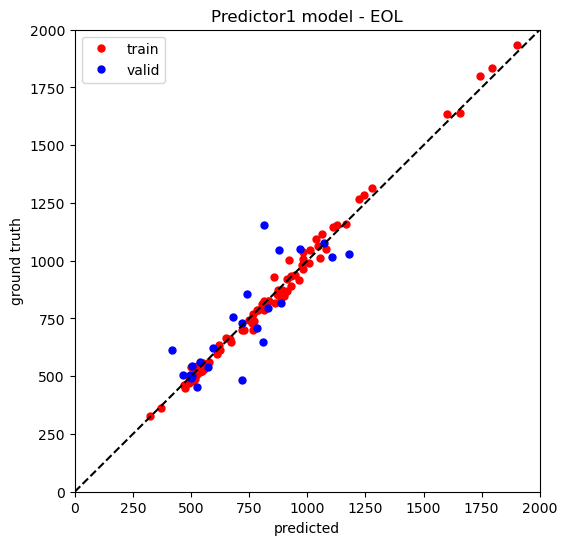

Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 31 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 2.06, MAPE: 0.06


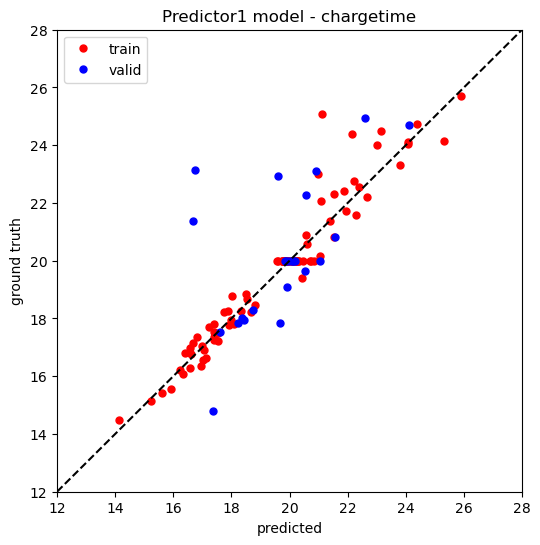

First 32 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.66, MAPE: 0.03
Testing set|RMSE: 114.72, MAPE: 0.11


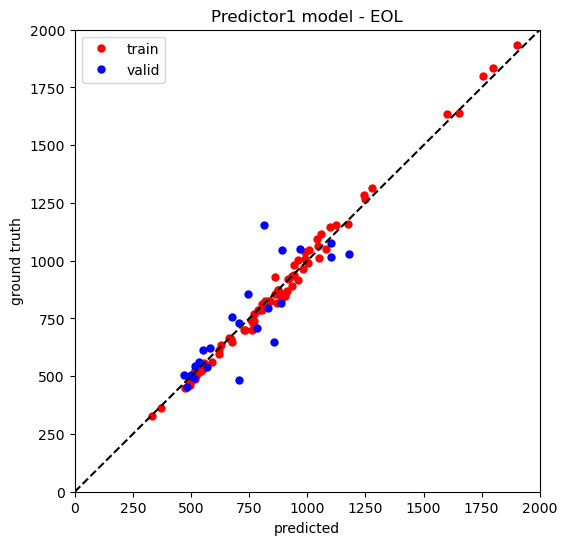

Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 32 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.82, MAPE: 0.02
Testing set|RMSE: 2.06, MAPE: 0.06


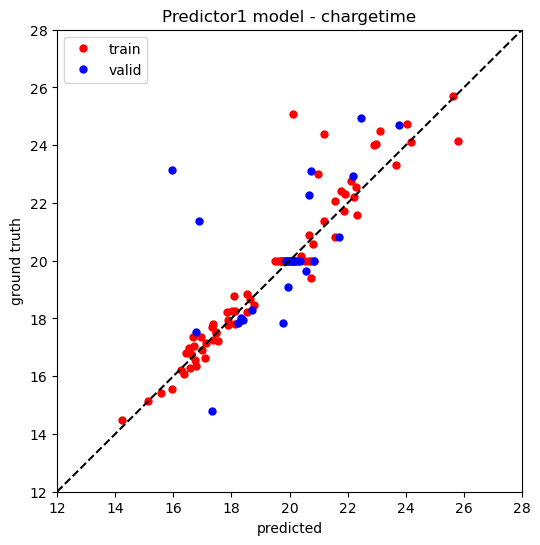

First 33 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.60, MAPE: 0.03
Testing set|RMSE: 124.11, MAPE: 0.12


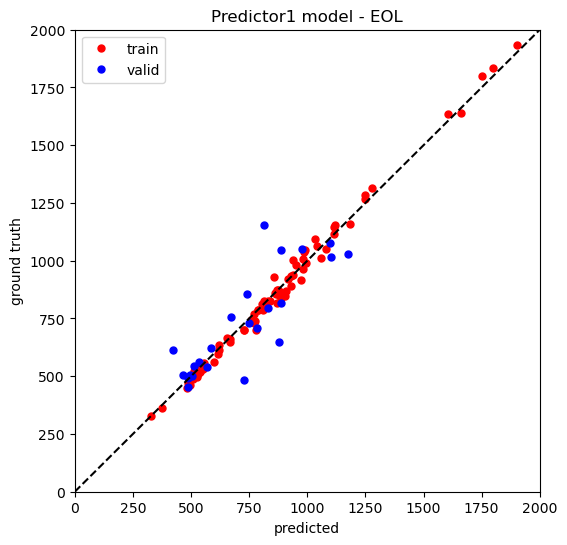

Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 33 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.79, MAPE: 0.02
Testing set|RMSE: 2.14, MAPE: 0.07


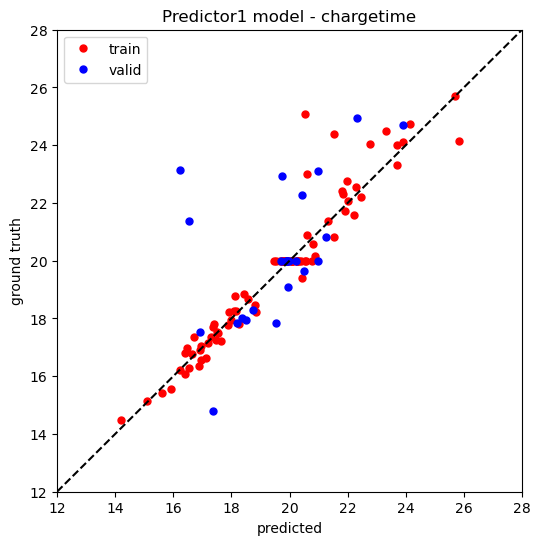

First 34 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.66, MAPE: 0.03
Testing set|RMSE: 126.57, MAPE: 0.13


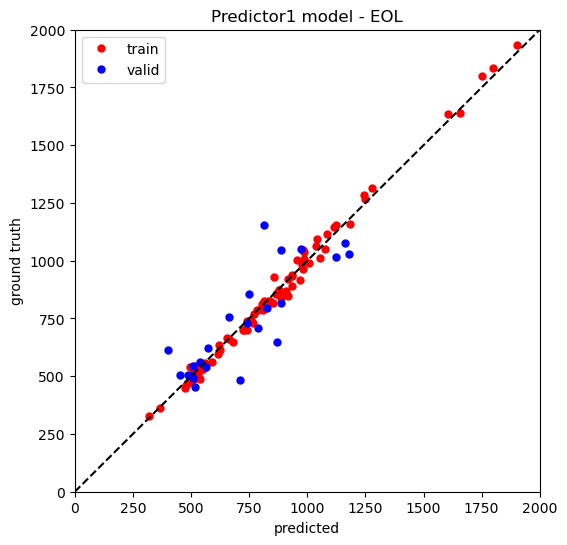

Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 34 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.73, MAPE: 0.02
Testing set|RMSE: 2.15, MAPE: 0.07


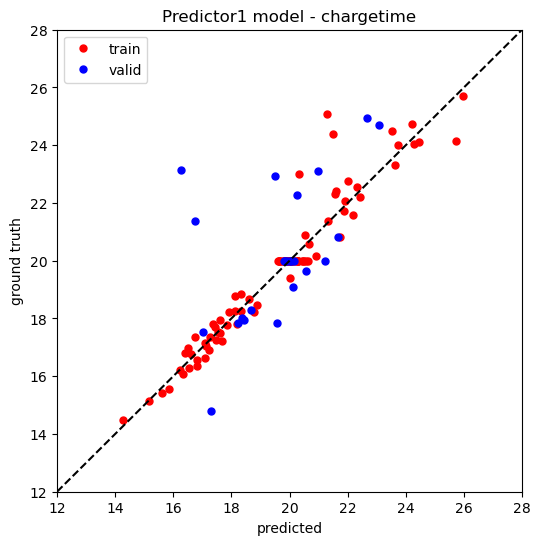

First 35 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.33, MAPE: 0.03
Testing set|RMSE: 123.63, MAPE: 0.12


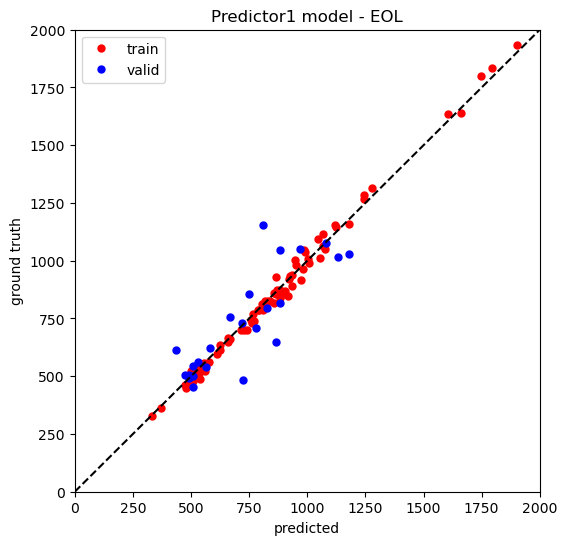

Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 35 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.73, MAPE: 0.02
Testing set|RMSE: 2.07, MAPE: 0.06


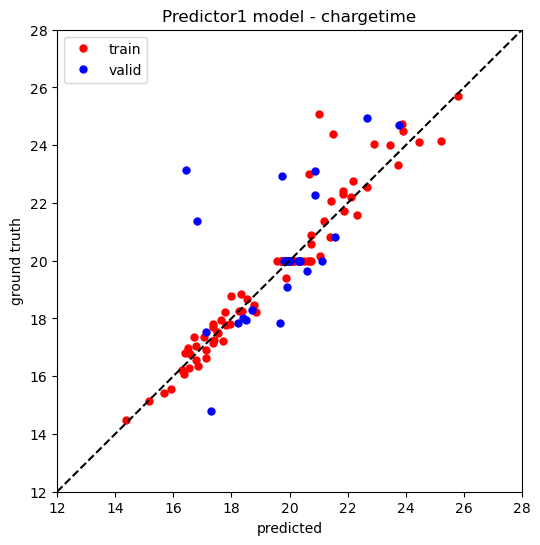

First 36 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.39, MAPE: 0.03
Testing set|RMSE: 128.03, MAPE: 0.13


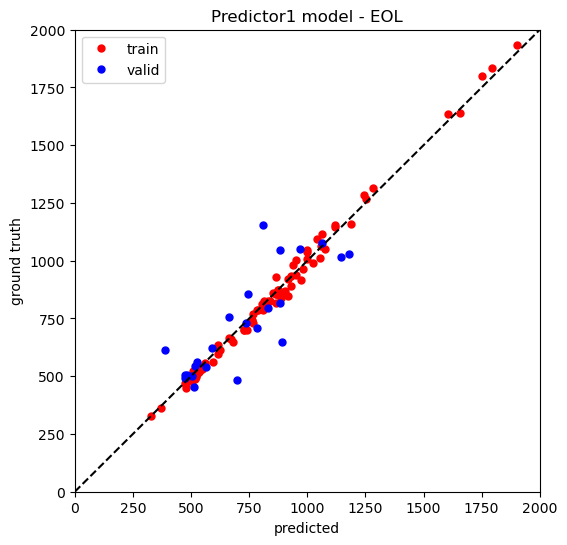

Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 36 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.80, MAPE: 0.02
Testing set|RMSE: 2.07, MAPE: 0.06


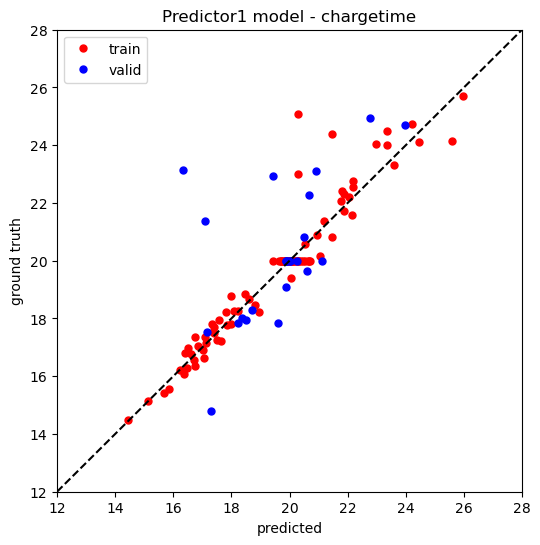

First 37 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.65, MAPE: 0.03
Testing set|RMSE: 130.96, MAPE: 0.13


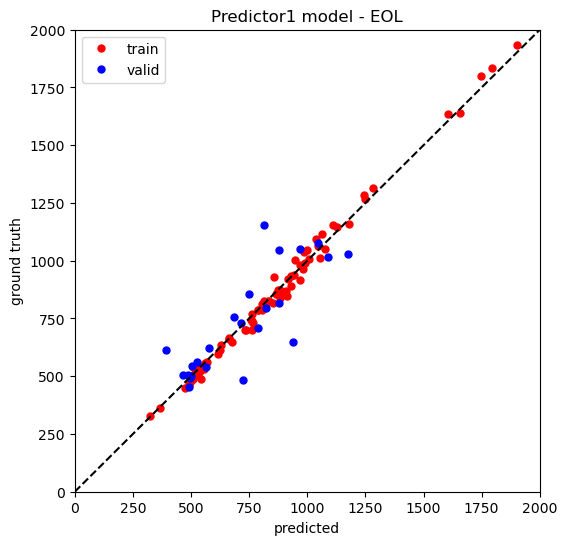

Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 37 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.76, MAPE: 0.02
Testing set|RMSE: 2.07, MAPE: 0.06


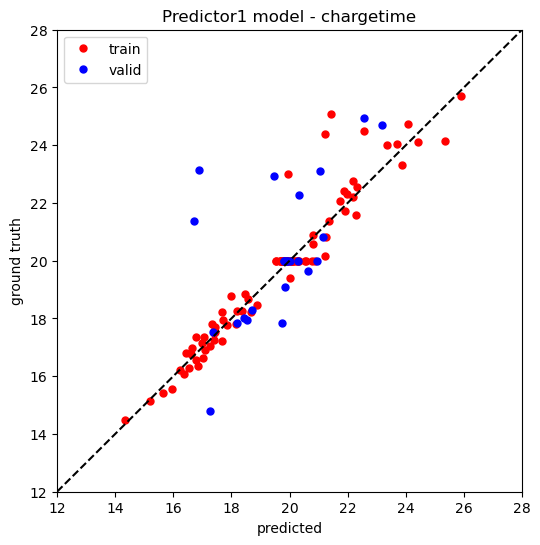

First 38 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.37, MAPE: 0.03
Testing set|RMSE: 127.64, MAPE: 0.13


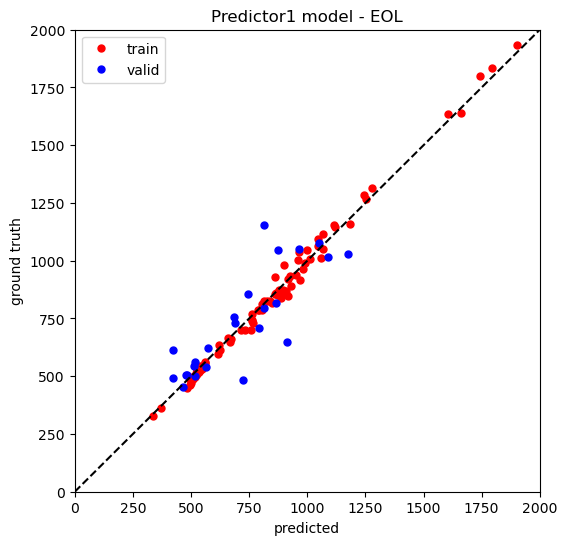

Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 38 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.77, MAPE: 0.02
Testing set|RMSE: 2.10, MAPE: 0.07


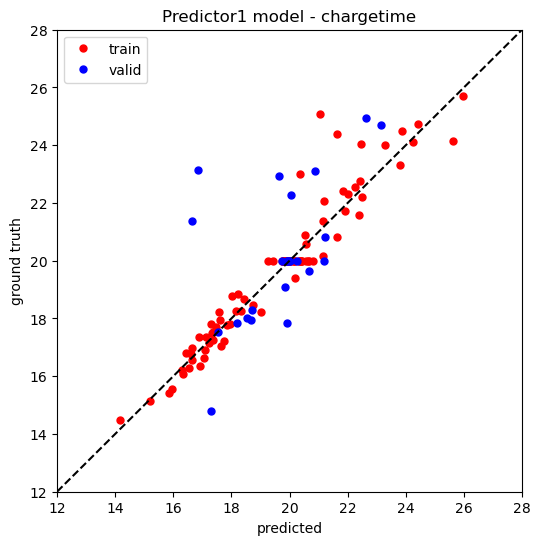

First 39 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 29.27, MAPE: 0.03
Testing set|RMSE: 123.12, MAPE: 0.12


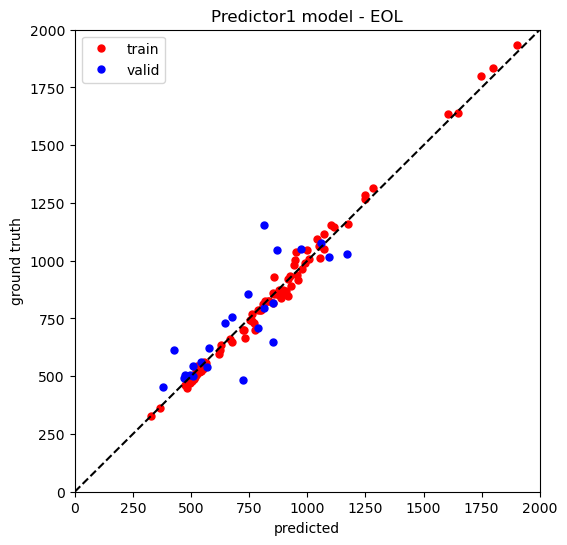

Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 39 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.75, MAPE: 0.02
Testing set|RMSE: 2.07, MAPE: 0.07


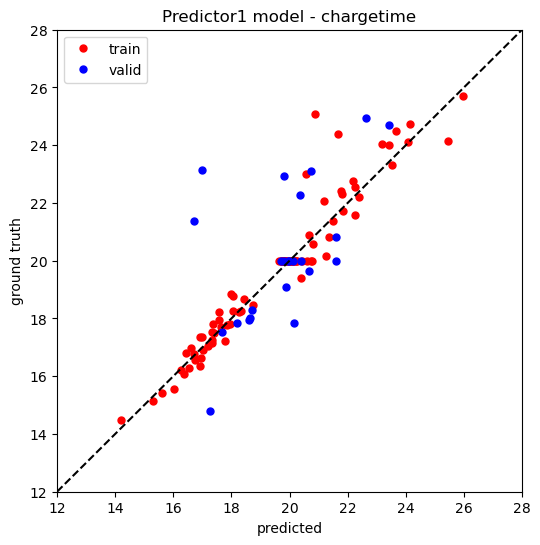

First 40 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.80, MAPE: 0.03
Testing set|RMSE: 125.85, MAPE: 0.13


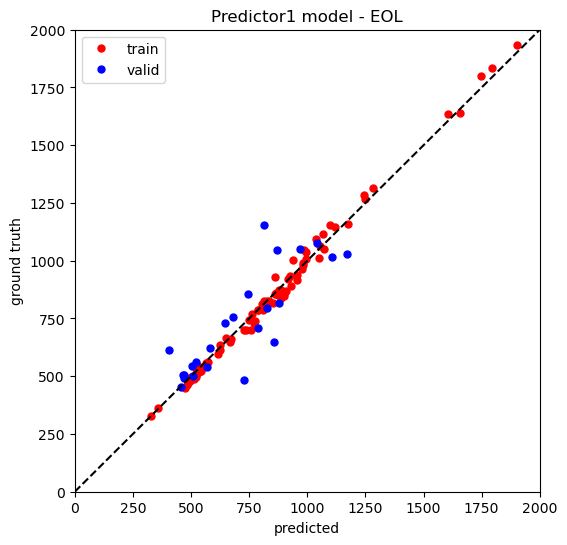

Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 40 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 2.13, MAPE: 0.07


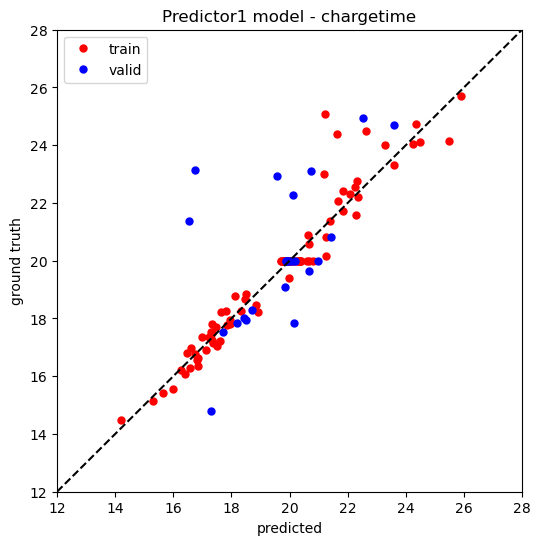

First 41 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.52, MAPE: 0.03
Testing set|RMSE: 122.94, MAPE: 0.12


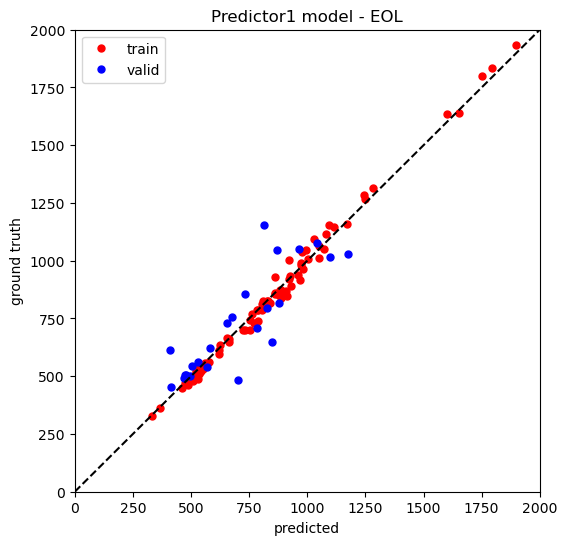

Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 41 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.82, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


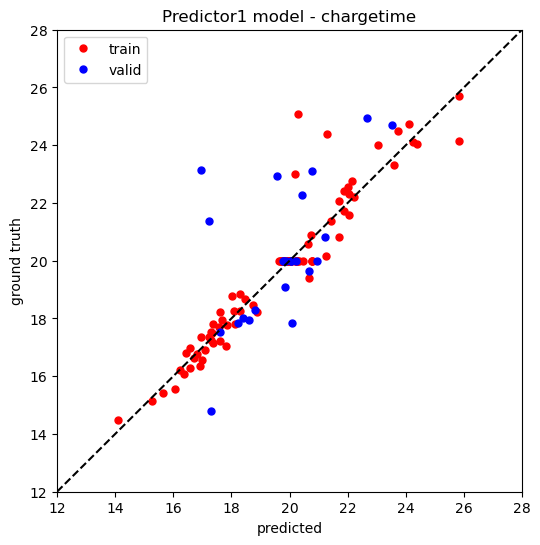

First 42 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.93, MAPE: 0.03
Testing set|RMSE: 124.82, MAPE: 0.13


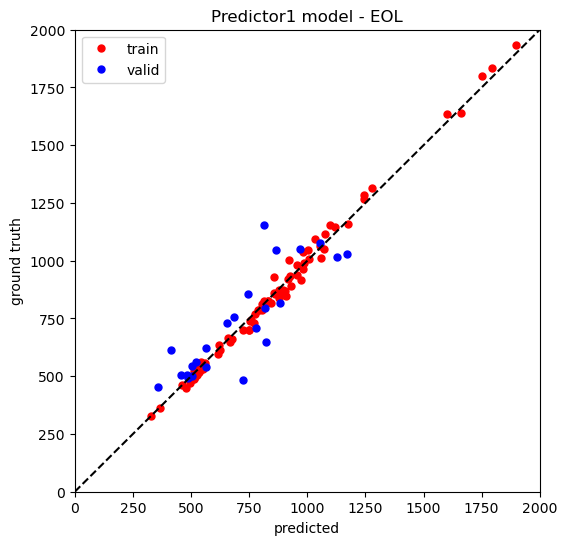

Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 42 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.76, MAPE: 0.02
Testing set|RMSE: 2.22, MAPE: 0.07


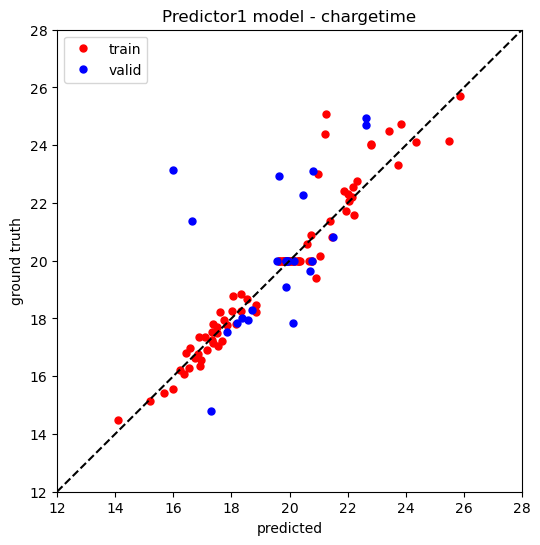

First 43 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.72, MAPE: 0.03
Testing set|RMSE: 123.72, MAPE: 0.12


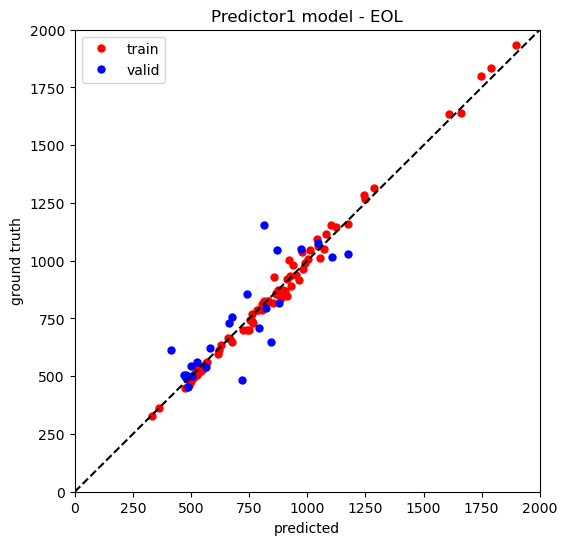

Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 43 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.74, MAPE: 0.02
Testing set|RMSE: 2.17, MAPE: 0.07


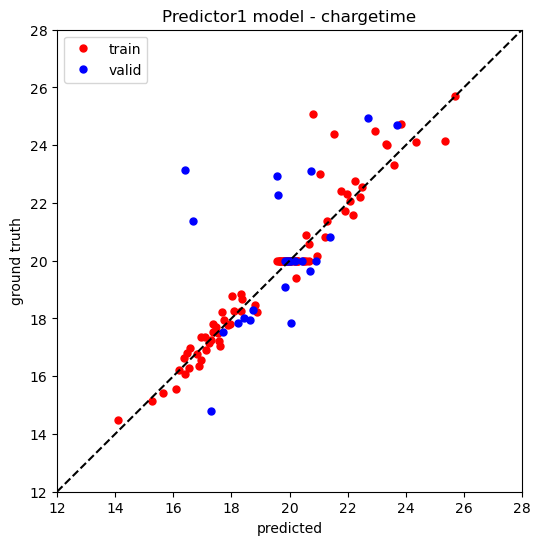

First 44 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.12, MAPE: 0.03
Testing set|RMSE: 121.95, MAPE: 0.12


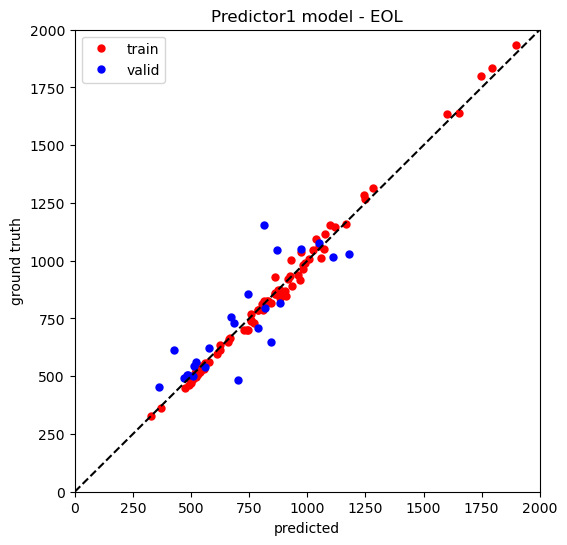

Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 44 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.77, MAPE: 0.02
Testing set|RMSE: 2.13, MAPE: 0.07


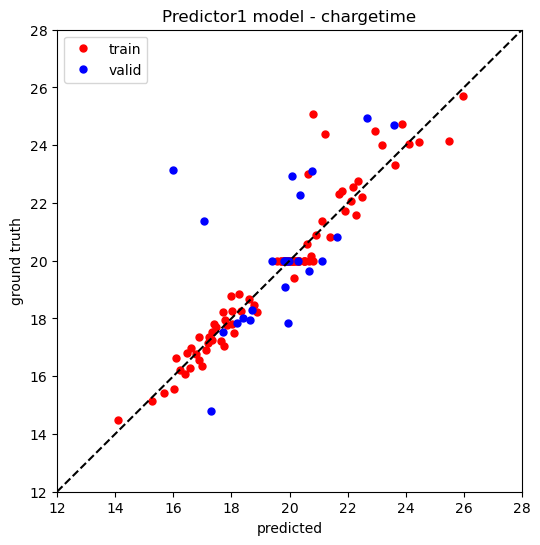

First 45 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.61, MAPE: 0.02
Testing set|RMSE: 128.83, MAPE: 0.13


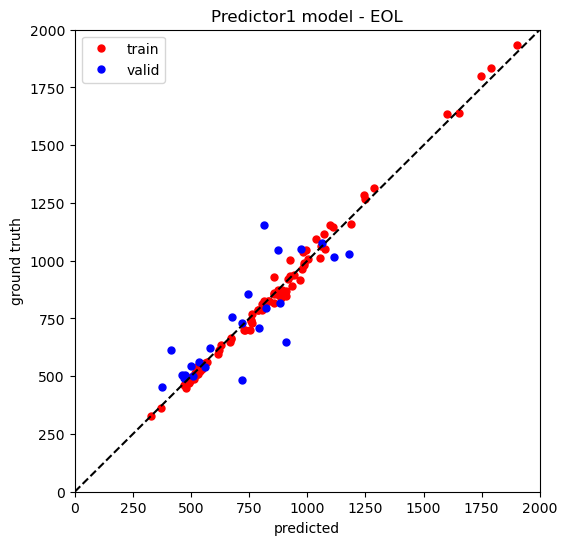

Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 45 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.74, MAPE: 0.02
Testing set|RMSE: 2.10, MAPE: 0.07


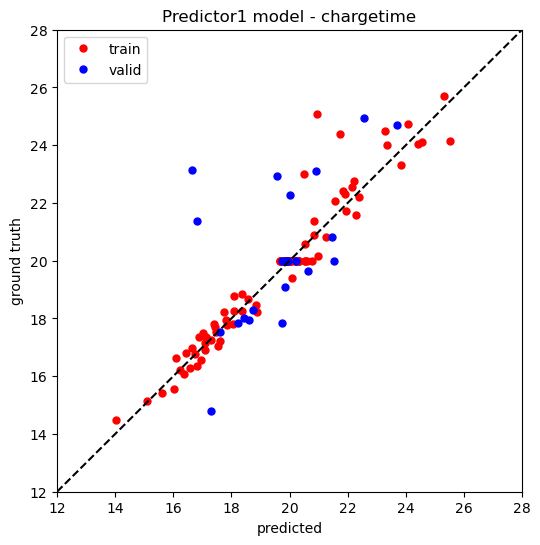

First 46 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 28.53, MAPE: 0.03
Testing set|RMSE: 121.64, MAPE: 0.12


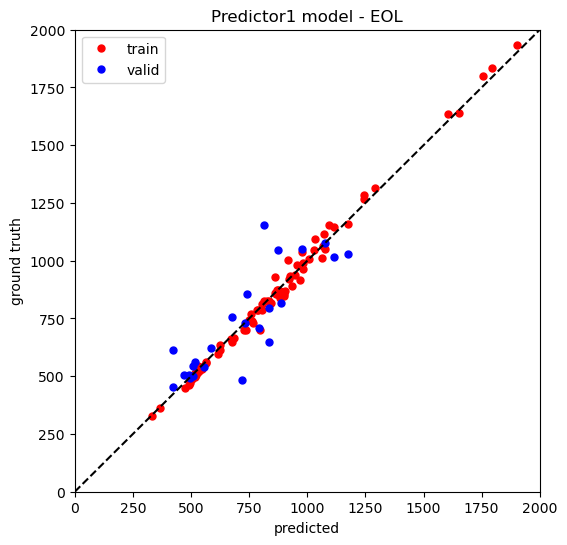

Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 46 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.77, MAPE: 0.02
Testing set|RMSE: 2.11, MAPE: 0.07


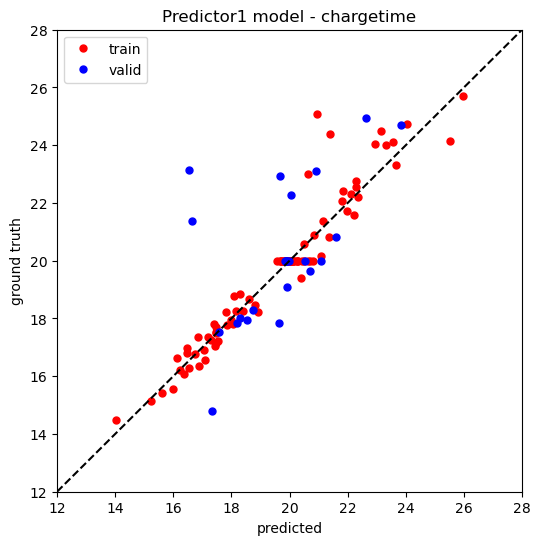

First 47 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.80, MAPE: 0.02
Testing set|RMSE: 126.62, MAPE: 0.13


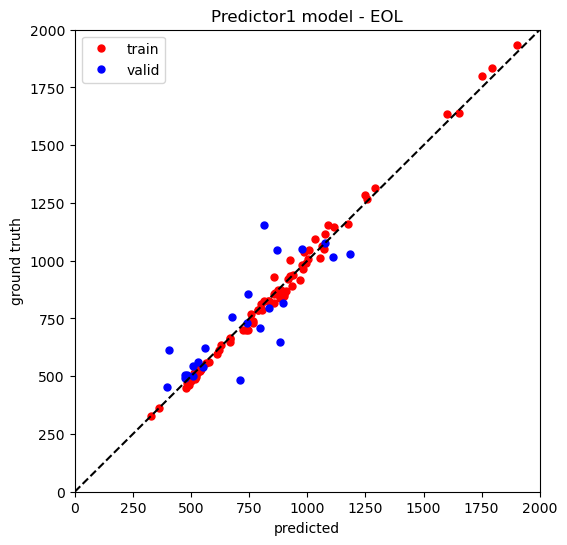

Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 47 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.73, MAPE: 0.02
Testing set|RMSE: 2.21, MAPE: 0.07


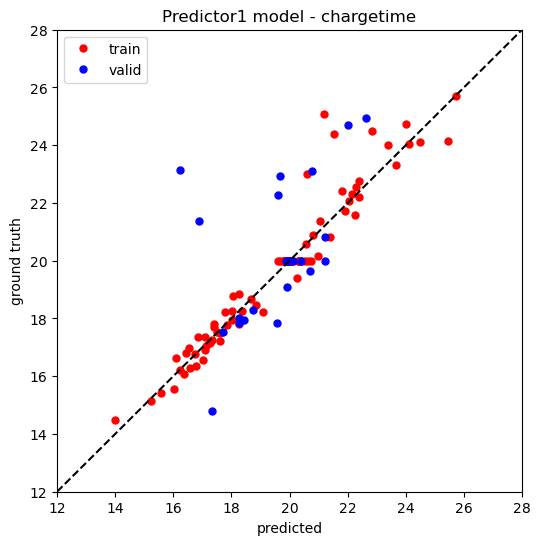

First 48 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.95, MAPE: 0.02
Testing set|RMSE: 123.40, MAPE: 0.12


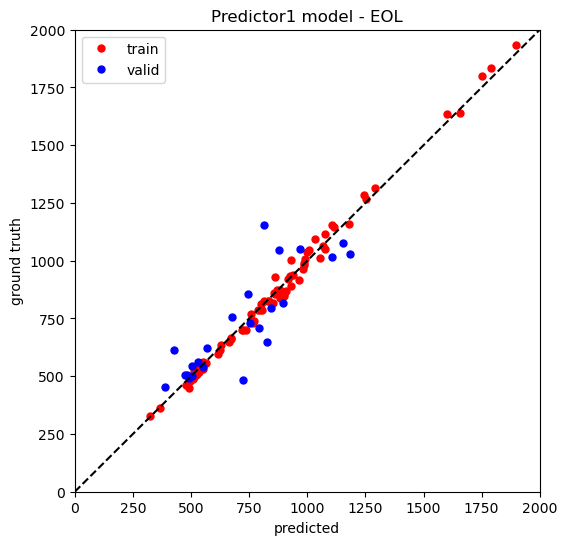

Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 48 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.76, MAPE: 0.02
Testing set|RMSE: 2.15, MAPE: 0.07


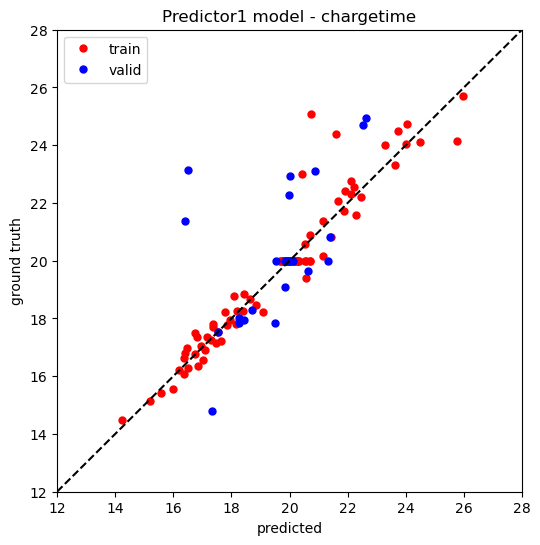

First 49 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.69, MAPE: 0.02
Testing set|RMSE: 133.10, MAPE: 0.13


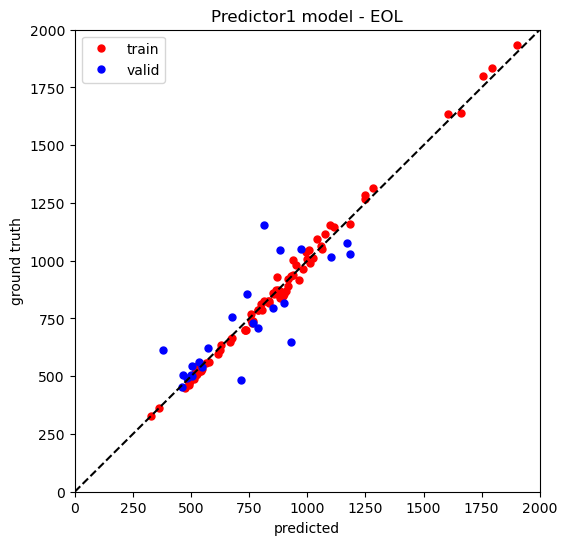

Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 49 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.77, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.06


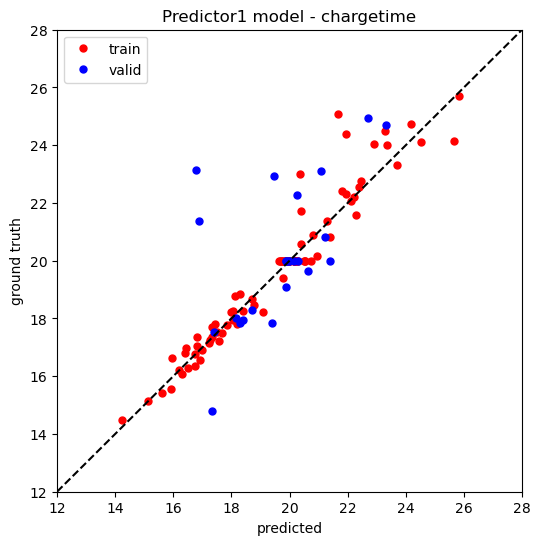

First 50 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.15, MAPE: 0.02
Testing set|RMSE: 132.00, MAPE: 0.13


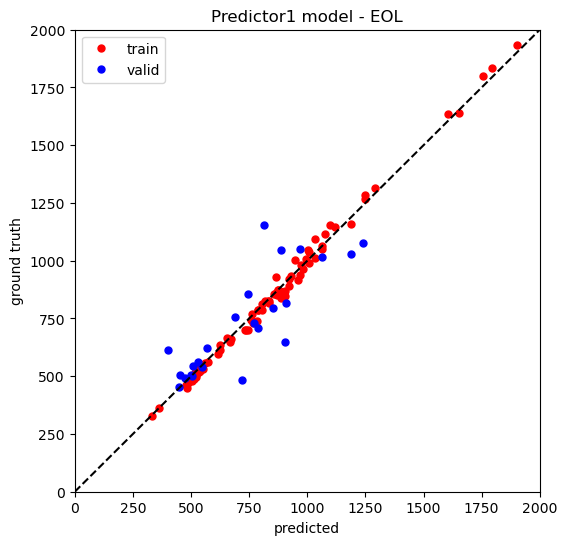

Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 50 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.92, MAPE: 0.02
Testing set|RMSE: 1.84, MAPE: 0.06


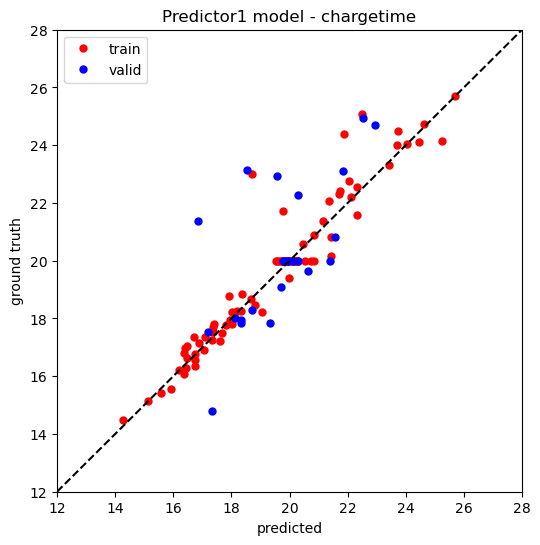

First 51 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.21, MAPE: 0.03
Testing set|RMSE: 132.92, MAPE: 0.13


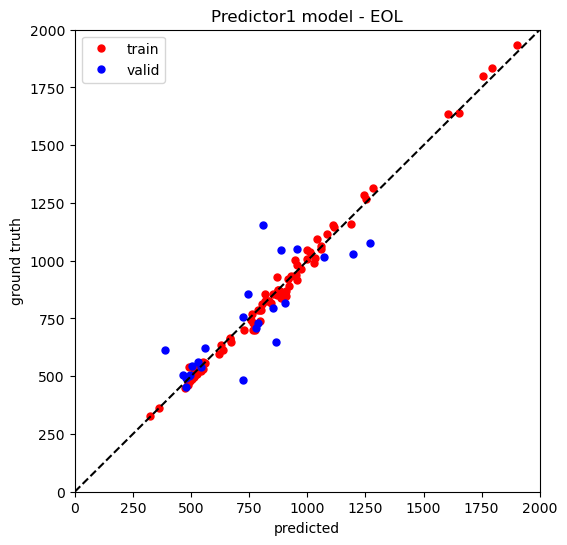

Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 51 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.87, MAPE: 0.02
Testing set|RMSE: 1.79, MAPE: 0.06


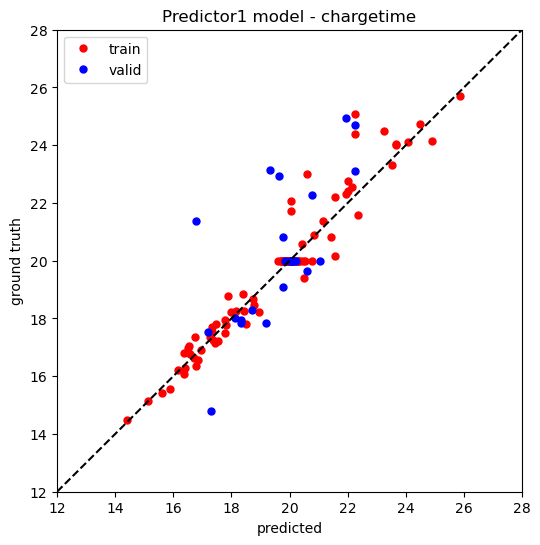

First 52 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.71, MAPE: 0.02
Testing set|RMSE: 135.32, MAPE: 0.13


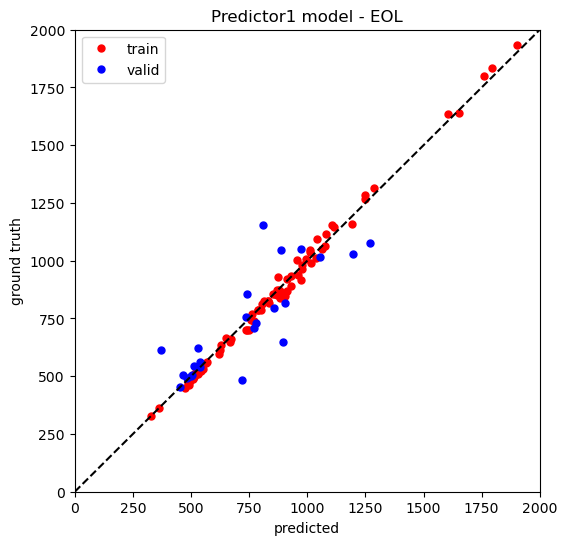

Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 52 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.90, MAPE: 0.02
Testing set|RMSE: 2.02, MAPE: 0.07


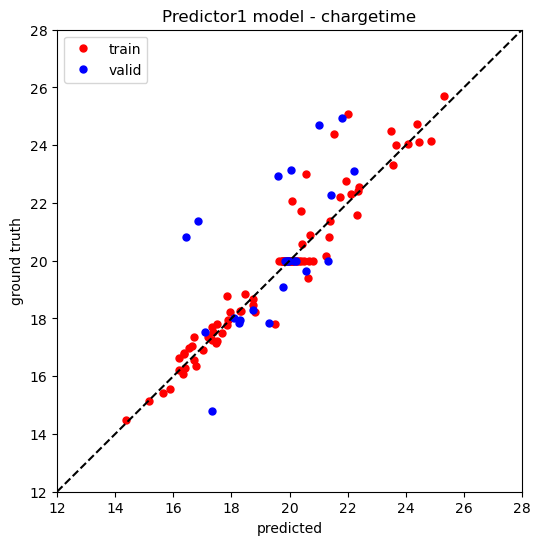

First 53 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.43, MAPE: 0.03
Testing set|RMSE: 137.18, MAPE: 0.14


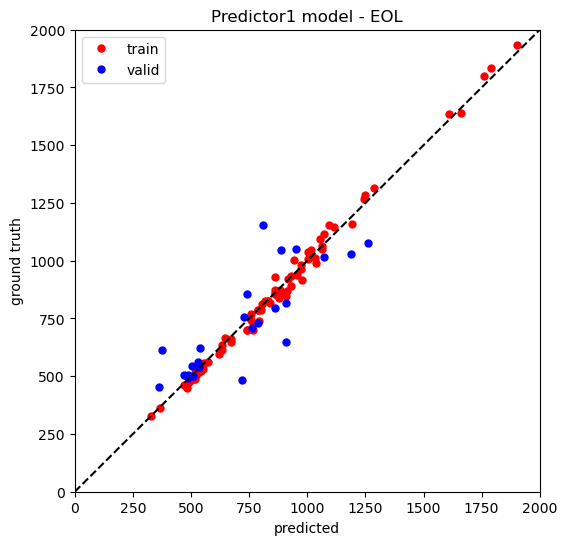

Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 53 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.95, MAPE: 0.03
Testing set|RMSE: 2.01, MAPE: 0.07


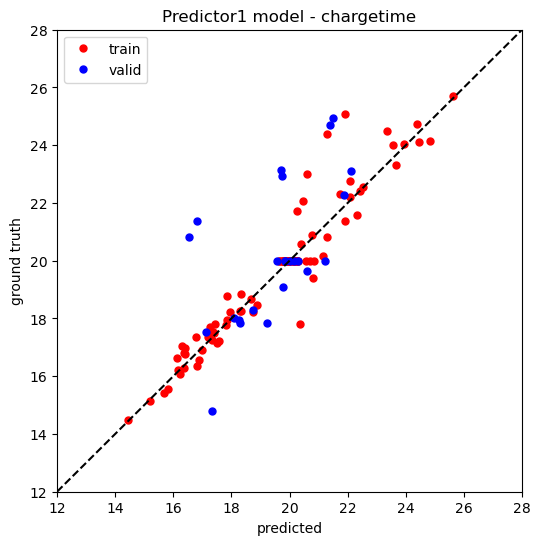

First 54 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 27.53, MAPE: 0.03
Testing set|RMSE: 135.38, MAPE: 0.13


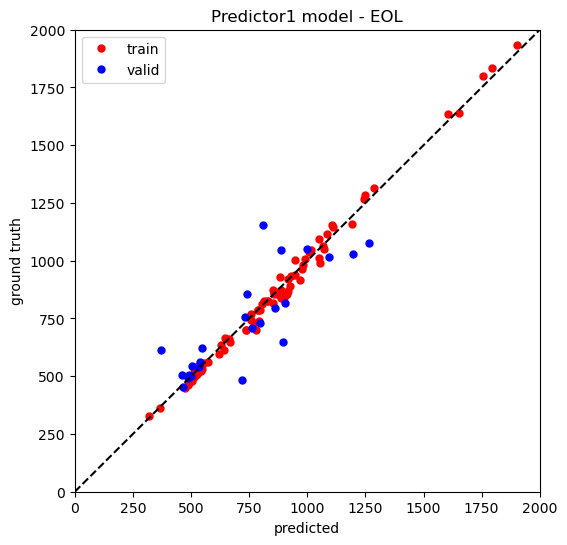

Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 54 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.79, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.07


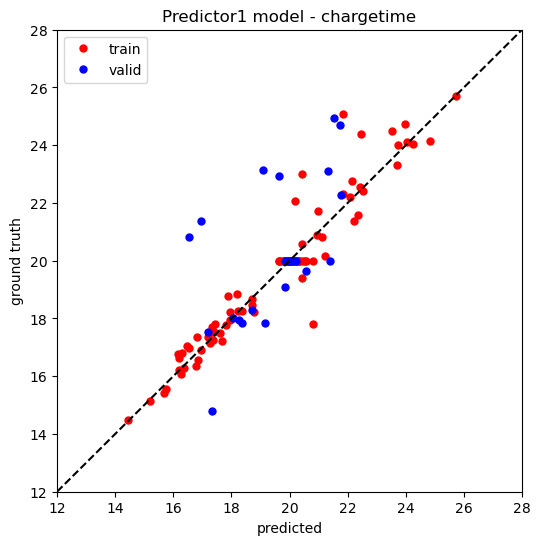

First 55 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.86, MAPE: 0.03
Testing set|RMSE: 129.87, MAPE: 0.13


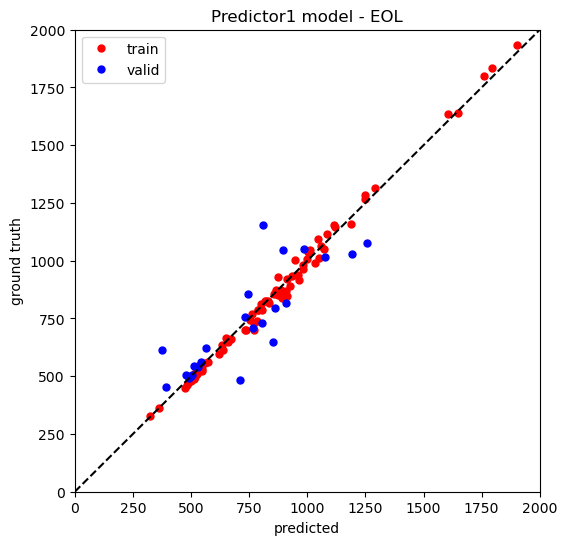

Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 55 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.78, MAPE: 0.02
Testing set|RMSE: 2.04, MAPE: 0.07


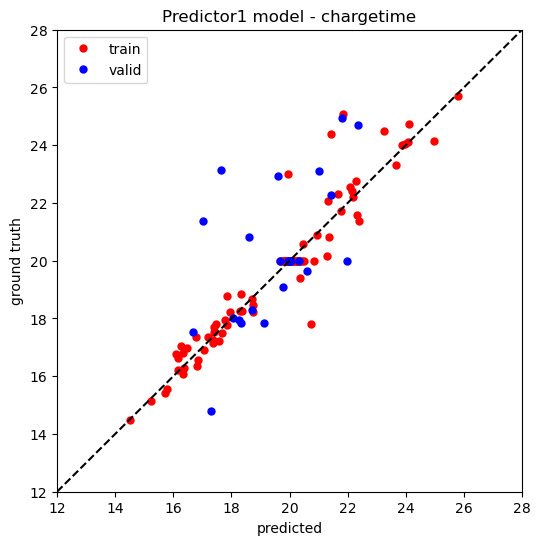

First 56 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.00, MAPE: 0.02
Testing set|RMSE: 130.88, MAPE: 0.13


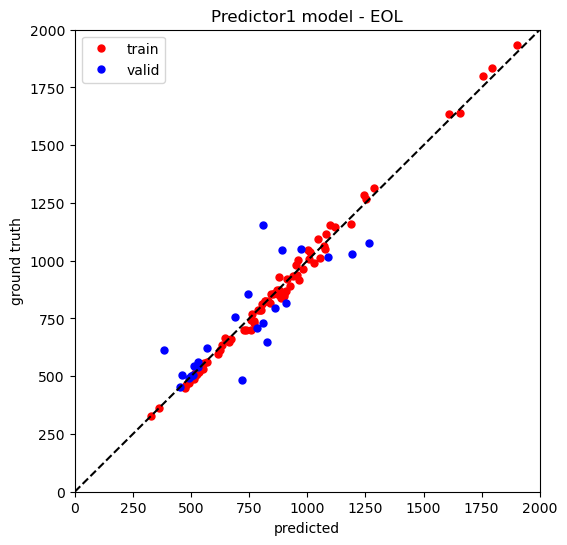

Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 56 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.76, MAPE: 0.02
Testing set|RMSE: 1.95, MAPE: 0.06


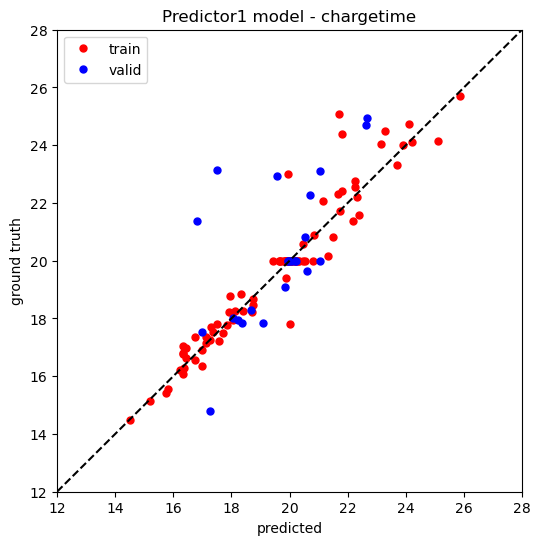

First 57 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.58, MAPE: 0.02
Testing set|RMSE: 130.80, MAPE: 0.13


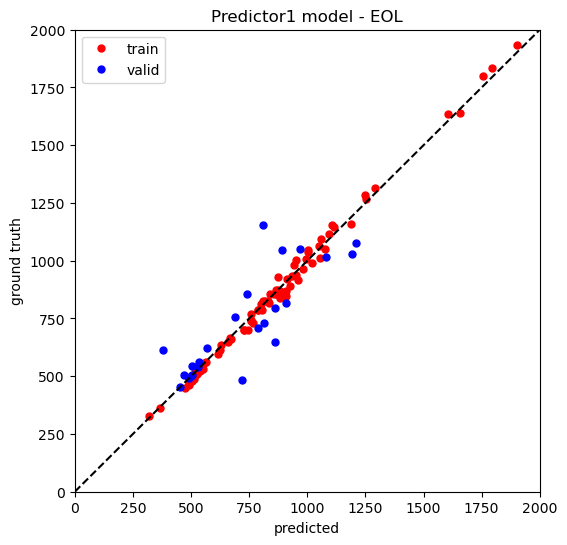

Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 57 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 1.99, MAPE: 0.06


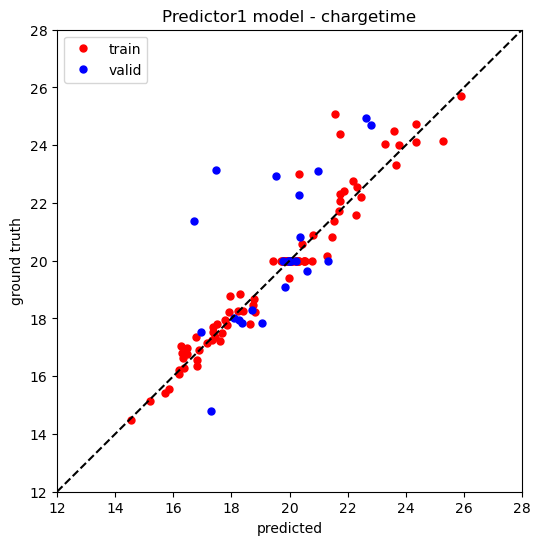

First 58 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.72, MAPE: 0.02
Testing set|RMSE: 129.03, MAPE: 0.13


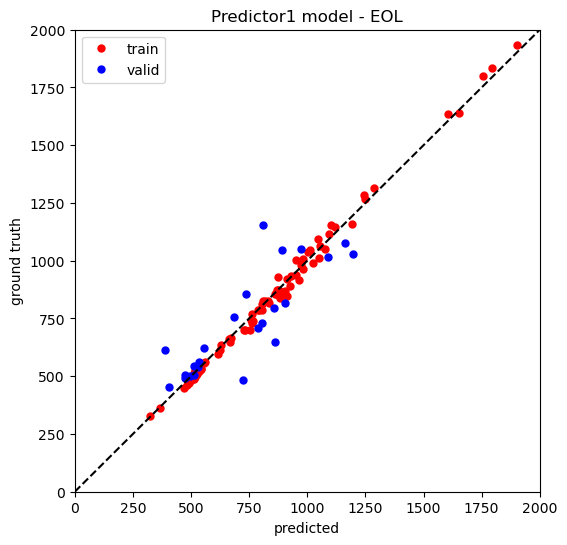

Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 58 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.69, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.07


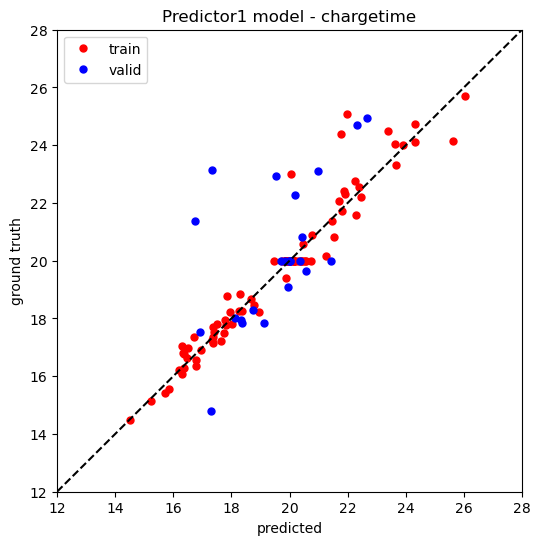

First 59 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.88, MAPE: 0.02
Testing set|RMSE: 127.28, MAPE: 0.13


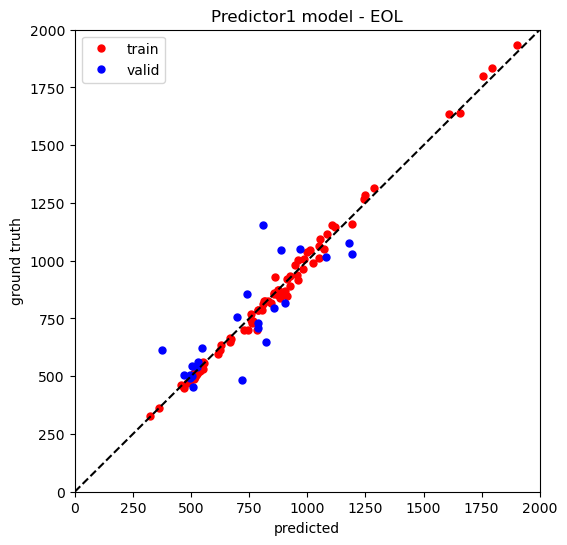

Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 59 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.07


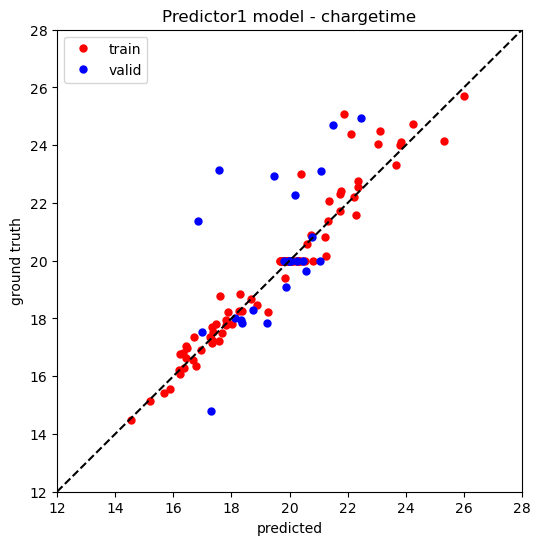

First 60 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.46, MAPE: 0.02
Testing set|RMSE: 126.47, MAPE: 0.13


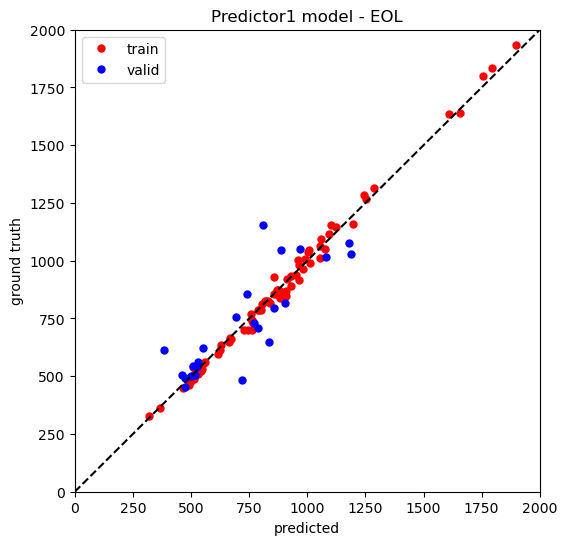

Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 60 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.72, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


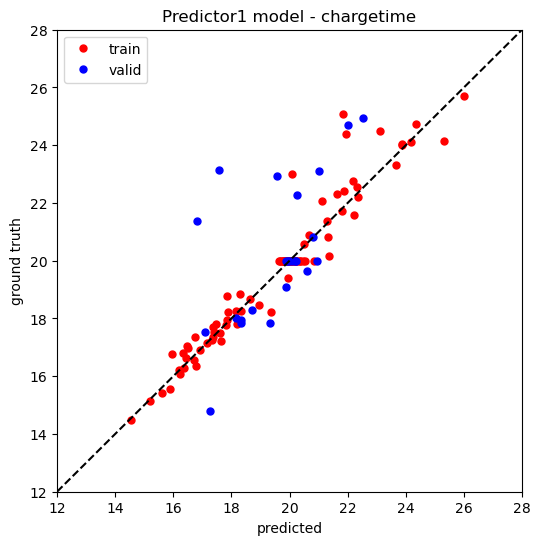

First 61 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.97, MAPE: 0.02
Testing set|RMSE: 125.70, MAPE: 0.12


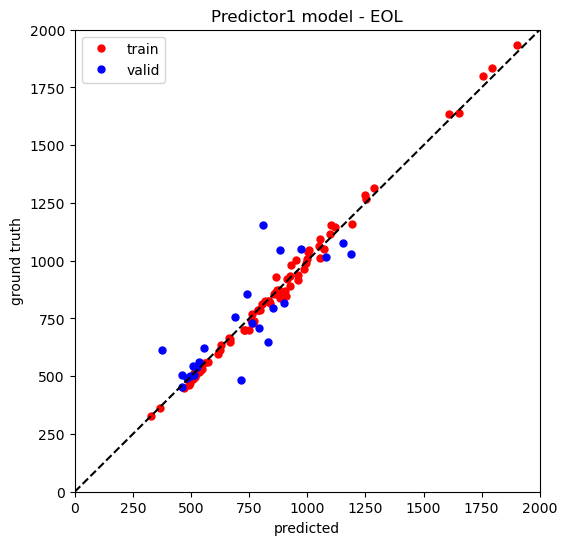

Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 61 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


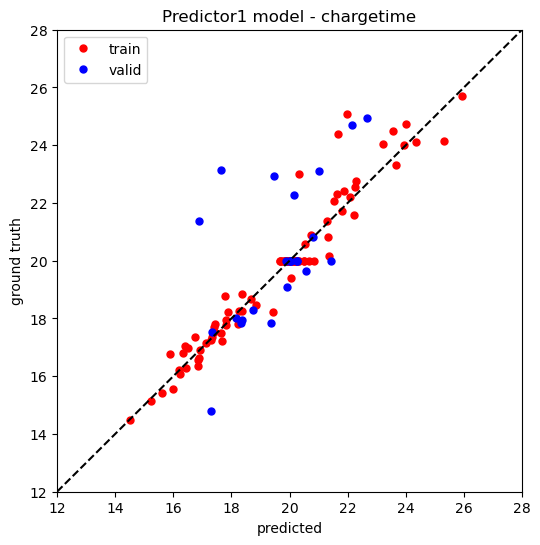

First 62 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.01, MAPE: 0.02
Testing set|RMSE: 130.11, MAPE: 0.13


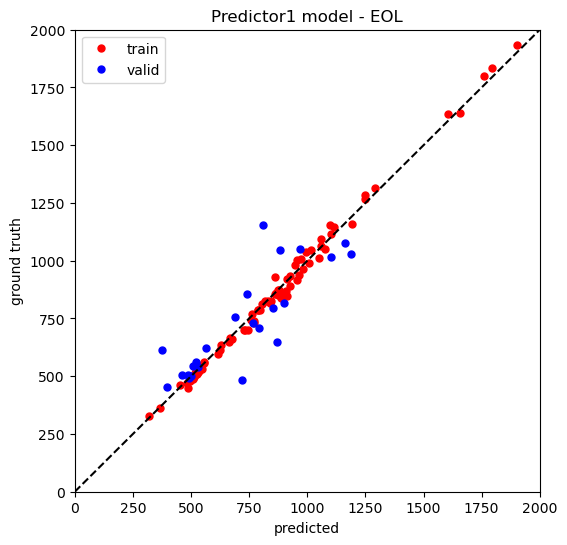

Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 62 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.71, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


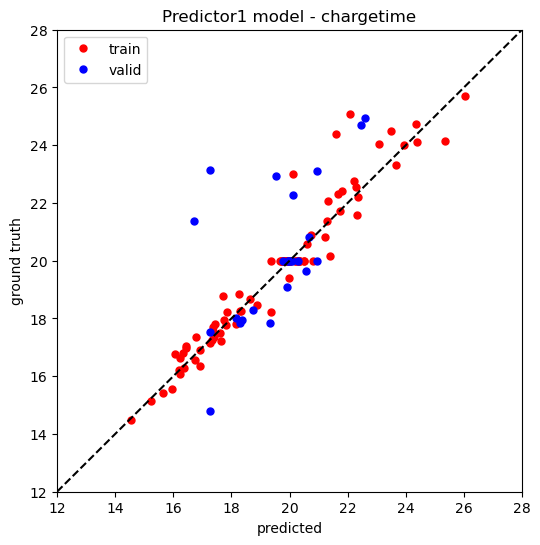

First 63 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.63, MAPE: 0.02
Testing set|RMSE: 127.19, MAPE: 0.13


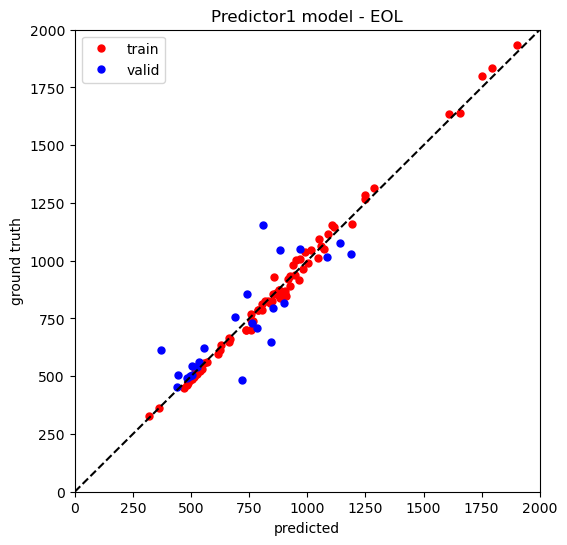

Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 63 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.73, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


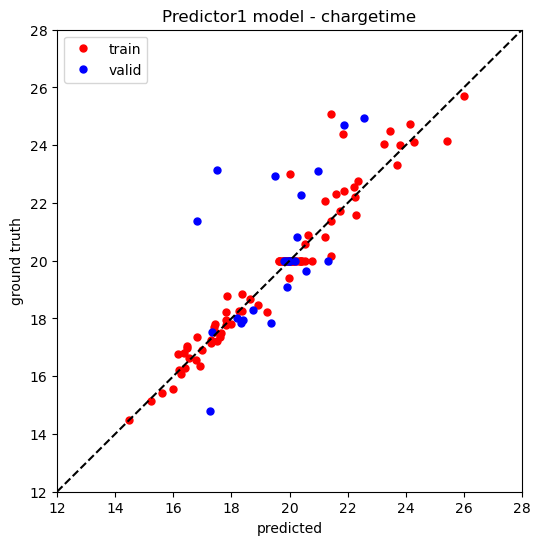

First 64 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.20, MAPE: 0.02
Testing set|RMSE: 123.57, MAPE: 0.12


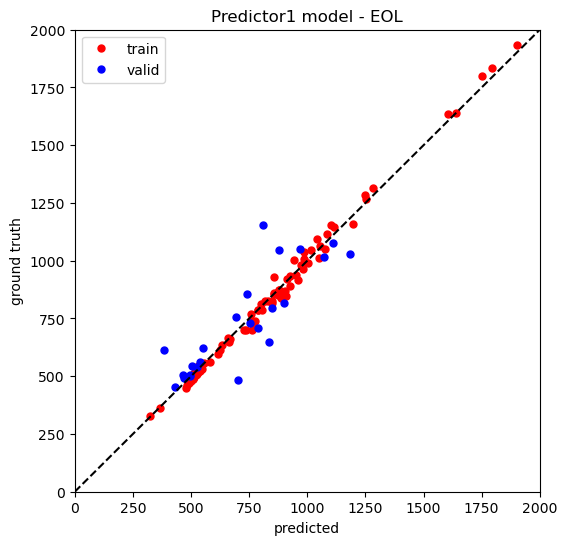

Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 64 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


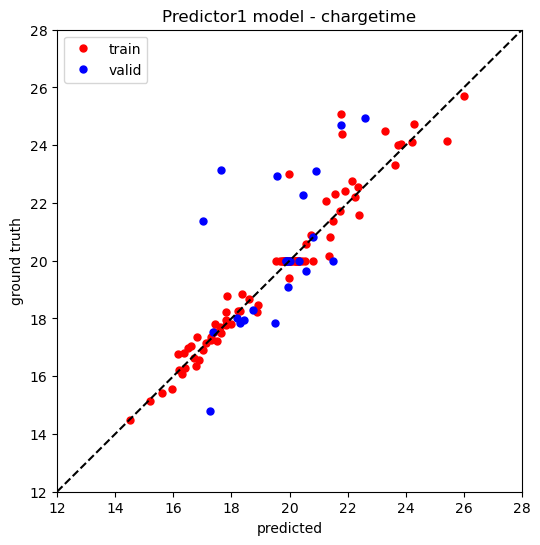

First 65 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.96, MAPE: 0.03
Testing set|RMSE: 127.07, MAPE: 0.12


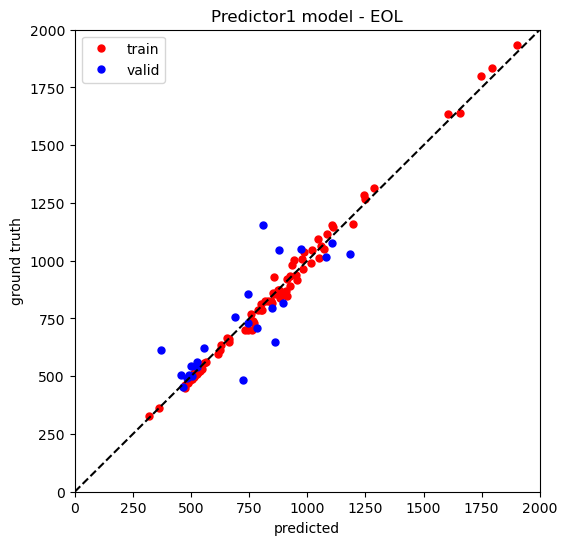

Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 65 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.69, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


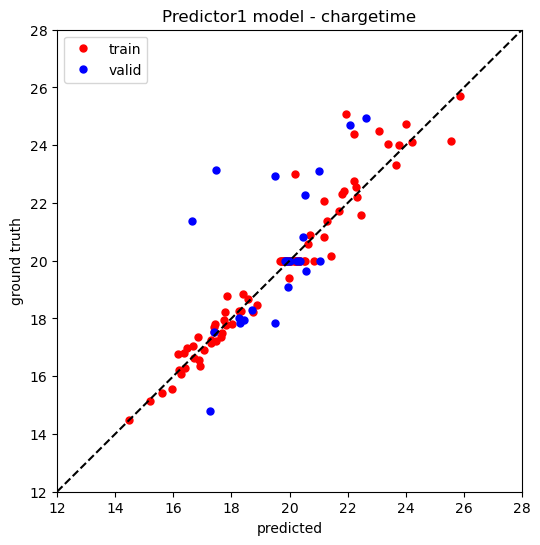

First 66 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.77, MAPE: 0.02
Testing set|RMSE: 127.43, MAPE: 0.12


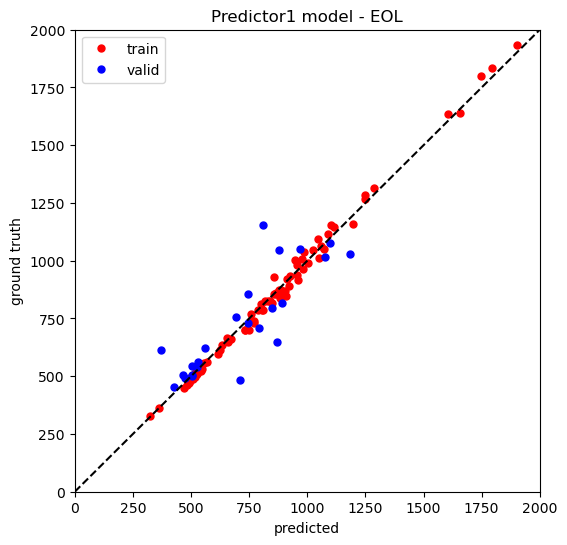

Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 66 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 1.99, MAPE: 0.06


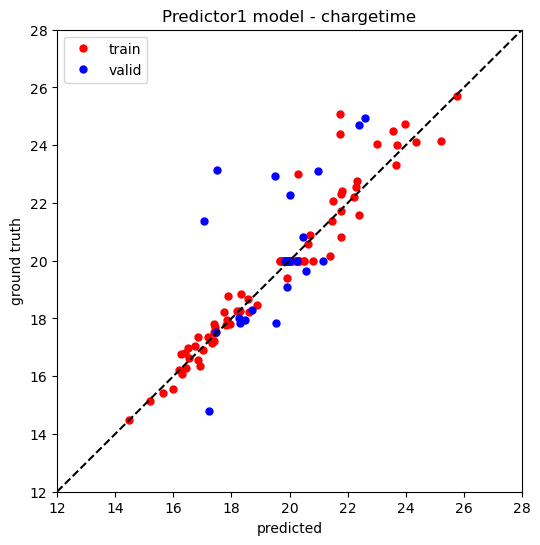

First 67 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.06, MAPE: 0.02
Testing set|RMSE: 128.82, MAPE: 0.13


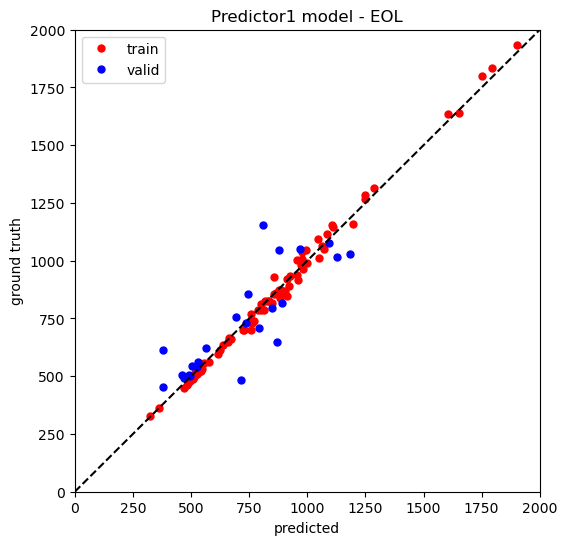

Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 67 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.70, MAPE: 0.02
Testing set|RMSE: 2.09, MAPE: 0.07


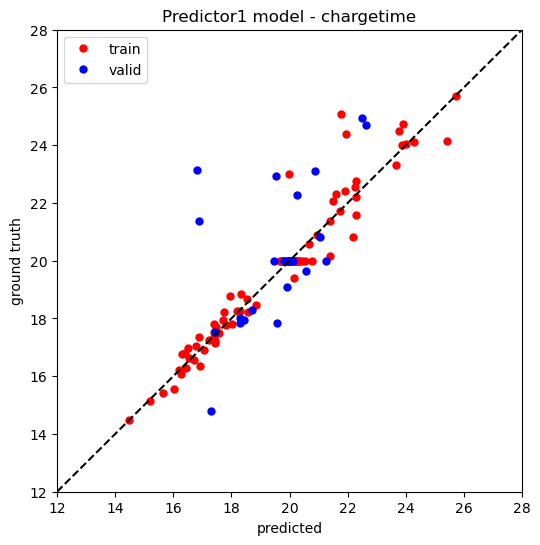

First 68 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.30, MAPE: 0.02
Testing set|RMSE: 126.39, MAPE: 0.13


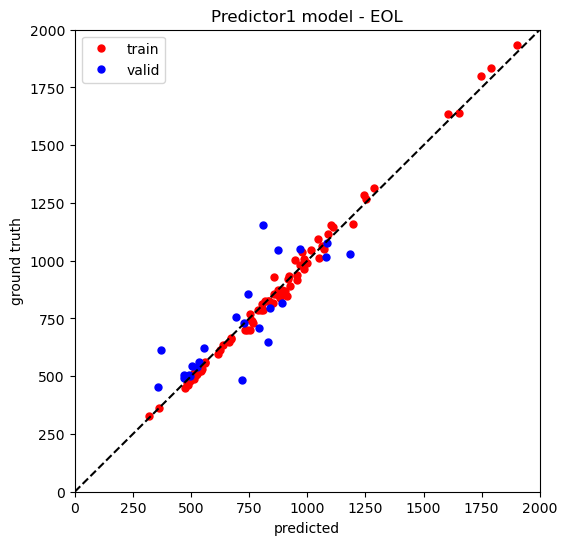

Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 68 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.72, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.07


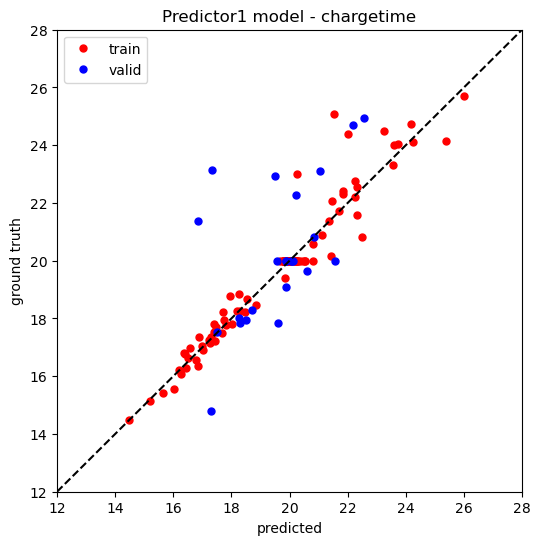

First 69 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.77, MAPE: 0.03
Testing set|RMSE: 125.93, MAPE: 0.12


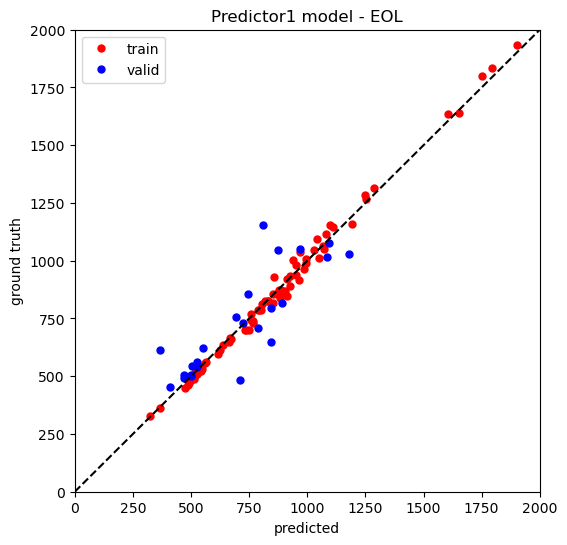

Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 69 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.72, MAPE: 0.02
Testing set|RMSE: 2.02, MAPE: 0.06


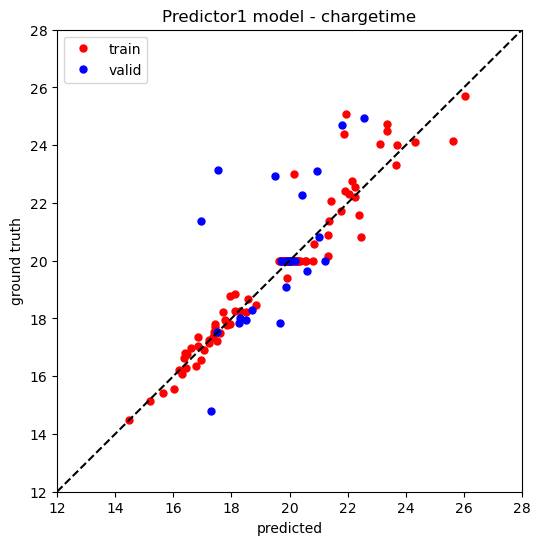

First 70 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.98, MAPE: 0.02
Testing set|RMSE: 126.47, MAPE: 0.12


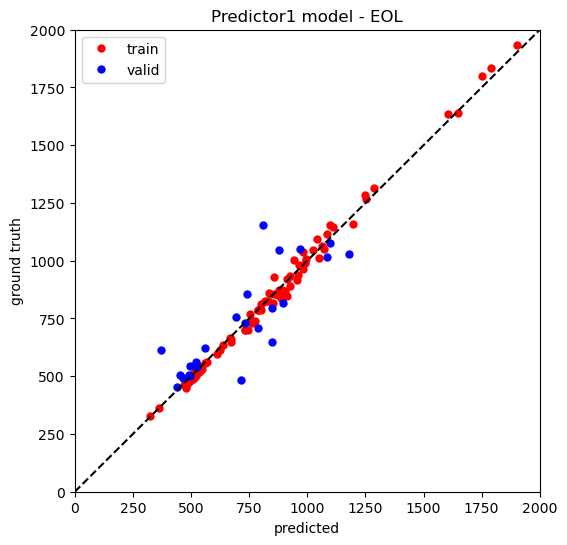

Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 70 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


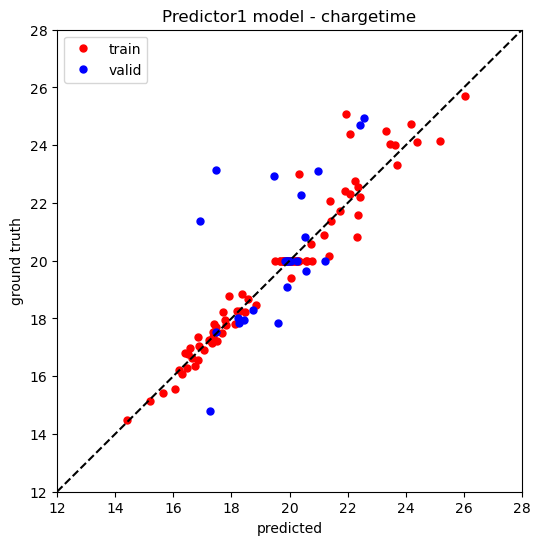

First 71 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.72, MAPE: 0.02
Testing set|RMSE: 126.64, MAPE: 0.12


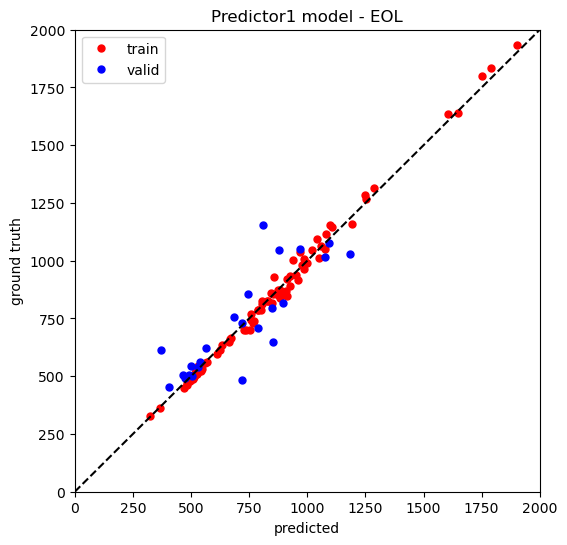

Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 71 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.07


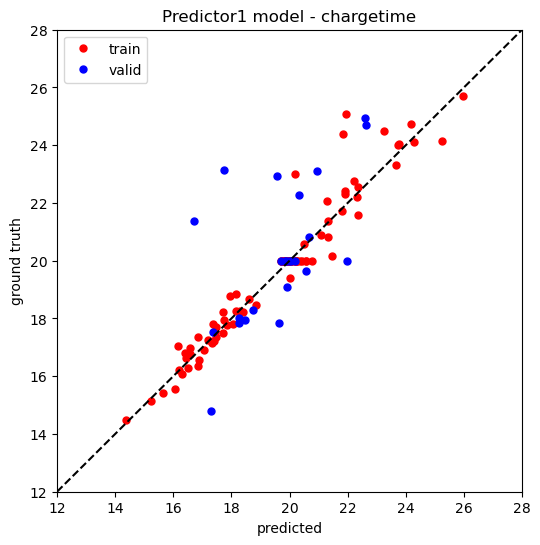

First 72 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.04, MAPE: 0.02
Testing set|RMSE: 128.03, MAPE: 0.12


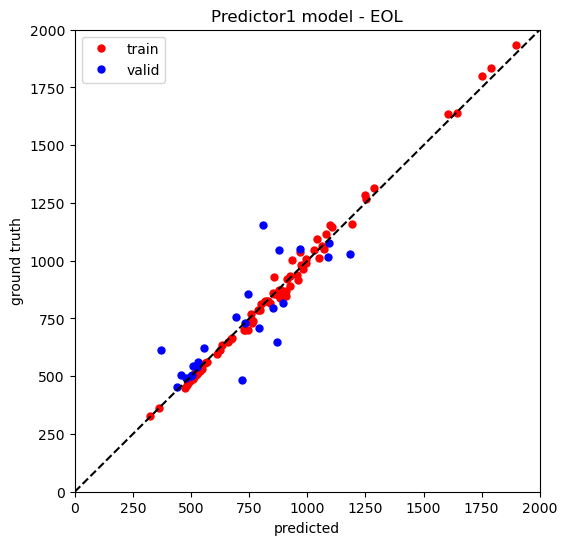

Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 72 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.69, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.06


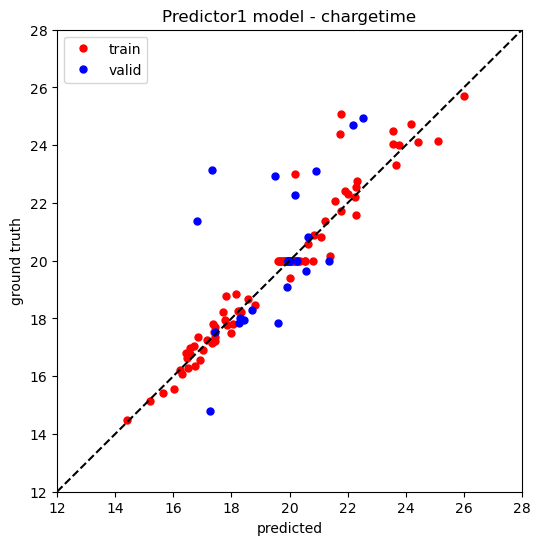

First 73 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.76, MAPE: 0.02
Testing set|RMSE: 125.64, MAPE: 0.12


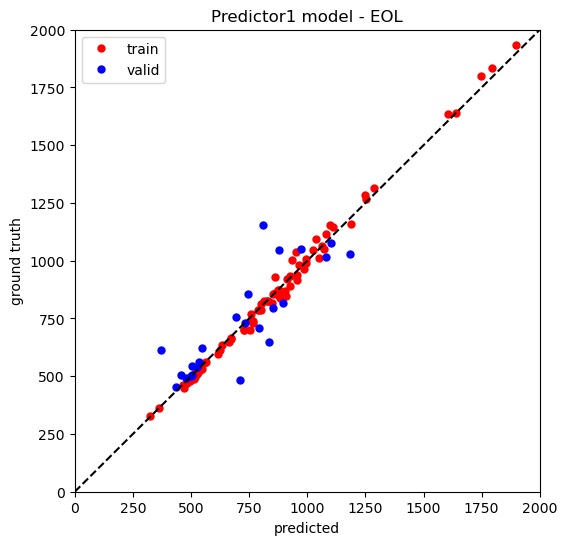

Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 73 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.69, MAPE: 0.02
Testing set|RMSE: 2.07, MAPE: 0.07


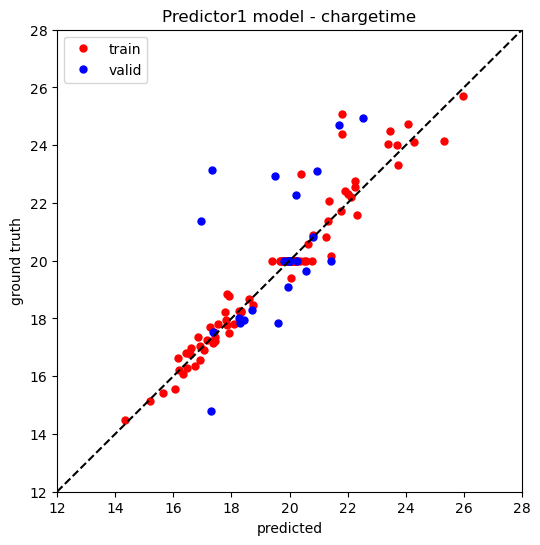

First 74 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.02, MAPE: 0.02
Testing set|RMSE: 131.57, MAPE: 0.13


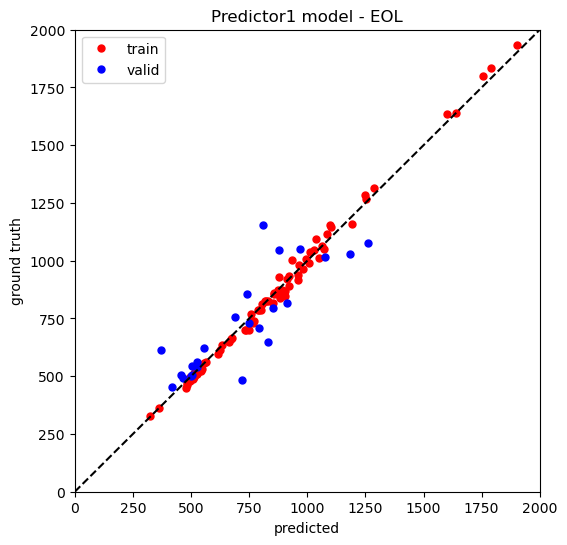

Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 74 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.02, MAPE: 0.06


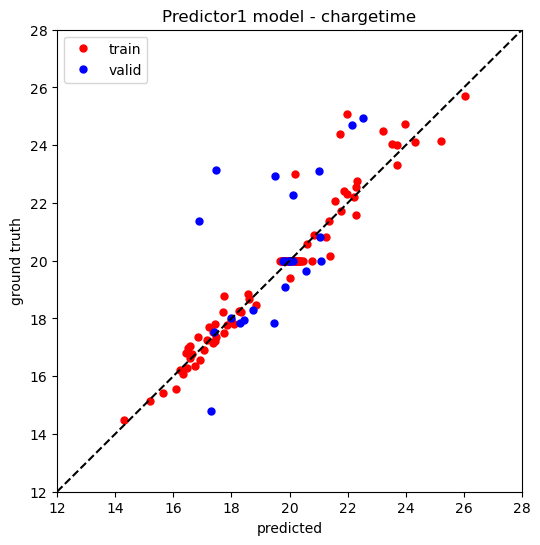

First 75 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.39, MAPE: 0.02
Testing set|RMSE: 127.68, MAPE: 0.13


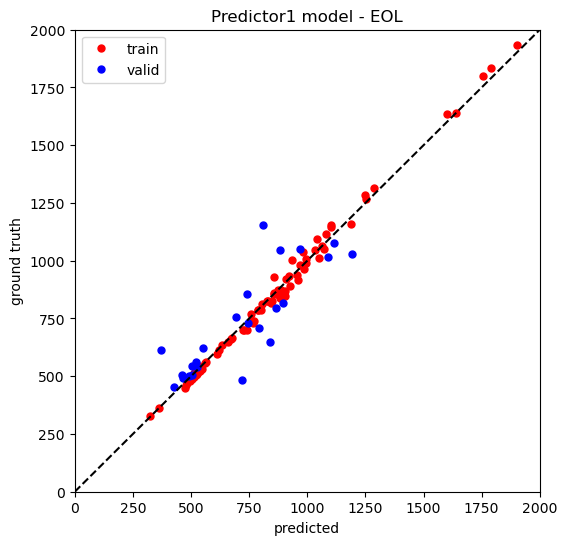

Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 75 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.05, MAPE: 0.06


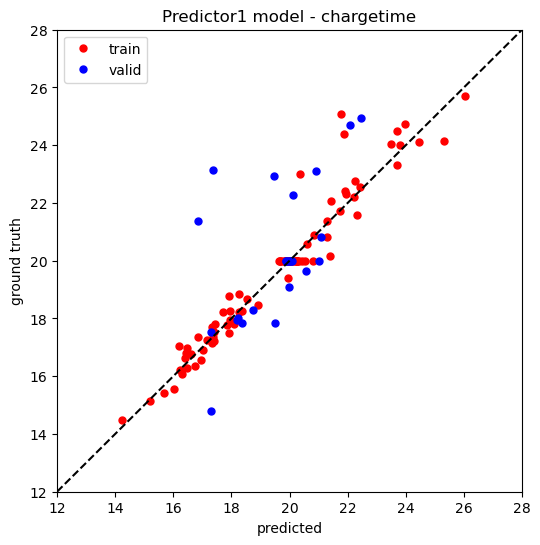

First 76 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.21, MAPE: 0.02
Testing set|RMSE: 126.21, MAPE: 0.12


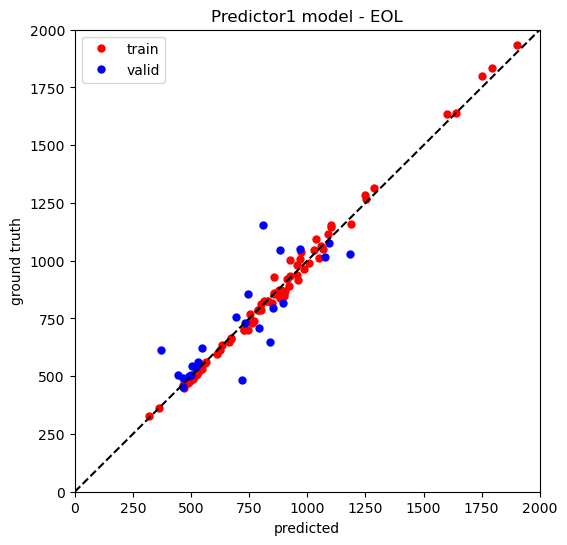

Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 76 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.04, MAPE: 0.06


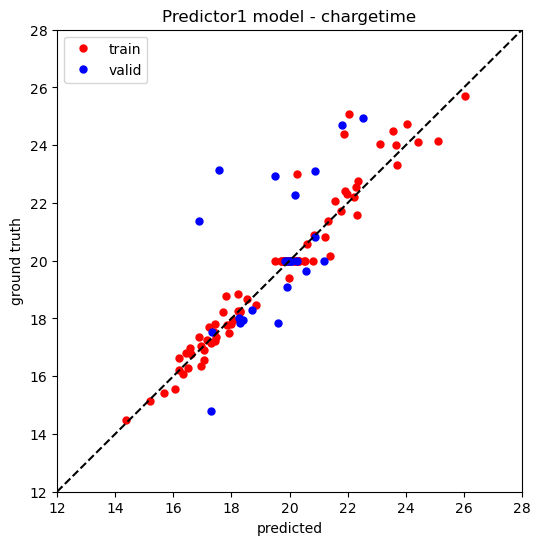

First 77 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 26.02, MAPE: 0.02
Testing set|RMSE: 125.44, MAPE: 0.12


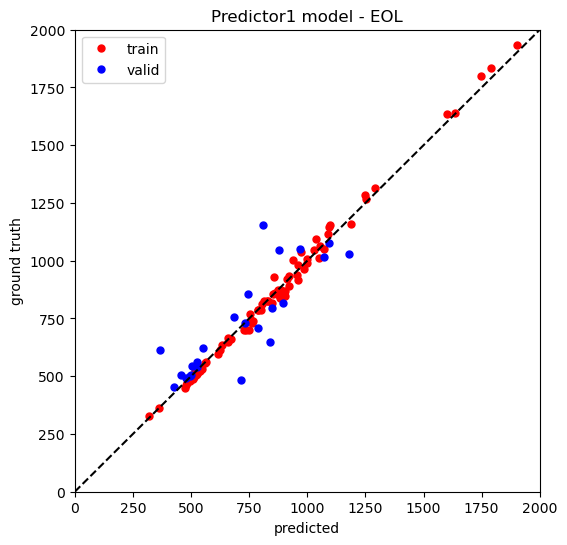

Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 77 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


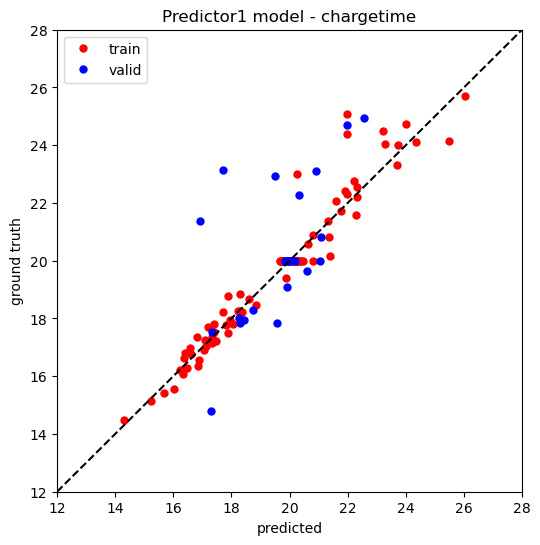

First 78 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.64, MAPE: 0.02
Testing set|RMSE: 126.88, MAPE: 0.13


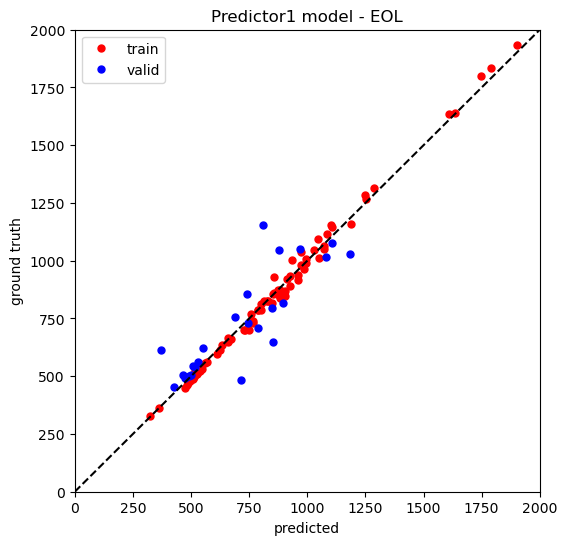

Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 78 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


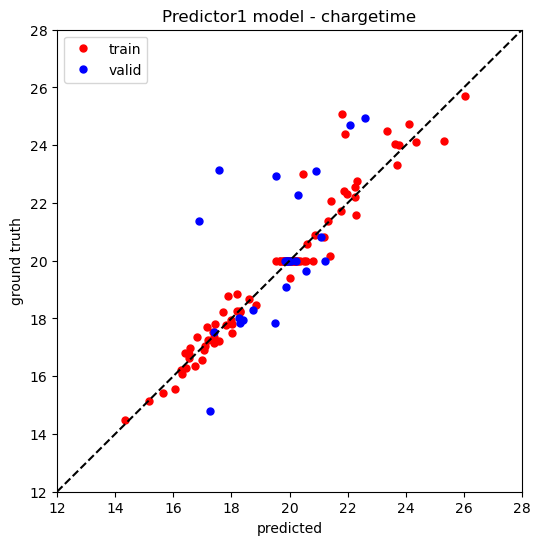

First 79 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.51, MAPE: 0.02
Testing set|RMSE: 126.45, MAPE: 0.13


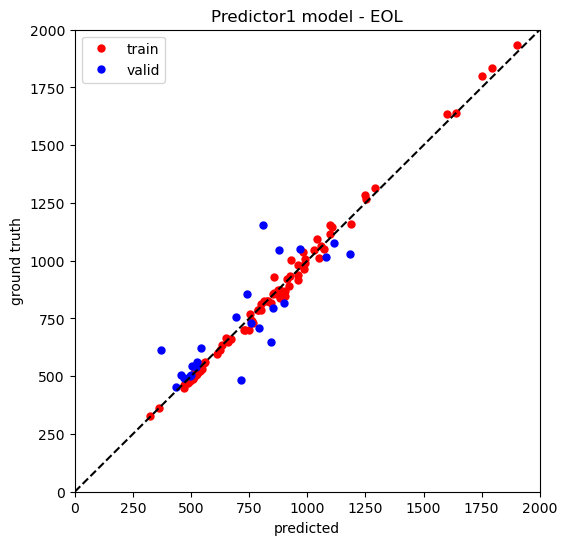

Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 79 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


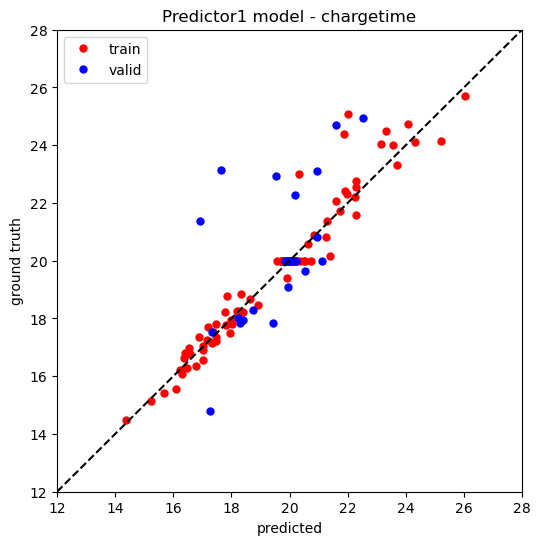

First 80 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.43, MAPE: 0.02
Testing set|RMSE: 126.24, MAPE: 0.12


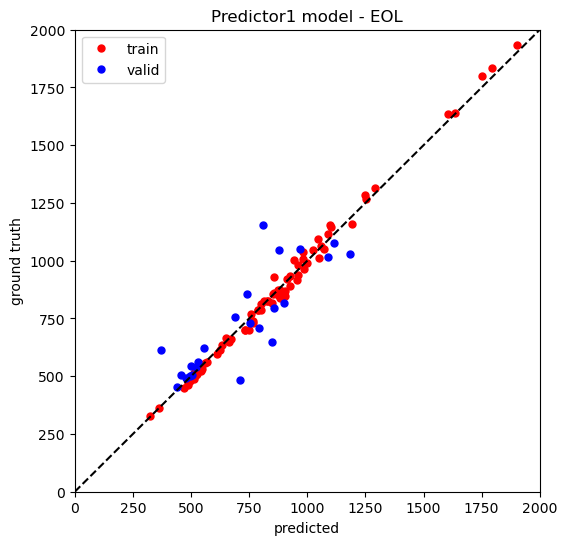

Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 80 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


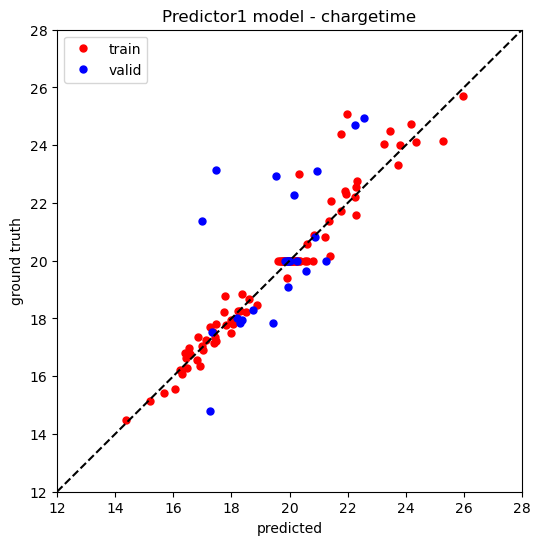

First 81 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.71, MAPE: 0.02
Testing set|RMSE: 127.49, MAPE: 0.13


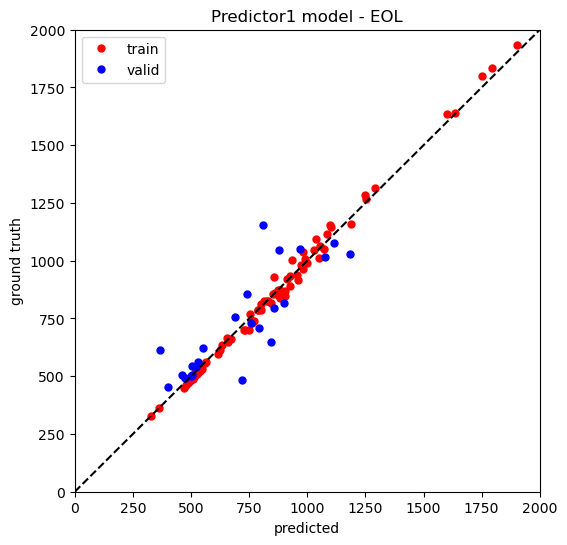

Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 81 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


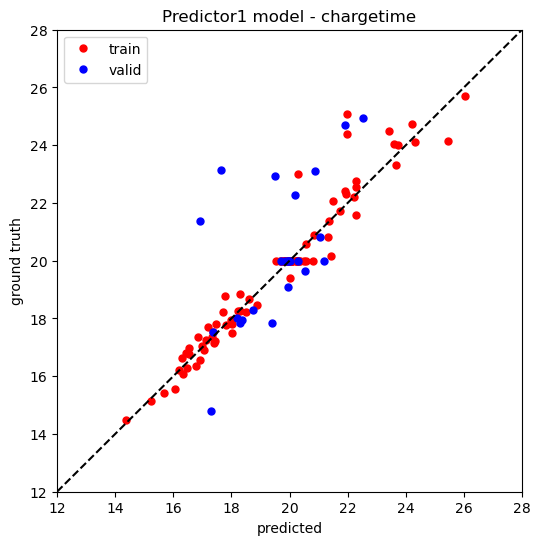

First 82 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.72, MAPE: 0.02
Testing set|RMSE: 126.07, MAPE: 0.13


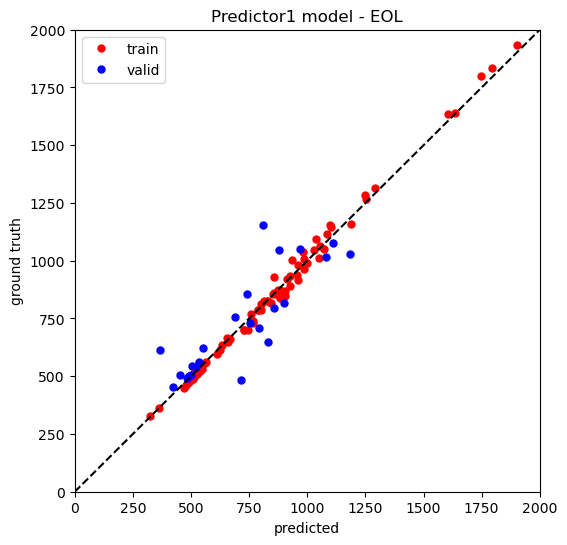

Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 82 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


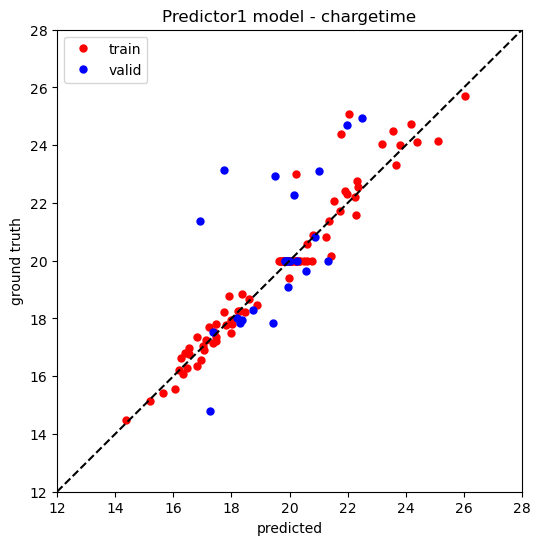

First 83 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.78, MAPE: 0.02
Testing set|RMSE: 127.76, MAPE: 0.13


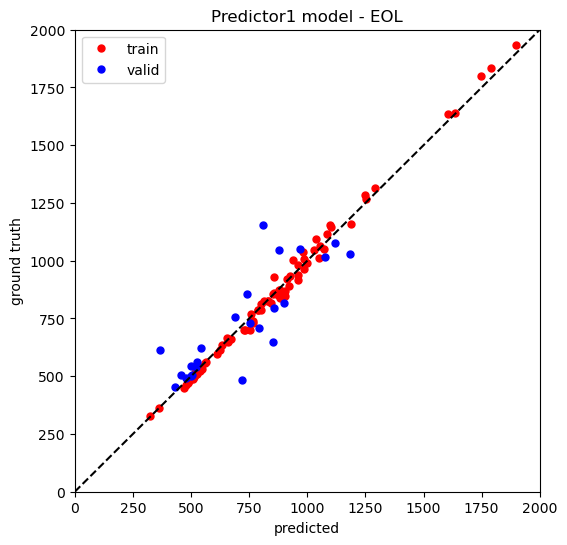

Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 83 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.03, MAPE: 0.06


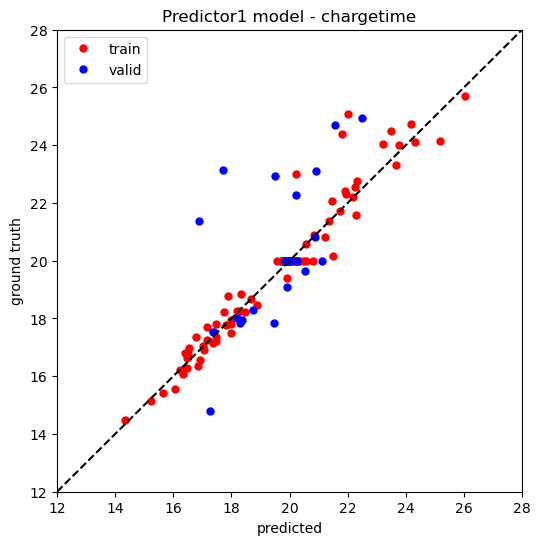

First 84 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.31, MAPE: 0.02
Testing set|RMSE: 126.57, MAPE: 0.13


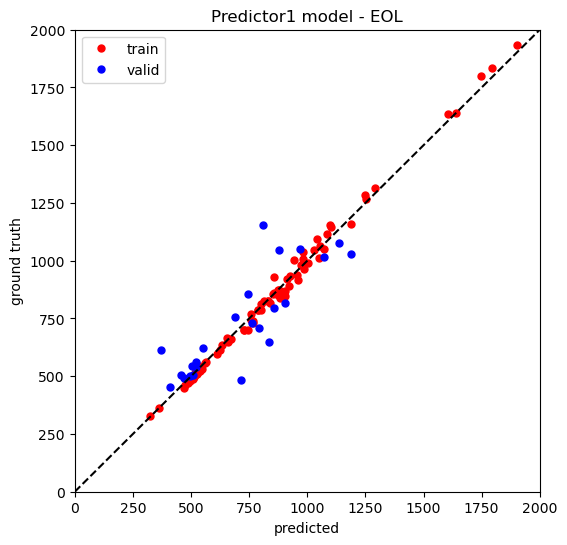

Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 84 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


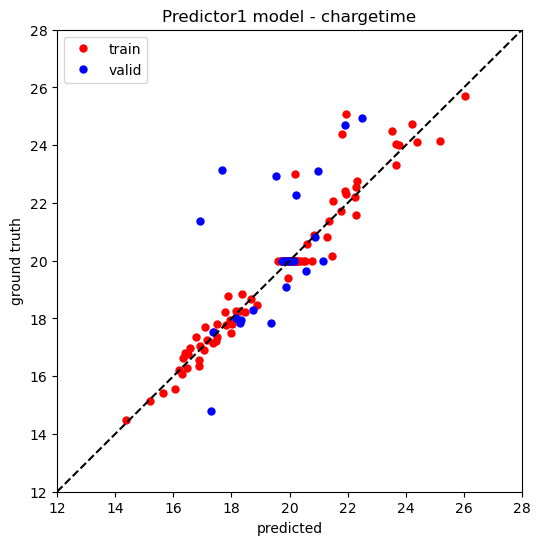

First 85 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.13, MAPE: 0.02
Testing set|RMSE: 128.41, MAPE: 0.13


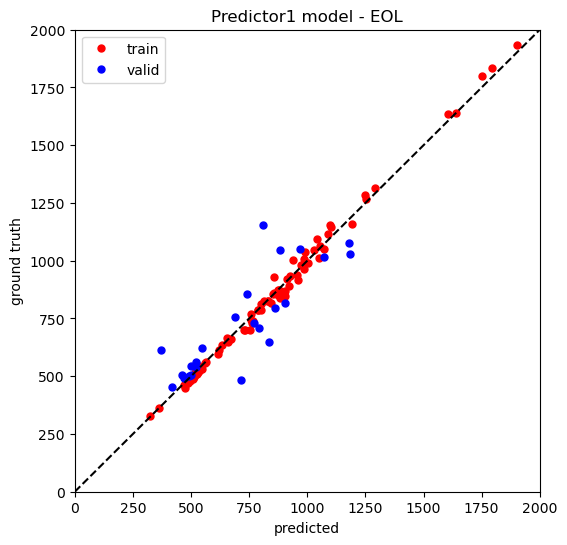

Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 85 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


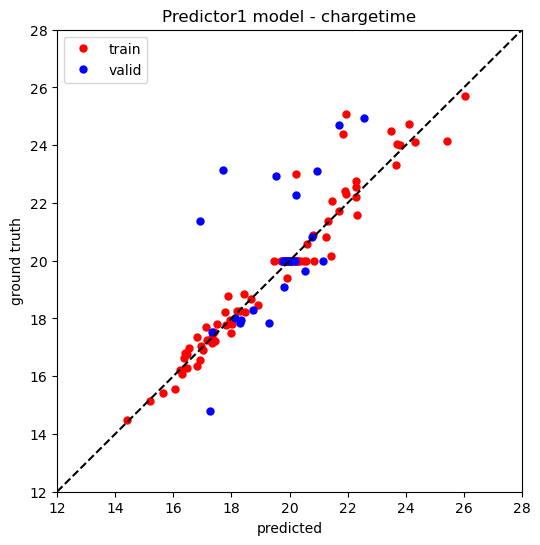

First 86 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.25, MAPE: 0.02
Testing set|RMSE: 129.16, MAPE: 0.13


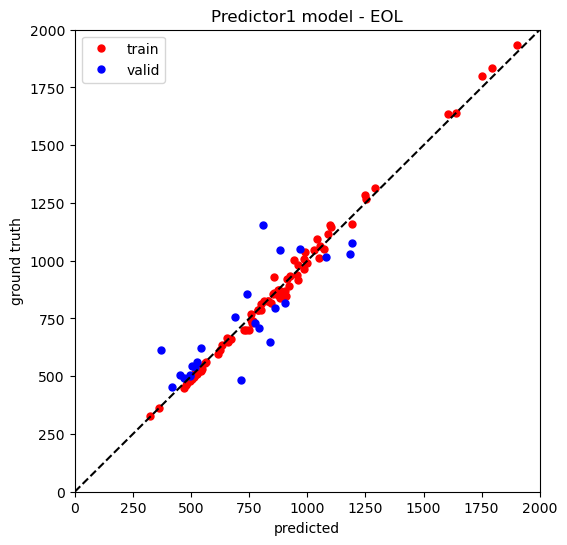

Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 86 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.68, MAPE: 0.02
Testing set|RMSE: 2.02, MAPE: 0.06


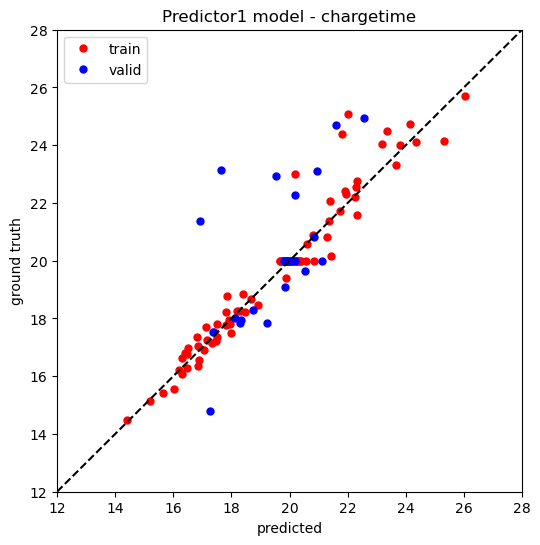

First 87 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 24.96, MAPE: 0.02
Testing set|RMSE: 129.26, MAPE: 0.14


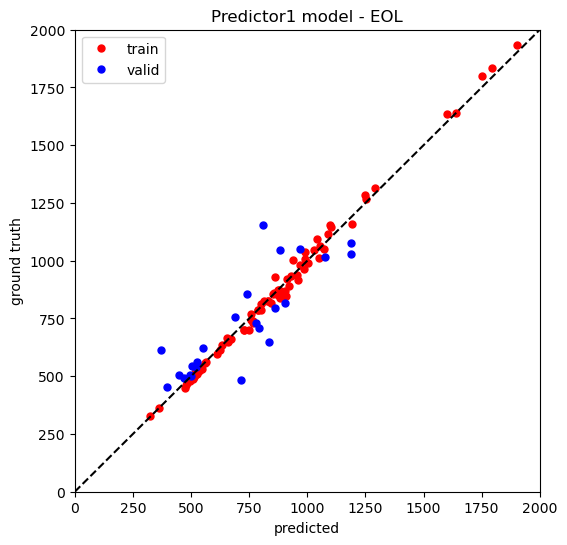

Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 87 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.00, MAPE: 0.06


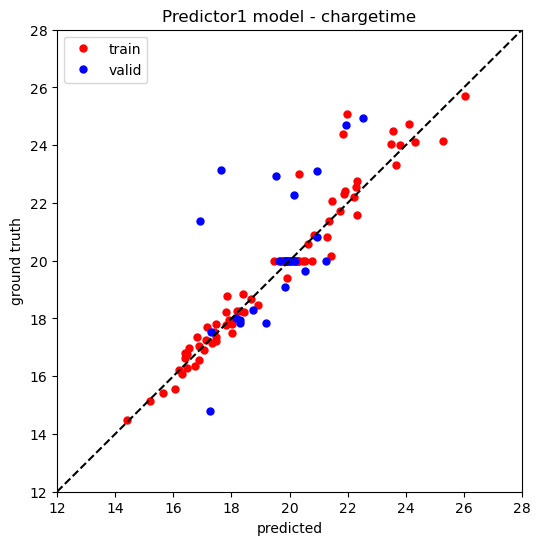

First 88 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.39, MAPE: 0.02
Testing set|RMSE: 129.24, MAPE: 0.14


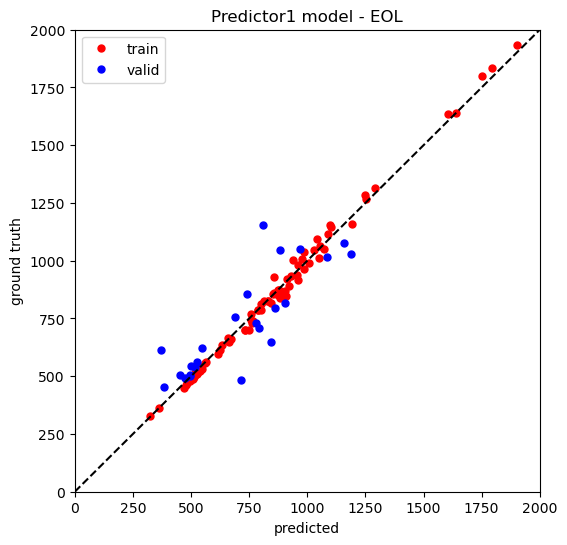

Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 88 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


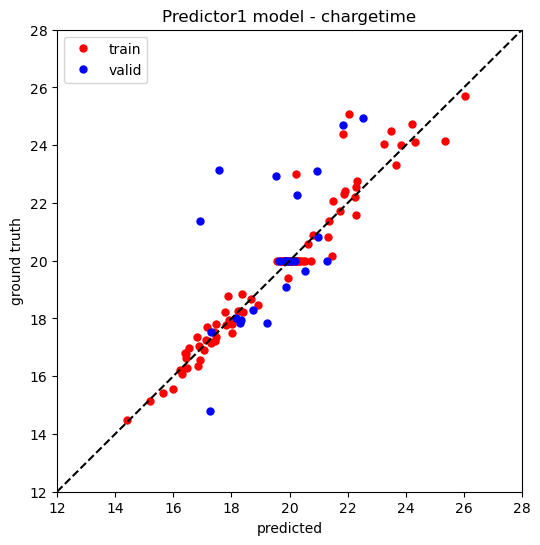

First 89 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.36, MAPE: 0.02
Testing set|RMSE: 128.14, MAPE: 0.13


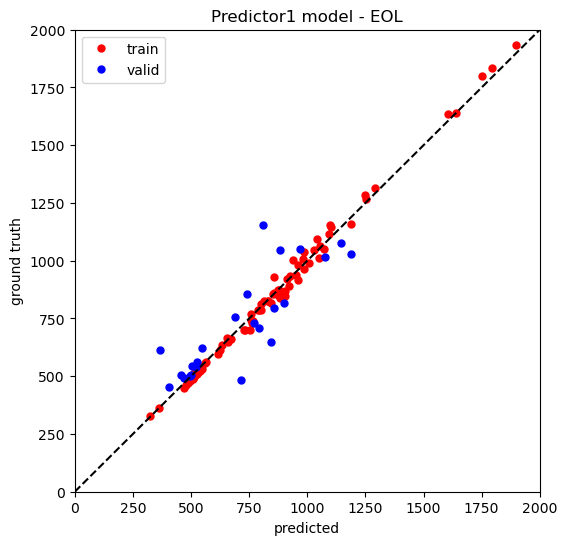

Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 89 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 1.99, MAPE: 0.06


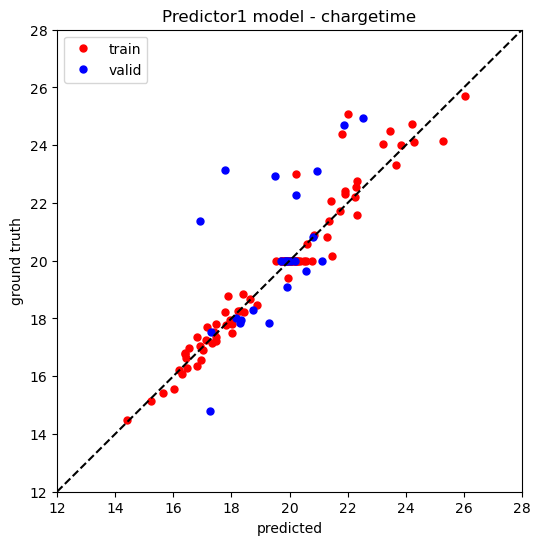

First 90 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.31, MAPE: 0.02
Testing set|RMSE: 127.41, MAPE: 0.13


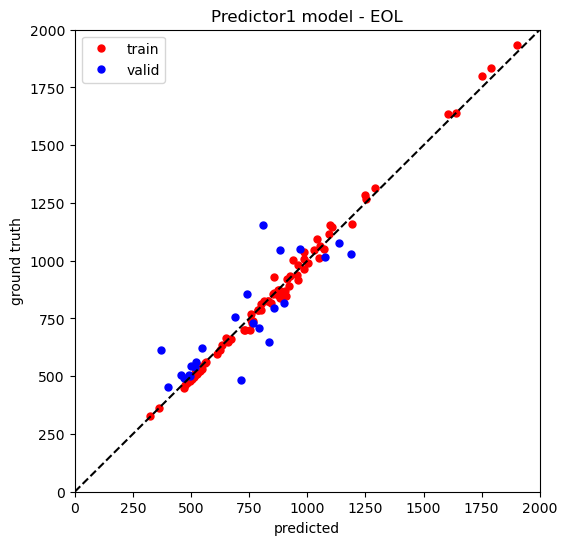

Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 90 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


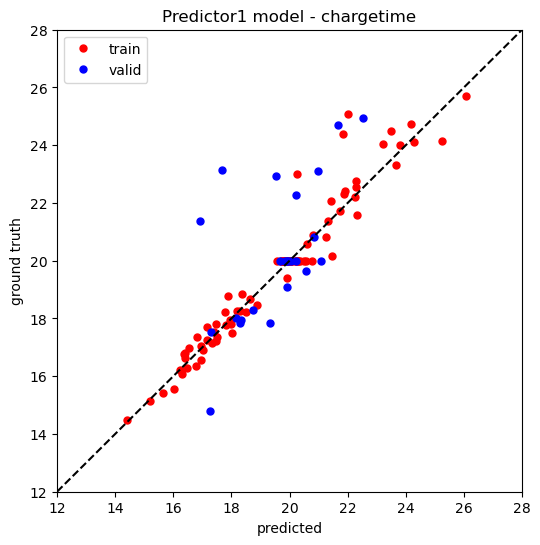

First 91 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.27, MAPE: 0.02
Testing set|RMSE: 127.29, MAPE: 0.13


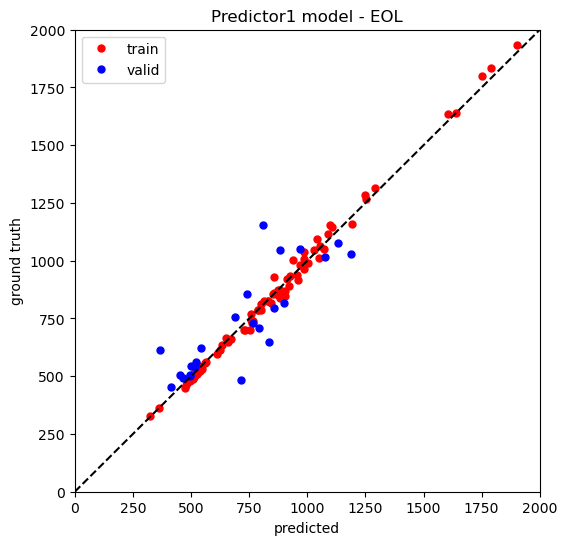

Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 91 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


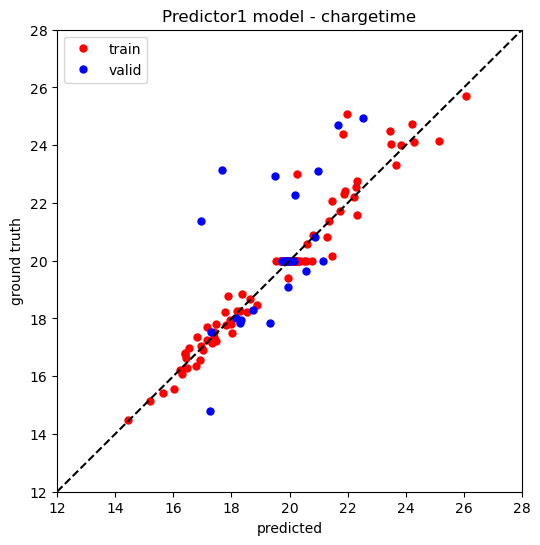

First 92 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.07, MAPE: 0.02
Testing set|RMSE: 127.32, MAPE: 0.13


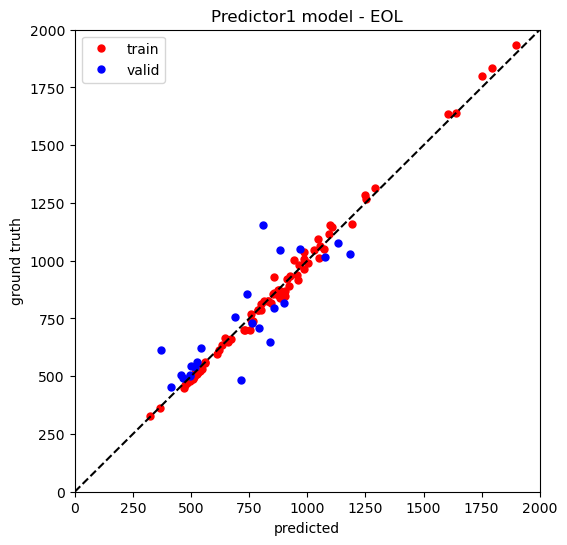

Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 92 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


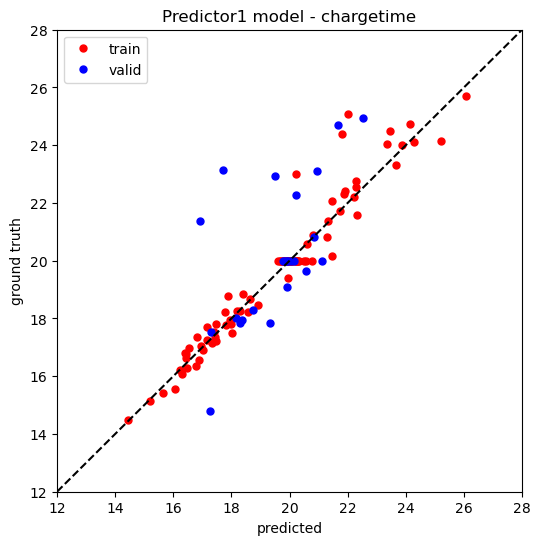

First 93 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.10, MAPE: 0.02
Testing set|RMSE: 127.53, MAPE: 0.13


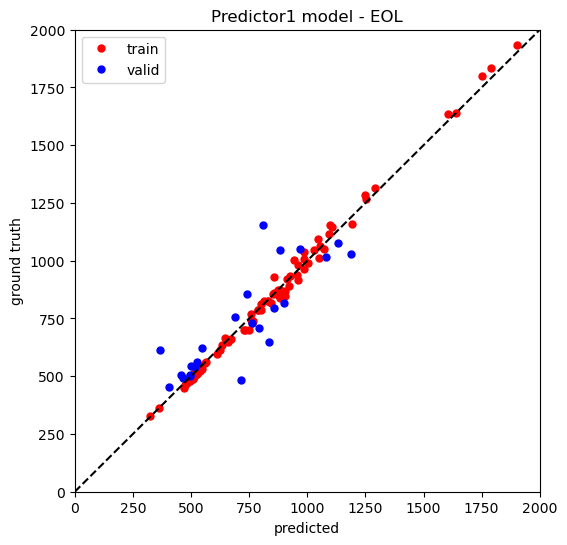

Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 93 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


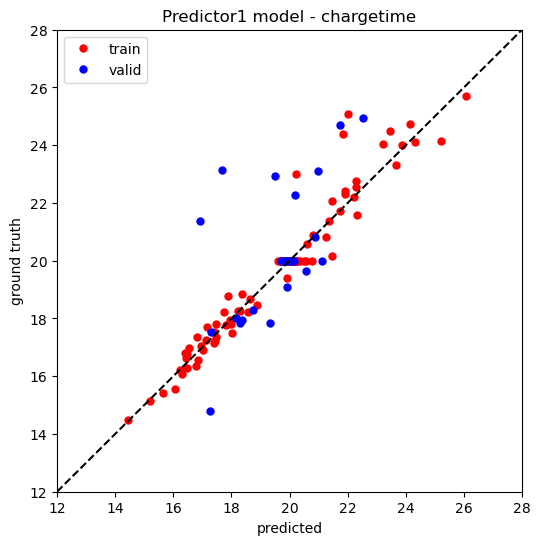

First 94 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.19, MAPE: 0.02
Testing set|RMSE: 127.41, MAPE: 0.13


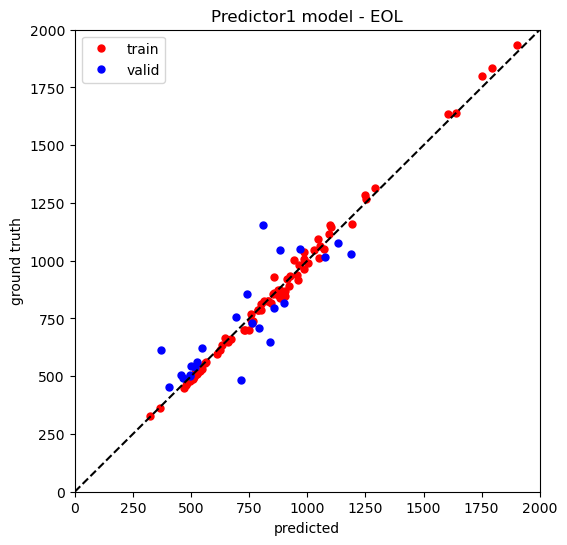

Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 94 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


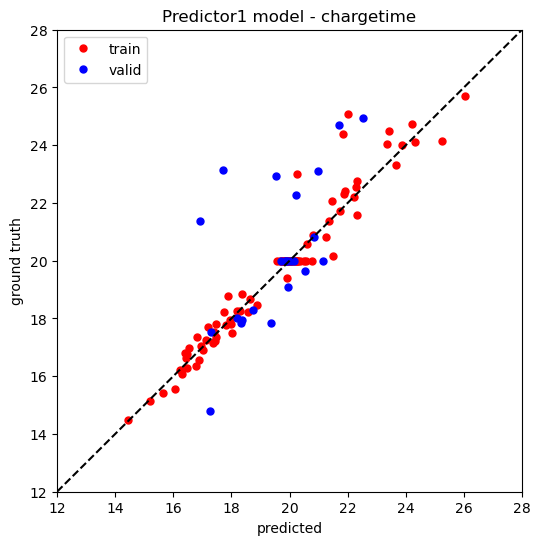

First 95 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.21, MAPE: 0.02
Testing set|RMSE: 127.57, MAPE: 0.13


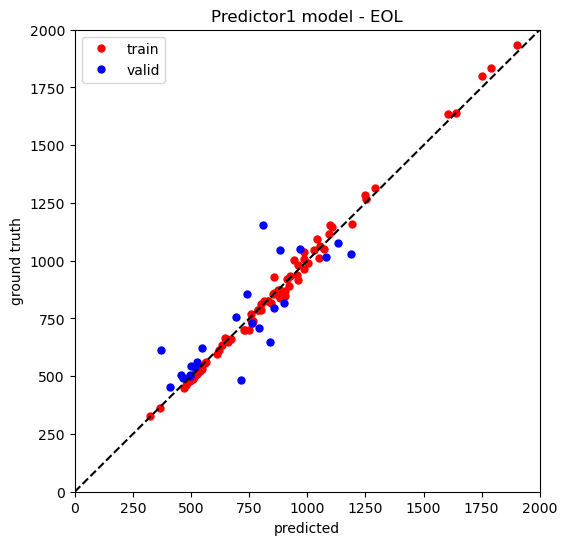

Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 95 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


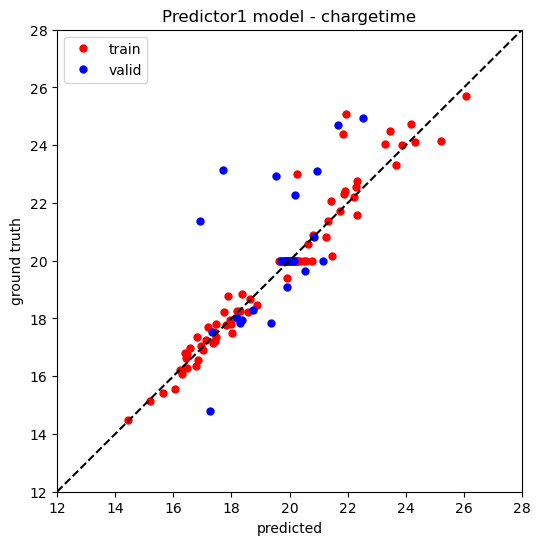

First 96 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.29, MAPE: 0.02
Testing set|RMSE: 127.46, MAPE: 0.13


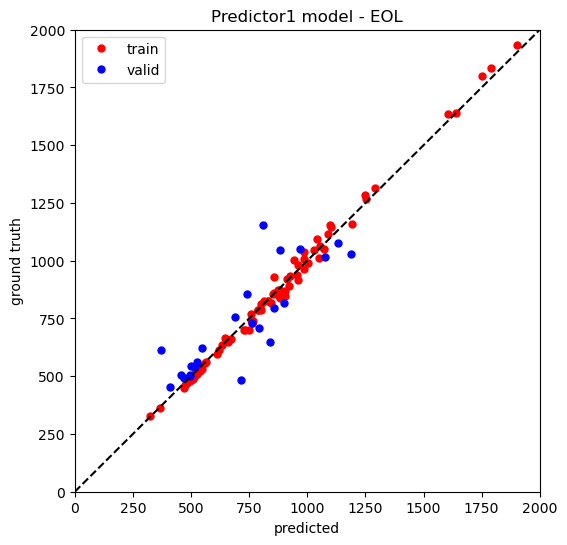

Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 96 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


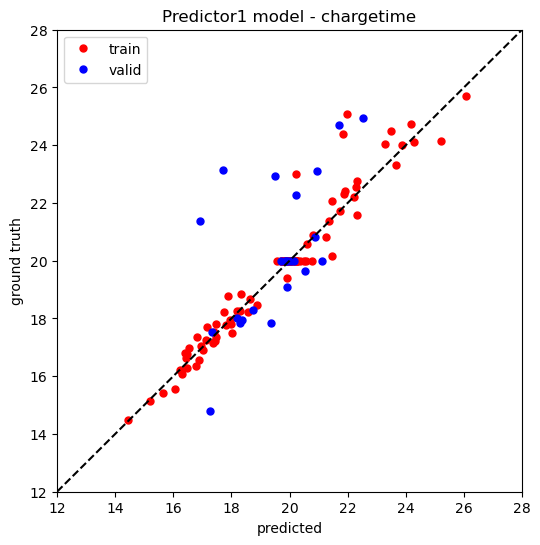

First 97 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.30, MAPE: 0.02
Testing set|RMSE: 127.35, MAPE: 0.13


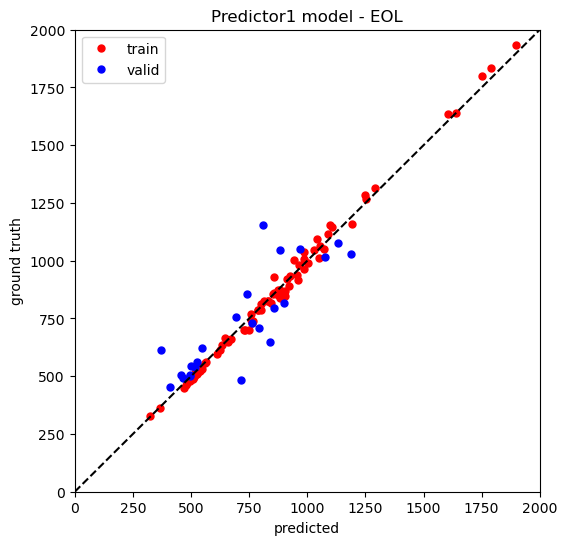

Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 97 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


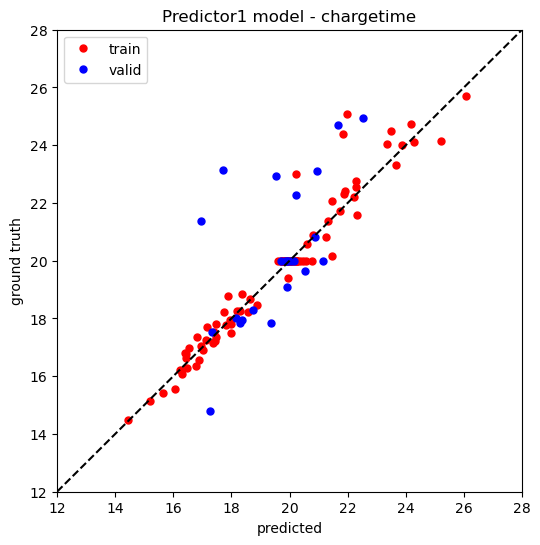

First 98 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.27, MAPE: 0.02
Testing set|RMSE: 127.42, MAPE: 0.13


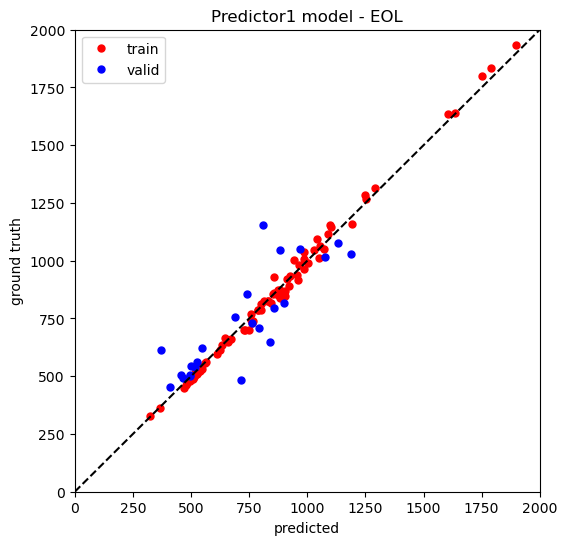

Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 98 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


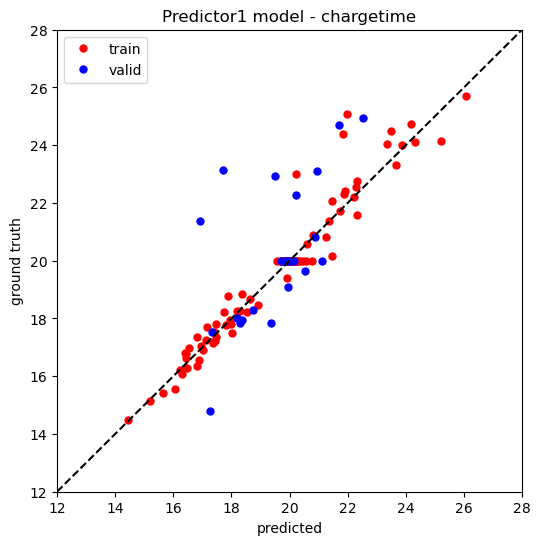

First 99 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.28, MAPE: 0.02
Testing set|RMSE: 127.46, MAPE: 0.13


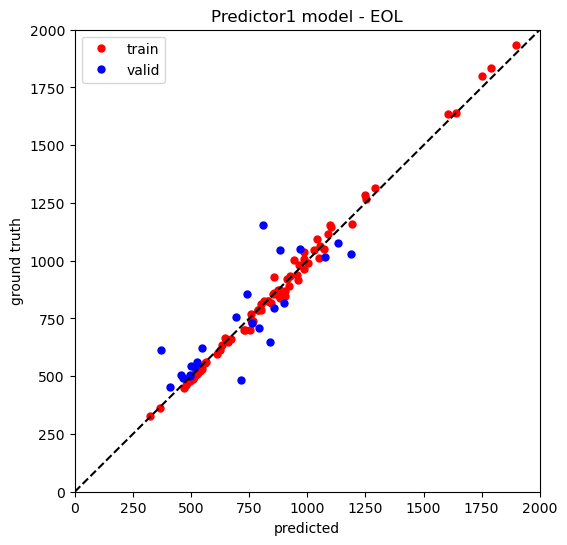

Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 99 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


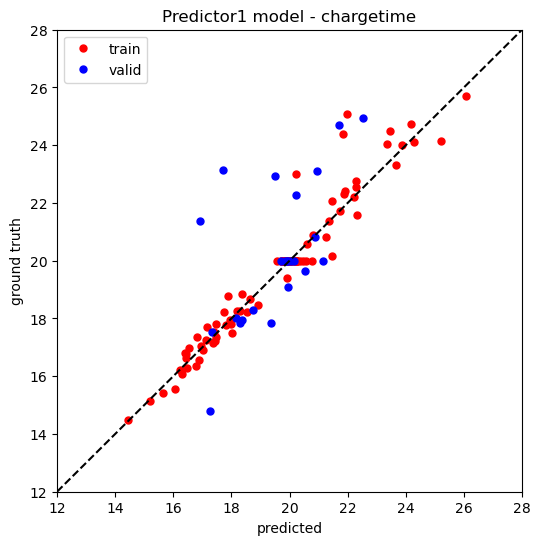

First 100 cycle data evaluation
+----------------------------------------------------------+
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 25.28, MAPE: 0.02
Testing set|RMSE: 127.44, MAPE: 0.13


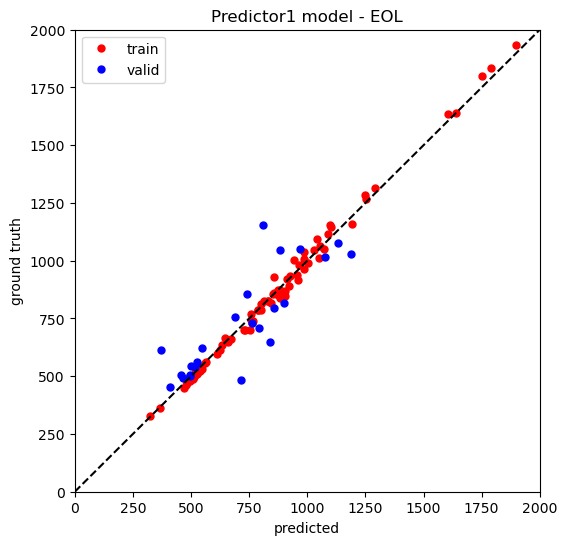

Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
Predictor1_dataset is in evaluation mode.
First 100 cycles are being used.
torch.Size([91, 8, 100])
Training set|RMSE: 0.67, MAPE: 0.02
Testing set|RMSE: 2.01, MAPE: 0.06


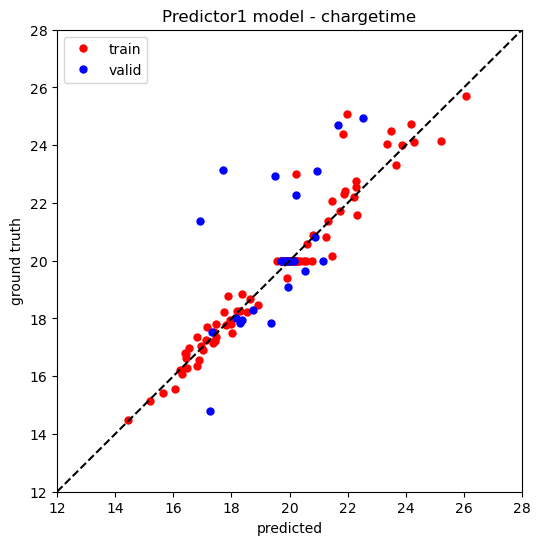

+----------------------------------------------------------+
All evaluation are done.


In [ ]:
rmse_all = {'train_eol': [], 'train_ct': [], 'test_eol': [], 'test_ct': []}
predictor1_file = 'Model/predictor1_state1md1.pth'
set_code = 'state0'
for a in range(100):
    print(f'First {a+1} cycle data evaluation')
    print('+----------------------------------------------------------+')
    model = torch.load(predictor1_file)
    model.eval()
    _, test_eol_rmse = predictor1_eval(model, norm=True, cycle_used=a+1, train_batch_size=91, test_batch_size=24, file_tag='', set_code=set_code, pred_target='EOL')
    _, test_ct_rmse = predictor1_eval(model, norm=True, cycle_used=a+1, train_batch_size=91, test_batch_size=24, file_tag='', set_code=set_code, pred_target='chargetime')
    rmse_all['test_eol'].append(test_eol_rmse)
    rmse_all['test_ct'].append(test_ct_rmse)

print('+----------------------------------------------------------+')
print('All evaluation are done.')

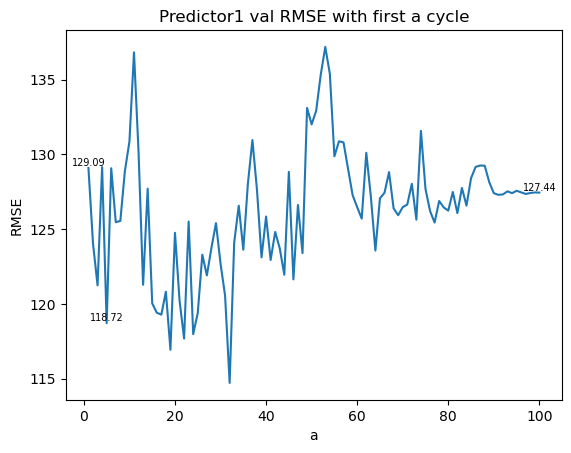

In [ ]:
plt.figure()
plt.plot(np.arange(100)+1, rmse_all['test_eol'])
plt.title('Predictor1 val RMSE with first a cycle')
for a,b in zip(np.arange(100)+1, rmse_all['test_eol']):
    if a == 1 or a == 5 or a == 100:
        plt.text(a, b, '%.2f' % b, ha='center', va= 'bottom',fontsize=7)
plt.xlabel('a')
plt.ylabel('RMSE')
plt.show()

In [ ]:
# test_a = [1, 5, 10, 20, 30, 40,50, 60, 70, 80, 90, 100]
# rmse_all = {'eol': [], 'ct': []}
# train_val_split(train_ratio=0.8, seed=1, set_code='seed1')

# for a in test_a:
#     print('+----------------------------------------------------------+')
#     print(f'Training first {a} cycles model')
#     ##########DimReduct1###########
#     # load dataset
#     batch_size=23

#     eol_train_dataset = DimReduction_dataset(train=True, pred_target='EOL', norm=True, cycle_used=a, set_code='seed1')
#     eol_test_dataset = DimReduction_dataset(train=False, pred_target='EOL', norm=True, cycle_used=a, set_code='seed1')

#     eol_train_loader = DataLoader(eol_train_dataset, batch_size=batch_size, shuffle=True)
#     eol_test_loader = DataLoader(eol_test_dataset, batch_size=batch_size, shuffle=True)

#     # load model
#     model_eol = DimReduction_1(in_ch=4, out_ch=1).cuda()

#     dimreduct1_model, eol_train_loss, eol_valid_loss = dimreduct1_train(model_eol, eol_train_loader, eol_test_loader,
#                                                                         patience=50,
#                                                                         lr=6*1e-3,
#                                                                         cosine_period=10,
#                                                                         min_lr=1e-5,
#                                                                         weight_decay=8*1e-2)

#     file = 'Model/dimreduct1_first'+str(a)+'.pth'
#     torch.save(dimreduct1_model, file)
#     print('Dimreduct1 saved path: '+file)

#     # loss_plot(eol_train_loss, eol_valid_loss)
#     ##########DimReduct1###########

#     ##########DimReduct2###########
#     # load dataset
#     batch_size=23

#     ct_train_dataset = DimReduction_dataset(train=True, pred_target='chargetime', norm=True, cycle_used=a, set_code='seed1')
#     ct_test_dataset = DimReduction_dataset(train=False, pred_target='chargetime', norm=True, cycle_used=a, set_code='seed1')

#     ct_train_loader = DataLoader(ct_train_dataset, batch_size=batch_size, shuffle=True)
#     ct_test_loader = DataLoader(ct_test_dataset, batch_size=batch_size, shuffle=True)

#     # load model
#     model_ct = DimReduction_2(in_ch=4, out_ch=1).cuda()

#     dimreduct2_model, ct_train_loss, ct_valid_loss = dimreduct2_train(model_ct, ct_train_loader, ct_test_loader, 
#                                                                       patience=50,
#                                                                       lr=6*1e-3,
#                                                                       cosine_period=10,
#                                                                       min_lr=1e-6,
#                                                                       weight_decay=3*1e-5)

#     file = 'Model/dimreduct2_first'+str(a)+'.pth'
#     torch.save(dimreduct2_model, file)
#     print('Dimreduct2 saved path: '+file)

#     # loss_plot(ct_train_loss, ct_valid_loss)
#     ##########DimReduct2###########

#     ##########Predictor1###########
#     dataset_preprocessing_Predictor1(cycle_used=a,
#                                      dimreduct1_path='Model/dimreduct1_first'+str(a)+'.pth',
#                                      dimreduct2_path='Model/dimreduct2_first'+str(a)+'.pth',
#                                      set_code='seed1',
#                                      file_tag='first'+str(a))
#     # load dataset
#     train_dataset = Predictor1_dataset(train=True, norm=True, padding=True, set_code='seed1', file_tag='first'+str(a))
#     test_dataset = Predictor1_dataset(train=False, norm=True, padding=False, set_code='seed1', file_tag='first'+str(a))

#     train_loader = DataLoader(train_dataset, batch_size=200, shuffle=True)
#     test_loader = DataLoader(test_dataset, batch_size=23, shuffle=True)

#     # load model
#     model = Predictor_1(in_ch=8, out_ch=1, drop=0.22854621329154998).cuda()

#     model, train_loss, valid_loss = predictor1_train(model, train_loader, test_loader,
#                                                      patience=50,
#                                                      lr=0.019221755944636307,
#                                                      cosine_period=13.32447647334762,
#                                                      min_lr=1.589525716835063e-06,
#                                                      weight_decay=0.00047037615692289335,
#                                                      loss_func='MSE')

#     file = 'Model/predictor1_first'+str(a)+'.pth'
#     torch.save(model, file)
#     print('Predictor1 saved path: '+file)
#     ##########Predictor1###########

#     model = torch.load(file)
#     model.eval()
#     eol_rmse = predictor1_eval(model, norm=True, model_num=a, file_tag='first'+str(a), set_code='seed1', pred_target='EOL')
#     ct_rmse = predictor1_eval(model, norm=True, model_num=a, file_tag='first'+str(a), set_code='seed1', pred_target='chargetime')
#     rmse_all['eol'].append(eol_rmse)
#     rmse_all['ct'].append(ct_rmse)

# print('+----------------------------------------------------------+')
# print('All training are done.')

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# train_rmse = [126.53, 251.11, 220.00, 160.38, 92.09, 62.45]
# test_rmse = [317.46, 188.61, 198.89, 227.19, 236.65, 207.13]
# used_a = [1, 5, 10, 20, 30, 40]
# plt.figure()
# plt.plot(used_a, train_rmse, 'ro-', label='Train')
# plt.plot(used_a, test_rmse, 'bo-', label='Test')
# for a,b in zip(used_a, test_rmse):
#     plt.text(a, b+5, '%.2f' % b, ha='center', va= 'bottom',fontsize=7)
# for a,b in zip(used_a, train_rmse):
#     plt.text(a, b+5, '%.2f' % b, ha='center', va= 'bottom',fontsize=7)
# plt.legend()
# plt.title('Predictor1 with different a')
# plt.xlabel('a (first a cycles)')
# plt.ylabel('EOL_RMSE')
# plt.show()